In [1]:
### IMPORT STATEMENTS ###

import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import numpy as np
import pandas as pd
import os
import time
import matplotlib.pyplot as plt
import string
from models import *
from configs import cfg
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction

In [2]:
### HELPER FUNCTIONS ###

# returns a pandas dataframe of the given file
# fname: string; path to the file
# num_rows: int; number of rows to read (for partial datasets)
# return: pandas Dataframe
def load_data(fname, num_rows = None):
    return pd.read_csv(fname, nrows = num_rows)


# creates a one-hot encoding matrix for the given data
# data: 1d numpy array; list of items/features to encode
# dictionary: dict; mapping from the item to its index
# return: 2d numpy array
def encode_one_hot(data, dictionary):
    # creates the 2d array of zeros
    one_hot_encoding = np.zeros((data.shape[0], len(dictionary)))
    
    # gathers the respective indices of each item
    data_indices = [dictionary[item] for item in data]

    # encodes the 1 for all the items
    one_hot_encoding[range(data.shape[0]), data_indices] = 1
    
    return one_hot_encoding


# converts a one-hot encoding of the reviews into strings
# data: 3d torch list; list of one-hot encoding
# dictionary: dict; mapping from the index to the character
# return: review strings (1d list)
def decode_one_hot_reviews(data):
    extended_char = cfg['valid_char'] + 'SEP'
    decoded = [''.join([extended_char[torch.argmax(c)] for c in review]) for review in data]
    #decoded = [''.join([cfg['valid_char'][torch.argmax(c)] 
                #if torch.argmax(c) < cfg['valid_char_len'] 
                #else '' for c in review]) for review in data]
    
    return decoded


# cleans and processes (feature encoding) the training data
# orig_data: pandas Dataframe; raw data that is outputted from load_data
# returns: features (2d numpy array; one-hot), labels (1d numpy array of strings), beer dictionary (dict)
def process_train_data(orig_data):
    print ("Processing training data")
    print ("Original data shape: " + str(orig_data.shape))
    
    # takes the relevant columns
    data = orig_data[['beer/style', 'review/overall', 'review/text']].copy()
    
    # --- DATA CLEANING ---
    
    # drops the rows with missing data
    data.replace('', np.nan, inplace = True)
    data.dropna(inplace = True)
    data.reset_index(drop = True, inplace = True)

    # sets all characters to lower case
    data['beer/style'] = data['beer/style'].str.lower()
    data['review/text'] = data['review/text'].str.lower()

    # converts all whitespace (space, tabs, newlines, etc.) into spaces
    whitespace_regex = '[' + string.whitespace + ']'
    data['review/text'] = data['review/text'].str.replace(whitespace_regex, ' ', regex = True)

    # removes all invalid characters
    invalid_char_regex = '[^' + cfg['valid_char'] + ']'
    data['review/text'] = data['review/text'].str.replace(invalid_char_regex, '', regex = True)
    
    print ("Data shape after cleaning: " + str(data.shape))
    
    # --- DATA PROCESSING ---
    
    # creates a list of beer and a dictionary to map a beer style to an index
    beer_list = data['beer/style'].unique()
    beer_to_index = dict(zip(beer_list, range(beer_list.shape[0])))
    print ("Number of unique beers: " + str(beer_list.shape[0]))

    # creates the input features
    beer_encoding = encode_one_hot(data['beer/style'].values, beer_to_index)
    score_encoding = data['review/overall'].values
    score_encoding = score_encoding.reshape(score_encoding.shape[0], 1)
    input_features = np.hstack((beer_encoding, score_encoding))
    print ("Input feature matrix shape: " + str(input_features.shape))
    
    # creates the labels
    labels = data['review/text'].values
    print ("Labels matrix shape: " + str(labels.shape))
    
    return input_features, labels, beer_to_index


# updates the configurations based on the results of the processed dataset
def update_configurations(feature_length):
    # sets the models' input dimensions to the size of features (beer style + score) + character encoding
    cfg['input_dim'] = feature_length + cfg['output_dim']

    
# splits the dataset + labels into a training and validation set
# features: numpy array
# labels: numpy array
# percent_training: float; percentage (from 0.0 to 1.0) of data to be used for training
# returns: training features, training labels, validation features, validation labels (all numpy arrays)
def train_valid_split(features, labels, percent_training):
    # gets the index of where to split
    training_last_index = int(percent_training * features.shape[0])

    x_train = features[:training_last_index]
    y_train = labels[:training_last_index]

    x_valid = features[training_last_index:]
    y_valid = labels[training_last_index:]
    
    print ("Training set size: " + str(x_train.shape[0]))
    print ("Validation set size: " + str(x_valid.shape[0]))
    
    return x_train, y_train, x_valid, y_valid
    

# cleans and processes (feature encoding) the testing data
# orig_data: pandas Dataframe; raw data that is outputted from load_data
# dictionary: dict; mapping from the beer style to its index (output of process_train_data)
# returns: features (2d numpy array; one-hot)
def process_test_data(orig_data, dictionary):  
    print ("Processing the testing data")
    print ("Original data shape: " + str(orig_data.shape))
    
    # takes the relevant columns
    data = orig_data[['beer/style', 'review/overall']].copy()
    
    # --- DATA CLEANING ---
    
    # sets all characters to lower case
    data['beer/style'] = data['beer/style'].str.lower()
    
    # --- DATA PROCESSING ---
    
    # creates the input features
    beer_encoding = encode_one_hot(data['beer/style'].values, dictionary)
    score_encoding = data['review/overall'].values
    score_encoding = score_encoding.reshape(score_encoding.shape[0], 1)
    input_features = np.hstack((beer_encoding, score_encoding))
    print ("Input feature matrix shape: " + str(input_features.shape))
        
    return input_features


# pads the reviews so that all reviews in the set have an equal size
# and adds the <SOS> and <EOS> tags to the beginning and end of the reviews
# orig_data: 2d list of ints; list of reviews with the characters converted to their respective indices
# outputs: 2d numpy array of ints; padded reviews with the characters as indices
def pad_data(orig_data):
    # defines the character indices for the <SOS>, <EOS>, and <PAD> tags
    sos_tag_index = cfg['valid_char_len']
    eos_tag_index = sos_tag_index + 1
    pad_tag_index = eos_tag_index + 1
    
    # finds the longest review length
    review_lengths = [len(review) for review in orig_data]
    longest_review_length = np.max(review_lengths)
    
    # pads the reviews and adds the <SOS> and <EOS> tags
    padded_reviews = []
    for review in orig_data:
        pad_length = longest_review_length - len(review)
        padded_review = [sos_tag_index] + review + [eos_tag_index] + [pad_tag_index] * pad_length
        padded_reviews.append(padded_review)
        
    return np.array(padded_reviews)


def train(model, model_name, criterion, optimizer, computing_device, x_train, y_train, x_valid, y_valid, cfg):
    train_loss = []
    valid_loss = []
    valid_bleu = []

    start_time = time.time()
    
    softmax = nn.LogSoftmax(dim = 1)
    bleu_smoothing = SmoothingFunction()
    
    early_stop_count = 0
    min_loss = 100

    for epoch in range(1, cfg['epochs'] + 1):

        print ('----- Epoch #' + str(epoch) + ' -----')

        start_index = 0
        end_index = cfg['batch_size']

        losses = []

        print ('----- Training -----')
        while start_index < len(x_train):
            # takes the minibatch subset
            batch_x = x_train[start_index:end_index]
            batch_y = y_train[start_index:end_index]

            # converts the reviews char -> index
            indexed_reviews = [[char_to_index[c] for c in review] for review in batch_y]

            # pads the reviews
            padded_reviews = pad_data(indexed_reviews)

            # converts the review to a one-hot encoding
            # and concatenates this to the input features
            one_hot_length = cfg['output_dim']
            final_batch_x = []
            for features, reviews in zip(batch_x, padded_reviews):
                for char_index in reviews[:-1]:
                    one_hot_encoding = np.zeros(one_hot_length)
                    one_hot_encoding[char_index] = 1
                    final_features = np.hstack((features, one_hot_encoding))
                    final_batch_x.append(final_features)

            # converts the final array into a numpy array
            final_batch_x = np.array(final_batch_x)

            # resizes the flattened array into batch_size x sequence_length x feature_length
            final_batch_x.resize(padded_reviews.shape[0], padded_reviews.shape[1] - 1, final_batch_x.shape[1])

            # converts final input array to tensor
            final_batch_x = torch.from_numpy(final_batch_x).float().to(computing_device)

            # zeros the gradients
            optimizer.zero_grad()

            # passes the final input array to the model's forward pass
            outputs, _ = model(final_batch_x)
            soft_outputs = softmax(outputs)

            # prints the actual reviews vs the predicted reviews
            actual_reviews = batch_y
            predicted_reviews = decode_one_hot_reviews(soft_outputs)
            
            for i in range(1):
                print ("Actual Review: " + actual_reviews[i])
                print ("Predicted Review: " + predicted_reviews[i])
            
            # reshapes the outputs to N x feature_length (for the loss function)
            outputs = outputs.contiguous().view(-1, outputs.shape[2])

            # creates the targets and reshapes it to a single dimension
            targets = torch.from_numpy(padded_reviews[:, 1:]).long().to(computing_device)
            targets = targets.contiguous().view(-1)

            # passes the outputs and targets to the loss function and backpropagates
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()

            losses.append(loss.item())

            print("E" + str(epoch) + "T Batch start index: " + str(start_index) + " | Loss: " + str(loss.item()))
            print("Time elapsed: " + str(time.time() - start_time))

            start_index = end_index
            end_index += cfg['batch_size']
            
            # stops training when the remaining data count is less than a minibatch
            if end_index > len(x_train):
                break


        train_loss.append(np.mean(losses))
        torch.save(model, model_name + "_e" + str(epoch) + ".pt")
        print()

        print ('----- Validating -----')
        start_index = 0
        end_index = cfg['batch_size']

        losses = []
        bleus = []

        with torch.no_grad():

            while start_index < len(x_valid):
                # takes the minibatch subset
                batch_x = x_valid[start_index:end_index]
                batch_y = y_valid[start_index:end_index]

                # converts the reviews char -> index
                indexed_reviews = [[char_to_index[c] for c in review] for review in batch_y]

                # pads the reviews
                padded_reviews = pad_data(indexed_reviews)

                # converts the review to a one-hot encoding
                # and concatenates this to the input features
                one_hot_length = cfg['output_dim']
                final_batch_x = []
                for features, reviews in zip(batch_x, padded_reviews):
                    for char_index in reviews[:-1]:
                        one_hot_encoding = np.zeros(one_hot_length)
                        one_hot_encoding[char_index] = 1
                        final_features = np.hstack((features, one_hot_encoding))
                        final_batch_x.append(final_features)

                # converts the final array into a numpy array
                final_batch_x = np.array(final_batch_x)

                # resizes the flattened array into batch_size x sequence_length x feature_length
                final_batch_x.resize(padded_reviews.shape[0], padded_reviews.shape[1] - 1, final_batch_x.shape[1])

                # converts final input array to tensors
                final_batch_x = torch.from_numpy(final_batch_x).float().to(computing_device)

                # passes the final input array to the model's forward pass
                outputs, _ = model(final_batch_x)
                soft_outputs = softmax(outputs)
                
                # prints the actual reviews vs the predicted reviews
                actual_reviews = batch_y
                predicted_reviews = decode_one_hot_reviews(soft_outputs)
                
                for a, p in zip(actual_reviews, predicted_reviews):
                    bleus.append(sentence_bleu(a.split(), p.split(), weights = [1.0], smoothing_function = bleu_smoothing.method1))
                    
                for i in range(1):
                    print ("Actual Review: " + actual_reviews[i])
                    print ("Predicted Review: " + predicted_reviews[i])


                # resizes the outputs to N x feature_length (for the loss function)
                outputs = outputs.contiguous().view(-1, outputs.shape[2])

                # creates the targets and reshapes it to a single dimension
                targets = torch.from_numpy(padded_reviews[:, 1:]).long().to(computing_device)
                targets = targets.contiguous().view(-1)

                # passes the outputs and targets to the loss function
                loss = criterion(outputs, targets)

                losses.append(loss.item())

                print("E" + str(epoch) + "V Batch start index: " + str(start_index))
                print("Loss: " + str(loss.item()) + " | BLEU score: " + str(np.mean(bleus)))
                print("Time elapsed: " + str(time.time() - start_time))

                start_index = end_index
                end_index += cfg['batch_size']
                
                # 
                if end_index > len(x_valid):
                    break


        average_loss = np.mean(losses)
        valid_loss.append(average_loss)
        valid_bleu.append(np.mean(bleus))
        
        print()

        # checks for early stopping when the validation loss is higher for x consecutive epochs
        if average_loss >= min_loss:
            early_stop_count += 1

            if early_stop_count >= cfg['early_stop']:
                break

        else:
            early_stop_count = 0
            min_loss = average_loss
            
    return train_loss, valid_loss, valid_bleu
    
    
def process_results(model_name, train_loss, valid_loss, valid_bleu):
    # summarizes the results
    print (model_name + " Results:")
    print ("Training Loss: " + str(train_loss))
    print ("Validation Loss: " + str(valid_loss))
    print ("Validation Bleu Score: " + str(valid_bleu))

    # graphs the loss curves
    plt.clf()
    plt.plot(range(len(train_loss)), train_loss, 'b--', label = 'Training Loss')
    plt.plot(range(len(valid_loss)), valid_loss, 'r--', label = 'Validation Loss')

    plt.grid(True)
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(model_name + " Loss Curve")
    plt.legend(loc="upper right")

    plt.savefig(model_name + " Loss.png")
    
    
    # graphs the bleu score curve
    plt.clf()
    plt.plot(range(len(valid_bleu)), valid_bleu, 'r--', label = 'Validation Bleu Score')
    
    plt.grid(True)
    plt.xlabel("Epoch")
    plt.ylabel("Bleu Score")
    plt.title(model_name + " Bleu Score Curve")
    plt.legend(loc="lower right")

    plt.savefig(model_name + " Bleu Score.png")
    
    
def sample(outputs, temperature):
    #logged = np.log(outputs) / temperature
    #exped = np.exp(logged)
    #sigmoided = exped / np.sum(exped)
    distribution = outputs.div(temperature).exp()
    print ('distribution')
    print (distribution)
    return torch.multinomial(distribution, 1)[0]
    
    
    #return np.random.multinomial(1, sigmoided)
    
def generate(model, x_test, cfg):
    # TODO: Given n rows in test data, generate a list of n strings, where each string is the review
    # corresponding to each input row in test data.
    
    predicted_reviews = []
    extended_char = cfg['valid_char'] + 'SEP'
    
    start_index = 0
    end_index = cfg['batch_size']
    
    start_time = time.time()
    softmax = nn.Softmax(dim = 2)

    print ('----- Testing -----')
    with torch.no_grad():
        while start_index < len(x_test):
            # takes the minibatch subset
            batch_x = x_test[start_index:end_index]

            # sets the outputs as the <SOS> tag for each review
            outputs = np.zeros((cfg['batch_size'], cfg['output_dim']))
            outputs[:, cfg['valid_char_len']] = 1

            # initializes the states
            ht = None
            ct = None

            # initializes the predicted sentences
            sentences = [[] for _ in range(cfg['batch_size'])]

            # samples the next character until all are either <EOS> or <PAD> (all 1s are in the last 2 columns)
            while np.sum(outputs[:, -2:]) < cfg['batch_size'] and len(sentences[0]) < cfg['max_len']:
                # concatenates the outputs (previous characters) to the metadata to get the inputs
                final_batch_x = np.hstack((batch_x, outputs))

                # resizes the array into batch_size x sequence_length (1) x feature_length
                final_batch_x.resize(final_batch_x.shape[0], 1, final_batch_x.shape[1])

                # converts final input array to tensor
                final_batch_x = torch.from_numpy(final_batch_x).float().to(computing_device)

                # passes the final input array to the model's forward pass
                if isinstance(model, bLSTM):
                    outputs, (ht, ct) = model(final_batch_x, ht, ct)

                else:
                    outputs, ht = model(final_batch_x, ht)
                    

                #outputs = np.array([sample(c[0], cfg['gen_temp']) for c in outputs])
                #outputs = outputs.numpy()
                #outputs = outputs.reshape(outputs.shape[0], outputs.shape[2])
                #outputs = outputs / cfg['gen_temp']
                #outputs = np.exp(outputs)
                #outputs = outputs / np.sum(outputs, axis = 1)[:, None]
                
                outputs = outputs.div(cfg['gen_temp'])
                
                outputs = softmax(outputs)
                
                outputs = outputs.contiguous().view(outputs.shape[0], outputs.shape[2])
                
                outputs = torch.multinomial(outputs, 1)
                outputs = outputs.numpy()
                sentences = np.hstack((sentences, outputs))
                
                
                indexes = outputs.reshape(cfg['batch_size'])
                outputs = np.zeros((cfg['batch_size'], cfg['output_dim']))
                outputs[range(cfg['batch_size']), indexes] = 1


            decoded = [''.join([extended_char[int(c)] for c in review]) for review in sentences]
            predicted_reviews.append(decoded)
            '''
            for s in sentences:
                decoded = ''
                for c in s:
                    print(type(c))
                    decoded = decoded + extended_char[c]

                predicted_reviews.append(decoded)
            '''

            #print ("Predicted Review: " + predicted_reviews[start_index])
            print ("Predicted Review: " + decoded[0])

            print("Batch start index: " + str(start_index))
            print("Time elapsed: " + str(time.time() - start_time))

            start_index = end_index
            end_index += cfg['batch_size']

            if start_index == len(x_test):
                break

            # case when the remaining data count is less than a minibatch
            if end_index > len(x_test):
                # adjusts the start and end indices to make the last subset the size of a minibatch
                end_index = len(x_test)
                start_index = end_index - cfg['batch_size']

                # removes the last few predictions to avoid duplicates
                predicted_reviews = predicted_reviews[:start_index]

    print()
    return predicted_reviews
    
    
def save_to_file(outputs, fname):
    # TODO: Given the list of generated review outputs and output file name, save all these reviews to
    # the file in .txt format.
    raise NotImplementedError


In [3]:
### MAIN FUNCTION ###

train_data_fname = "Beeradvocate_Train.csv"
test_data_fname = "Beeradvocate_Test.csv"
out_fname = "Output_Reviews.txt"

# loads the data
train_data = load_data(train_data_fname, cfg['num_data'])
#test_data = load_data(test_data_fname, 50)

# processes the data to get the train, valid, and test sets
train_data, train_labels, beer_to_index = process_train_data(train_data)
x_train, y_train, x_valid, y_valid = train_valid_split(train_data, train_labels, cfg['train_percentage'])
#x_test = process_test_data(test_data, beer_to_index)

# updates the configurations based on the processed data
update_configurations(x_train.shape[1])

# creates the dictionaries to map a character to its index in a one-hot encoding
char_to_index = dict(zip(list(cfg['valid_char']), range(cfg['valid_char_len'])))

# gets the computing device (either cuda or cpu)
if torch.cuda.is_available():
    computing_device = torch.device("cuda")
    cfg['cuda'] = True
    
else:
    computing_device = torch.device("cpu")
    cfg['cuda'] = False

Processing training data
Original data shape: (5000, 14)
Data shape after cleaning: (4999, 3)
Number of unique beers: 78
Input feature matrix shape: (4999, 79)
Labels matrix shape: (4999,)
Training set size: 3999
Validation set size: 1000


In [9]:
# defines the hyperparameters
model_number = '2'

#cfg['num_data'] = 20000
#cfg['batch_size'] = 16

cfg['hidden_dim'] = 16
cfg['layers'] = 2
cfg['learning_rate'] = 0.01

----- Epoch #1 -----
----- Training -----
Actual Review: a lot of foam. but a lot. in the smell some banana, and then lactic and tart. not a good start. quite dark orange in color, with a lively carbonation (now visible, under the foam). again tending to lactic sourness. same for the taste. with some yeast and banana.
Predicted Review: hPPPmmmmmmmmmmmm6mmmmmmmmmmm66m6666665qm6mm66666PnPPPPPn6nn666666mmm66666mmmmmm66mmm6mmmm66mmmmmmPP6mm6666666666n66666666mmmmm6mm6666666m66666E6mmmmmm6666666666666m6666666m66656mm6666mmn66mm666666nmmmmmmmm666mmm666q55P6665666mm66mmmmmmmm6mm6666666666mmmmn6666PnnPmmmPP.zzzzz----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Actual Review: i bought a six-pack of caldera pale ale at a grocery store. poured in to a pint glass.  pours a rich gold color and is ever so slightly hazy. creamy white head caps the beer and is quite resilient. the head dissipates in ridges and valleys, finally getting down to small islands of foam on the surface of the brew..  smell is fairly faint. some hoppy fruity esters perhaps, but generally unremarkable.  taste is a bitter flavor, like sour citrus. a little malt flavor sneaks in too. strong flavors for a pale, almost approaching what one would expect from an ipa.  mouthfeel is light, crisp and clean, but dry. not watery, but light on the tongue.   a drinkable pale ale, but i think the sour citrus flavor is a bit over done for the style. i'd have this again though. the packaging (cans) are great for camping, tailgates and the like, but it's a bit overpriced in my area at $8 a sixer.
Predicted Review: xxxxxxxxxee6?66666666666666?666666666666666666?e66666666666f6f6666666666666666

E1T Batch start index: 192 | Loss: 3.3051929473876953
Time elapsed: 94.30367040634155
Actual Review: a- black with thin tan head. good lace  s- sweet, slight hint of estersfruit, roasted malt...typical porter nose  t- similar to nose. initial slight esteryfruitiness transitions smoothly to roasty-sweet, coffeechocolate finish. one of the best balances of hops-malt i've had in a porter.  m- full bodied, silky and slightly creamy. perfect for the style.  d- very sessionable....very close to perfect for the style
Predicted Review: xxxxxxxxxx;xhdehdlde,e;edddveee::v$eeddeehdehdddvdeledddveddd,eheedlvdvvvvvvvdedvdvvdvevdeeeeeidelddeee6vvdveddhdeehdehhv:ed;ehveddhddeddlhhdeehedddvedhvdvdvvvdvlddhheh-e;hhhh:dhehv::vdedeededvdvvddhdddvdeddvvdddddd:6dvdeedddhddedddedveeddeedlveedee;ddve:ved:6vdvdeeeh$ddeddve1dedee:;vdveeehdeeleeeelv$dvdelleddeddhehe;ddvededdddvddeedvvddveedvehddehhdedeeehdeddddehdvv::ddeedeeeeedddededvdevveedvvddveedvehddehhdedesPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 320 | Loss: 2.7061758041381836
Time elapsed: 138.98130655288696
Actual Review: the can oozed with creamy foam before i poured it. needledd to say the head was soft and creamy. it sat atop the cloudy caramelorange body for a good amount of time before sinking. it left an excellent wall of lace, topping it all off.  the nose had a good complex hop aroma, just a tad short on intensity. hints of pineapple, fresh tomato vines, fresh grass, and a dash of astringency and metallic twang make up the one-sided hop aroma.  the flavor is excellent. it takes what the nose started and cranks it up a notch. passion fruit sweetness meets a bold herbal grassy profile, and the two work together great. malt knows its roll.... the shy pale toasty backbone. the finish is bone dry with grassy bitterness.   this one is pretty dry right from the get-go. the carbonation is perfect and keeps it feeling on the light and crisp side. my mouth needs the constant reinforcement of another drink

E1T Batch start index: 448 | Loss: 2.192932605743408
Time elapsed: 181.09709191322327
Actual Review: pour was a deep copper with a slight hazy ruby tint. fluffy cloud like head with decent retention and lacing  huge malts with a slight citrus and floral hop scent. mainly orange and pineapple.  bitter up front, a strong pine bitterness with bits of earthy and citrus bitterness. a bit of white grapefruit, orange, and sweet biscuit malts.   very full bodied with proper carbonation. the perfect bite to accompany the flavors.  not bad, has a lot of deep bitterness and is a solid ipa. i would prefer some floral flavors but that is just me. the price here would have me thinking twice about getting more but i would have no issues drinking this again.
Predicted Review: x?kkkkkkSSSSSeeegSSSSaeeaaedeSe7eSgdeedS$eeeSSeeemaege7SS77egSSSS7geSdeedaS7eddede7eSaaeeeeeeaedmagSa7eeSSSageedSgaeSSee7eddedeSe7eSgdeeSSeee7eSa7:7SSeSeedSSg7SaaegeSSmaeeeSeSageeSaSeedaeSeeeeSegSSeeeeeSeg7eSaeeeSe7eeSageedaeeSSe

E1T Batch start index: 576 | Loss: 1.885561227798462
Time elapsed: 251.14352369308472
Actual Review: served cool from a 12 oz can into a boston lager glass.  pours crystal clear with a fluffy off-white head that leads loads of lacing on the glass. nice orange light-amber color bordering on light coppery tone.  aroma is just loaded with citrusy, tangerine hops. not much subtlety there.  flavor is a lot more complex. there's tangerine, pine, and floral hops. a touch of caramel and a touch of maltiness, and even a touch of grassiness. nicely balanced (for what it is) but practically speaking, still hop-heavy.  mouthfeel is suitably bitter, but not near the max of the style, and has a nice dry finish--refreshing compared to many heavy, sugary ipas in its class.   drinkability is good, but the bitter front and dry finish might actually go better with a bit less flavor and aroma. this is a nice complement to their pale ale, one of my favorite beers, and i think i like this one's hop bill eve

E1T Batch start index: 704 | Loss: 2.170520305633545
Time elapsed: 298.25681352615356
Actual Review: taste- caramel, grains, nutty maltiness, resiny hoppiness, black pepper  color- orange amber  clarity- clear  smell- malt, caramel, perfumy hops, sour notes  body- medium weight on the palate, hoppy bite at the front of the mouth, soft feel  appearance- thin, slightly off-white head with very little carbonation and lace retention  overall impression- average beer, website says it is a larger version of their ipa, slightly above average  notes and comments- website says 100 ibus...to me, the beer didn't show it  beer spy- ashland or, june 2011, 22oz  glassware: pint
Predicted Review: ????jj7dmdeoeeeeereooaeeeaePPeeeoePoaeeeeeeeeoaeeereeoaeeeeeaermoeeeeeeeeemrererereoareeoeaeeeemeoeaPeremeereeeeeeeereeoePeemoeoeeeeeeeeeeeeeereeeeereeear eeeearoereeeooeeeeearePerae eeeeoeo eeeereeeeaoPeeo e eeeeeraPeree eeeerePeeeerePeeeeeeeoaaeoeoamere eoaeeeearePeeereereeaPeeeeooeeoPeeaeeeeeaPPeeemoearao

E1T Batch start index: 832 | Loss: 1.5324219465255737
Time elapsed: 359.79009222984314
Actual Review: a - a fingers and a half worth of rich creamy light tan head... average retention ultimate fades leaving a thick frothy lacing... the lacing clings to the sides of the glass on the way down... a medium amber bronze color with some orange highlights... mildly hazy... extremely tiny moderate paced carbonation...   s - very sweet malty aroma... loads of caramel... toffee... slightly nutty... biscuit... quite pleasant... deep done, there are also some very minor hoppy notes...   t - the strong malt base alluded to by the nose shines through... caramel... biscuit... the hop presence come through stronger on the palette, but is still is quite mellow...   m - a tad on the thin side of medium bodied... slight carbonation on the tongue... silky smooth... refreshing... a slight hop puckering at finish...   d - extremely easy drinking... quite enjoyable and quite sessionable... another impressive

E1T Batch start index: 960 | Loss: 2.12532377243042
Time elapsed: 404.5466146469116
Actual Review: i was excited about this beer when it came out! the bottle looked neat and the commercial made it seem tasteful! this was not the case.   mgd 64 tastes way better than amstel light.  what did they do w the taste! seriously this is most tasteless light beer my palet has brought down!  color looks nice though! lol! aroma is shit everything about this sucks!  next time you buy a six pack of this remember that there is 6 pack of o'douls light for way cheaper!
Predicted Review: ????jjwhdoo Pororrr r ao rr  er a rro rooa rrr  r a rrr  a rarro orr o roror a roraa eoooaraoo ro r   ar o    raar ao r o rrr r   roo   rrraroroor o    r o rr    er aorroa   araora  rr ao rooor a  rorr r a r o    r  eorr a r ao ro rar  r o   a   raora rr  eraarroa  rao rrarrra ror r rrorarararro rror r arrra rara roaraoro r ao r r e  aorrrorrr r ao r roo  rrr r r oa r rrrro ror orrrooorr r ao ra a ar ar ao r   e ro rorr

E1T Batch start index: 1120 | Loss: 1.6109598875045776
Time elapsed: 456.0255300998688
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: ???jjuhhPo P o rrr    PP rPPPP PP      PPP r P  r  Pr P  P    P P  rP ro     PPP   r r   P o P P PP o    P    Po PP PP PPo  o ro  r      P rP P  PP r   PP  P  o     oPP o   r  P o r     P ro r  P P  P    rrr  P  Pr o  P    PPP     P  oP rrP   o   rPPPP    rP r  P r PoP oP Po  roPP  o P P  o   rPPPP   r P  r P P P P  r      r r  P     PP  Pr  o  Pr  r  r  Pr P PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 1280 | Loss: 2.255763053894043
Time elapsed: 502.9400632381439
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: ???S8,hao  o oo oooo oe  ore P      oo    P   oooo r ao  r oo oeo  r rr      o    oo   o e   o      oooro  o   o  oo o    o o   oeoaoo  o  e aoro  a  o ro    rrr oo   ooa    o oo   o  ro  oro   e or  o r      re P   o   o  ooo e   ao  r ooo    oooe  aoo   oroo o   roo oe  o  o   e ro    o    o  o oo o roor  r  o  o  ooro  ooo     oe a   ooroo  oo  oo  o   o  o    o reo orrr ooooo   a      o   o  ooor  eP  oo    o   o

E1T Batch start index: 1440 | Loss: 1.5469210147857666
Time elapsed: 553.9819960594177
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: ???jjhhhr  ao rr   P rP rr    roroP  re  PP    P r  a      oor PPP    r  P      P     e r   P  P  PPo P PoPPePP  r   e    rr       or   o PPP PPPePo  PPP P   r P   r   or   r   ao  P r P PP rr  P PPP rr  oePP    PP   r Pe  r r r  e  PrP or   rr  oe o  r  rPPr P PP    PeP rrr   r o PP  PP rr o Poea  P

E1T Batch start index: 1600 | Loss: 2.0787153244018555
Time elapsed: 584.3014793395996
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel ri

E1T Batch start index: 1728 | Loss: 1.6226706504821777
Time elapsed: 652.2206280231476
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: ???jjuoooooroooaoooooooooooaoooooooooaoooooooooooooooooroooooooaoooooaooroooroooorooooorooomoooooooooooooooorooooooooooooooorooomoooaoooooomooorooooooaooooomoooomooooooomoooomooomooorooooooaoooooooooooooooorooomoooomooooooaoooooooorooroooomoooaooooooaooooooooooooooooooooaoooomoooooroooooooooaoooooPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 1888 | Loss: 1.796629786491394
Time elapsed: 702.6264989376068
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: ??Sjjuhooooaooooooooeoooooooooooeoooooaooooaooorooooooooooooeooaooroaoroaooooooooooroooaooaoroooooooooooorooaoaooooooaooeooooooooaroooooeoroeooooooroaooeorooooaoooaooroorooooooooooooooooooooooooooooooooooaoooeoaoooooooooooooooooooooooaooooroooooaooeoroooo oooaooooooaooooooooaoooooeooooorooooooooeroooooooooaooooooeoooooroaoeooooaooooaooooaoroooooooarooooooo oooooooooooooooooroooaoooorooooorooooooooeroooaooooooaoooooooooooPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 2016 | Loss: 1.5997635126113892
Time elapsed: 759.5581197738647
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: ??S8jooooooooooooooooooooooooooooomooooooooooooooomoooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooomooooomooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooomooooooooooooooooooooooooooooooooooooooooooooooomooooooooooooooooooooooooooooomoooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 2144 | Loss: 1.569590449333191
Time elapsed: 810.2526812553406
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: ??Sj88888o8o8888888888888888888888ooo8o8o8o88888888888888ooo8888888888888888888o888o8888888888888888o888888888888888o88o888888888o8888888o88888888888888o8888888888888888oo888888888888888888888888888888888888o88888888888888o888888o8888o88o8888888888888888888888o8888888888888888888888888o888888o888888888888888888oo88o888888o888888888888888888888888888o88888888oPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 2272 | Loss: 2.308762550354004
Time elapsed: 864.4267053604126
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: ??SS88888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888

E1T Batch start index: 2400 | Loss: 1.9499306678771973
Time elapsed: 911.6300902366638
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: ???Sj8888888888888888888888888888888888888888888888888888888888888888888888888888888888888

E1T Batch start index: 2528 | Loss: 1.963645339012146
Time elapsed: 949.1632790565491
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: ??SS8888SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSS888!!8zrPPPPPPPPPPPP

E1T Batch start index: 2688 | Loss: 1.9520856142044067
Time elapsed: 1001.2719976902008
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: ???SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSS

E1T Batch start index: 2848 | Loss: 1.5000425577163696
Time elapsed: 1065.4340889453888
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E1T Batch start index: 2944 | Loss: 1.4090279340744019
Time elapsed: 1136.9967992305756
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: ;;???SSSSSSSSSSSSSSS??SS???SS??SSSSSS???SSSSSSSS????SSSS?SSSSSS????????SS?SSSS??????????SSS????????????????SSSS?SSSS?SSSSSSSSSSSSSSSSSS?SS??????S?SSSSSSSSSSSSSSS?????S?????????????????????SSS???SSSSSSSSSSSSSSSSSSSSSSS??????SSSSS?SSSSSSS???????????SSSSS??SSSSSSSSS??SSSSSSSSSSSSSSSSSSSS??SSSS???SSSSSSSSSSSSSS?????????????????????SSSSSSSSSSSSSSSSSSSSSSSSSSSS???????S??????SSSS?S?SSSS?????????????????SSSSSSSS??SS????????SSSSSSSSS82moooi   PPPPPPPPPPPPPPP

E1T Batch start index: 3040 | Loss: 1.6025108098983765
Time elapsed: 1193.997490644455
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: ;$$$$SSSSSSSSS??S??SSSSSSSSSSSSSSSSSSSSSSSSS?SSSSSSSSS?SSSSSSSSSSSSSSSSSSSSSSSSS?SSSSSSSSSSSSSSS??SS??SSSSSSSSSSSSSSSSSSSSSSSSSS

E1T Batch start index: 3136 | Loss: 1.0967011451721191
Time elapsed: 1274.9981019496918
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: ;;$$$$$$6SSSSSSSSSSSSSSSSSSSS$SSSSSSS!8!!SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSS666$6666$SSSSSSSSSSSSSSSSSSSSSS$S$6SSSSSSS$SSSSSSSSS$$6SSSSSSSSSSSSSSSSS$SSSSSS66SSSSSS66$$66SSSSSSS9SSSSS6SSSSSSSSSSSSSSSSSSSSSSS6SSSSSSSSSSSSSSSSSSSSSS$S

E1T Batch start index: 3232 | Loss: 1.1293691396713257
Time elapsed: 1351.6327250003815
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: ;$$$$666666666666666666666666S66666666666666666666666666666S666666SS66S666SS6666666666S6666S66S6666666666666666666666666666666666666SS666666666666666S6666666666666S6SSSS666666666S66666666666666666666S666SSS666666666666666666666S6S66666666666S6666666666666S6666666SSS66S66666666S9988a PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 3328 | Loss: 1.163100242614746
Time elapsed: 1423.895634651184
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a fe

E1T Batch start index: 3424 | Loss: 1.3328417539596558
Time elapsed: 1487.9057676792145
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: ???666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666666699ieePPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 3520 | Loss: 1.334334135055542
Time elapsed: 1565.47425198555
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: ???SS999666666666666669996666666666666666666666

E1T Batch start index: 3616 | Loss: 1.2222198247909546
Time elapsed: 1639.8836479187012
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E1T Batch start index: 3744 | Loss: 1.3716193437576294
Time elapsed: 1704.0786595344543
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E1T Batch start index: 3840 | Loss: 0.8886207342147827
Time elapsed: 1749.147361755371
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: ????666666666666666966996996666i9ii9i9i999999i999666666666666699666996669i996666666696666666666696666666666666669969ii9i999i966666999666666666666666699966699966996999999i966666669966999996666666666666669ii9iii9i9i996996669966696666666996966666666666666666666666996999669666i99666666666i999i99i9i996669i9966666666669666666669ii99ii9666666696999666696666666666666696669666966666666666669666666696966666666999966i     PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: ??;;;;6666669i99666i966666i96 i666666666iii9969669666i666666666ii6666666666i9999666666ii666666696i96996i696ii6i696i666i99i9696ii6i666i96696i96669966666666i6666 i96666i9669i666666i6666i996i9669 i96666666666666666i66666666i6i

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: ???;;;;69666666666i66i9966666i66666666666666i66666666696i66666666i66i i966iii96666666666666666666i696ii6666666666666999666666666666666i6666966i6666996i96i66i966666996666 iii666i66i666ii666669iii966666i666i9

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: ???69i666666666666666666666i666666i666666666i9666666696i9669666ii666669i99666ii66

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: ???6669666666666666666669966666696i9669 iiii9i9i9ii9966666i9666666669966666699666699i99 ii6666666666 iii6966666669666666i666i966666966i966i66669996666666

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: ??666669669699966666966696666666669696666i96666696666666669966696666666669666696996966666666699666666669666696666666666666666666969969666699iii9i99666966966699i96696666666666666999666696669666669666666669966666699966666iiii9966666666666669669669969666996666696666666666666666966666669i6666696666666699i966666666696666669966696966966666666666666666ii96669i996669666699966666666i99666669666666966669666669969666966666666666666666i    PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: ???;666666666669699699i99ii666i96666i9996666699666 i666669666666666666666666666666666i96669999666ii66i9666666666666699666666666666966666666666 ii ii96ii6666666666666666i6ii9666666i966669696i96666 i99i666666666666699i99iiii9i9666666699i99966666666966666666666999i966i666iii9ii669966ii66666i69999  i i99

E2T Batch start index: 32 | Loss: 1.5781142711639404
Time elapsed: 1919.2604031562805
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E2T Batch start index: 128 | Loss: 1.1159690618515015
Time elapsed: 1964.8183524608612
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: ??;;66666i96i666666666ii666666i966i9666i6696i96666i6i96i6i666666666666i6666ii66 it66iii6t66666666i9 i66i69666666666i666 9i66i666666666 9666666i6669666666i6666i966i66666i666 i9i666666i66666666i i66666i66666666i6666 iii6ii96666i666666666666666666666i666i6666i9666666 i6666666666i6i96i666666i66666iii966666666666i6666666i ii66666666i6666i i666666666666

E2T Batch start index: 256 | Loss: 1.450517177581787
Time elapsed: 2013.196571111679
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: ??;?96i966666 666t66666ii66666ii6666iii6666i6666iit6i66i666t66666i6666iit6t666 i66t66666i66i 6i66i6666tt ii6666666i6i666666i666 i6ti666i6666666ii i666666 6i66i66i666666i6666i 666666666 i66666666ti6i6t

E2T Batch start index: 384 | Loss: 1.4838260412216187
Time elapsed: 2053.3119399547577
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: ?;;;;6666 66666666666666 66 ii6 tii66 i666 i 66i66666 i 6666t6666 6tt666t 66666   6666tt i6t  dti6 6ttt iii6 66t666666i6 i6t666 66666i i6ti6ttt66t6t6t 6t 66 i66 666tti6t66t66666 6i6 i66666666666 6666i66tt i6666 6666i66 66

E2T Batch start index: 480 | Loss: 0.8666927814483643
Time elapsed: 2114.806748867035
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops 

E2T Batch start index: 608 | Loss: 1.1694456338882446
Time elapsed: 2161.925790309906
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: ?;;;;i;  6t;6d; 66;; 66;;;;;t;;rt d6;;r 6;d;;6; t6t  t6;    s ;;t; tt6 6;;;66; 6; d;r6;;;66;; 6;d    t  ;r66   ;   ;;nt;;t6t;;;r;;     66;66  6;;6dii;6;;d  6i6  6;;666d;n 6  6 i6     6 6;;6;r   ;t;6n;6; t6t;d6tt   6  ttn;t t;6 6;6; ii  6t d6;t6;  ; 6

E2T Batch start index: 736 | Loss: 1.3340885639190674
Time elapsed: 2204.5109236240387
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: ?;;;$6666 6i66tt6666tt ti    i66 666   666666666666d   66dd6r6d  t666r66 6i 6 i6it6  ttt ddrii6t d dtt666 d6d6t6  6t66d66666d   tt  tt 6666r6666d66666   tt66i6t666r666666d6 d6d     6d6tt66t6r666i t66d 6i66t66d d66666r66666   ts6  t6t di6666   i d6d tt66d6 66666d6d    t

E2T Batch start index: 864 | Loss: 1.3116413354873657
Time elapsed: 2269.904022693634
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smok

E2T Batch start index: 992 | Loss: 1.1404316425323486
Time elapsed: 2316.840892314911
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: ?????66t6tt d  st66ddd66d6dd tt6dt td666d6 d t6it ttt666 d6dtsdt66t666666 t6 dttttt d tt6    tt td6 d6 dd66it d  t6666d6666d6t6666i6d dt66 ttttt66 d ddtts dt6it6d66t66d666d6dd d d66d dt6t6  ss6 d6itd66d66 t6d6 66666 66ddd t  t6 dt t66t66666 6t666i t66d66d ts dtd  tt d  st66ddd6 d6d6dd6dd dd6 dd6itt66 6 dt tt66d  tt66d6 d6      tt6  tt6di6 td6t66d66d6  st66ddd66t66itd6 t   PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 1120 | Loss: 0.946395218372345
Time elapsed: 2358.549741268158
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: ????i666i6d d66 d6 d tt dsttt t  t 66t6  t66dt6i666 d6 t6 t s tt st6 dd6 d6d6  t6it6 dd6 tt66  tt   st d6 t 6 t6d  ttt6  st66666d66i6 t66dd6ds t tt666tt  ts d st666l6  t6t d6ds d6666d ddd6666666dt  s d6t6 d6 ddtstd666s d6d6  t6tdtttt66 d6s66i66d d6  tt6idtt t6dt   tt6 d6 d d6d d  6666 dtt66d d6  tt6td66 tt dt tt     ss6 dit6 dd6i6st6 ttd6 d66666d tt6d666t dttt  .PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 1280 | Loss: 1.5112029314041138
Time elapsed: 2406.411840200424
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: ????9 tt6it6 66d6666666d dsst 6i6  s66i s  6 t6 d6i6it6ss6 d6666  6666sst 6  s dst6 t 6 tt ss6   t6s666d   s d si66666i666666  s6s6d66  s dstt6t  stt66i6 i  tt disd d l6d si tt6d   s 6t6 d6d6   t66dt66i6  t t66st    s d si666 tt sit6ss6i666 dit6 dd6tt66  s6d d s  st66i6dt66666i  t666    s  ss6i666d6i6s666d  t d6i666i66d6 d66666i6i6d6dl tt6d666i6 t666t ld d6st6it t  ss6 dt di66 d6 ditttt 6s6 t66 t6666dtt tt66  6s6 t6

E2T Batch start index: 1440 | Loss: 0.9053975939750671
Time elapsed: 2456.768802881241
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: ;;;??9 ??dxdxix? x  dd d6x6xxxxx6? ? ??x  tx?x lxxixddx6???xxdxi  sxxixdd dtd xi dssx txd ?  x  txitx  t x it   6dxd?sd  xn ?ittssxxd d d    n  ttt? x  txd??d? i d ??ixxd 6ixddxdx?  tsx ? ix 6   a   sxdx6x?  xxix  x x?ddsxixxxddx??d tt 6xd d?x?x?x?xx?xdxxd it     ?x6 it ?xd?dxxdxxxi xsn dxdxxxix?sx i

E2T Batch start index: 1600 | Loss: 1.3654038906097412
Time elapsed: 2487.536138534546
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel ri

E2T Batch start index: 1728 | Loss: 0.9367122054100037
Time elapsed: 2553.4749937057495
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: ;$6?i d? ?  txstt nss nxd??dt d?xddt?dxxd?d txd?d?dxis  sxd?x ttx txitx   n  n tx t? d  s dd?i t nn?i t nis  snsddtttt dd?dxd  nt? ttx txd?td dt?dxdxxd?l? stt nst?d?   ttt nst?d?td dt?dx  tt  tt dit? ddxis  sxxdd nst?dx  tt  tt didd?i sxi?d? ttx tx dt? d?d nxxxi??d dd? ddtd?lttt d  n s d?xxitxdt   jPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 1888 | Loss: 1.1076611280441284
Time elapsed: 2605.6922674179077
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: ;$S? ? x x?txdxdt x  axdt  xx x  ax xxdx?ddt xx ?xdxdttxx x  axixxdxdx ttxxx dx  xxlxdxd tt  nttt sx xddxd xixdtx x xd x xdx?x  ittt  x  xtx xdx dx ?dx  xtxxx?dt ttxxlxxdxxdx xdx xx x x x  ddtxxx x   nnttt s  attx x xxx xx x?x xx xxx dxx xdt x xid  xi xdx ix axl xx?txdx   n ax   n xd xxd xxx xxd xx x  tt xixd  n  ax dx xdx x x axdd txx  txl xdx  ittt  xnxd i xxdx? xxx?ddx xd x txx xdt  xxd xxx xxd xx xixd  nntt   n x     jPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 2016 | Loss: 0.9438555836677551
Time elapsed: 2666.0196657180786
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: ;??9  ddtxx dit  s dx  txdx   iixxinttxdxdxt ntx xidd x tx xdx x  titxx xdttt  nx x nx   ntxdt nxtx xxd d txxt s n  nxxixdxdxixitxtxdx ddxdx t n tx   a n dxt nx tx txxi xd sxxdxttx dd s ti t n sii n nxtx txxtxxdx  txxtx dxdx d  ixdx x s  n dixixitx ddxdx  iitt  s  ntx  tx itttx dxt dxt ndx t n dx xdx   n n  ndxtnxtx dxdxixixxxdxdtt ddttt   jPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 2144 | Loss: 0.9173622727394104
Time elapsed: 2713.6887600421906
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: ;;??9 x?x sl  axintitxddlixdxlxi nd?xxld n  x xxixxlxxi i  n ixdxlxi n dx xit ii nxlxxl n dx xlxdxl  t  itt xxix   xt x nd  nxltx ni n ni ndx in  nxl n   t nixl  t n  n   x     xxixxlxxitixlxlxdxltxxdt nixx  n titxx x  xx  nxl n  nitx x  nxlxx iix txdxinxlx dxlxlt  i n n    nxixitxixlx nd  n   t nixl  txl n ax   n ixxl nx iixtt nxx ?x xdx  nxl n  xi nnxix    jPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 2272 | Loss: 1.5530439615249634
Time elapsed: 2769.973401784897
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: ;;;9?$ atxdxx  nnxi aixd xxdxdxdddt nxd xxxi nd  n  n tx tx xxdx xd nx  txdxdxid  ixlxix x a xdt xox  a nn x xitx dxd x xd xxd xxxxxxd  ndxlxodtt xxd x xit  n x a n  xixd idtxixdt n  aitxx xxxitx   nnxxd xxxxdx  

E2T Batch start index: 2400 | Loss: 1.2330266237258911
Time elapsed: 2824.4249296188354
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: ;;??$S???   ix  xi  x xxl  x   x tii  xxixd xd x a x  x     nexe   w ni xxxhxo a xxx  xx 

E2T Batch start index: 2528 | Loss: 1.2666205167770386
Time elapsed: 2865.2454290390015
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: ;S?h n  n x x x xxixo xdi  a xxox   xoxlx  naxxox xl n x x xi a  nnix axl  ax xxx xx x xea  nxixexx x xdix x   nnx x   xo  nix ix  noixxl   nx x  a n itx xox   n ttix xxx xitix x ai n ttx xo xdx x xlxix?   aai xx x xlx xixi ni xxoxlxidxox xxo xxo xxix?o  x  n xxx xxi x aa niax xx xo  xxx x axlx x x x xxxixl x xea  nxiix xix x xiaxxh a  ni   nnx x x xlx xdx xotxdiixx x   x xea n x  nxxlxxi x a x    axlxl x    axxxxi xoxxixdxit   PPPPPPPPPPPPPPPPP

E2T Batch start index: 2688 | Loss: 1.3189719915390015
Time elapsed: 2915.719222307205
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: ;;$$?h nixhi  n ainox i nen ii x a n ai xdx   in nxlit ai axhit  ai   n nei  ni nx  a n nx rtt xxoxxhxo  xdx  ni xix a n n  nd  n nxoxxhx  in a iino nxo xxox xxi x itn xoxi tx n  ntx  x  xo  ntxx tti noxoxixxldtxixditxxl xox   noxx   ati ndiin nd   nx  at  n a

E2T Batch start index: 2848 | Loss: 0.992648184299469
Time elapsed: 2973.3081636428833
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really nic

E2T Batch start index: 2944 | Loss: 1.0190945863723755
Time elapsed: 3051.172161102295
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: ;;??3 nnnone    ndniinonei nnend andn  nin  nnniinoeniin nnonenonninnnone nonninenne n nn ndneii nonninnend ainno ndndndnnnd nininnninn niino ne nd nnonne nnniinn   ndiano ndn  ne n nininnonnonono ndne noi nnineni inninnend a ndndndn ne nonononiinn  nnono nine niinoi nno ndineine n nniineii nd n it  nininineinianii n ini   in ne nd nniniiiinno ninone ni niinno ndineinine nnndnennininoi ndn  iiai   nnneii ninn niiitnni it    .PPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 3040 | Loss: 1.2847071886062622
Time elapsed: 3114.3357117176056
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: ;???SS6tneiiindnnei nno nnnnoii nond niinh ii nnn ndnne nnonono i ne no nnononene w ri  neri n no nnend a nno ne ndne nnd nno n

E2T Batch start index: 3136 | Loss: 0.8752884864807129
Time elapsed: 3186.129663467407
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: ;;??Si nn9 nno xdne i ninndirinornh     sndi  it n nhindne   nnhndne    n ne nnenonheiindnne none   nenonh  none nnnon9 a  nnhnondn! nnoone  niin  nnone?nnhnhnd ?dn9 ?hinooirnne 6nnhne?nndenh  noiino  it nonh  nono nh  anh  nnh  nnh  nnhnh

E2T Batch start index: 3232 | Loss: 0.9280540347099304
Time elapsed: 3258.109902381897
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: ;6??$i nno nnnnnoirinnondno nirni nornennnn$?S?dneeiinine ndnninend nnonne wnniinde  nandinirnoininone nnonenonninnnino ndnoirinoini ntnoii ia ndnono nnendiiindi no  s  inninnondenone ninono nnone  ndne  ninn nono ndnoeino nine nino nineiind nneiinnenennh  nondne  rnninnenenone  .PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 3328 | Loss: 0.982907772064209
Time elapsed: 3334.2523369789124
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a f

E2T Batch start index: 3424 | Loss: 1.144932508468628
Time elapsed: 3400.2460145950317
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: ;S?o nono nononnhnonh nnnoitno nnhiloinhinorne nnnoinornenorirt nne w itnhndnond  nnoinoinootiinondi nononnonhne?dne nd noirinnondnhno noenonn  nnonno i nnd nond  nonh nnnhno nde nononn  r niinoi i nornne  nnor nnhndne nonh nonerinhinonoinonhnne windi nnnnititt nnonninh ninhindnoinonoi ndneii ninhnornh inono nnennnhnnh nhnnnoerne nnd no rti nnh nd  nhnnonoennonhnonx9$e?onhnndnbdnn noeinoiti    .PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 3520 | Loss: 1.1635987758636475
Time elapsed: 3514.6171736717224
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: ;S3  r nnonnnhrnh nonh nnoneirnonhinoenon?no

E2T Batch start index: 3616 | Loss: 1.0741242170333862
Time elapsed: 3622.8639285564423
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E2T Batch start index: 3744 | Loss: 1.2218717336654663
Time elapsed: 3716.5425601005554
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E2T Batch start index: 3840 | Loss: 0.7959856986999512
Time elapsed: 3782.3977341651917
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: ;;;SS  nori nhenoe  no nh  nnhfe?hnn nonh  a  nhnher nononhnonh nnnhrird  nonnh noinhnnonnnonnhi noinhfnn99?S?9fh    wa  no   nnefh  nonhnnhnhfnh nknh  nonh r rr   nh nne nnnhnktenoo nh  nnhnhfnonh nnh   wnht nonhfnnhrird nhbkenoenhnh ri noenh nonknkei nori nonh nh  no  no nonhnoonhfh wnet nonhfnnonh   noenh nnenoinoiiinne wdnh nori no  nh  no   nnhfnder nhbhr nonhfdnhfnh nnnnhbnS?h  ndino nhnhnoennh r no   ..PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2V Batch start index: 0
Loss: 1.013710379600525 | BLEU score: 0.033317367160264844
Time elapsed: 3850.4610884189606
Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: ;SS???Se nhnh   nnh nnhenh    sinnh noenh    wonh boi nonhnhbhnh nnnonnh  w ra  n9bonh   nne noenh nornhno

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: ;SS?onh  nonhbefnh tnh  nhnh  wnhnonhenoboinhnhnonnnonhbhnhnohnnh nk  sinnhi nnn99??e?hnh   nnono nhnh nnnonke nnhnnh   nondenoir  nnd nh   nnhfnoneinhbnhbo  nnhbnh nne  sa nhi nnhfhnh nnnone   bdnnhi nnh t

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: ;$,rranobdbbbbhb???h nkenh  wdeno  wdeno nnh rnh ndnk noano nonh nnndnh   nnd   n

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: ;$??3i nlonhbbnonh   nnh nnnnonk noano  rtanner nh nennh nhbnhia   nh no n9h  nonh   s  snoeno ndnnh 6 r  ndendenhbdbdrnhnor nnh nori  wnd ndinh, ndnhend

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: ;6?$ei  nnhbhe noe    nd ndir nori nk?9??SSinnhi ndeno nonh nnnhbdnononhi ndrnhnh nendnonnonnhinoboendnhnnhfhbndinhinnnoendenonk nh nendno   rtnh  nne noinh    wnd ndrnhno nonno r nondennd nonoi noenhbonh nonoenh  ndnh  r  nennennnonoenonend nd nnhbonh n rno nldnhfo nndende  nd nobde wdnoi noenhbonh  nonoirrnnd nnndnk   nd nono nnendnhbnhbononh  rnndnh   ndnhbnhbh  nndenonh rnnonno ndne nhbndi nnnonh   nrnhbonhbnnhrnonnebone .PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: ;SS??S?9nh   nnhb99?hr  rr nnh nnnnoenk nnh nhbonh Snnennh?knnh ndnhinnhbxndboenh nonh nnnh ri no   nenhennhnoenhbonh nhnk nononhi noernonke   rnhfdnh  nnonhi  nora nnd nh  ndnhnk fnhfmnhri nnhfk Sno nono noenhbonh  wr  r nhno noonnh  wrnhenndnh ianhbhnhendnh   wnd ndnha nhbnnh, nhrnonno nke   rnh wo

E3T Batch start index: 32 | Loss: 1.4296302795410156
Time elapsed: 4070.3251140117645
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E3T Batch start index: 128 | Loss: 1.0112663507461548
Time elapsed: 4136.672845363617
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: ;?S?S?9b?eSnhfknnh nonh nnnonk r nhenh  noinh nornhbhenhbhbh  nnhenh nhfnor   r ntinha   ndnh none  wnh nh nhboenkbhbnh w nh nnhbhnhnh wdnh noenh  ndnhnk bnhbhe nhino bhnha wr bdno bornoriinnh wnnonh bnebneri rrtd 6h wh  nnhnhfnhboonhxh nnhrnonoe  nnnhbk bhe nonh  snhernoi nd nhenhbdnh nhi ndnh  rdri ndnh rnhbnhndenh wirnoriinnhfonk  wnnhia nhnderr

E3T Batch start index: 256 | Loss: 1.3128119707107544
Time elapsed: 4203.308331251144
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: ;S?SewhrbSS?SESvn bnnbo rinlnh   ndnha bonhennobhrinhwbh nke nhrt bnebhe nonhr wdrtinnefhbo  nhbo bkenhr Sdnndbhb1 ?hwboirnhbne wbd nmne nnonno   wonorrt norbobh wonhfb bhbke wdnhxhnh, wnnhb?bobh ndn

E3T Batch start index: 384 | Loss: 1.3439158201217651
Time elapsed: 4260.438703298569
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: ;;S?hbnhr noinhbbnhb;bnh rnh  nhnhy nhfhnh.S nh nnefk r nnh rinnd bkinhnk bbnonhr bh ner 6ir  nh nhra   warnhbne?obne  wh nhbnk bonh   wno noera  nobd bo nh wonhbonh  nonh nnonk bhnh wnndnh nhbk bhbh  nh  wbnhnh?nebh?h nhn

E3T Batch start index: 480 | Loss: 0.7838383913040161
Time elapsed: 4347.92106962204
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops a

E3T Batch start index: 608 | Loss: 1.0538443326950073
Time elapsed: 4416.327898025513
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: ;;;$?h?he5ebnebh;hbbh?9;9,nh bhry nnhbkebnhbhpe  nk  wne wh nebne?hrrbhboebhrbhrbonbonhbhrboe wnh  r nh nonn  wbhe nh,r nhbonbnoenhr   whenn  bh nk  nnebk  nhnh wbnknh nhanh nornh wonn bobhb9..sbdnh nhnh nenkne .wdnh wonhr nhnhbnh?hbde nk whboebhrbon

E3T Batch start index: 736 | Loss: 1.2026578187942505
Time elapsed: 4476.504588365555
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: ;;S?9;9;;h?S?e rnheno  b9E    gS.b;SE. bnherrnnhbon9e.wbnernonh   nherbh bhanh nornh bhr nnhimboebhnh nhbhbxebhnhefonh,nobhb1  wor  nhebbherinhernhbhp   bdnnhbhnhe nhboenkbhbxe.She ndne nneboonh  bonk bonh nbk bhbobhranhbke  bhbh  nk bonhbbh ra nne bknh,y bhbkbke,  whbo

E3T Batch start index: 864 | Loss: 1.1764311790466309
Time elapsed: 4565.11626291275
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smoky

E3T Batch start index: 992 | Loss: 1.0288753509521484
Time elapsed: 4625.7632529735565
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: ;6?$?hernir bhenebhrrebnebhe whpd  bobhbdnebodnh, bodnebhwnhenhebnebbbhbo.wnhbornhr bhranhr  nh bhnhbnhbkbh r bhe bnhnhbnnnhbobonnenk bone whra bnebhbd rt wobh,bhbhebn bbboortebhrbhr nhbhnhebhnhbpe, noebne bknebbbhbebhrre whe bhbi rbnebnbhbhbonhe  bnnhpnh rtewonh r  bhenebhrrebhrbonhrne  bonhbhbeyrbnebhba r bhr  r bnebhbo.  rs nhbhe rnh bhribonpebnebhenebhrrebnebnhr bor.EEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 1120 | Loss: 0.8557458519935608
Time elapsed: 4687.708253622055
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: ;6,vhrnnhbkebbbhpp bhbdebhrr  bhenebnebhe bpernonebhrnE?nhs bh,  bktebhbebnebhe boanhr bhrrbh err  bbd bnes bornh  ne bherabcbhb1bg bhrbhriir .wor ngd    bnhbobeb9bobh bbd bpe  bbhnne bS9bh;knenk  wnhbnebhpp bdirrennh  bnebhe bonh r bbhbhent.wbk bpe   bonke nge  whrrnhbchbh;ne wh bhbh no bbd bpe   boone nh bderr   woneneboabhr bhnhebh,ribhrnnbbhr nenebhbe re  .EEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 1280 | Loss: 1.3494410514831543
Time elapsed: 4756.937083005905
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: ;;6xee  bhrbhbhrbbhbkner bher bhbhebbbhanh born bp boobkebhrbobo rbhne  r bherebkrbh, bhr  bobh   bobhbk  wnhbobibbbonebptbknh bbonhbbherebhribk  bhrbn bhdh nk bonh bhrbh bohrebke.wnebknebbdne   bnerbn bhe  rbher   wnhbobibbbhr  boobkebonee bodbhr boonne bbd bhbhebknbonerbnebboer bhbh, wnh bonebbderenebhbd rr bnebbd nbdnebbboonebonebhr whbkbnbobh,bbboernhboornir.whrbhbhb1 bobn bneboorde bonh,bhernobhrr  bonn  bonh,b

E3T Batch start index: 1440 | Loss: 0.8295134902000427
Time elapsed: 4828.533178091049
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: ;;;9;y bh,bh;rneene nh bhdebnbh;1t bopebhe bhbhrbg bhrbogoennebhe bnboder nh, boebhebhabS bheneEwbhrne bhbh.   bbdnhe,rr nk.boorrebbd bh6y . bhe  rn bhe bogoruer bhre bbd boperbh;ke bhdebhrbhd   bha bgebobe ennebhenebh,r bodbgernher rr bbd bhdoderebboxkbne rr r  .wbdhr  bgeerbnebbbhene. bgebbbhpeebh,

E3T Batch start index: 1600 | Loss: 1.2205451726913452
Time elapsed: 4873.103925704956
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel ri

E3T Batch start index: 1728 | Loss: 0.8479451537132263
Time elapsed: 4970.556582450867
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: ;$rbrebchbhe bher rnkEwbodner bcbhernebgend rbhddrebhnhewcdbner nerboonee bhane born bherebhrr e bodre  bhnhewdgerderr bodkbk  wod r nh bopee nkbondbnererE?hr bnebhr   whr bnebopke nkbhbher   rreboknerybhnhewcbhr bnebhbher   rrebonkneebn bhr r nh bhpenhnge wbnbodne bkneborunkers bhenebhrbcboebdr  EEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 1888 | Loss: 0.9875269532203674
Time elapsed: 5045.922558307648
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: ;SS5ebhdrboobkdke bhe bhrr bn bhe bonnebhrr  bnednerke.bnhbhe bhdnebobh,ybnneeny bnebhvderr  bhe,.bnhbornd bhderbhredd bonebkbherrrrr bhersbonebodverrbhersbnboorrrybnebndbned bhdebnebhprbohbhebvbh6re bhrr, bhe  rbhdrbnbhdn bhbhbn bvboonnebk  boner enk bobh,bhobd bvaebhre  bhdvd  bone bnd bvbhrneebn bohrr bhvde.bhe.bokverybop bhdvkrr,nneognk bhbherrrrr bhdk,r bnobk bvboernrndeboovnebk   bnd bvbhrneebn bhxde.boodee bh6re  EEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 2016 | Loss: 0.8385902643203735
Time elapsed: 5130.123301029205
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: ;6vheebhodn bk   bhrbhe bonhee rbnerrybhdkne bknebhdeeborn bhdebhe  rbn boorr  bn boone  bodkr.bbovebnd bhdvne bhnhebnbhddnhxeboknendbonebkn r.boonhee. bonne bbodverbn rbh bnbondebhdd bodeer bhdee.bonnebhdvnebnebhe bnenhxnebh6re bhdebhnhebonebhderbonebhnherrrr  bhersbhe boordebhpne bne bhxe,.bhpn bhr   bonedbhddrndsennebonebnbonde. bhrr  EEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 2144 | Loss: 0.8234339356422424
Time elapsed: 5201.7967092990875
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: ;9dne bnbhd.  bveeryerker bhdkry.bS9;xeeeborn bn bndbn  woene bhdkry.bhdn bhrerr nnebnd bhpn bhdebk..woory. bn bohend bone  bvkeren. bhde bhbhen  bvd bohrr bhddeEwonh bhe boe y.bn bndbnerybhrdbhddrbner.bhdneebodr bn boodneebnd boodyybhnhebndbner nerbhddendsennebhrery.bhdr   bn booderdbhne  bohrr bhdde bvd boovhe bhodne.bne, nde bvbhdn bhr  bvd bhobk rknenh .EEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 2272 | Loss: 1.3839010000228882
Time elapsed: 5278.32155418396
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: ;6bhpk rnbodn  bhde rybk bnybhdkery bvd bvboonh, bhone.born bn bhruE?bh inh6dbodr avkner bodrnk. bhdr e bh bonerboonh bone bvd bvbodne  bhddvkryrrnrr boner yreboo biebhddeaaoprne..bhe  rbn bvboebheebkdnE bgdndnh b

E3T Batch start index: 2400 | Loss: 1.0935730934143066
Time elapsed: 5350.324257612228
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: ;SSSSS;96e E.bhers  bhrbheebe .ryyrr Ebbonk bheder boovhe E bhdd   bodd bdbonk.. bhds bn r

E3T Batch start index: 2528 | Loss: 1.1263870000839233
Time elapsed: 5408.110041379929
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 6hre bhenybodsbodbhdeeboryerybn bhe bhddbherdbn bh6dE*hdsbodd ry bhederbmoorbhrbn bdebh6e, .bsenerbhdsboebhxyy bodebooopd. bone.boodd.bSSeeESwh6s . boornebonhe boddybhrbn boredene,y boornenk bonhbonebhrney rry bn bodebh6yndend bn bhrkenksyfn  bdd bdednd  bherybnbodne bhrr nerbhrbhdr  bnbode,bknybod bhrnbhdd bhxe, .bsderdnybonebhrbdrery dd   bodebodsbknybknywh,nke.bdebhe bhve,Ewhneebnbhrne bodebhe   bhdd boor rbnbne bornebkse,EEEEPPPPPPPPPPPPPPPPP

E3T Batch start index: 2688 | Loss: 1.1798288822174072
Time elapsed: 5484.2305560112
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 66dynsysyne, Ebodknhde,Ebhne.y bodrnhds boreee.bhrboodrryerboorsy,r  .baneryyny bv  r bhrboorn bnubnink. bonsynk bod r n bhovd .senn.bn bhe bodreebhenn..bn nhxne boadnebodderbod Ebmns boovk Ewknboorkevkndnybnkernynde,bnd bonheybhdney rsyEboornsnd y bviokr, bh,bh

E3T Batch start index: 2848 | Loss: 0.8840757608413696
Time elapsed: 5574.642359495163
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really nic

E3T Batch start index: 2944 | Loss: 0.9098842144012451
Time elapsed: 5676.641094207764
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 6odny bdbonhe y bodkkndny  bnedd.rbor  bonhebdbiodkebodn bn bhrebn bdbovhechbxenkdbhesybn boderyrnkbn bnedd.r bdd boddndnbdd bodsbdbodn boonk bhedd.bn bn .wdbiopnyy boorvk bor  bhesybod bddbdedeck.bovhech, kdsbhdsy,bn bnedd.r boddndn bhodkn9xkboodny bdknd.bonheboone, bdd boorerbhesybderbhry breversyEwodsboderboodr  bodnsyee nybhedd.bdtborkebdd bonenyyboodyebdd booxtybonhebdbinhbn bonee bonheryrrs .wdbhry bopn bodyrbn  rs .EEEEPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 3040 | Loss: 1.13676917552948
Time elapsed: 5756.068004608154
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 6SS6!.wodkerybodner bn erbdborrebodd boan ery.bwn bodne bdkdeck.y bheny bn borkny.bhry  bhry bodkybnedd.rEwdkentybone.bdd bdd ckyr

E3T Batch start index: 3136 | Loss: 0.7729763388633728
Time elapsed: 5862.678998708725
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 62dnyr bn epbh bode,, bodburs.bhods .  ,nbor  wk bode,bontyr bn.bhreee.Ewhvternsborkerybodny bodk,yysybode  bonhywSSonk..  bn boddneysboodhe bodn Ewdknkdbn bodd bonk bokvksrenny bnbhdebdbuevhe borenirersybone ybane bhe  bhe bny Esnhy bn bh

E3T Batch start index: 3232 | Loss: 0.8200032711029053
Time elapsed: 5966.74792599678
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 6udnyr bn erbdbneerenndbonk boods boodkbdbSS6ybhreerybonhewenbodenk.bnybn .wdbioddeyenkbhrnhrbodn bonh bnebhrebn bdbodd boruerybodn  wrnorkerdybodkvk.bn borreborynk  whe bntnndbkebonhen bode bn bhe ben  .whdn boddybodkyadk bonhewode bode,ybk bne,ybn bhrbhe bonkny  wdbhrn bonedEEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 3328 | Loss: 0.8723162412643433
Time elapsed: 6048.684114456177
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a f

E3T Batch start index: 3424 | Loss: 1.0174908638000488
Time elapsed: 6121.006279706955
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 6hdkybope borknnybonhywdbhernk bn rwoeny bodn  wkn0.bodn bodyrdycny woornybod9vk.Ewwoevkybooryybonk  bodybdenksEwknyyny boorknnybhd bahnkywopn  wwonnd r bdd boddy bonhywdbont ckeybonybroor.baonhy y boodny .wwor cnebhr  bonhywor rynh bodkenknynny wone .wwnborurdybdudbonhywode.ben9.bodye beny   wonebhrbhe boddybn bdbhrnk bhrnboern  bdd boorn .wwhesy  bhrboneywwonysynSSSS$onebddbrdkd dky bord. EEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 3520 | Loss: 1.0285087823867798
Time elapsed: 6231.3384330272675
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: $2reed bn.bdboods bode.wwod erbank,nd.bodgbo

E3T Batch start index: 3616 | Loss: 0.953108012676239
Time elapsed: 6338.108646392822
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer des

E3T Batch start index: 3744 | Loss: 1.0804121494293213
Time elapsed: 6433.748222827911
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon and

E3T Batch start index: 3840 | Loss: 0.698043942451477
Time elapsed: 6499.003882408142
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 66wS6y bareen9,nky. baody  bnydEwhpn bopk rnwhlwnker.borkn,bonh wdborurd. bonny bodn bdsbnbopnys boovkbdbSS6!boryee,Ewahepk.,.bn.bhe bonybdknksbhengbhe bonhyryyss  bhern!ybnbodgn borebhe bdknksbody bdts .bn n bopybdborurd.bodn.boox'nk ry boon9.bodnng!, bork,bonh whe boiepk.bonyboodks,.bn n bopybdbonhye,boon  bn boovsssenn. bkny borkyns  bhe bor  bnydbrer,bod.s bod.bSnybn. bnbdkbn.bhe bornsybontnkynny r bo  EEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 6SS666'!,buryyy,bn.yrbaen y.y.bopny baon!y y body bor,borkn,bon!ywdbodn.y bord  bS;ink.r.bn iboenE bodn.bon! woornEboryrd.pnEwhes.wor,n9, bhrbdbhenybod9vkEbodtEwank,borurd.bod9vkEbnEbhe boods. bdknkssbn bodknk.. bornyenk bo

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 6S,bon, ybon,n.bn.ykbhe borky,bn bonyenkboonSbodsbdbunhbonyn'ennyynk.EwodnhyybdbSS66E$9rker,bddnk.bonhywdbudd9ybn bn.y .boddyborn. bdd bhrkebn bdsn. bhrbhdsy bnybn  bnyyEwaodys.bn bon!ywdbud.   bopnys.bn.yk

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 6S$rs.bodkbvnbrbopny.boedk, boedk, boedk,bn.ykbo bonkyboods.bon! wdbonhyy,bdd ryb

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 6upnys boonkbdburker.bn.ylbdbonkyboods. brdkn r bhen bny bhrborkrtenh bo bSS9ybonyyy s Ewwuenk bopnyEwhry baovnybh6gbodn.borydny boryy bdg borner bank,bS

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 6udkye, bdhbhe boerer'ng bord.borsybSSSSSS$onnys boedk,bon! wdbhdgborkn.r bodn.bhen.bod brdnnhybodkknknynnywhybornerbdbievnybonk.bhen.wodsy .wkny  bn  boon. r  bdd bodnenk bovnsyr boddybdk bodyyyboodkrksy bonkybhe ben  .when bn bdboddybor,nn.bahrn.bon! wornsyboodesy brdyngk, bu boddy bodyyyboodkrksy  borrrrsbdd bdbonk. .nk.bonkybn bonybnybonknyyEwdbonhye,bon.bnybhe bddkrkn..bnbornd bone,bhrbor bdburyee,banhwon,bdbirnybnybanEEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 6SS66S$hrker.bdhbSS6or9krs bn.yrbdbielk.bny bhdynyEwwn bn.bopny.boddsbnydgssboedk,bon! wdbherwank.r.bopk,bn boodkrksh.bonk.borkn,, boornynk    bnybony  bdlbSry borkybdk bhe bodknk.bn brguruennysyEwwa bonk.boodkrksh. baors bodk,boonnE  bank,bddny won9,en9,bSny   bdg bonhyybhybderynhrbednsygk    bwh ba

E4T Batch start index: 32 | Loss: 1.2636982202529907
Time elapsed: 6782.005008220673
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a nic

E4T Batch start index: 128 | Loss: 0.8884440660476685
Time elapsed: 6846.740687608719
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 6SS6EwodgEbdEbonny bonh wdbonk.rybhen!  boony bodn bhen bhdy  bdeeny bhrbaryee,Ebaon0y y body bory .bduen9,bodkunknynny bopk bn borkn,.bkn9,baink, bod9nk.bnybhe boevk.bopy,Ebaebonk boxv'stenny bdbonkybn breryekdndEbhebhe bnynhnnyboodesy bdurbodsy  bnnybu bhe bony,.bnykrbur rg bhen bank,boo,bSnyy wks  bonk sbhrboddyny boqv'stennywonk .bdboryyrybaorn

E4T Batch start index: 256 | Loss: 1.1619482040405273
Time elapsed: 6913.1475665569305
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 6S6kynhrbSSSSEwvn b9qnyyrybonkyrybonhyybodkenbodyr bh,bhevk ysh,dybn bhe badk,Eworn.bn bodky bovkybueryyEb*nbodknkEbh,baornybn .wvw brg evbonnsy Eworrrrs boovdnk borurn boddy bonkrenk,Ebnwodgbad  bo

E4T Batch start index: 384 | Loss: 1.1865079402923584
Time elapsed: 6973.90888261795
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 66 bopnts boonkbdbudgbn ylbhe bove,ybhdyny.bovkybneng., bduer,bdd bSdnynk.bdbonhy buereyEboreenk.bh ds Eborn bn bodn y bhenkbdg bonyy Ewww baorky.bodg.vtygk bonhbonk  bony bdtnk.bonh bdben0,boddybudk,ank Ebdbunhwn bh6yybonh

E4T Batch start index: 480 | Loss: 0.6920546293258667
Time elapsed: 7062.120260715485
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops 

E4T Batch start index: 608 | Loss: 0.929560124874115
Time elapsed: 7131.928342580795
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 66wov.bhen.bnybhdybdhbudlenk borthnnyngybn bopey!Sk  bne.bhen.bn boorn boox9,bhrborban,borndy bn erdyg9,bopn Ebwhe born.bovtbdbaon0yyy boorn  boerky,bnynkyrbonhywdben0,boogy born.Ebopn.bov9nkyEwwkn0,bonhen'bSn. EbSnE banur bod bnebovn Efkybodt9xyrbon,

E4T Batch start index: 736 | Loss: 1.0592256784439087
Time elapsed: 7194.532584667206
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 6v)bh6ybdhbon,. buevt. bSEE.E9SS,bSSSS8wn,ar'nndbonkyEbvn. bankyrybuorny boony born. borynnEwadsybont ckdhnn.bonh bapk,bovknk.Eboryeng.bdeed,buorndbur,  benbextnky bovtunknhnn..bhe ben. bn baonk  bonk bon .bdd buxtnk,ybodt . bod henk.bon,bdhhrdygn. benk,, boddngk,  bhxt

E4T Batch start index: 864 | Loss: 1.032939076423645
Time elapsed: 7279.944948673248
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smoky

E4T Batch start index: 992 | Loss: 0.901887834072113
Time elapsed: 7341.3995888233185
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 66wuvk9ens .bhen.bord.bn boe,born  borulktEwoane, bron,nEsboegk,bn bdbudtEbn barnys borkn0y avd bod bn bovk,r.bhe bdtnksbnwovtbonnynk brp,.borkybn bopd yt bove,bodk,bn bdbaordybh burinkbonh bod bne,yngybn .bknywdbudyburd..bhe bhdty bn bdbunywon'y  bnwornd yn banher ybhen.bord.bh bark,tg  bod bod erbn bhdty, burtyrybn.bhdyE .sdygkwhe  bo boruntnnybnybhenEbord.bn bderynhrEEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 1120 | Loss: 0.7466782331466675
Time elapsed: 7407.548338890076
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 66 bopnbovkybdbopn bonnywurd. bhen.bn bhe bnk bop,bopnEbn s bery ben.bodybn.bhe booxer,borlndyerd. bdg bn d borndyegd.bhenybdbuvgbn booqorler,Ebarengt y  bn bov bSqov  bdd bnyy bdlnng bSS696tn.gn .bn wn bopn braorknnyy bnybhe bopeer,bdhbue9g bdg bny r.bovgkygg...boarn bdhbhdny dh bovkygn bdg bny r.buoreygk brerdy..barkn.booxer,bogkyword bopnbdborovynybuxtyrk,y.EEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 1280 | Loss: 1.1814520359039307
Time elapsed: 7475.328416824341
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 66gnEyr.bornywornburkn.s.buerybogh bdbiegy born.bn baevdybh bovterbunkey, bhen bornyr wery bonhyy,bovkng.Ebn bon bdbon b91ndnh bdtnknbhen borung .borbn bor ygk bank,bh bo bairknk .bnybSt bddnhyr.bn.dbn bhe   buery E*n bon bdbery baevdybon e brover,bheln. bdd.bogh bSnban,sbn bdtyrybuntrEbn  bon bddkrkn.burk.rd.bg bdd wbks wdboensbon,bor.boxgbnwonerbdbhernEboerns EShabonhgk badn bn baerky bonk buorn burn. bonn. bonk b

E4T Batch start index: 1440 | Loss: 0.7245244979858398
Time elapsed: 7546.906307458878
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 66wu6tywurbuvtnk g!ygk burkbnwuvgt bon,bhe bonrrbn borbrguenn.boa bnwurk,ynk  wuinkyboonkywhen.Ebvirny bovh y  bngnkyertygg baerkybvg.bh6tyr bhe yrt bhe brgurkyr,bon,.bdd.burk,bovd. bun.worbor,. boaibnybrnlyebn bhen'wurd.burbny,gkertrdywnd.bolltkn'bwovkbn yrd.r.EEwvmery bn.9rbn bdbiegk  bnybnbovkebhr

E4T Batch start index: 1600 | Loss: 1.0820233821868896
Time elapsed: 7591.848759174347
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel ri

E4T Batch start index: 1728 | Loss: 0.7473713159561157
Time elapsed: 7691.120568275452
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 6$9vtybv bhe boertank.bmrnndd.bnbuerntbnyng.rburun.bogh bndbnerynhrboon'y boag. born.bhet bortyy bovshr.bogh brguxuerdybovknk.Ebon,r'nhrbovkeegkwonnbntnknEboregn.bury Eborygn.bovkeegkwuntyr'.ern boover'bonh bnboregn.buntyr'.ern bonkty bg bor,r'nhrbovdnhgg..bvnwonnd bStyworupkerd.bhet.bh bnboognk EEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 1888 | Loss: 0.8701664209365845
Time elapsed: 7769.608336687088
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 609n.bovtwoepknky bhe bur ybn bhe borndburd..bnennkske,bn bhe born'bogS,ybntyapt.bn buvpyr'.ygky,Ebn bornd.borkdbh ynd.boplbuntyr'ydtEbhen.borlbroxer'bhet.bnwuertr,bn bndbnln bun.bn bovtwuenkybnbhnty,burd.Ebhe yrbontwnborn buntwn bnboovg.gg .bwrk,yenk.bogk boenn.bnlegk hy boant. bopl.bnd.bnbhrnk bn bwerd wundy.bhe booxer'bon.boqvlrtegg.wonk buntyr'ydtEbonk,r.bn bu bnboornsngybrovn.gg . bnd.bnbhrnk bn bovdy.boerty,bhdty EEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 2016 | Loss: 0.7503765821456909
Time elapsed: 7852.514523506165
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 61n0t buorn ggss.bhrbhe boght rybnler'bumun..ben.bonk born bun.bhe yrbn boerdy bn bwulyy bovkrEbvintbnd boqnnd bigh bvbolknktybrordndbonsben' Ebwoght y bwnnd.bvoentebn ibu bvbovdybhdt bwrker bovke bwnndboannkbnybhe bndghnn'bhdtyrbun.bogh bovtburddbonsbuntyr'ydt.bhen'bhe bweryybopnd bn ygkdtr.boln bury  boghtbuvtungthgg.brn'bnbrvdy. burd..EEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 2144 | Loss: 0.733857274055481
Time elapsed: 7924.491837263107
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 61pnd.bnbovy  bvyer.9wkyd.burur.EbSS66!9 born.bn bvdbn ewoegh burks.Ebopn bortrdygg.bnd.bopn bovknk Ebher,E bn bueepk.bor . bvdywksE bovd,bunhet' bvd.buersywondy.brnh bhe bue,y,bn bvdbnyr,gksgbovd bnd EbernEybord.bn buern. bvd.buomyybogh bvdbner,nhrbuvterkthgg.borer. bhdty,.bn bror,tkbor . buersywondy bvd.buoght boannk.bny,ynky bvborn bur, bvd.boegkynknkth EEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 2272 | Loss: 1.2437069416046143
Time elapsed: 8004.417484760284
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 66q$xk,rdbonny burk,r,gg bn.bumuur' bnd bnbuegk, boagy born bn.bh y bmh inkddbortywnpnkn boxwngd.burtyy bu bulk,buunk bopl.bnd bnbuvnk  buxgnkd..shdd bulk,tenywoo nt bond.woentnk Ebhe yrbn bnbueght burnE b9andnh 

E4T Batch start index: 2400 | Loss: 0.9886491894721985
Time elapsed: 8075.23463511467
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 6SSSSSquryyy,bhen..ybh buoogt yryers.Ebmovk buel', bwoght y bovdy  bovd bnbongyr.buvtywn ir

E4T Batch start index: 2528 | Loss: 1.015783667564392
Time elapsed: 8131.7531814575195
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 6$x, bhen.bovtwurbutk burtyr,bn bhe buvgbhet.bn.bhd Ebintwovk,d, buelt,breorbhrbn bn bhnyr Ebnanknbontwuekhnt. but.bueepg. bogk buerk bSSSSEbwhntyr boarn boght brrd.bh bn borenygk,, bwurnygg.bunhboplburnEyirr..bn boplbenygn.gn.bn buruungthgg..bnd.bninngy.bhen.bnwornd.berdydydbh bovd .bnwonerbet.won.bh nwung bhnkr .bndywks.bog.worbntyr,yvk,  but.bontw9t.b9t.gk ske,bn bhe bhnk.Ebogh bnwurnd.bor bhe . buvd boaryrbnwni burnyb9tyrEEEEPPPPPPPPPPPPPPPPP

E4T Batch start index: 2688 | Loss: 1.0635654926300049
Time elapsed: 8209.385775566101
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 66gyntys,gk,  borknkshr.bonh . bomtnhds burtyy,bhrbuertr,erbrorteyd . bwnk,teng bn:er bh bwurn bnlwnhng. bovt.gg bon,d,s bheng.ythnn.bn bhe bortyegkygn.Ebndghnn' boarn bovkyrbon, brn  booggyEbStbwurkynksdsdbnpirndngk,bnd boght burnEyirs. boerntngyy bnheyrt.g9,

E4T Batch start index: 2848 | Loss: 0.8019134998321533
Time elapsed: 8295.603986263275
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really nic

E4T Batch start index: 2944 | Loss: 0.8363367915153503
Time elapsed: 8395.960344791412
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 61und.bnboght.y buxpupkthr,bnyng.dbury bonh bnbuevdyborn.bn.bh rwn bnbunhegkwnapkdbhet.bn bup,,yavdwn bneng.d bnd.bundtgtwnd.bon bnbrrn buunk bhengybn bn .bnbuerny  buerny bury bhet.bon bndbninkgkywunhegk, 9jrbhdtyrbn bneng.d bungtgt bheplgktkwracny bndnk.bonh buunk  wnd.buowerbhet.bnarbSry breky.dy.bon bure,bramty borntyearn bheng.bn boryybnd.brngth.buotyewnd.buoptywonh bnbuntwn boply buntyr,ydt..bnbery bopn borirbn yrd EEEEEPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 3040 | Loss: 1.0399713516235352
Time elapsed: 8473.641285657883
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 6SS6?Eburkyr.bupndd bn hlwnburtywong bweg yr'.bmn brpnd.bnlnkgg.y bheng.bn bupun.Ebery  bery bovk,bnyngyd.bndyrt.wogk.bnd bndygk

E4T Batch start index: 3136 | Loss: 0.7023993134498596
Time elapsed: 8578.684444904327
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: $1xvdd bn yrbu bone,, bpnburd.boavt. EE,rwursywu bovhdbogtyd bnEburyyy Ebektyrntwupuud,bupnd bwpk ten'wony  bonh bS62nkyd..bn bongtkysbroc.y born. bnpnksbn bovgybunkywoqnldtyng. bnwrp bnbueght.bwrunslerd brne.ybwnl bhe .bhe bn).,tnhy.bn bh

E4T Batch start index: 3232 | Loss: 0.7522894144058228
Time elapsed: 8673.469962358475
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 11uxdd bn yrwnbneur,gndbunkywoaxt.brac,bnbSS6!quruyr.bonh betwovhnk.bnybn. bnbwevdyyegkwurnhrborn.bunh bnybhrrwn bnbovk,bumuuryborn. brtuxuerdywovkngybn borwewuryng .bhe bntdndbSiwunhed'wopl.bn.bhe bety  bopn bond.wunk,ynk bonh bopl.bope ygk.bnyrywn bh bhe brnkth..bnbrrn bonlnEEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 3328 | Loss: 0.800088107585907
Time elapsed: 8753.822375535965
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a fe

E4T Batch start index: 3424 | Loss: 0.9345641136169434
Time elapsed: 8835.041146755219
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 6uxk,bopuybupunsdbonh.bnbuexnl bn iraigh.born  begk.born borhrgygn..brarnhwovkngy bmuonhywraryybungd boplbnbnun.betyegg bwurpnndbut.bwunkybopn  bminsg d bnd bund. bhnh.bnbontyggkybonsbxeor bwokht.y brotny Ebmerynn.bury bhnh.bopyd'nhrbuxcungthnn. brngd.bmnboxuxgywnpnbonh.bwpkdbegk.boply bethrt brn'borbherbund.bn bnbhrnk bhrnwuexn. bnd bwernt.bmhetdy.bh bhnkybwrv dyn6SSS$wn.bndbrg9rtnkydburs. EEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 3520 | Loss: 0.9436210989952087
Time elapsed: 8942.991482496262
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 61x?er,bn bnbraxtEboth bmen yrburk.sg buxdwor

E4T Batch start index: 3616 | Loss: 0.8809647560119629
Time elapsed: 9049.04889011383
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer des

E4T Batch start index: 3744 | Loss: 0.9940529465675354
Time elapsed: 9142.187832832336
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon and

E4T Batch start index: 3840 | Loss: 0.6363093256950378
Time elapsed: 9207.0891456604
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 66(Sxy bwryekk.sky. bwuv', bnlnEbrpn bopk,rdwhpsneer,bupur.bonh.bnboxuxg. brrn' born.bnswnwrpndd.brog,bnbSS6!qurtyy,Ebweekg.d.bn.bhe boplbndnknbhet'bhe buktyd.ydt. bherdhybnwuxdt buxrmhe bndpksbopl.bntd.Ebn d brp bnboxuxg.bund.buomknkyr. bhagk bundsgk.twory.bhnh.bhe bwuekg.bop'broxer,Ebn d brp bnbogtyy,boagtywn bran'dtydn. bSty bux'ens. bhe burtybnlnbrerybunyd but.b9tywny.bnwnlwndbhe borntywogtnsypngyd,bu EEEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 6SS666g0,burtyy,bn hlwweg yr,Ebrpnd.bwoght.y bonk borewupur,bonh bnbrxnly boxgtdbS6rngyd.bn iwhanh born.bhnh boarnhwortrdygn.bhet.borydk .wh bnbhenkwovkng.buxpEbwpk.boxuxgywovkng.bn.bhe boaxt. bnankstwn buxqnkd. burnkyng bo

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 6$ brne.ywrr,s bn.ylwhe bip'y,bn boplykgbragEbhn bnbuk wogtnsykn'ygg.EburnE..wnbSS66E$urkyd,bndsk.bonh bnbutdkybn bn.rr,brxd.burd.Ebnd.burlywn bn nE bh bhntyrbnEbn .bnyyEbwoty .bn bonh bnbut.,  buuxdd.bn yl

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 6$66ddbuxlwmnb brxvd.buenk, buenk, buenk,bndhlwu bungywoaxt.wonh bnbokhyy,bnd.d.b

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 6$uxdd.brag,bnbupkyd.bndylwnbrngyboant. bxg9ntd bhet.bny.bhrbuxurtenhdbu bS60Swukkyyyn.Ebmuenk,bupvdEbery bwevd.bhngbocn.bochnnd.bory. bnd.bovner bwnk.bo

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: $1xlyer,bn whe buoxer.dg.burs.brrtywSS666S$6xxdd.buenk,bonh bnbhngbupun.d.bocn.bhet.bontbxgtthtbuxgungthgn.bhrbovnyrbnbwexd.boggybhet.bovty,EbStyr.bn  boaghyr  bnd.bocnykk bocntyr,bund.bnd.butdkywuamkrkshrbrnkybhe bettdEbhet.bn bnbrvdyburynn.bwuln.wonh borntywraxerd.bxgtngk.,bu bund. butdkywuamkrkshr bupwrrsbnd.bnbongyd.gg.boggybn boclbnybrngthy.bnbonhyy,bop.bnybhe bndywgn. bnwopnd boverbhrbovtwnbuntyy,bwnhwrrdbnbrxndbnewwnEEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: $SS66S$uxkur.bnhwSS6Sxo;rstwndylwnbwelgdbniywhdynk bmn bn bupnd.buvkdbnlngddbuenk,bonh bnbherrwngyd.bopkdbn buamkrkthrbukkybupun.d,buoxnlngdt.Ebn bock..bnlwery boryybnd.bhe bovkngybn bxguxlygn.tk bmw bonkybuamkrkthr bwerr bovk,bratny  bwpk.bndthrwonkrygk.botyr' bnd.boght.bhrbnerynhrbocntyggdt.Ebwh bw

E5T Batch start index: 32 | Loss: 1.169614553451538
Time elapsed: 9497.69621348381
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a nice 

E5T Batch start index: 128 | Loss: 0.8184848427772522
Time elapsed: 9566.669508695602
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 6SS6?quxdEbnEbrudd.bonh bnbrngyd.bhetk, boagy born bhet.bhdy .bn-ekk bh bwxtyy,Ebwokht y bovy bury Ebnjyny,buxqungthnn. brpk,bn bupur.EbSgk,bwunk, bovkng.bn.bhe boekkywop',Ebw?brngywranldtydn. bnbogg.wn bxeryaydsd.bh:bhe bn ghgndbraxer..bnarbonsyr bnt.bu bhe brnyyEbn.yrbur wk bhet.bwnk boe bSthy wodt.bogk dbh bond.ty branldtydn.bogg Ebnbuxuyrtwwerr

E5T Batch start index: 256 | Loss: 1.078975796699524
Time elapsed: 9634.99753522873
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: $S6g.nhrbSSS6E(mx b9andyd'brngyd.bokht.bunk dwrxyd bh bhengyytk.dywn bhe bwnldEburs.bn bovk, boxk,buept.Eb5twunkng.bhrbwuxnybn Ebmw bxgyyxboknty,E(uxwrrs boantnk bupkxn bund. bokkrygk E(nwuxdbwn  bok'd

E5T Batch start index: 384 | Loss: 1.099388599395752
Time elapsed: 9697.71202301979
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 66 bruxdd.brag,bnbuxdbndyrwhe bove,,bhtygk bovk,bneng.d bnierybnd bSdnkgg.bnbokht.buept,E(oreekt.bh ydsEborn.bn brnnly bhengbnd brnyy ESmw bweryy,brxd.dtygk bukhwrngd bopl.wndmk.bhnh bnbogk,buxd.wunk,ykk E(nbuktwn bhndywunte

E5T Batch start index: 480 | Loss: 0.641700029373169
Time elapsed: 9784.509286403656
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops a

E5T Batch start index: 608 | Loss: 0.8623960018157959
Time elapsed: 9856.493118286133
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 661o6,bhetEbfEbhn wn wuxpekk boctynnddg.wndbrpyyytg  bne bhetEbn brarn broxk,bh brpmrr,bocnd. bn yrdyg9,brrn E(mhe burs.bhn wnbwokht.y buopn. buepgydbnengydbonh bnbogk,bhag! born.Ebrpn bovkkg.Ebm;g0,buntys.bStt EbSt. bwddd but.bnicrmd Egg.buxt9xerbop

E5T Batch start index: 736 | Loss: 0.9829316735267639
Time elapsed: 9916.966509342194
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 16)whnswn wopd..buevt. b0E! S?S6 bSSSS6$62ux'cndwrng.Ebmn..brng.d,buoxnd bhacy born. burycn.wrxtywont.ckdtnn.bhnh bwpy,bovkng.Ebodyykt.bniur'buorndwury  botwektnky.buxcuxgthnn.Ebhe bott bn bwukk  bung bop .wnd buxqnld.buxd,. buxtyytg.brrdbn yrd.gn. bokk.. buxdsgk..Ebhnt

E5T Batch start index: 864 | Loss: 0.9637404680252075
Time elapsed: 10004.383503198624
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smo

E5T Batch start index: 992 | Loss: 0.8430173993110657
Time elapsed: 10065.28965473175
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 66quxd9in  .bhet.burs,bn bue bords bupkrgtywrafer braryk,nwoagk bn bnbuxd.bn bwrd,d,boxkkht ixd but.bn bovkyd,bhe bnanysbnwonswopn,gg.brrdE(oryybn bopd ,t bovedbutk bn bnbwuxd.wh budrngbonh but.bferyvk.bn ywot.bnbuxyburs,E(he bhnty,bn bnbuktwoply  bnwornd yt bwmhyr :qhet.burs,bh bwpy,sk  but.buxtydbn bhnty,.burty.ybf.bhnsEEE'dygkwhe .bu boxuntngybf.bhet.burs,bn bneryvhrEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 1120 | Loss: 0.6950640082359314
Time elapsed: 10130.70185995102
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 66 bopswong.bnbrpn bokdtwuls. bhet.bn bhe bf..brr bopsE(n n bery bSt.wun,bn bhe braxer,boxlndyyxd  bnd bn n boand,ykd,bhet.bnbuxdbn boecuxlyd,E(wxykgt.y  bn boc bSqwx  bnd bf.y bnapsg b0S616tn,gdsEbn bn brun bxtudkkndy bn bhe bucyyx,bn buekk bnd bf.rr,brmdyykg..Ebrarn bn bhnty,xtdbuxkykk.bnd bf.rr,buuuyykg.bxerdhy bwpyt,braxer.bhgkybuls bopnwnbiaoxds,buctyry yEEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 1280 | Loss: 1.1022933721542358
Time elapsed: 10204.901777982712
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 66dt.rr,bhrsybuxnbuxur.d.bueltwhnh bnbiag! bidn.bn bwexd.bh bonkyrwutkyy, bhet.bocnyr wery bokhyy bockng.Ebn bon bnbon b9andgh bndnksbhet.boding .wudwn brx ykg bwnkych bu bpuxksk Ebnhw5t.bndt.rr,bf.dbn bhe  .buelt,E$f bon bnbery bpexd.bop,y braxer.bwexkh bnd bhnh betwrr dbn bntyr,buktdE(f ,bon,bndyrgr,buxg rd.bn bnd wm0t.wnbrictwrr,bud buxdbnwone bnbwuxsh(reldtdE(2amethkg.bwnn bn bwexyy bokk buarn buds. bopn, bokk 

E5T Batch start index: 1440 | Loss: 0.6818884611129761
Time elapsed: 10277.02484202385
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 66qutt.wulwuntnk n.ykk buukcfwuxdt brr.bhe boktrwn burwxkuevndboa bnwwmu,tnk..wwukk.brekkywhet.E(mirsy b0n ry  bndtkyyxtygg.bwexyybnd bhnty, bhe y,t bhe bxkuxklx,bom'.wnd bwmy buxd. but.boxwru:. boa qf.bxsdyecn bhet.bulr,bpmwny,glydt,dywnd bruldks,bwuvgwndyrd.r,EE(mxery bn.0rwn bnboag'  bf.bnbonyechr

E5T Batch start index: 1600 | Loss: 1.0086785554885864
Time elapsed: 10323.42193698883
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel ri

E5T Batch start index: 1728 | Loss: 0.7033199667930603
Time elapsed: 10423.227295398712
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 6uektywn fhe buelsyckEbmrutsd.bnbuoxndwfend.rbupur,bonh bndbnSryvhrbrac,  boat. born bhet.bupt y boc yr bonh bxkyxkydd,bockng.Ebupy yvt brvkyykgwondwnbmysE(uryks.bury E(udygn.brvkyykgwuktyr,.yrr brarer.bonh bnbuxyks.buk yr,.yrr brngth bf bupy yvt brvdn nn.Ebmnworsd.bot.wocupk,rd.bhet.bh bnbragsd.EEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 1888 | Loss: 0.8150906562805176
Time elapsed: 10496.331724882126
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 6hit.bon brenknly bhe bultywf bhe brrsdwulr,.bnexnksly.bn bhe buug.bokerywft.rxt bn buxbix'.ykk.rEbf bacnd.buukdbh ixd,bop buktyd,ydt.bhet.boplwraxerdwhet.bnwrextr,bn bndbnln but bn bon bwunk.bnbhdty bulr,E(he y,bon bnbrus.buktwf bnbratn.kgdtwwpy,tekg.bokk brekn,bnpekkrh  bravt. bop .wnd bnbhrdk bf bwerr buxd,Ebhe braxerdbov,brav-dtycn wokg buktyd,ydt.budk,r bn bu bnbraxntng.bratn.kgdt bnd bnbhrdk bf buxd,Ebrexty bhdty EEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 2016 | Loss: 0.7116734981536865
Time elapsed: 10580.106267690659
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 11kht buaun.ngdt bh bhe bakht r,bnpyr,buxlr,Eq5t.butk birs.but bhe ,.bn breld, bn bwupy,,bock E(mav-wnd bratng bhnh bnbunktksywrardsdwop bott Eqwikht y bppsd.bmrevsybf ycu bnbrxd.bht, bwxlyr bon,y bwnsdwratngbn.bhe bn ghkndbhsty,but.bhnh brxdwuxddbip buntyr,ydt.bhetdbhe bwex,.bhrsd bn ykkstrEbrps bury  bokhdwuxdyngthkn.brrdbnbrxd.d budr.EEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 2144 | Loss: 0.6877084374427795
Time elapsed: 10650.087674856186
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1uuxd.bnbovy  bniux,9wuyd,buuur,EbS66620rcocs.bf bndbf ywoigh.buuur,Ebrrs bochrgygn.bnd brus bockng. bwexky,bf bwuykg.bom . bndypary brvk,buntyst bnd bwerrtbuxd,.brnh.bhe bwu:y,bf bndbn-r,gksgboxkdbnddEbouvhybrxrybn bweufh bnd bwavkywhnh bndbneryvhrbuxcuxgthkn.boaery bhnty,,bf bramlskbomr. bperrtbuxd, bnd bwikht,bratng.bferyvky bnbrus.bury bnd brikgynknknh EEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 2272 | Loss: 1.1736092567443848
Time elapsed: 10729.41617846489
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 16qrud,rdbopn, bury,xygg.bf.buuryd, bnd bnbwukk,,boat! bors.bf.bh rEbmh ykksdwrxtywndmys brxtngd.burt y bu bppy,bwukk bou .wnd bnbusnk  buxcnld,. 9td bwpy,-ev bre:nh boxd,wuextnk Eqhe y bn bnbwekht burk, b1atdgy 

E5T Batch start index: 2400 | Loss: 0.9382132887840271
Time elapsed: 10799.84094619751
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 16666?qurtyy bhet..,bh buaagh yr.yrs.Ebmitu bueps. bwaght,y butk,  bovd.bnfrng.r,bust.bf i

E5T Batch start index: 2528 | Loss: 0.9645507335662842
Time elapsed: 10856.45189857483
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: $2x' bhet.bon bwpwutk budtyd,bn bhe buxdbhet.bf.bhn,Eqintwrxk,x, bueut,bxeoxwhrwn bn fhnkd,Eqnanksbon,buekknt. but bwuyng. bokk.bwuxgdbS602Eqmhntyr brarn bokht,brxr,bh bn bodyctker, bpuxsykg.bukhwom,buxsh yrr,.bf bip bexdgd,nk,bn buuuyngthkn..bnd bnpnsg.,bhet.bnworsd berdhdddbhrbrrrt.bnwoverbot.bon,bh nwuxg bhnkd,Ebndywarybok,wudwntyr,yvk,. but bon bot.b5t.gkdsyydbn bhe bhnkdEbonh bnwuuvd.brx bhe  rbuxd boary.bnwnl buun!wotydEEEEEPPPPPPPPPPPPPPPP

E5T Batch start index: 2688 | Loss: 1.0064791440963745
Time elapsed: 10932.80720615387
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1xd-dtyd'gk,,E(rxyckshrEbonh , brxtnhts burtyy bh bredtd,ydwrarteyd, E(wpy,tekg.bn:yx bh bwuxr bn wn:ng. brxt.ng.boc,r,s bhecgtythnn.bf bhe boxtyykl,nn.Ebfdghnnd bracn bockydbov,Ebxds brekgy b5twwuxklvkddsybnpoxsddgkdbnd bokht buuvh yrr,Ebrirdtng.y bnhrydtycer

E5T Batch start index: 2848 | Loss: 0.7598921060562134
Time elapsed: 11019.119028568268
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E5T Batch start index: 2944 | Loss: 0.7858321070671082
Time elapsed: 11120.091178655624
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1uuxd.bnbok0t y buxquxgthr bfing.rbury bonh bnbwexd.bocs.bf.bh rbf bnbuntykkwnqmyswhet.bf bru. yixdwf bfing.r bnd buxgtgtwnd bov bnbrud.bwukk bhengywfdbf Eqnbweunh  buovnl bury bhet.bon bndbnpxykg.buntykk .9idbhnty.bf bfing.r buxgtgt bhensnktdwratn. bndmg.bhnh bwukk .wnd buouexbhet.bna,bery bxeky dyEbov bwpy.bract.,boxstyeirs.bhengywn boryybnd brngth.bwackywnd buoxt,bhnh bnbukswf bou y buctyr,ydt.Eqnbery brud boctrbfdyrr EEEESSPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 3040 | Loss: 0.9826411604881287
Time elapsed: 11200.123609542847
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 1S66EE(uryur,brurdd,bf hrwnbodtycond.bpeksyryEbmn bruxd.bn:xykg.y bhetkybf buuur.Eq0ry  b0ry brxk,bfing.dEbndyptycokk bnd bndtn

E5T Batch start index: 3136 | Loss: 0.6661339402198792
Time elapsed: 11306.042625904083
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 1uuxdd bn hxwu bope,, bpnbuds,bravt.EEEypwudsywu brv dboktyd bf.buntyy,Eb0ktywntwuppux'buudd bwpy,hivtbony  bhnh b01wng.d,.bf buxdgkycwrok,r,bocs.Ebnymusbn brvdybungycrat'dtycn Ebfwru:bnfuekht,bwxantlexr,brnd.ybwnl bhe .bhe bf. yknh..bf b

E5T Batch start index: 3232 | Loss: 0.7138732075691223
Time elapsed: 11391.35273718834
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1uuxdd bf hrwnbnlud,cndbrng.bravt.brof bnf066.burayr,bonh botwrvtng.bf.bf  bnbpexd..ekgbuyshdbird.bpnt.bf.bh rbf bnfrxk,bupuud,bods. bxtyxkyddybockng.bf bictywudtng Ebhe bntdsdboiwuntys.bopn.bn bhe bott  brud buxd,buck,uny binh biun.boperycg.bferywf bh bhe brngth. bnbrud brnldEEEESSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 3328 | Loss: 0.7632570266723633
Time elapsed: 11472.168670892715
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a 

E5T Batch start index: 3424 | Loss: 0.8959078788757324
Time elapsed: 11557.46474313736
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 1uxd,brut.buplrs.bhnh bnfuexsl bf iwiity bods.Ebogk bods.bedtrd.cn.Ebracs bockng. bmuekh,brod,-wrngs bop bnjpysEq2t.rkg.bwuxknndwut.bwuck.brud Ebmavsg r bnd buxd,,bhnh bnfrktycgkywop bxeex bwekht y brotn.,Eqmyr nn.bury bhnh bouy yct.buxcyrkthcn. brngdEbmnbrxlxd.bnpxwinh bwpy bokk bop y bot..  brr budwhe buxs,bf bnfhrdk bh nwueds. bnd bwerr Ebmhet.. bh bhnk.bwrd dyc000?(rr bndbxdysydky bulr.EEEEESSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 3520 | Loss: 0.9019631147384644
Time elapsed: 11666.128976345062
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1wxker bfdbnfraxt.buch bmuxsy.bwpy.nd.buxdbo

E5T Batch start index: 3616 | Loss: 0.8408547043800354
Time elapsed: 11772.243052244186
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E5T Batch start index: 3744 | Loss: 0.9456954002380371
Time elapsed: 11867.117842674255
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E5T Batch start index: 3840 | Loss: 0.6029701232910156
Time elapsed: 11932.677053451538
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 1n(ery bwx'ekk.nyy. bwuv'. bnlnEbrud brut,rdwhurnlyr,bumar.bonh bnfrxkdd. brrnd bodd.bn bfwruddd brof bnf066.quutyy,E(weykg.d,bf.bhe bounbnamksbhet.bhe buktyr,kdt. bherdh.bfwuxdt.brxrmhe bnypksbiun.bntd Ebf d bru:fnfrxkdd.buxk,buavkck.x, boatk buckdgkdtwody.bhnh bhe bwuykg.bounbroxer.E(f d bru:fnfaktyy,boat ywf brof-dtycn Ebot. brx'ins. bhe bult,bnlnwxerybuxy. but bot.bf. bnwnpwfdbhe bocntywrntnsypng.r bu EEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5V Batch start index: 0
Loss: 0.7787805199623108 | BLEU score: 0.011680008542608068
Time elapsed: 12002.856500387192
Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 1S6666tk.burtyy bn hrwwakty,yEbrudd.wwakht,y bovy bocywumur,bhnh bnfrrnly brxdtdb0(rng.r,bf ewhatk bivs.b

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: $u brnltybrrds bfdhpwhe bimdy,bf boplykgbrofE(hn bnbuntbrntnlykng.kg.Eburs0.,bnb0S66!(urkyr,bndmk.binh bnbutdkicf bfhrr,brrdybuds,.bnd bads,bf bn n,rbhrbhnty,bf.bf .bfiyE(wovk,Ebf binh bnbut,y  brursd.bf hp

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 116qsdbuxlwmnb fruxs.wuenk, buenk, buenk,bn hrwu brng.wravt.(inh bnbaktyy,bnd.r,b

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 1uuxsd.brof bnfupylr,bfdhrwnbrng.bravt.Ebxd9t.d bhet.bf0 bh buxcdwyctdbu b0605quckyyyx E(fueck,buuddEb0ry bpexd.bhsdbics.boctnnd.bhdy. bnd bicner bwpy bo

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Loss: 0.7222919464111328 | BLEU score: 0.013258754784895042
Time elapsed: 12140.554340600967
Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1wxlyy, bn qhe buocer,dg.bulr.brxtyc66666E$ruxtd.buenk,bonh bnfhddbumur.d.bods.bhet.bov bxdnsh.buxxupkthkn.bh bacsyrbnfwexd.bokg.bhet.bocty. bot.r bf  boat.,r  bnd bocsykk boknty. buxd.bnd butkkywuawkxyshdbrndybhe bott Ebhit.bf bnfrxd.burycs.bwuus.(inh bovstywraxer..bxdisgk .bu buxd. butkkywuawkxyshd bumryrrbnd bnfakg.r,cg.bong.bf biulbf0brngth.Ebnbaktyy bou bf0bhe bndkwar.Ebfbirdd bopexbh bacsbnfup.yy bwntwrrlbnfoxsdbficwpEEEEESPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 1S666!(uuayr,bn q6662xryss,bfdhrwnbwuukdbniywhdyckEqmn bf bruxs.brxkdbfinkkdbueck,bhnh bnbheurrng.r,bru'dbf buawkxyshdbuck,bumur.d,buocnycgst E(f bouk,.bn bery bhryybnd bhe bickng.bf bxtyxtycn.tdEbmw buck,buawkxyshd bwerr,brxk,bro(f.. bwpy,bndth.wokkrytk bot.r, bnd bokht,bh bn0rychrbokstykgs, E(fh bw

E6T Batch start index: 32 | Loss: 1.1199754476547241
Time elapsed: 12211.355489969254
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E6T Batch start index: 128 | Loss: 0.7785188555717468
Time elapsed: 12276.122691631317
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 1666'quxdEqnE(rurd.wonh bnfrng.r,bhetk, boack bods.bhet.bhsy .bnfik' bh bwxtyy,E(wakht,y bovy bury E(nwune,buxqungthkn.Ebrud,bn bumur.E(5tk bwunk,,bockkg.bf.bhe brekgycru,,E(w:qrngywrafldtycn Eqnbikg.bf bxeryyysddEbh:bhe bn ghkndbraxer..wnjdbos .r bfd.bu bhe brn0y bf.ydbul pk bhet.bwmy bre botyy,bodt.bokk dbh bind.ty brafldtycn bokg Ebnbuxlypsbwex

E6T Batch start index: 256 | Loss: 1.0289634466171265
Time elapsed: 12344.957084655762
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 10xg.nhrb06S7E$(n buatky,ybrnger,bekht,bupk nwrry, bh bhavgtytk.dywf bhe bwnldEbuds,bf brxk, brxk,bueps.Eb5twackng.bh bwuxsywf Eqmw bxflyxwepnty,E(urfirr brafiny bumumx buxk. bikkrykk Ebfwuxdbwn  bi

E6T Batch start index: 384 | Loss: 1.043647050857544
Time elapsed: 12405.531397342682
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 16 frurdd.brof bnfuxdbndyrwhe baxe,,bhtyckEbrxk,bfing.r bnpux'bnd b5tnycg.bnfak0t buips.E(icyykt.bh ddtEbors.bf brrnly bhetgwnd brn0y E(mw bwexyy brrd ntykk but0wongd bop .wndmg.bhnh bnfokk buxk,buck,upy,E(nbutswf bhn,ywun

E6T Batch start index: 480 | Loss: 0.613594651222229
Time elapsed: 12489.921527147293
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops 

E6T Batch start index: 608 | Loss: 0.8228777647018433
Time elapsed: 12561.050547122955
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: $6qox,bhet.bf.bhn,bn2(ux-okk,boctynnddg.bfdbouk-ytg  bfi bhet.bn br5cn broxkdbhfbr6qrr'bocndy bn erdhnerbrrx E(mhe bulr,bhn,bnfwik0t,y buopx. buipgydbfingydbonh bnfokk,boatk bidd.Ebrud bockng.EbmStk.bunfus.b5tt.E(St. bwvdd but bflwrrrt.ng.buxt0xydbi

E6T Batch start index: 736 | Loss: 0.9371445775032043
Time elapsed: 12621.204231023788
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 1f)qhs,wn (ipd.dbuict. b6E?E06S6E(S6SS6$6rux,nndwong.Ebmf..brng.r,buocs' bhatk bidd. bud-nn wrxtywrkt.ckdtnn.bhnh bwpy,bockng.Ebocyykt.bn-ux,buoandwury  botwexhkky,buxqumkthkn.Ebhe bot. bn bwukk  brng bips.wnd buxqnld,buxd,. buxtyykk.brr bnE:rdycn. bock.' buxddgk. E(hs

E6T Batch start index: 864 | Loss: 0.9263461232185364
Time elapsed: 12707.304598331451
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smo

E6T Batch start index: 992 | Loss: 0.8106798529624939
Time elapsed: 12771.761053800583
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 1fqrxdk.d,  bhet.budr,bn bui burd, bumkmgt.brafer brar:k,nwiatk bn bnbuxkEbf bwxd,d brxlcht,rxd but,bf back,x bhe bnamkswnwin,back,ng.brr E(iryybn brpd,.t bove,butk bf bnbwuxt,bh budrngwinh but,bferyxd,bn .wot.bnbux,budr,E(he bhsty,bn bnbutsbopsy, bnwirdd.yt,bwvh:r :whet.budr,bh bwmk,ndd but,buxsy,bn bhsty,.budtyr,bf.bhs,EEEdd.nkwhe .bu brxkntnn.bf.bhet.budr,bn bn0ryx0rEEESSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 1120 | Loss: 0.6650228500366211
Time elapsed: 12835.430730342865
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 1f wiuswisg.wnbrud brkstwuyr. bhet.bf whe bf! brr bousE(f s b0ry b5thwucywf.bhe boax0r.brxllkyrxd  bnd bf s bocdd,ikd,bhet.bnbuxdbf bricoxlyd,E(wx'knsty  bf bic b5(wx  bnd bf!y bnypvg b0661nzm'kn,E(f wf brpd bxtyxkkndy bn bhe bwveyx,bn (uyut wnd bfhrr,brddkykn..E(rats bn (hst.yxtdboxkykk,wnd bfhrr,bweukykg.bxer.hy bwmyk,wraxer.bhnkycalr,bouswnbicoddcywuctyrk,yEEEESPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 1280 | Loss: 1.0547771453857422
Time elapsed: 12905.878959655762
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: $6ds.rr,bhds,brxsbumlr.d.builswhnh bnbiitk bidd bf bwexd,bh bickyrbutlyy,.bhet.bocner b0ry biktyy,bickng.E(f (iv bnban,buatdk, bn$pksbhet.bocikg .budwf brd :kg bwnkybhfbu bwuuksk.E(f0w5t.bnds.rr,bf. bf bhe E,built E$f bov bnbery bwexd,bipsy,brov0r.bweunh bnd bhnh b5twrr dbf-wnfyr,butt,E(f .bok'bndhpar,bumd rd.bf bnd pw5t bnbrockwrr'bul b1xdbnwive bnbwyush(roxdtdE(rfvethng.bwdn bn bwexky bikk buawd bulr, bipn, bokk 

E6T Batch start index: 1440 | Loss: 0.6558348536491394
Time elapsed: 12979.403272151947
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: $fqukt,wulwuxtlk n..kk bumkwnwuxdt.brr'bhe boktrbf budwxkeexndwoa (nwpmkdtnkd,wwekk,brikkywhet.E(mirsy bhthr,  bndte,ydt.kg.bwexkybnd bhsty, bhe y,s.bherbxtexklx,bops.wnd bwmkdbuxk, but bovwrui, boa cf.bxdyyewn bhet,bulr,bpmwf dklydt.d.wnd brurxds,bwrvgbndyrd.r EE(mxery bf.0dwndbnbiack, bf.bnbisyywh

E6T Batch start index: 1600 | Loss: 0.9637795686721802
Time elapsed: 13023.691370487213
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel r

E6T Batch start index: 1728 | Loss: 0.6751036643981934
Time elapsed: 13122.196615934372
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 1xikt.wn (he buictyckE(frurdd.bnbuovndwfingyrbwmpr.bonh bndbn0ryc0rbrof'r,biaty bovd bhet,buut y bigtyr binh bxtyxkydd wigkng.E(uuy,yntdbrvllykgwonswnbmksE(udyns bury E(udyns brvllykgwuktyr,.ylr brav0r'bonh bnfuxins buttyr,.yxr brn0th.bf buuy,yntdbrxdctnn.E(ffwipnd.bot.wockmk:xd bhet,bhffnfroksd.EEESSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 1888 | Loss: 0.7829792499542236
Time elapsed: 13196.549661159515
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 1h:s.bit brokkxly bhe bul, wf bhe brrd,wuyr,.wn0xndsly,bn (he bopk)(ikerywfs.rxt,wn buxllx'.yxk,dE(f bicdd.wupk,bh yxs,bopnbuttyr,ydt.bhet.bipnbrov0r'bhet.bnwredtr,bn bndbnlx but bf bht.bwyck,bnbhdty buyr,E(he y,bit bnbrud buttwf bnbrotf!ngs.wwmy,-ekg.bikk brikn,bnpykkrh  braf'.,bipn.wnd bnbhrdk bf bwexr,buxk,Ebhe brov0r'biv,braf:dtycn wikk buttyr,ydt.buck,x bm:bu bnbraxdtng.wrotf!ngs. bnd bnbhrdk bf buxk,E(ridty,bhsty EEESSSPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 2016 | Loss: 0.682336151599884
Time elapsed: 13280.434811592102
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ok0t,buapv.kgst.bh bhe bikht,r,bnbyx,bumar.E(5t.(uck bidd.but bhe y,bn brovg.,bf bwyuh:,bigk.E(fixiwnd brofng binh bnbruknksybrouusdbipnbott E(wikht,y bwmsdEbfricsybf ycu bnfrxdybhs, bwxder bisyy bwpsdbrofngbf.(he bn nhnndbhsty,but binh brrxwunk,biunbustyr,ydt.bhes.bhe bwexkybhrdd.bn ykkstdEbrud bury  bonhtwux1ungthnn.brrdbnbrxdyd buyr.EEESSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 2144 | Loss: 0.6616611480712891
Time elapsed: 13352.083720445633
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1uurd.bnfivy, bnbyx,hptyd,bumur.E(066620-cicd.bf bndbf ywhatk,bumur.E(rud bochdt,nn.bnd brud bigkkg.Ebwexl,,bf bwyykg.bius. bndhmar, brxk,buntus, bnd bwexr,buxs,E(rnh.bhe bwy:y,bf bndbnbdycksgwoxk,bnd,E(uuth.crxd,bn bweknh bnd bwivkywhth bndbn0ryxhrbuxqungthkn.bicer,E(hsty,.bf brouzsdbius. bwexr,buxs, bnd bwikht,brofngEqf0ryxky bnfrud bury bnd brikkyxlndc,,EEESSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 2272 | Loss: 1.1283968687057495
Time elapsed: 13429.834804058075
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1nfr6d,rdbiwk, buuy,x'cg.bf.(omrxx, bnd bnfwyck,,biatk bivd.bf.(hfrE(fh:xkkndwrxtlwnymes brxtngs,buut,y bu bwmy.bwekk,boun.wnd bnfurnk  bpx1nld,d.9id bwpy.iexsbri-nh buxk,wlyktnk.E(he y,bn bnfwikht,bunky buackck

E6T Batch start index: 2400 | Loss: 0.9030386805534363
Time elapsed: 13499.658946037292
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 16666?qurtyy,bhet., bhf(paakh,yrtyrr.E(fotl buips, bwikht,y buck,  bovd bnfrnghr,bust.bf 

E6T Batch start index: 2528 | Loss: 0.9276285767555237
Time elapsed: 13556.452801704407
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 12r  bhet.bis bwpwuck buytyr,bf bhe buxdbhet.bf!(hs,Eqis brxk,x, buips,bxeoxwhfbf qn (hnkd.Ebnypasbis buikknt. but bwyykg. bikk,bwyukdb5605E$fhsty, brads bikht,brxd,bhfbf qocyctnery bwyxdykg.buth(iusbuuth yyr,,bf biunb0xtkd,nk,bf bumaxngsykn..bnd bn:pdg..whet.bfwipdd,b0rdyxk,bh brrds.bfwive b5t.wov,bhfnbuxg bhnkr,Ebnxhrarybik,wulwntyr,yxk,. but bis b5t.b5t.nk.dyy,bnE(he bhnkdE(inh bfwumvd,brd bhe EEbuxd bia-y,bnwnl bumf!w5tydEEEEPPPPPPPPPPPPPPPP

E6T Batch start index: 2688 | Loss: 0.969875693321228
Time elapsed: 13635.937520503998
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1zdhdtyckcks,E(rdlckstdE(inh y brctnhts,burtyy,bhffrostd,ydwrovteyst,E(wpy fekg bn::x bhffwuxs,bm:qn0ng. brxt.ng,boc,r,s.bhecgtythnn.bf bhe brctyykp,nn.E(f nhnnd brocs bickyrbiv,E(xdt,brikk.Eb5twwuxklxkdds,wnpoxsdlgk.bnd bikht buufh yyr,E(rovdtng y bn0uustycer

E6T Batch start index: 2848 | Loss: 0.7305799722671509
Time elapsed: 13723.542408704758
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E6T Batch start index: 2944 | Loss: 0.7632579803466797
Time elapsed: 13822.398358821869
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1uurd.bnfakht,y buxbungthd,bfingy.bury bhnh bnfwexd,bicd.bf.bh:rbf bnfuntukkwnxmaxwhet.bn bru'ryhxdbf bf-ngyr.bnd bucgsgswnd bivsbnfrud bwykk,bhexgewn bn E(nbweunh  buovnl bury bhet.bivsbndbnbxykg.buntukk.t2isbhsty.bf bf-ngyr bucgsgs bheksnktlbrotn. bnxpg.bhnh bwykk.'bnd buoperbhet.bny,bery,bxex,.dyEqixsbwmy.bro1ty,bovxtyyirs.bhexgywn bhvlybnd brngkh.bwavkywnd buomtywhnh bnfucsbf bipny,buctyr,yst.E(nbery brud bivtrwn y.r.EEESSSSSPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 3040 | Loss: 0.9429497718811035
Time elapsed: 13902.80407333374
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 1666EE(urayr,brurdd.bn hrwnbactywovd.bwakf.r'E(fn brurd.wnbxykg.y bhesk,bf bumar.E(0ry  bery brxk,bf-ng.rE(ndypt,wikk bnd bndtnk

E6T Batch start index: 3136 | Loss: 0.6420631408691406
Time elapsed: 14007.87692117691
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 11urdd.bn hrbu bipe y bwdbudr.bravt.EEEywwuls.wu brxsdbiktyr bf0(untyy E(0xkywntbumrud'bourd bwpy hivsbivy  bhnh b0(rng.r'.wf buxggkycwrof'r,bidd.Ebnymasbf brxdiwongiwrofzdtycn E(fbru (nfuikht.bwxansleyn brndtybwnl bhe .bhe bf0 ytnh .bf bh

E6T Batch start index: 3232 | Loss: 0.6872116923332214
Time elapsed: 14091.488556861877
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1ourdd.bndhrbnbnllx,cndbrng.bravt.brof bnf006.burayr,bhnh botwrxtng.bf.wn  bnbwyxs.,ykgwuynhdbidd.bwnt.wf.wh :bf bnbrxk,bumrxd,bidd.E(xtyxkydd.bickng.bn bictywuytng.Ebhe bntdddboiwuntut,bips.bndbhe bot. E(rud buxs,buck,upy.binh bipn.biperycg.bferywn bh bhe brngth.Ebnbrud brkldEEEESSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 3328 | Loss: 0.7370011210441589
Time elapsed: 14170.403794527054
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a 

E6T Batch start index: 3424 | Loss: 0.8586430549621582
Time elapsed: 14257.79400730133
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 1rxk,br1d,bumard.bhth bnfuoxnk bf yvhack bidd.E(5ck.bidd.bochxtynn.E(r1ts bickng.E(f1okhywrovyywrngs bipsbnypasE(5thekg.bwexknndbut bwynk,br1d E(fovsg.r bnd buxk,,bhth bnfrntycgkywipsbxeox bwekht,y bro(fh,E(fulynn bury,bhth buuy,ynhdbuv1upgthnn.E(rngsE(fnbrxkdgywnpxwinh bwpy,b5ck.bipsy,b5th..Ebrr'bulwhe buxk,bf bnfhfdk bhfnbuivd, bnd bwexr,E(fhet.. bhffhnkywwrd dyc0000$rr'bndbxg2vinly.buyr.EEESSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 3520 | Loss: 0.8724782466888428
Time elapsed: 14366.84628868103
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1wx'yr bn bnfravt.(uchE(fxx y,bwmy n'.boxdboc

E6T Batch start index: 3616 | Loss: 0.8118886947631836
Time elapsed: 14473.191314697266
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E6T Batch start index: 3744 | Loss: 0.9097049236297607
Time elapsed: 14565.813496112823
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E6T Batch start index: 3840 | Loss: 0.5785022377967834
Time elapsed: 14630.639585256577
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 1nfery bwxgexk.nyy, bwyck, bnldE(r6d br6d,,'bhpvnkyx'bumpr.bhnh bnbrckdg. brrdd bodd.bn bnwlurdd.bro1 bnb056.(urtyy,E(wyykg.d,bf.(he bipnbnypasbhet.bhe buctyx,kst. bherdh.wnwundt.brxpvhe bnypasbips.qntd,E(f s br6f(nfrxkdg.buxk,buavkck,x, biatk buckcgk..bhddybhnh bhe bwyykg.bipsbrov0r'E(f s br6f(nfiktyy,biat.ywf brof:dtycn E(5t. brx'inl. bhe bul,,bnldwxerybuxk, but b5t.wf. bnwnbwfdbhe bicdtywrktn,ykng.r,bu EEESSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 16666zgk.burtyy,bfdyrwwaktyr'E(rurd.wwikht,y bosy,bocybumvr.bhnh bnfrdnly brxgtdb0(rnger,bf :(hftk bidd.bhnh brocs,bochdt.nn.whet.bocyck..wh bnfheskwockkg.buv-E(wpe,brckdt.wickkg.bf0(he bravt.E(nxmastwf buvvxkd, burtkypk br

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 1u brnlt,wrr d bfdhrbhe bip'y,bf bipsykgwrokE(hs bnbuttbrktllykng.ng.E(urt0.,bnb0566!(uralr,bndnkywinh bnbutdk.bf bfhrr,brrdybulr,.qnd badl,bn bn n?,bh bhsty,bf0(f .bf-yE(wivk,E(n binh bnbut,y, brurdd.bn hm

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 1r1tddbuvlwvnb frurd.wuexk, buexk, buexk,bn hrwu brng.wravt.(hnh bnbaktyy,bnd.r,b

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 1$urdd.bro1 bnfupalr,bndhrbnbrng.bravt.E(xt2syd bhes.bf0 bhfbhdcdlyct.bu b06051utk,eyx E(fueck,bourdE(0ry bwexd.bhsgbidd.bochnnd,bhdyy bnd bicder.bwpe b5

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1wlkly, bn (he buover,ng.bulr.brxtlb066660$2urtd.buexk,bhnh bnfhsgbupvr.d.bodd.bhet.bos bxgnsh.buvxupkshkn.(h bicderbnbwexk.bokg.bhet.bicty. b5t.r.bf  bhat.,x  bnd boddykk boksty, buxk.bnd butkyywuawkmysh.brndywhe botk E(hes.bn bnfrdd,burykn.bwyut.(hnh bovdtywrov0r..qxgisgk..bu buxk. butkkywuawkmysh. bupfyx,bnd bnfakger,ng bokg.bf biunbf0(rngth.Ebnbakhyy,bop'bf0(he bnxhwar,E(fbiudd,biwe,bh bictwnbunhyy bwntbrr'bnfoxdlbf-wwpEEEESSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 1S666!(urayr,bn (0661doyss,bfdhrbnbwyuksbnilwhdyckE(fn bf brurd.qrxk,bfis9e.buexk,bhth bnfhiuvfng.r,bru'dbf bhawkmysh.buck,bumar.d.buovnkngst,E(f bopd,.bn:b0ry,bhdlybnd bhe bickng.bf bxtyxtycn.tdE(fw buck,buawhmysh. bweyr,brxk,bro(f!  bwpy bndch.bokkrykk,b5th.. bnd bikht,bh bn0ryxhrbocstykgs,.E(fh bw

E7T Batch start index: 32 | Loss: 1.0788660049438477
Time elapsed: 14907.982810497284
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E7T Batch start index: 128 | Loss: 0.7511236667633057
Time elapsed: 14973.974902629852
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 1066,qpvdE(nE(rurd.bhnh bnfrnger,bhesk, biatk bidd,bhet,bhsy,.bn-ek',bhfbwxtyy,E(wikht,y bovy bury E(nwunerbpvvupgthnn.E(rud,bn fumar.E(5ck.bwukk,,bickng.bf.(he brikk.wrp',E(w:frngywrof:dtycn E(nbikg,bf bxeryyyssdE(h:qhe bn nhnndbrov0r'.(nydbis,.r,bfs bu bhe brnky bf.ydbul pd whet.bwmy,bri'f5t-y,b5st.wikk,dwhfbhsd'byEbr1f:dtycn bokg.Ebnbudlyp,bwex

E7T Batch start index: 256 | Loss: 0.9921491742134094
Time elapsed: 15041.482110977173
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 10xg.nhdb06S7E(fn buacy.r,brnger,bikht,burk nwrvyd bhfbhosg.yth.d,bf bhe bwlkdE(u,r,bn brxk, brxk,buips,E(5tbickng.bhfbwyxsywf Eqfw bxtlyxwiksty,E(1rtexn brofiny bumkmx buxs. bikkrytk,E(fwuxdbwls bo

E7T Batch start index: 384 | Loss: 1.0030688047409058
Time elapsed: 15101.777724266052
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 1n brurdd.bro1 bnbondbnsyrbhe brxerybhdyclE(rxk,bfingy. bnbyx'wnd b5tnycg.bnbikht,buips,E(icyykt.bh ddtE(idd,bn brdnly bhesgwnd brnky,E(fw bwaxly,brxd ntykkEbut0(lngs bips.bnxpg.bhnh bnbokk,buxk,buck,rp!,E(nbuttbf bhs,,wh

E7T Batch start index: 480 | Loss: 0.5883957743644714
Time elapsed: 15186.0366563797
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops a

E7T Batch start index: 608 | Loss: 0.7874049544334412
Time elapsed: 15255.989628791809
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: $f1ov,bhes,bf)(hs,bn2(an-ykk,bictyxndlg,bf blu'hyxg. bf-E(hes,bn brocs broxk,bhf(ruqrr'bocldy bnderdhnerbrrd E(fhe bulr,bhs,bnbwekht,y buapv, buipgydbf-ngy.bhnh bnbokk,bhatk,bodd,E(rud bockng.E(f5ck,bunfus,b5tk,E(5t. bwlkd but bnlwrrd,.ng,bunt0ty,bi

E7T Batch start index: 736 | Loss: 0.8990916013717651
Time elapsed: 15317.333071231842
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 1f0(hs,bnh(ip',dbuict. b60SE00S6'f56SS6$frlx'nndblng.E(ff..brng.r'buovnl bhatk,bidd, budlnn brvt:qrkt,clltnn.bhth bwpe,bickng.E(ocyyxt.bnbyx'wuaadswupy  botwexkkky,bov1upgthnn.E(he botk,bn bwykk, brng,bips.qnd bov1nld,buxc,. buctyyck,brr'bnh:x'hnn. b5ck,y buxkcgk,.E(hs

E7T Batch start index: 864 | Loss: 0.8886926770210266
Time elapsed: 15403.927920103073
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smo

E7T Batch start index: 992 | Loss: 0.783176839351654
Time elapsed: 15463.793552875519
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 1fqlxkk-lsd.bhes,bulr,bn bui (uud, bomkpfd-qrafer brouvn,nwiatk bn bnbuxkE(' qwxdld,brxlcht,rxd but bn bick,x,bhe bnypasbnwis,biwk,ng.brr'E(hdyybn brpd,.t.bove,buck bf bnbwuxgywh:budrngwhnh but bferyxdybn .w5t.qnbuxybulr,E(he bhsty,bn bnbuttbipsy, bnwhpdd,yt.bwxhyr.:qhes,bulr,bhf(wme n'd but buxty,bn bhsty,.bultyr,bf.(hs,EEE'd.ndbhe .(u brxkntnn.(f.(hes,bulr,bn bn0ryxhdEEESSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 1120 | Loss: 0.6440683603286743
Time elapsed: 15530.49139714241
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 1ffciudbisg,wnbrud brks,bulr, bhes,bn bhe bf..brr.boudE(f s bery b5thwuc,wn bhe boav0r.brcllk,rxt  bnd bn s boadd,:ks,bhet.bnbandbf briwoxtyd,E(wxgkksty  bn bis b5(fd  bnd bf.y bnyptd,b00$1ndm,kx,E(f wn brpd bxtyxkkndy bn bhe bwgklx,bn (ukutswnd bf2rr,brddkykk..E(racs bn (hst.yth.boxkykx,bnd bf2rr,bwekk,kg,bxerd-yE(wmyk,brav0r'bikkywalr,boudbnbicolds,buttymk.yEEESSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 1280 | Loss: 1.0193219184875488
Time elapsed: 15603.420167446136
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: $ndnhrrywhvs.boxxblmdr.d.builtwhth bnbiatk bovd,bf bwexs,bhf(ickyrbutlyy,.bhet.bicler.b0ry bikhyy,bigkng.E(' (ov bnbip,buaclky bnypesbhes.bocikg,.budwf brd :kg,bwnkybh bu bwypksk.E(f0(5t.(ndthrrywf0 bf bhe EEquilt,E$' (ov bnbery bwexd,bipsy,brov0r'bwekkh bnd bhth b5tqrr.dbf.qntyr'butt,E(f .biw'bndhpdr,bupdhrd.qn bnd rb5t.(nblegkwrr'bud (2ndbnwove bnbwyuth(rovdtdE(:fvikhng,bwln,bn bwexly,bikk,buawd-wulr, biwk. bikk,

E7T Batch start index: 1440 | Loss: 0.6397753953933716
Time elapsed: 15675.074348926544
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: $fqukt.qulwuxtlk n..kk bomkwnwondt brr'bhe biktrbf budwxteyxnkwha (nwwmk hnkd.bwund,brikk,whes,E((ivs, bis.ry  bndckrydt.kg,bwexl,bnd bhsty. bhe y,s.bhe bxtextlx,bops.qnd bwmk buxt, but boxwrua, bia (f!(xdk,ewn bhes,bulr,bwmwf:'klystdd.bnd brupdds,bwrxgwns.rd.r,EE((xyry bf.0rbnsbnbiaty, bf!(nbivyywh

E7T Batch start index: 1600 | Loss: 0.9297172427177429
Time elapsed: 15720.557110071182
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel r

E7T Batch start index: 1728 | Loss: 0.6563689708709717
Time elapsed: 15819.666457414627
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 1rikt.wn (he buiv yklE(frur'..bnblevdswffndy bwmpr.bith (ndbn0rychrbropf: biatk bovd bhet,bupt,y bigt.r bith bxtyxkydd wigkng.E(upy:ynt.brnllyngwoksbnypasE(udynm bury E(udynm brnllyngwuttyr,.yyr brav0x'qith (nbullnm buttyr,.yyr brn'th.bf (upyx'nt.brxkctnn.E(ffwipdd,bot.beckma:rd bhes,bhf(nfroksd,EESSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 1888 | Loss: 0.7498006224632263
Time elapsed: 15893.786972284317
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 1hes.bis,brokkxly bhe bultywf bhe brrddbulr,.(n0xndsly.bn (he bupk!(ikerywft rnt.wn banblx'.yxd,dE(f wicldtwumk,bhfyx',bopsbuttyr,kst.bhet'bipsbrav0r'bhet.bnwlestr,bn (ndbn-d but bn wis,bwuxd,bnbhsty bulr,E(hi y,bis,bnbrpd buttwf bnbro(t0ngs,bwme.hakg,bikk.brikx,bnpykknh  braft.,bops.(nd bnbhpdk bf (wexr,buxt,E(he brav0r'biv,braf:dtycn wokk.wuttyr,kst.buck,x,bn bu bnblexdtxg,bro(t0ngs,.bnd bnbhpdk bf (uxc,E(rixty,bhsty EESSSSPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 2016 | Loss: 0.6781290769577026
Time elapsed: 15976.75144791603
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ikht.bwaud:cgs..bhfbhe bikht.x?(nbyxybumar.E(5t.(uck bidd but bhe:y,bn braxk.,qf bwluh,Eqigk,E(fovfwnd brafn'.binh bnbupysksybrouvs,bipsbot. E(wikht.y,bwmsdE(fxic .(f 2(u bnblxdybhs, bwxger,bisyyE(wmtdblafn'bf.(he bn nhnndbhsty,but binh brxsbupy,bipsbustyx'ksk,(hes.(he:bwexlybirdd,bn yckshrE(rdd bury,'(onhtwlvxupkshnn.brr'bnblxdy..buyr.E7PSPSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 2144 | Loss: 0.6467797756195068
Time elapsed: 16050.352538585663
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1uurd.bnbovy, bnbyx,hmryxybhmar.E(00$ff0.(ovd,bf bndbf 2whack,bhmar.E(rud bochxt.nn,bnd brud bickng.E(wexl,.bf bwyykg.bops. bnbhpars brxk,bhntus, bnd bwexr,buxt,E(rnh bhe bwu:y,bf bndbnbdycksgwlvk,bnb,E(uuth:qrxd,bn (weksh bnd bwavkybhth bndbn0rychrbhvbymgthnn,biceryE(hsty.'bf bropvs,bips. bwexs,buxt, bnd bwikht,br1fn'E(f:xycd, bnbrud bury,bnd brikk.llndt,,EEESSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 2272 | Loss: 1.1063637733459473
Time elapsed: 16124.83143568039
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1nfrpd,d'biwn, bury x'ng.bf0(lrrxx, bnd bnbwyxk,,biatk.bovd,bf0(h::E(vh:ykknlwrxt,wnymes brctngs,bumt y bu bwme.bwykk,bopv,bnd bnbutnk, blvvxkd,d.0as bwme.pex (risnk,buxt,wriktny.E(hi y.bn bnbwikht,burky buaclky,

E7T Batch start index: 2400 | Loss: 0.8842017650604248
Time elapsed: 16195.811868667603
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 1066??(urtly,bhet., bhf(laokk,yreyxr,E(focl,buip', bwikht,y buck,  bovd bnbrngir,bust.qf 

E7T Batch start index: 2528 | Loss: 0.9035995006561279
Time elapsed: 16253.839293956757
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 12r. bhes,bis,bwmwutk bultyr,bn bhe buvdbhet.bf.qhs,E(is,brxk,d, buipt,bxyoxbhf(n qn (hnk.,E(nymasbis,buikkxt. but bwyyng. bikk.bwumgsb0605E(fhnty. bravt bikht,brxd,bhf(f qocyctxe.y bwyxrycg,but2(apsquuth yxr,,bf bipvq0xdkxtxx,bn bumaxngstxn,.bnd bnbmtd.,bhet,bnwhpdd,b0rdyly.bhf(rrd,.bnwove bot.qov,bh:dbuxg.bhnk.,E(ndhpar,bok'qudwntyr,yxk,' but bis,bot.b5t.nk.tyy.bn (he bhnk.E(hnh bnwumvd,brd bhe  :buvd biary.bnwnb bumk'q5tkdEEEEEEEEEESPPPPPPPPP

E7T Batch start index: 2688 | Loss: 0.9522732496261597
Time elapsed: 16331.114296674728
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1zdixtyc'cy,,E(rclckshdE(hth y brctnhtd,burtyy,bhf(lostd,ydbrovtey.,.E(wme hekg,bn::x bhf(wlxd,bm fn0n'. brxt.cg,bic,d,s bhangtythxn.qf (he brctyykk,xn.E(f nhnn, braft bicky.bov,E(xdt,brikk-E(5twwexklxkdls,bnprxd,lgk,bnd bikht,bumth:eysyE(ravdtng,y,bn0uust.ce

E7T Batch start index: 2848 | Loss: 0.7107921242713928
Time elapsed: 16418.62374305725
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really nic

E7T Batch start index: 2944 | Loss: 0.7376060485839844
Time elapsed: 16517.30285835266
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1lur..bnbikht y bwv1umgthd,bf2ng..bury,bith bnbwyxcybiwd,bf0(h :bf (nblntunkwnymasbhet.(n blu'xyhxdbf bf2ng...bnd bucgtgswnd bov bnbrpd bwlkk,bhexg.qn (n E(nbwykkh  bwovn' bury,bhet.qovsbndbnblycg.bwntunkstuisbhsty.bf (f2ng.. buxgtgs bhipsnkt.brovt0 bncmk.bith bwlkk..bnd blap0:bhet.qny.bery bxexy '.E(ovsbwme brovfy,qocdtyyerd bhexg.qn bivlybnd brngth.bwixkybnd blipt:bhth bnbut bf bipvx,buttyr,k.t.E(nbery brdd bovtxbn yrd.EEEEEEEEEESSPPPPPPPPPPPPPPPPP

E7T Batch start index: 3040 | Loss: 0.9107619524002075
Time elapsed: 16597.011654376984
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 1066'E(urayr,brurdd.bn hrbnbactlwovd,bwikt.r'E((n brurd,bnblykg,y bhesk,bn bamlr.E(0ry, bery,brxk,bf-ngy.E(ncynt,bikk,bnd bndtn

E7T Batch start index: 3136 | Loss: 0.6208919286727905
Time elapsed: 16700.84365606308
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 1ourdd.bn hrbu biwe.y bwdbulr,bravt.EEE!mbul,,wu:brxtdbiktyr,bf.(untyy,E(0xkkwdtbpmpxx,blurd bwmy haxtbivy, bith b0(rng.r,.(f buxdgkydbrok':,bodd,E(nymasbf brxdywlng.br1f:dtycn'E(fbrp'(nbuight,bwxbnttext,brndt,bwnr bhe .(he bf! ytnh .bf bh

E7T Batch start index: 3232 | Loss: 0.6664568185806274
Time elapsed: 16784.331992149353
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1ourdd.bn yrbnbnlwxknndblng.bravt.qrov bnb006.(urayr,bith botbrxtng.bf.(n E(nbwyxdy.-kgwulnhdbidd.bwnt.bf.(h :bf bnbrxk,bampyx,bidd,E(xtyxcydd.bickng.bn bictywuytng.E(he bntdddboiwantus.bops.qn bhe botk E(rdd buxt.buck,une.bith bops.qoperycg,bferybn bhp(he brngth.E(nbrud brnllEEEEEEEEESSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 3328 | Loss: 0.7142206430435181
Time elapsed: 16864.256084680557
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a 

E7T Batch start index: 3424 | Loss: 0.829338788986206
Time elapsed: 16951.423016309738
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 1rxk,brudybhmard.bhth bnfaexnl bf ewhask,bovd,E(5ck.bowd,bictxt.nn.E(r1fs bickng,E(f1ekk:brusy.blngs bopsqnymasE(5t.-ng,bwyxknndbut bwyxd,brud E(fopsg.d.bnd buxt,,bhth bnfrctycgkybopsbxaox bwekht.y bru(t.,E(fydynn bury,bhth buuyxynh.bhmbypgshnn.E(rngsE(fnbrckxt.bnplbith bwme bokk.bopsy,bot...E(rr'budbhe buxt,bn bnfhpdh bhf'buixd, bnd bweyr,E(fhet'. b0f(htkybwrd dyc00001rr'(ndbxdusylly.bulr,EEEEEEEEESSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 3520 | Loss: 0.8446690440177917
Time elapsed: 17060.47622847557
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1wxgyr,bns(nbravt.(uchE((3x-y,bwme.n'.bandbic

E7T Batch start index: 3616 | Loss: 0.792422890663147
Time elapsed: 17166.30868601799
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer des

E7T Batch start index: 3744 | Loss: 0.8839085698127747
Time elapsed: 17258.205662965775
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E7T Batch start index: 3840 | Loss: 0.5573287010192871
Time elapsed: 17322.83697962761
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 1nfery,bwxgyxk.nyy. bwyck, bn-dE(r0d br6dyd'bhpvnkyx,bhmar.bith bnbrckdt. brrdd bodd,bn bnwlurdd.brov'bnb006'quntyy,E(wyykg.d,bf.(he bopsqnymadbhet'bhe buttyx,kst. bheuch'bnwhndt.blxrvhe bnymadbipv,(ntd,E(' s br1'(nbrckdt.buxk,bhavknklx' biack buckcgk.sbhvd,bith bhe bwyykg.bopsqrov0r'E(' s br1'(nbiktyy,biac'.qf br1v:dtycn'E(5t. brxkanl. bhe bul,,bn-dbxerybuxld but bot.qf..bnwnbwns(he bicdtyqrktn,ykng.d,bu EEEEEEEEESPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 106$66dk.bumtly,bn .rbwakt.ryE(:ur'.bwikht.y,bovy,bicybamar.bith bnbrvnly brcdtdb01rngex,bf 2whatk,bovd,bith br1ct bickx'.nn.(het.(ocyck.,bhp(nbhesk(ickng.qop-E(wpe brckxt,bickng.bf0(he brav'.E(nypadtbf (lp1nbd, burtlyma br

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 1u,brnpslbrr'n bn -mbhe bim'yyvf (opsxkgwrokE(hv,bnbuttbrktllyknd,lg,E(urt0.,bnb0066)(unayr,bncmg,bith bnbutdk.bf (f0rr,brrdybulr,.(nd ball,bn bn n:dbhp(hsty,bf0(n  bf-,E(woxk,E(n bith bnbut,y, brurdd.bn -m

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 121cddbup-qvnb blurd.bueck, bueck, bueck,bn hrbu brng.qravs.(hth bnbaktyy,bnd.r,b

E7V Batch start index: 544
Loss: 0.5475586652755737 | BLEU score: 0.007096035336921075
Time elapsed: 17480.647337913513
Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 1$urdd.brvv bnbunayr,bnd-mbnblng.

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1wlkly. bn (he bfoaeryng.bulr,brxtlb000060$:ur'..buyck,bith bnbhsgbumvr.d.bovd,bhet.bov'bxdksh.bum1upgs-nn.bhp(icle.bnbwyxc,bikg.bhet.qict..E(2t...bf  biac..x  bnd boddyxd,bivstyr,buxk.bnd butkyywhawklytk.brndybhe botk.E(hes,bn bnbrld,bunycx,bwyut.(hth b:dstybruv0r'.(xdisgk..bu buxk. butkyywhawklytk. bomfex'bnd bnbikge.,ng,bokg.bf bopvqf0(rn'th.E(nbiktyy,bop'(f0(he bnchwdmdE('bhpdd,biwe.bhp(ictbnbuntyy,bwntbrr'bnb:xs,bf-qwmEEEEEEEEESSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 10666)(unayr,bn (00$2clyss,bnd-rbnbwyuk.bnahwhsyclE((n bn brurd.brxk,bfflue.bueck,bith bnbhawvrng.r,bru'dbf (lawklyth.buck,bhmpr.d.bhovnlngs,.E(' bopdy.qn qery,bivl,bnd bhe bickng.bn bxtyxtlnn.ndE((w buxk,bhawklyth. bwext,brxk,bro(t.. bwme bndch.bikkmykk.bot... bnd bikht,bhf(n0rychrbipstyngs,.E((h bw

E8T Batch start index: 32 | Loss: 1.0506759881973267
Time elapsed: 17598.361773490906
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E8T Batch start index: 128 | Loss: 0.7268939018249512
Time elapsed: 17662.411825418472
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 1066'blvdE(nE(rurd.bith bnbrng.r,bhesk, biatk,bodd,bhet.b0s, .bn-ikd,bhp(wxtyy,E(wikht,y bovy,bury E(nwune,bamvupgshnn.E(2pdybnsqlmpr.E(5ck,bwyxk,,bickng.bf0(he brigkswrp',E(w:(rng.wrav:drucn,E(nbokd,bf bxeryyysddE(h:(he bn chnndbruv0r'.(ny,bis,.r,bft bu bhe brndyE(f0!dbul mg,bhet.bwme bri (5t'y:wost.bike,'bhp(hsy'byE(r1v:dtucn'bikg,E(nbudlym,bwex

E8T Batch start index: 256 | Loss: 0.9671171307563782
Time elapsed: 17729.321474790573
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 10xg nhdb0007E((n buack,r,brn'er,bikht,bumk.nbrvyd.bhf(hykg.yjh.'.qf (he bwlkdE(usr,bn brxk, brxk,buipk,E(5tqickng.bh bwycryqf E((w bxtlycqipsty,E(fmrey' bravfnk bfmkpn buxt, bikkmykk.E('bhmdbwll bo

E8T Batch start index: 384 | Loss: 0.9694960117340088
Time elapsed: 17789.06124329567
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 1: brurdd.brov'bnblndbns.mbhe brxerybhzyclE(rxk,bf2ngy. bnbyx,bnd b5tnyng,bnbikht,buips,E(ocyynt,bh '.sE(odd,bn brvn,y bhesg(nd brnzy,E((w bwaxly.brvd ntyckE(ut0(lngs,bops.(ncmg,bith bnbokk,buxt,buck,rn',E(nbuttbf bhs,.qan

E8T Batch start index: 480 | Loss: 0.569474458694458
Time elapsed: 17874.14092898369
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops a

E8T Batch start index: 608 | Loss: 0.762672483921051
Time elapsed: 17945.2929854393
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: $f(ov,b0es'(f)(hs,bn2(an-ykk,bictylnllg,bns(lu'hycg. bf2E(hes'(n broct blaxk,bhp(r6(rr'bocddy bn erdyxe.brrd E((05 bulr,bis,bnbwikht,y baapd: buipgydbf2ngy.bith bnbock,bhaty,bodd,E(:6d bickng.E((5ck,banrus,(5tk,E(5t. bwlld but bnlqrpd,.ng,bart0ny,bops,

E8T Batch start index: 736 | Loss: 0.871627688407898
Time elapsed: 18005.971282958984
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 1f0(hs,bn (ops.dbuict. b000E0006'q56506$flwxknndblng.E((f5 brn'er,baovn' biatk,bodd, bud-nn brvt (rct,nlltnn.qhth bwme bickng.E(oc:yct,bnbyr,baaadsbury  botqexknly.bambupgthnn.E(he botk,bn bwlkk, blng,bops.(nd bambnld,buxt,. buctyycg,brr'qnEur'-nn. bock,y buxclgk,.E(hst

E8T Batch start index: 864 | Loss: 0.8613032102584839
Time elapsed: 18092.585043668747
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smo

E8T Batch start index: 992 | Loss: 0.757068395614624
Time elapsed: 18152.386435747147
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 1f(lxkk dtd bhes,(ulr,bn (uiE(:ud, bamkpfdyqrafed brapvn:nqiask bn bnbuxkE(' bwxd,d,brclxht,rcd but bn bick,x,bhe bnymasbnwis,biwk,ng,brr:E(hvdybn brpd,yt.bove buck,bf bnbwuxt,b0:(u,2kgwhkh but bferyndybn .qot.(nbux,bulr,E(he bhsty.bn bnbuttbopsy, bnbipdd,!t.bwloyr.-qhes,(ulr,bhp(wme n'd but bux-y,bn bhsty..bultyr,bf.(hs,EEEdd.xdbhe .(u brckntxn.(f.(hes.(ulr,bn bn0ryc0dEEEEEESSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 1120 | Loss: 0.6236336827278137
Time elapsed: 18217.883699178696
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 1ffqiudbisg.bnbrpd brks,bulr, bhes,bn bhe bf..brr'boudE(' s,bery bot.(uc,bn (he brav0r,qrcllk,rxt. bnd bn s,boadd -ks,bhet.(nbamdbf bri(ixtyr,E(wxgkksty  bn wov b01fd  bnd bf.y,bnypdd,b00$1:zmkkv,E(' wn brpd.bxtylknndy bn (he bwglll,bn (uiugtwnd bfhrxywrlgkynk..E(:act bn (hst.yth.blxkynx,bnd bfhrxywwemk,ng,bxer'y,E(wmek,brav0r,qitkybalr,boudbnbicocdt,batt,my.yEEEEEESSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 1280 | Loss: 0.9866499304771423
Time elapsed: 18293.445651054382
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: $:dnhrr,bhvs.blxxblmdr.d.buixtbhth bnbiatk bovd,bf (wyxs,bh:(ickyrbutkyy,.(het.(icler.b0ry biktyy,bickng.E(' (ov bnbiw,buaclky,bn:masbhet.(ocikg,.budbf brd !xg,bwnklbhp(u bwymktk.E(f015t.(ndthyr,bf0 bf (he .,quixt.E$' bov bnbery bwyxd,bopsy,bruv0r'qwypkh bnd bhth b5tqlr dbf.(nt:r,butt:E(' .biwsbnchpdr,blmd-r'.(n bnd,xb5t.(nblegkqrr'budE(:ndbnbove bnbwyut.(laxdtdE(:fgechxg,bwln:bn bwaxl,,bikk,blawd-bulr, biwk,,bikk,

E8T Batch start index: 1440 | Loss: 0.6161462068557739
Time elapsed: 18366.042553186417
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: $f(uct.(ulwuxtlk.ck,nk blmkqnwlvdt,brr bhe biktdbf (udbxtyycngwia bnwwme.hnk.,bwuxl,brikk.qhes,E((ivs, bis.ry, bndcelyst.ng,bwrxl,bnd bhsty. bhe y't,bhe bxtextlr,bops,(nd bwme.buxt, but bodwrpa, bia (f5(xd'yawn bhes,(ulr,bwmwf''klystdt.bnd blupdds,bwllgwns!r'.r,EE((xyry bf)hrbnd(nbiaty, bf0(nbisyywh

E8T Batch start index: 1600 | Loss: 0.9028676748275757
Time elapsed: 18411.662275075912
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel r

E8T Batch start index: 1728 | Loss: 0.6342186331748962
Time elapsed: 18510.075383901596
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 1rikt.wn (he buiw'ytkE((lur'. (nblaadsbf'ndy blmpr.bith bndbn0rychrbroppy biatk bowd,bhet,(umt,y bigt.r,bith bxtyxcydt.bickng.E(uuy:'nt:blnllyngwlnsbnbpasE(us-nm'bury E(us-nm'blnllyngwuttyr,.yxt,brav0r'qith bnbudinm'buttyr,.yxt,brn'th.bf (umyx'nt:brxkntnn.E(('wipdd,bot.(ockmp:nd,bhes (2p(nbrvksg,EEEEESSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 1888 | Loss: 0.7241020202636719
Time elapsed: 18584.235435009003
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: $hes'(is,bliklxly bhe bul,lqf bhe brrxdbulr,.(n0xndsly.bn (he bamk.(ikesyqft ymt,bn (lmbpx'.yxd,dE(' bicldtbumk,bhpyd',bopsquttyr,kst.(het'(opv(rav0r'qhet'(nwlysplybn (ndbn-d but bn bis,bwyxd,bnbhsty,bulr,E(hi y bis,bnbrdd buttbf bnbro(t'ngs,bwme hang,bikk.brikx,bnmykknh  bravs.,bops.(nd bnbhpdh bf (wext,buxt,E(he brav0r'qov,brav:'tucn'wokk.quttyr,kst.(uck,x,bn bu bnbleldtng.bro(t'ngs,.(nd bnbhpdh bf (uxt,E(ricty,bhsty,EEEEEESSSPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 2016 | Loss: 0.647102415561676
Time elapsed: 18667.158027887344
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ik0t.baapd,cgss.(h:(he bikht.r'bnbyr,bumdr.E(5t.(uch.bodd,but bhe y.bn blext,,bf bwyntl:bick,E((ocf(nd bravtk,bhth bnbuxdckskbrupssdbopsq5tk.E(wekht.y bwmt,E((ricsybf r(u,bnblxdyb0s, bwxcyr,bisyyE(wmt,bravtkwf0(he bn chxndbhsty.but bith brvsbuxk,bopsquttyr,kst.(het'bhe bwaxd,bipdd,bn yckshdE(:pd bury  bovhtwlnbyngs-xn.(rr'bnblxdyd.budr,EEEEEESSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 2144 | Loss: 0.6215086579322815
Time elapsed: 18739.931663513184
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 11urs.bnbovy, bnbyx,hwpy,ybhmur,E(00$6f0 (ovd,bf (ndbf ewhatk,blmur,E(r5d bockxt.xn.(nd brpd bickng.E(waxly,bf bwyywg,bops, bnbhwar, brxk,bhnrus, bnd bweyt,buxt,E(rvh.(he bwu:y,bf (ndbnb:ycksgblxy,bnc,E(:uth:(rxx,bn bwawth,bnd bwivk,bhth bndbn0rychrblvvymgthnn.(icer,E(hsty..bf (ravvs,bops, bweyt,buxt, bnd bwikht.br1vt'E(f0rycly bnbrpd bumy,bnd brigk-llndt.,EEEEESSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 2272 | Loss: 1.0621074438095093
Time elapsed: 18816.533799409866
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1nflddyd'biwk, bur',x'ng,bf.(lmpxr, bnd bnbwlxk,:biace.bovd,bf.(hpzE((2 ykkndbrxtlwnymas brctngs,bumtyy,bu bwme bwrkk,bops.(nd bnbuvnk, blmbnld,d.9av bwme hals(ri-nh.buxt,wriwtny.E(he y'bn bnbwikht.burk),buiclcy

E8T Batch start index: 2400 | Loss: 0.8570855855941772
Time elapsed: 18887.48465180397
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 10066?(urtly,bhet',,qhp(laokk,yw,yxr,E((ocl,buip', bwikht.y buck,  bovd bnbrnger,quvt.(f 2

E8T Batch start index: 2528 | Loss: 0.875573456287384
Time elapsed: 18944.15690946579
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: (hr' bhes'(is,bwmwuch,bultyr,bn (he bundbhet'(f)(hs,E(hs,brxk,d, buip',bxaylbhp(f qn (hsk..E(nymasbis,buikkxt, but bwyywg, bikk,bwyuk,b050:E((2sty. braft bikht,brxd,bhp(f qovycixe.y bwrcrycg,buth(opsquuth:eyr,,bf (opsq0xtkdtxx,bn (lmklngs-nn..(nd bnbmdg..qhet.(nbiudd,ber'.ly.bhp(rrd,.qnbove bot.(ov,b0:'buxdsqhnk..E(nchwdr,boksqusbntyr'yl,,. but bis,bot.(5t.nk.dly.bn (he bhnk.E(htk bnbumdd,brd bhe .,qfvd.(iify bnbnb blmd'botkdEEEEESSPPPPPPPPPPPPPPP

E8T Batch start index: 2688 | Loss: 0.9200249314308167
Time elapsed: 19022.266360282898
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1zdiltyckxy,.E(rclckshdE(hth.y brctnh.d,burtly,bhp(lystvsyxqroste's,.E(wme heng,bn::xf(hp(wlcd,bn (n0n'. blxtexg,bicld,s,(haxksychnn.qf (he brctyykp,xn.E(' thnnd broft (ickyrbov,E(xdt,brikk-E(5tqwlckllkvls,bnprxrllgk.bnd bikht,qumth:eyr,E(ravdtnd,y,bn00vst.xe

E8T Batch start index: 2848 | Loss: 0.6894981861114502
Time elapsed: 19110.07616829872
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really nic

E8T Batch start index: 2944 | Loss: 0.7127280831336975
Time elapsed: 19208.514268159866
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 11urd.bnbikht.y,blrbymgshd bf2ngy.bury,bith bnbwrxl,biwd,bf.(h :qf (nblnrunk(nymasbhet.(n blu'xyhllbf bf2ngy..bnd bucgcgsqnd bov bnbrpd.bwrkk,bhexgy(n (n E(nbwrpkh  blicnl,bury,bhet.(ovsbndbnblykg,blnrunk.suisbhsty.bf (f2ngy. bucgcgs bhypsnks.brovt. bnbmg.bith bwrkk..bnd blape.bhet.(ny.bery bxexld'yE(ovsbwme bruvf.,qoxdtyyird b0exgy(n.(ivl,bnd brngth.bwivklbnd blipt:qhth bnbuttbf bopsy,buttyr,kss.E(nbery brpd.bovtxbn ydd.EEEEESSSSSSSPPPPPPPPPPPPPPPP

E8T Batch start index: 3040 | Loss: 0.8813096284866333
Time elapsed: 19285.69987487793
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 1066'E(urayr,blurdd.bn -rbnbictlbovd,bwikt.r'E((n brurd.bnblykg,y,bhesk,bn (lmlr.E(0ry  bery brxk,bffngy.E(ncynk,bikk,bnd bndtnd

E8T Batch start index: 3136 | Loss: 0.6013346314430237
Time elapsed: 19389.30618953705
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: (ourdd,bn -mbu biwe.y bwlbucr,bravt.EEE)'bul,lwr,brxtdbiktyr,bf.(untyy,E(0xkywdtblmpxr,blurd bwme haltbovy, bith b012nger,.(f buxdkdysbrokpy,bodd,E(nymasbf brxdyblng-qrov:dtyct,E('brp'bnbuight,bwxbntwext,brndt,bwnr bhe .(he bf) ytnh .bf bh

E8T Batch start index: 3232 | Loss: 0.6475315093994141
Time elapsed: 19473.9574303627
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1uurdd bn ymbnbnblxknndblng.bravs.(rvv bnb006.(urayr.bith botbrxtng,bf.(n E(nbwyxd,.-ngwucnh.bowd,bwnt.bf.(hp.bf (nbrxk,bampyr,boad,E(xtyxcyd'.bickng.bn bictlbultng.E(he bntld,boewanrus,bops.(ns(he botk.E(:1d.buxt.buck,unk.bith bops.(ope ycg,bferybn bhp(he brngth.E(nbrpd.brv-lEEEEESSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 3328 | Loss: 0.6936708688735962
Time elapsed: 19556.182000160217
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a 

E8T Batch start index: 3424 | Loss: 0.8053654432296753
Time elapsed: 19643.779252290726
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 1rxk,brpdybfmprddbith (nblevnl,bffrwhakk.bowd,E(5ck.bowd,beckxt.xn.E(21fs (ickng.E((rikkybrusyiwlngs,bops(n2mas (5t.yng,bwrxknnlbut bwyxl,brpd E((:pvd,d,bnd buxt,:bhth bnbrvtyxgkyqops(xarl (wekht.y brv(t':E((:s-nm bury,bhth (uuyxynh:blrbumgshnn.E(rngsE((nbrckxt,bnblqith (wme bock.bopsy,bot...E(rr'(usbhe buxt,bn bnbhpdh bh 'buixl, bnd bweyt,E((2et'..b2p(htkybqrl dyn0000(rr'(ndbxd0cylly.bulr,EEEEESSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 3520 | Loss: 0.8241984248161316
Time elapsed: 19754.617634296417
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1wxcyx,bnd(nbravs.(uchE((:x-y,bwme.n'.blrdbi

E8T Batch start index: 3616 | Loss: 0.7697340250015259
Time elapsed: 19862.435265541077
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E8T Batch start index: 3744 | Loss: 0.8620631098747253
Time elapsed: 19956.606205701828
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E8T Batch start index: 3840 | Loss: 0.5403314232826233
Time elapsed: 20023.228081941605
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: (nfery bwxgyxk.nly. bwyck, bn-dE(:0d,brddyd'bhpvn'yx,bfmpr.(ith (nbrckdt, brrn' bodd,bn (nblurdd,brov bnb006,(untly,E(wyyng.d,bf.(he bops(n:masbhet'(he buktyr'kss. bheughtbnbhndt.(rxr(0e bnymasbops,(ntd,E(' s,brp'(nbrckxt,buxk,bfadknklx' biitk buckngk.sbivl,bith bhe bwyyng,bops(lav0r'E(' s,brp'(nbiktly,biic'.(ff(r1v:stucn'E(5t. brxkals. bhe bul,.bn-dbxerybux-d but,bot.(f..bnbnbqnd(he biclt.(rctn,y'ng.d,bu EEEEESSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 106$6zdk.bumtyy,bn !mbwikt.r,E(:ur'.(wikht.y,bovy,(ic:bfmpr.(hth bnblvn,y.(rcdtdb0$2ng.r,bf 0whise,bowd,bith br1ft,(ickd'.xn.(hit.(ocych.,bhp(nbhesk(ickng.(fr-E(wme brckxt,bickxg.bf)(hi bravs.E(nymastbf blrbxld, burtkym' br

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: (u,(lvds,blr'd,bn .rbhe wim'yyvff(opsxkgwroxE(hv,bnbut brvhn,ykng.xg,E(urt0 .(nb00$6)(unayr,bnbmey(ith (nbutdk (f (fhrrybrvxybulr,.(nd bal,.bn bn nldbhp(hsty.bf0(''.(fayE(wovk,E(n bith (nbut,y  brur,d.bn 0r

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 121cd'blr-q(nb blurd.bueck, buyck, buyck,bn 0rbu blng.(ravs.(hth (nbiktyy,bng.r,b

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: ($ur'd.brov bnbumayr,(nd.rbnblng.(ravs.E(xd0s.d,bhes,(f'.bhp(ldldlyct,bu b0005(utk,-yx E((ueck,blurdE(ery bwrxd,bhsgbifd,bicknng,bhdl, bnd bicde..bwme bo

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: (wlklys bn (hi bfaaelyng.bulr,brxtlb000060$2ur'..buyck,bith bnbhsgbumpr.d.bovd,bhet.(ov'bxdksh blr1upgs-nn.(hp(icle.bnbwrxlybikg.b2et.(ict..E(5t...bf  biic..x  bnd bowdyxd,bivsty. buxk.bnd butkg.blawkmys-.brndybhe botk.E(his.qn bnblllybumycx,bwuut.(hth b:xstybruv0r,.(xdisgk..bu buxk. butkg.blawkmys-. blrpey'bnd bnbikge.yng,bong,bf (ops(f0(rngth.E(nbiktyy,bop'(f.(hi bnchwdm.E('biudd,biwe.bhp(ickbnbumtly,bwnrbrr'(nb:xs,bf2qwmEEEEEESSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 100$6)(umayr,(n (00$2clyss,bnd.rbnbwyuk,bnahqhzyclE((n b' brurd.(rxk,bffsui.bueck,bith bnbhawvfng.r,bru'dbff(lawkmyt-.buck,bhrpr...(lovnlngs,.E(' boply.(n qery bivl,bnd bhe bickng.(' bxtyxtlvn.tdE((w buxk,bhawkmyt-. bweyt,brxk,brovt., bwme bndch.bikkmykk,bot'.. bnd bikht,b0p(n0rychrbivstyngs,.E((2 (w

E9T Batch start index: 32 | Loss: 1.0286214351654053
Time elapsed: 20301.595254182816
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E9T Batch start index: 128 | Loss: 0.7059996128082275
Time elapsed: 20367.188573122025
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 1006'(lmdE(nE(rurd.bith bnblnger,bhesk, biace,bodd,bhet,(0s,,.bniegd,bhp(wxtyy,E(wikht.y bovy,buny E(nwuxe.blmbumgs-nn.E(:pdybn (lmpr.E(5ck.bwuxkl,bickng.bf.(he brygk-qrp,.E(w:(rng-qrav:dru(n E(nbovd,bffbxeryyyssdE(h:(he bn thnndbruv0r'.(ny:bis,.r,bft bu bhe brndyE(f.hdbul 'd,bhet.(wme bry (oc,l:qost.bike,'bhp(hsx'buE(:1v:dru(n bikg,E(nbudlym,bwex

E9T Batch start index: 256 | Loss: 0.942823052406311
Time elapsed: 20435.0034198761
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: (0xg n0rb0007E((: buicy.r,blnger,bikht.burk nblvyd.bhp(hysg.yjh.'.bff(he bwlkdE(usr,bn brxk, brxk,buewk,E(5tbickng.bh:(wlct.bffE((w bxtlykqivsty,E(fmf.y' brvvis' blmkmn buxt, bikkmykk.E('blrdbwl, bopsx

E9T Batch start index: 384 | Loss: 0.9433425068855286
Time elapsed: 20494.53596138954
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: $n (rurdd,brov'bnblmdbnf.mbhe brxeryb0zyclE(:xk,bf2nge. bnbyr,bnd b5cnlng,bnbikht,buip',E(ovyyxk,bhp'.sE(ofd,bn brvn'y bhesk(nd brn'y,E((w bwall,.brvd.ntyxkE(ut0(lngs,bops,(ncmg.bith bnbock,buxt,buck,unk,E(nbuttbf (hs,.(an

E9T Batch start index: 480 | Loss: 0.5545413494110107
Time elapsed: 20580.464165210724
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops

E9T Batch start index: 608 | Loss: 0.7401120066642761
Time elapsed: 20650.05033135414
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: $f(ov,b0es'(f'(hs,bn'(an-yk',bict,lndlg,bnd(lu'hycg, bf5E(hes)(n broft,blexk,bhp(r0(rr'(ovl,y (nde.'-xe.brrd,E((25 bulr,bis,bnbwikht.y blapd: buiwgydbf:nge.bhth bnbock,bhite,bovd,E(:6d.bickng.E((5ck,blnrus,(5t',E(5t! bwlld but bnb(rpds.ng,bfrtyny,bop

E9T Batch start index: 736 | Loss: 0.8461188077926636
Time elapsed: 20711.470415592194
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 1f0(hs,bn'(op',dbuict. b005E0006'(65006$'$wxknndblng.E((f5 brnger,qfovnl,biite,bofd, bud-nm blvt.(rvt,nllixn.(hth bwme bickng.E(ocyyck,bnbyr,baaad,bumy  botqexknyy.blmbumgtinn.E(he botk,bn bwlck, blng,bops.(nd bambmbd,buxt,. buctyyck,brr'(n':r'-xn. bock,y bucclgk, E(hs

E9T Batch start index: 864 | Loss: 0.8396276235580444
Time elapsed: 20798.947865962982
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smo

E9T Batch start index: 992 | Loss: 0.7406606674194336
Time elapsed: 20860.354848623276
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 1f(lxkk ltd,b2es,(ulr,bn (uyE(:ux, bamkpfdyqoafed brappn:nqiitk bn bnbuxkE(' bwxxld,brclxht.ycd but,bn'bick,x,bhe:bnymasbnbis,biwklng,brr'E(hvx,bn'brpd,kt.(ove buck,bf bnbwuvtyq0:(u,0xg(hth but,bfer'ndybn'.(ot.(nbux,bulr,E(he b2sty.bn bnbuttbopsy, bnbiudd,!t.(wloyr.-q0es,bulr,bhp(wme n'd but,bux-ydbn'bhsty..(ultyr,(f.(hs,EEEdd.xdb2e:'(u,brckxtnn.(f.(hes,(ulr,bn bn0ryc0.EEESSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 1120 | Loss: 0.610403299331665
Time elapsed: 20923.87119078636
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: (zfqiudbisg.(nbrpd.brvs,bukr, bhes,(t bhe bf..brr'(oudE(' s,bery bot.(uc,bn (he blav0r,(rcllk,rxt, bnd b' s,bowdd yks,bhet'(nbamdbf brypix,yt,E(wxgkks,y. b' bov b011d  bnd bf.y,bnyptd,b00$1nzmkkv,E(' b' brpd.bxtycknndy bn (he bwglll,bn (uiugtwnd bf'rr,(rlgk.nk..E(:aft,(n (hst.yth.bllkynx,bnd bf'rr,(wemk,ng,bxer'.,E(wmek,brav0r,(itkybalr,boudbnbiwocdt,batt,mk.yESEESSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 1280 | Loss: 0.9641229510307312
Time elapsed: 20994.477563381195
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: $ndthyr,(hxt.(lxxblmdr.d.(uiwkbhth bnbiite bovd,bff(wyxl,bh (ickyrbutbyy..(0et.(icler.bery bikt,y,bigkng.E(' bovsbnbiwsbuis,ky,bn:masbhet.(ovlkk,.(udbf brx .xg,bwnllbhp(y,(wymerk.E(f015s.(ndthyr,(f0.bf (he .,(uiw,.E$' bovsbnbery bwrxd,bopsy,bruv0r'(wypkh,(nd bhth b5t(lr'dbf'(nt:r,butt:E(' .(iwsbnch0dm,blmt-r'.(' bnb,lb5t.(nblagk(lr'(udE(:ndbnbove bnbwyut.(laxdtdE(:fgichxg,bwln,bn bwyxl,.bike blawdsbulr, biwk,.(ike 

E9T Batch start index: 1440 | Loss: 0.6036144495010376
Time elapsed: 21068.603514909744
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: $z(uct.(uswuxtlk,ke,nk blmk(nblmdt.(lr'(he biktdbf (udbxtyycngbii bnbwme.hnk.,bwunl,brikk-(hes,E((ivt, bis.r,, bndcelyst.zg,bwrll,bnd bhste. bhe y's,bhe bxtectlr,bops,(nd bwme.buxt, but,bllbrpe, bii bf)(xdk-awn bhes,1ulr,bwmwf''klys,d'.(nd blupdds,bwllgwns0r',r,.E((xyry (f)hr(n (nbiity. bf5(nbis,y(h

E9T Batch start index: 1600 | Loss: 0.8782246708869934
Time elapsed: 21114.87808418274
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel ri

E9T Batch start index: 1728 | Loss: 0.6228705644607544
Time elapsed: 21211.78076648712
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 1oigtk(n (he wuiw,ywkE((:urs. bnblaar,bf'nge blmpr.(ith bndbn0ryc0rbroppy biite bowd,bhet.(umt,y bigt.r,bith bxwycl,d',(ickng.E(:uy:yntdblnllyxgwlnsbn:pasE(us-nm'(uty.E(:s-nm'(lnllyxgwuttyr,.yyt,blav0r'(ith (nbudinm'(uttyr,.yyt,blngsh.bff(uwyx-nt:brxkntnn.E(('wipdd,bot'(ickmp:nd,(hes (2p(nblvks',EEEESSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 1888 | Loss: 0.7058228254318237
Time elapsed: 21284.17933320999
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: $his.(hs,(liwlxly bhe buctlqf bhe blrxdbucr,.(n0$ndsly.bn (hi bawn.(iker,bft ymt,(n (lmbpxy.yxd,dE(''bicldtbumk.bhpez':bops(uttyr,kss.(het'(ops(lav0r'(het'(nblisplybn (ndb'-d but (''bit,(wuxl,bnbhste,(ucr,E(hi y'bis,(nbrzd buttbf bnblv(t'ngs,bwme heng,bike.brikx,bnmykkr'  bravsy,bops.(nd bnbhpdk,bff(wext,buxt,E(he blav0r'(ov,brav:srucn'wokky(uttyr,kss.(uck,x,bn (u bnblexztxg.blo(t'ngs,.(nd bnbhpdk,bff(uxt,E(risty,bhsty,EEEESSSSSSSSPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 2016 | Loss: 0.6329047679901123
Time elapsed: 21370.543295621872
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ig0t.blapdycg,,.(hp(he bikht.r-(nbyr,blmpr.E(5t.(uck bodd,but bhe y'bn blexty,bffbwrutl:bick,E((:vi(nd bravn'.(ith bnbuuykks'bruvgx,bops(5t'.E(wek0t.y bwmtdE((:ic 'bf 2(u,bnblndyb2s, bwxcyx,bisyy (wmtdbravn'(f.(he bn thnn,bhsty.but bith blvsbuuk.bops(uttyr,'ss.(het'bhe bwrxl,biudd,bn ykks-dE(:'d.bumy, bov0tqlnbumgt-xn.(lr'(nblndyd.bucr,EEEESSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 2144 | Loss: 0.6060010194778442
Time elapsed: 21442.17201924324
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1uurs.(nbovy, (nbyr,hwtyr,(hmpr.E(00$6s0 (ofd,bff(ndbffewhaty,blmpr.E(25d,(ictx'.xn.(nd brpd,bickxg.E(waxl,.(f bwyywg,(ops. bnch2dm, brxk,blnrus, bnd bweyt,buxt,E(lv2.(he bwu:y,bf (ndbnbdyxksgbrxy,bnc,E(:uth:(lxx,bn bwawth,(nd bwovk,bhth bndbnerycerblmbungthxn.(icer,E(hsty.,bf (lavgs,bops, bweyt,buxt, bnd bwight.(r1vt'E(feryx,y bnbrpd bury,(nd brigk-llxdt.,EEESSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 2272 | Loss: 1.0336196422576904
Time elapsed: 21520.102387189865
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1n(lddyd'(iwn, burk,x'ng,bf.(lmpxr, bnd bnbwyxkl,(iite.boad,bf0(hp.E((2 yxknlblxtlwnymas brctngs,bumt,y,(u,(wme bwrkk,(ops.(nd bnbusnk, blmblld,d.6av bwme.hal-(risnh.(uxt,wriwpny.E(he y,qn bnbwikht.(umkk,(uiclky

E9T Batch start index: 2400 | Loss: 0.8374199867248535
Time elapsed: 21591.03732419014
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 10006?(urtly,(het'..(hp(laokk,yw,bxd,E((:cl,(uiwn, (wikht.y,(uck,, (ovx bnblnghr,(ust,(ff0

E9T Batch start index: 2528 | Loss: 0.85201096534729
Time elapsed: 21647.407292604446
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: (hr' bhes'(hs,(wmquck,bultyr,(n (he bfndbhet'(f.(hs,E(is,(rxk,d, buyw,,(xaolbhp(''(n (hsk.,E(nymavbissbuikkxt, but (wyywg, bike,bwyuk,b0005E((2sty. braft (ikht,brxl,bhp(''(icylixe.y,bwrcrecg,but:(ops(uuth:eyl,.(ff(ops(0xknvsvx,bn (lmplngc-xn..(nd bnbmdg..(2et.('biudd,ber'.lk.bhp(rpd,.(nbovy bot'(ov,b2 'buxd.(hnk.,E(nbhwdm,bogs(udbnt:r'al,,. but (is,bot.(5t'nk.sly.bn (he b2nk.E(itk,(nbumvd,brv bhe .,(frd.(iify bnbnb blmn'(ockdEEEESSSSSSPPPPPPPPPPPP

E9T Batch start index: 2688 | Loss: 0.8964152336120605
Time elapsed: 21726.164899110794
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1tdistyckxk.,E(:clxksidE(hth.y (rctnh-r,buttly,(hp(lystd,yxqroste's,.E(wme heng,bn::x-(hp(wlcr,(m (n0p'. blxt,xg,bic:d,s,(husksychxn.(ff(he brcteyxp,xn.E(''thnn, braft,(ickerbov,E(xdt,(rigk-E(5t(wlckllkvls,bnpycr'lgk.(nd (icht,(umth eyl,E(ravdtnd,y.(n00vss.xe

E9T Batch start index: 2848 | Loss: 0.6755598783493042
Time elapsed: 21815.599397182465
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E9T Batch start index: 2944 | Loss: 0.6994165182113647
Time elapsed: 21920.384355783463
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1uurs.(nbikht.y,blrbrngsid bf'ng..bury.(ith bnbwrxl,bowd,bf.(hp.(f (nblnruxk(nymasbhet.(n blu'xyillbf bf'ng...(nd bucgcgsqnd bov bnbrzd,(wrkk,b2exg.(n (''E(nbwrwkh, blivnl,bury.(het.(ovsbndbnblykg,blnrunk.suasbhsty.bf bf'ng.. bucgcgs bhyn,nks,bluvt. bncmg.bith bwykk.,bnd blape.bhet.(ny.(ery (xexyd'yE(ovsbwme bravt..(oxdtyyild (0exg.(n.(ivl,bnd blngsh.bwolk,bnd blipt:(hth bnbuttbf bopsy,buttyr,kss.E(nbery (rzd,(ovtxbn ydd.EEEESSSSSSSSSSSSSSSPPPPPPPPP

E9T Batch start index: 3040 | Loss: 0.8628101348876953
Time elapsed: 22000.077110290527
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: (006,E(uralr,blurdd,bn -mbnbictlbovd,bwakt.r,E((l brurd.(nblykg,y,bhesk,bn (lmlr.E(ery  bery (rxk,bf'ng.rE(nbynt,(ike bnd bnd-n

E9T Batch start index: 3136 | Loss: 0.5905200839042664
Time elapsed: 22100.050108909607
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: (ourdd,bn .mbu (iwesy,bwlbucr,brvvs.EEE''(uc,lwr,brxtdbiktyr,bf.(untyy,E(exkymntblmpxx,blurd bwme had-(ovy, bith b0$2ng-r,.(f byxdkdysbloppy,(odd,E(nymasbf brxda(lng-(r1vydtyct,E('br''(nbuight,bwxbnbwext,blnzt,bwnl bhe )(he bf),ytnh .(ff(

E9T Batch start index: 3232 | Loss: 0.633743941783905
Time elapsed: 22184.317665338516
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1uursd bn .mbnbnbwxknndblng.brvvs.(lvk bnb006,(umayr,bith botbrxtng,bf.(''E(nbwyll,.yngwucnh'bowd,bwnt.(f.(hp.(ff(nbrxk,blmpyr,bowd,E(xtyllyd'.bickng.bn bictybuctng,E(he bntld,boewlnrus'(ops.(n (he bott.E(:0d.buxt,buck,uu'.bith bops.(ope ycg,bferybn'bhp(he blngsh.E(nbrzd,brvslEEE9SSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 3328 | Loss: 0.6792841553688049
Time elapsed: 22269.29097509384
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a f

E9T Batch start index: 3424 | Loss: 0.7863417267799377
Time elapsed: 22356.82888531685
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 1rxk,br'dybfmlrd.bhth bnblevnl,bff2whaky.bofd,E(5ck.bofd,bic-d'.vn.E(21ft (ickng.E((fikt:brusyt(lngs,bops(nymasE(5''yxg,bwyckxndbut bwyxl,br'd.E((:ps'.d,bnd buxt,,(hth bnbrvtyxgk.(ops(xaol (wikht.y (rv(t.:E((:s-nm bury,(hth bumy:yni.bfrbumgs-xn.E(rngsE((:brckvt,bnblqith bwme bock.bopsy,bot'..E(rr'(us(he buxt,bs bnbhpvk,bh 'buywv, bnd bweyt,E((2et'..(2 (htkybqrl byx0000(lr'(ndbxd0;szly.bucr,EEE7SSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 3520 | Loss: 0.8045051097869873
Time elapsed: 22468.019092559814
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1wxcyx,(n (nbrvvs.(uchE((:x-ydbwme.n'.(lrd(i

E9T Batch start index: 3616 | Loss: 0.7545804977416992
Time elapsed: 22576.11560869217
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer de

E9T Batch start index: 3744 | Loss: 0.8421720862388611
Time elapsed: 22667.10663461685
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon and

E9T Batch start index: 3840 | Loss: 0.5268297791481018
Time elapsed: 22732.47625732422
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: (n(ery (wxkyxk,sly. bwyck, bn-dE(:5d.(rddyd'wop(n'yx,(fmpr.(ith (nbrckdt, blrd',bofd,bn'('blurdd,blov bnb006,(umtly,E(woyng.d,bf.(he bops(n:masbhet'(he buttyr,kss. bheughtbnbundt.(rxr(0e bnymasbops.(nt.,E(''s,brz'(nbrckdt,buxt,bfadknklr' biick buckcgk.sbhvl,bith bhe bwyyng,bops(lav0r,E(''s,brz'(nbiktly,biict.(ff(r1v:sruck,E(5t. brxkans. bhe bucs,bn-dbxery(ux-d but,(ot'(f..bnbnb(n'(he biclt.(rvkn,y'ng.d,bu,EEEESSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9V Batch start index: 0
Loss: 0.6852684020996094 | BLEU score: 0.002125850340136054
Time elapsed: 22801.20799255371
Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: (00$6$dk.(umtly,bn'hmbwakt.r'E(:urd.(wikht.y,(ovy,(icybfmpr.(ith (nblvnly.(rcdtdb0$2ngex,bff.(hice,bovd,bi

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: (y,(ln3t,(lr'd,bs .mbhe bim'yyvff(opsyngwrokE(hv,bnbut brvkn,y'nd.vg,E(urt0 .(nb00$6)(unayr,bnbmg,bith (nbutdk (f (fhyx-(rrx,bulr,.(nd bal,.bs'bn nl,bhp(hste.bf5(''.(f-yE(wovk,.(n'bith (nbut,y  (rursd,bn .m

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 121qd'blr-((:b brurd.(uyck, buyck, buyck,bn'0mbu.(lng.(rvvs.(hth (nbiktly,bng.r,(

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: (uur'd,blop (nbumayr,(n hmbnblng.(rvvs.E(xd0;.d,bhes'(f'.bhp(hlldlyct,bu (0005(utk,-:x:E((uyck,blurdE(ery (wrxd,bhsg(ofd,bicknnd,bhdl, bnd bicle..(wme bo

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: (wvkly.:bn'(hi bfaaelyng,bulr,brx-lb000000$:urs.,buyck,bith bnbhs'bumpr...(owd,bhet'(ov'(xdkzh blmbungs-nn.(hp(icle.bnbwrll,bikg.b2et'(ict,.E(5t...bf  biic'.x, bnd bofdyxl,bivsty.,buxt.bnd butkg.blawkmyte.brndlb2e bot'.E(his.(' bnblll,bumycv,bwuut.(hth bllst.(luv0r'.(xdisgk..bu buxt. butkg.blawkmyte. bfmpey'bnd bnbikge.yng,bogg,bf bops(f5(rngsh.E(nbiktly,bop (f.(he bnbhwjm,E('biudd,biwe.bhp(ictbnbumtly,bwnrbrr'(nblds,bf'(wmEEEE9SSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 100$6)(umalr,(n (00$2cryss,bnt.mbnbwyuk,bnawqhzyclE((: (''brurs.(rvk,bffsuisbuyck,bhth bnbhaxvfng.r,(rw'dbffblawkmyte.buxk,bhmpr...(fovn'ngs,.E(''boply.(n (ery (ivl,bnd bhe bickng.(' bxtyllkvn.tdE((w buxk,bhawpmyte. bweyt,brrk,blovt., bwme bndch.bikkmykk,bot'.. bnd bikht.(2p(n0rychrbivstyzgs,.E((2 (w

E10T Batch start index: 32 | Loss: 1.0106483697891235
Time elapsed: 23004.695710897446
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a n

E10T Batch start index: 128 | Loss: 0.6903775334358215
Time elapsed: 23068.640174150467
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: (006?(lmdE(nE(rurd.bith bnblnger,bhesk, biice,bofd,bhet'(0s',.bn-agd,bhp(wxtyy,E(wikht.y bovy,(umy,E(nwuxe,blmbrmgs-nn.E(:pdybn (lmlr.E(5ck,bwyxkl,bickng.bf.(he brygk-(rp,.E(w:(rng-brav:'puqt,E(nbogd,bffbxeryyysddE(h:(he bn chzn,blav0r'.(ny.(is,.r,bft bu bhe blnzyE(f5hdbul '',bhet.(wme bry (5c,-:(ost.(ike '(hp(hsx'byE(:1v:sruqt,bikg,E(nbudlyw,bwe

E10T Batch start index: 256 | Loss: 0.9249529838562012
Time elapsed: 23138.23507833481
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: (8xg,n0rb0007E((: buick.ryblnger,bikht.bumh zblvyd,b2:(hyxg,yjh.'.(ff(he bwlbdE(usr,bn brrk, brxk,buewk,E(5t(ickng.(2:(wlct'(ffE((w bxtlycqivsty,E(fmf.y' bravas' blmkmn buxt, bikkmyck,E('blmdbwl, bo

E10T Batch start index: 384 | Loss: 0.9220767021179199
Time elapsed: 23197.6479947567
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: $: (rursd,blvv (nblmdbn'.mbhe brxe.y(0zyc,E(:rk,bf2nge. bnbyr,bnd bocn,ng,bnbicht,(uiwn,E(ivy:xk,bhp'.,E(ofd,bn blvn,y.(hesk(nd bln'y,E((w bwall,.(lvd ntyxkE(ut'(ln's,bops.(nbmg.bith bnbock,buxt,buck,un',E(nbuttbff(hs,.(an

E10T Batch start index: 480 | Loss: 0.5418088436126709
Time elapsed: 23282.727416038513
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hop

E10T Batch start index: 608 | Loss: 0.7246406078338623
Time elapsed: 23353.465039730072
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: $z(ov,(hes'(f)(hs,bn'(an-yk',(ivtllmdlg,('d(lu'-yzg, bf5E(hes.(n br1ft,(laxk,(hp(r0(rr)(ivv,y.(' e.'-xe.(rrd,E((05 (ucr,bis,(nbwikht,y (lopdy (uiwgydbf-nge.bhth bnb:ck,bhice,(owd,E(:0d.(ickng.E((5ck,(lnrus,(5t',E(5t! bwlld but ('b(rpds.zg,(frt-nl,b

E10T Batch start index: 736 | Loss: 0.8283092379570007
Time elapsed: 23415.295385360718
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: (f)(hs,(n'(op', buict. b005E0006'(05006$6$wxkxndblng.E((f5 (rnghr,(fovzb,(iite,(ofd, bud-nm brxt.(rvt,xlzixn.(hth bwme.bickng.E(ovy:xh,(nbyr,(faad,(umy. (ot(exkvly.(lmbumgt-zn.E(he (ot',bs bwlck, (rng,(ops.(nd bfmbmbd,buxt,. buctyyck,(rr'(n ur'-xn. bock,y (uclzgk. E(h

E10T Batch start index: 864 | Loss: 0.8208107352256775
Time elapsed: 23502.430113077164
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly sm

E10T Batch start index: 992 | Loss: 0.7268011569976807
Time elapsed: 23561.82959985733
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 1z(lxkk.ltd bhes,(ulr,(n (yyE(:ux, bamkmfdy(oafed blavan,n(iitk bn bnbudkE(''bwxd,d,brclxht,ycd but (''bick,d,bhe bnymas(nbis,(iwk,ng,blr:E(ivl,bn'brwd,'t.(ovy buck,bffbnbwust,(2p(u.0xg(ith but (feryndy(n'.(ot.(nbud,bufr,E(he b2sty.(n bnbut bopsy, ('biudd,'t.(wleyr,-(hes'(ulr,(hp(wme n'd but (ux-ydbn'bhsty.,(uztyr,(f.(hs,EEEdd.xdb2e '(u,(rckxtnn.(f.(hes,(ulr,(n bn0'yce.EEE9SSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 1120 | Loss: 0.5984492301940918
Time elapsed: 23625.12542438507
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: (zf(lu'(isg.(nbrpd.(rvs,(ucr, bhes,(t (he bf5.blr)(ou'E(''s,bery (ot.(uc,b' (he blav0r,(rcllk,yxt, bnd b''s,bowdd,yks,bhet'(nbapd(ff(rypix,yz,E(wxcnktty. (''bov (011-  bnd bf.y,(n:ppd,(20$1nzmkzs,E(''b' (rzd.(xtycknn,y (' (he bwgbyd,bn (uwugtwnd bfhyr,(llgk-nk..E(:1ft,(n (hsn.yth.(llk-nx,bnd bfhyr,(wemk,zg,bxer'.,E(wmlk,blav0r,(itky(alr,boud(nbiwoclt,batt,mk.yE))SSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 1280 | Loss: 0.9466354846954346
Time elapsed: 23699.080404996872
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: $:dthyr,(hxt.(lxx(lmlr.d.(uew,bhth bnbiite.bowd,bff(wyxl,(h (igkyrbutbly..(2et.(icle..(ery (ikt,y,(igkng.E(''bov (nbiwsbuisyk-,(n:masbhet.(iclkk,.(ud(ffbrx .xg,bwnllbh (u,(wyuerk.E(f015s.(ndthyr,(f. bff(he ..(uiw,.E$''bov (nbery (wrxl,(opsy,(luv0x'(wypth,(nd bhth b5t(lr'dbf'(nt:r,(utt:E(''.(iws(nch0jm,blmt-r'.(' bnb-m(5t'(nblagk(lr'(udE(fmd('bove bnbwyut.(lyxztvE(:fgichxg,(wln,bn'bwaxl,.(ike blawd,buzr, biwk,.(ike

E10T Batch start index: 1440 | Loss: 0.5941035747528076
Time elapsed: 23771.9140188694
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: $z(uct.(ue(ultlk,ke.nk blmk(nblpdt.(lr)(he biktdbff(ud(xtyycnk(hi bnbwme.hnk.,bwunl,(rigk-(hes,E1(avt, bis.r,, bndcelyct.zg,(wrll,bnd bhste. bhe e's,(he bxtyctlr,bops,(nd bwme.bult, but (llbruy, bii bf)(xdk-a(s bhes,1uer,(wm(f''klys,d'.(nd blupdds,bqllgwns0r',d,.E((xyx: (f)hr(n (nbiity  bf5(nbis,y(hr

E10T Batch start index: 1600 | Loss: 0.8623637557029724
Time elapsed: 23819.328572273254
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel 

E10T Batch start index: 1728 | Loss: 0.6094984412193298
Time elapsed: 23916.83886551857
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 1oygtk(n (he buew,ytl ((rurs. (nblaar,(f'nde (lmpr.(ith (nd(n0rycer(loppy (iite (owd,bhet,(umt,y (igt.r,(ith (xwycl,dt,(ickng.E(:uy:yn-:(rnblyxg(rns(n:mavE(ud-np'(uty,E(:d-nm'(lnblyzg(uttyr,.yyt,(lav0x'(ith (nbudinp (uttyr,.yyt,(lngsh.(ff(uwyx-n-:(rxgntnn.E(('(ipdd,bot'(ickmp:n',(hes (2p(nblvks',EEE9SSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 1888 | Loss: 0.6912826299667358
Time elapsed: 23989.35800933838
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: $his.(hs,(lywlxly (hi buct,(f bhe blrxdbucr,.(n0qndsly.bn (hi bawn.(ikel,(ft ymt:(n (lmbpxy.yxd,dE(''bicldtbuwk,(hpelz,(ops(uttyr,'ss.(het'(ops(lav0r'(het'(nblyspl,(n (ndb'bd but (''bis,(wuxl,(nbhste,(ucr,E(hi e'(is,(nblmd (uttbf bnblo(t!xgs,bwme heng,bike brykx,(nbyxkrt. (rass.,(ops.(nd bnbhpdk,bf (wext,buxt,E(hi blav0r'(ov,brasyspucn,wikky(uttyr,'ss.(uck,x,bn:(u (nblezztx'.(lo(t!xgs,.(nd bnbhpdk,bf (uxt,E(rysty,(hsty,EESSSSSSSSSSPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 2016 | Loss: 0.6224585771560669
Time elapsed: 24076.727114915848
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ig0t,(lapd:cgs,.(h (he bight.r,(nbyr,blmpr.E(5''(uck,bofd,but (he y'(n bles'.,bffbwyntl:(ick,E((:gf(nd bravn',(ith bnbuuykkr'(luvdx,bops(5t'.E(wight.y (wmt,E((:ics'(f 0(u,(nblxdyb2s, bwxcyx,bisyyE(wmt,bravn'(f.(he bn thxn,bhsty.but (ith blv,buu'.bops(uttyr,'ss.(het'(he bwixl,biudd,bs :kks-dE(:0d (umy, bovh.blmbungs-xn.(lr'(nblxdyd.bucr,EEE9SSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 2144 | Loss: 0.593979001045227
Time elapsed: 24146.593791246414
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1uurs,(nbovy, (nbyr,hwrys,(lmpr.E(0016j0 (ofd,(ff(nd(ff0whige.(lmlr.E(:5d,(iv-xt.xn.(nd (rzd,(ickng.E(wrxl,.(f (wuywg,(ops. (nbhwwm, brxk,(ltrus, (nd (wext,(uxt,E(lv2.(he bwu:y.(ff(nd(nblyxksg(rxy,(nb,E(:uth:(lxx,bn (wrwth,(nd (wovk,(hth (nd(nerycer(lmbungtixn.(icyx,E(hsty.,(f (lavgx,bops, (wext,(uxt, (nd (wight,(r1vn'E(fexylly (nbrzd,(umy,(nd (rygk-llndt.,E))9SSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 2272 | Loss: 1.0138660669326782
Time elapsed: 24224.46091747284
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1n(lldyd'(iwn, but',r,vg,(f)(lmpxr, (nd bnbwyxkl,(iice.(ofd,(f)(hp.E((2 yxknlblxtlwnymas brctngs,(umt,y,(u.(wme.(wlck,(ops.(nd bnbusnk, (lrblld,d,uas bwme.hav-(ry nh.(uxt,briwpvl.E(he y'(n bnbwikht.(utkk (uiclk-

E10T Batch start index: 2400 | Loss: 0.8244038820266724
Time elapsed: 24294.154700279236
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 10006?(umtly.(het'..(2p(laogk,yw,bld,E((:cl,(uiwn, (wikht,y,(ack,, (ovx (nblnger,(ust,(f

E10T Batch start index: 2528 | Loss: 0.8417447209358215
Time elapsed: 24349.962953329086
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: (hu. bhes'(is,(wmbuck,(uftyr,(n (he blrd(het'(f)(hs,E(is,(rxk,d, buywn.(xaolbh:(''bn (hs!..E(n:mas(is,(uygkvt, but (wyywg, bike,bwuuk,(0005E1(2sty. braft,(ikht,(lxl,bhp(''(icyl-xe.y,(wrcr'cg,(ut'(aps(uuth:eyl,.(ff(ops(exkkd,vx,bn'(lmplndc-vn..(nd bnbm'd,.(2et)('biudd,ber'.lk.(hp(rpds.(nbovy bot'(ov,(h '(ux'.(hn!..E(nbhwjm,bogs(us(nt:r'el,,. but (is,(ot'(5''nk.sly.bn (he bhnk.E(itk,(nblmvd,brf bhe ..(frd.(iify bnbnb blmnf(ockdEEESSSSSSSSPPPPPPPP

E10T Batch start index: 2688 | Loss: 0.8806848526000977
Time elapsed: 24428.0527408123
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1zdistyckxk.,E(:clnkzi:E(hth.y (rctnhhr,(uctly,(hp(lystdsyd(loste's,.E(wme heng,(n::x:(hp(wlcr,(m:(n0pg. bllt,ng,(icld,s,(hyx'tychxn.(ff(he brcteyxl,vn.E(''thnn, (raft,(icker(ov,E(xdt,(rygk-E(5t(wlcklvkvlsl(nbecrzz'e.(nd (icht,(umth eyl,E(razztn',y.(n05vss.xe.

E10T Batch start index: 2848 | Loss: 0.6701976656913757
Time elapsed: 24515.458909273148
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really n

E10T Batch start index: 2944 | Loss: 0.6928602457046509
Time elapsed: 24614.799793958664
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 11urs.(nbikht.y (lmbumatid,bfjngerbumy,(ith bnbwrlly(owd,bf0(hp.(ff(nblnruxk(nymas(hit.(' brukxyhllbf bfjng.r.(nd bucgcgc(nd bov (nbrzd.(wrkk,(haxg.(' (''E(nbwrwth, (lowzb,(umy,(hit.(ov (ndbnblykg.(ltruxk.suas(hsty.(f (f2ng.r bucgcgc bhypsnks,blo(t. bnbmg.(ith bwykk..(nd blaperbhet.(n:.(ery (xex'd'yEjov (wme blavp-,(oxdt.eixd (2axg.(n (ixl,bnd blvgsh.bwovklbnd bloptl(ith bnbut bf (opsy,(uttyr,'ss.Ejnbery (r5d.(ovtxqs :x,.EEE9SSSSSSSSSSSSSSSSSSSSSSS

E10T Batch start index: 3040 | Loss: 0.8502686023712158
Time elapsed: 24699.956461429596
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: (006;E(uralr,(lurdd,bn hmbnbictl(ovd,(wakt.r,E((l brurd.(nblykg,y,(2esk,(n (lmlr.E(ery  bery (rxk,bfzng..E(nbynt,(ike bnd bnd-

E10T Batch start index: 3136 | Loss: 0.5824134349822998
Time elapsed: 24799.701360464096
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: (oursd,bn hmbu,(iwe.y,bwlbucr,brvss.EEE''(us,-wx,(rxt:bikt,d,bf.(uttly,E(exk.mnt(hmpxr,(lurd bwme had-(ovy, bith b0$1ng.r,.(f buxdkdls(lok y (owd,E(nymas(f brx'y(lng,brasyspuqk,E('brp'(nbuight,bwxlxswext,blnzt,(wnl bhe '(he bf),ytnk .(f 

E10T Batch start index: 3232 | Loss: 0.6236057281494141
Time elapsed: 24883.537680387497
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1uursd,bn .mbnbsbwxynnlblng.(rvvs.(lvk (nb006,(umalr,(ith bot(rxtnk,bf5t''E(nbwyll,.yngwucnh'(ovd,bwnt.(f.th .(ff(nbrxk,blmpyr,boad,Ejxwyclyd'.bickng.(s bicty(uctng,E(he bmtlllboe(lnruss(ops.(s (he bot'.E(:0d.(uxt,buck,uuk,(ith bops.(ope ycg,bfyxy(n'bhp(he blngsh.Ejnbrmd.(rvysEEE9SSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 3328 | Loss: 0.6699853539466858
Time elapsed: 24972.109570026398
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a

E10T Batch start index: 3424 | Loss: 0.7724103927612305
Time elapsed: 25059.407885313034
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 12xk,(rzdy(fmlrd.bith bnblowzb,(ff0whice.(ofd,E(5ck.(ofd,(ic-l'.vn.E(:1ft (ickng.E(11ikk:(lusyc(rng,,(ops(n:mas (5t'yng,(wyckxnlbut (wyxl,(r'd.E(1:us'.d,(nd buxt,,(ith bnbrvtyxgky(ops(xaowE(wikht.y (lv(t.,E(1:s-nv bumy,(ith buwy:ynis(lrbungsinn.E(lngsE((:brckvt,(nbl(ith bwme bock.bopsy,(ot'r,E(lr'(ud(he buxt,(s bnbhpdh.(h '(uewv, (nd bweyt,E((2et'..(2 (htgy((ll vkz0000(lr'(nd(xd0yyzly.(ucr,EEE9SSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 3520 | Loss: 0.7920390367507935
Time elapsed: 25170.46512889862
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1wxkyr,(n'(nbrvvs.(uchE(1:x-ydbwme.n'.(lrd(i

E10T Batch start index: 3616 | Loss: 0.7425338625907898
Time elapsed: 25282.39331483841
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E10T Batch start index: 3744 | Loss: 0.8283457159996033
Time elapsed: 25379.821810483932
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon a

E10T Batch start index: 3840 | Loss: 0.5158301591873169
Time elapsed: 25465.550290107727
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: (:(ery (wxkexk,sly. bwyck, (nbdE(:5d.(rmdyd'wop(n'yr,(fmlr.(ith bnbrckdt, blrr',(ofd,(n'('blurdd,(lok (nb006,(umtly,E(woyng.d,(f.(he bops(n:mas(hit'(he buttyr,'ss. bheughtbnbfndt.(rxr(0e bnymas(ops.(n-d,E(''s,(r''(nbrckdt,(uxt,(fadknk-r, biick buclcgk.s(ill,bith bhe bwyyng,(ops(lav0r,E(''s,(rz'(nbiktly,(iict.(ff(r1sysruck,E(5t' brxkbn,. bhe buc,,(nbd(xery(ux-l but (ot'(f5.(nbnb(n'(he biclt.(rzkn,y'ng.d,bu.EEE9SSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Loss: 0.6727893352508545 | BLEU score: 0.0035211344435134755
Time elapsed: 25534.70619750023
Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: $00$6zdk.(umtly,(s'0'(wakt.r,E(rurs.(wikht.y (ovy,(ic:(lmlr.(ith bnblvs,y.(rcct,(0$2ng.r,(ff.(iice,(ofd,(ith br1ft,(icsd'.xn.(het)

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: (y,(lzdt,(lr'd.(s 0'bhi b::'yy(ff(opsyng(lvkE(ivsbnbut,brvkn,y'n'.vg.E(utg0 .(nb00$6)(umayr,bnbmg.(ith bnbut'k (f bfhyry(lvx,bu-r,.(nd bal,.(s'bn nl bhp(hste.(f5('''(fa,E(wovk,.(s'bith bnbut,y  (rursd,bs 0'

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 121qs'(lr-(1:b brurd.(ueck, buyck, buyck,(s'0m(u.(lng.(rvvs.(ith bnbiktly,(nd.r,(

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: (uur'd,(loz (nbumayr,(n'hm(nbrnt.(rvss.E(xd0;.d,(hes'(f),(h:(hlldbyct.(u (0005(utksy:::E((uyck,(lurdE(ery (wrll,(hs'(ofd,(ic-nn',(idl, bnd bicle.,(wme bo

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1wvklys:bn (hi blaael,zg.(ucr,brxhl(000000(ours.,(uyck,(ith bnbhv'(umlr...(owd,bhet.(ov'(xdczh blmbungt-nn.(hp(icly.bnbwrll,(ikg.bhet.(ict..E(:t'..bf  biic'.x, bnd bowdycl,(ivsty.,buxt,(nd butkc.(lawpmyt-.(lndlbhe bot'.E(his js bnblll,bumycn,(wuut.(hth bllst.(lav5r'.(xdis'k. (u.(uxt, butkc.blawpmyt-. blmpey'bnd bnbikge.yng,(ogg,(f (ops(f5(rngsh.E(nbiktly,bop (f5(he bnb2wwm,E('biudd,biwe.bh:(icsbnbumtly,(wnrblr'(nblls,bf'(wmEEE9SSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 100$6)(umalr,(n (00$2clyss,(sthm(nbwouk,(nawqhzyt,E(1: (''brurs,(rnk,(f-sui,(ueck,(ith bnbhaxsfng.r,(rw)r(ff(lawpmyt-.(uck,(lmlr...(lovzbngs,.E(''boply.(n-(ery (ill,(nd bhe bickng.(' bxwyclkvn.zlE(1m (yxk,(lawpmat-. bweyt,(rrk,(lovt,, (wme bndch:(ikkmykk,(ot'., bnd bikht.(hp(n0ryc'r(ivstyzgs,.E(12 (w

E11T Batch start index: 32 | Loss: 0.9986785054206848
Time elapsed: 25744.1183757782
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a nic

E11T Batch start index: 128 | Loss: 0.6791478991508484
Time elapsed: 25810.32973742485
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: (006?(lmdE(n'(rurd,(ith bnblnger,(hesk, biice.bofd,bhet,(0s',,(n-agg,bhp(wxtyy.E(wikht,y (ovy,(umy,E(nwuxe.blmbrngtizn.E(:'dybs (lmlr.E(5ck,bwyxkl,bickng.(f5(he brygk-(rw,.E(w:(rngy(rapysruqt,E(nbogg,bffbxeryyidxdE(h (he bnsthzn,blav5r'.(n:.(is,.r,bft (u,(he blnzyE(f5h:(uc '',b2et,(wme bry (5cs-:(ost.(ike '(h:(hsx'buE(:1p:sruqt,bikg,E(nbudl,w,bwex

E11T Batch start index: 256 | Loss: 0.9077590107917786
Time elapsed: 25879.18893313408
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: (exg,n0rb0007E((: buicy.r,(lnger,(ikht,(urk.z(lvyd,(2 (hyxg,yj0:'.(ff(he bwvbdE(usr,bn brrk, brxk,buewn.E(5t(ickng.(2-(wyct'(ffE((m:bxtlyc(iwsty,E(fmfey' bravas' blmk1n buxt, bikkmyck,E('blmd(wv, bo

E11T Batch start index: 384 | Loss: 0.9036275148391724
Time elapsed: 25937.133977651596
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: $: (rursd,(lov (nblm'(n'0mbhe brxe.y(0zyc,E(:rk,(f-nge. bnbyr,(nd b5czlng,(nbicht,(uiwn,E(avy:xh.(hp'.sE(ofd,(n blvn,y (hesk(nd blnzy,E((m (wall,.(lvd ntyxkE(ut'(rn's,(ops.(nbmg,(ith bnbick,buxt,(uck,uu',E(nbuttbff(hs,.(

E11T Batch start index: 480 | Loss: 0.5337429642677307
Time elapsed: 26025.460033893585
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hop

E11T Batch start index: 608 | Loss: 0.7135075330734253
Time elapsed: 26093.965608358383
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: $z(ov,(0es'(f)(0s,(n (an-yk'.(iwt,vvdlg,(''(lu'hyxg, bf3E(hes.1' braft,(rexk,(h (r8(rrs(ivl,y.(''e.'-ze,(rrd,E((25 (uzr,(hs,(nbwikht,y (lopdy (uiwgyd(f-ng..(hth bnb:ck,(hite,(ofd,E(:5d.(ickng.E((:ck,(ltrus)(5t',E(5t' bwll, but ('b(rpds.zg,(frt6z,,b

E11T Batch start index: 736 | Loss: 0.8125321865081787
Time elapsed: 26155.643776893616
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: (f)(hs,(n (op'' (uikt. (00'E0006'(00006$61px,vnd(lng.E(jf5 (rnghr,(fowzb,(iice.(ofd, bud-nm brvt,(rvt,xlzizn.(hth (wme.(ickng.Ejavy:xh.(nbyr,(faas,(umy, (ot(exkzly.(lmbumgtizn.E(hi (is',(s bwrck, (rng,(ops.(nd (fmbmbd,(uxt,. (uctyyck,(lr'(n ur'-xn. bock,y (uclzgk. E(h

E11T Batch start index: 864 | Loss: 0.8074885010719299
Time elapsed: 26240.85264134407
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smo

E11T Batch start index: 992 | Loss: 0.7173671126365662
Time elapsed: 26300.65327334404
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 1z(llkk.ltv,(2es'(uer,(n (yyE(:uvs bamkmgd-(rame, (lavan,b(iick bn bnbudkE1''bwxd,d,(rclnht,ycl but (''bick,x,(he bn:mas(nbis,(iwk,ng,(lr:E(ivl,(n'brws,kt.(ove buck,(f bnbwus'-(2p(u.2xg(ith but (feryndy(n' (ot'(nbud,(u-r,E1he (2sty.(n bnbuttbopsy, ('biudd,'t.(wloex,-(2es'(uer,(hp(wme n'd but (ux-ydbn'bhsty.,(u-tyr,(f.(hs,EEEdd.zlb2ar'(u,(rckxtzn.(f.(hes,(uer,(n bn0ryce.EE9SSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 1120 | Loss: 0.5915720462799072
Time elapsed: 26362.67542028427
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: (z (lu'(is',(nbrmd.(rvs,(ucr, bhes,jt (he bf5.(lr (lu'E1''s,(ery (ot'(uc,(s (he blav0r,(rcllk,ylt, bnd b''s,(owdl-yks,(het'(nbapd(ff(rypix,yr,Ejwxgnktty. b''bov (011s  bnd bf5y.(n:mpd,(20$1pzmkzs,Ej''b' brmd.(xtyckzm,y.(s (he bwgbad,(n (utuge(nd bfhyr,(ll'k.nk..Ej:awt,(n (hsn.yth.(llk-zs,bnd bfhyr,(wemk,zg,(xer'..Ejwmlk,(lav0r,(itgy(alr,(iu;(nbiwollt,(att,mk yE)9SSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 1280 | Loss: 0.9336846470832825
Time elapsed: 26433.860393047333
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 1:d'h,r,(hxt.(lxx(lmlr.r.(uew,bhth bnbiice.(owd,(ff(waxl,(2 (igky'(utbly..(2et,(iczes,(ery (igt,y.(ickng.E1''bovs(nbicsbuisyk-,(n:mas(het,(iwlng,.(ud(f brx .xg,(wnll(2 (u,(wyuerk-E1f515s!(ndth,r,(f5 (ff(he ..(uiw,.E1''bovs(nbery (wrxl,(opsy,(lav0x'(wywth,(nd bhth bos(lr:d(f'(nt:r,(utt:E1''.(iws(nbh0wm,(lmt-r'-(s bnb-m(5t'(nblage(lr (udE1fmd(sbove bnbwyut.(lyxztvE1:fgichxg,(wln,(s'bwaxl,.(ike blawd,buzr, biwk,.(ike

E11T Batch start index: 1440 | Loss: 0.5873034596443176
Time elapsed: 26507.82688641548
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: $z(uct.(us(ultlk,k'.nk blmk(sblpdt.(lr:(he bigtd(ff(ud(xwyycnk(ii bnbwme.hnk.,(wunl,(rygk.(hes'E11avt, bit.r,, (ndce,yct.zg,(wrll,(nd bhste. bhe e's,(he bxwyctlr,(opp.(nd bwme.(ult, but (llbrmy, bii bf)(xdk-a(s bhes'1uer,(wmbf''klyssd'.(nd blupdds,((llgwn 0r',r,.E11xyx? (f5h!(s (nbiicy  bf5(nbis,y(h

E11T Batch start index: 1600 | Loss: 0.8516189455986023
Time elapsed: 26552.545167207718
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel 

E11T Batch start index: 1728 | Loss: 0.6060908436775208
Time elapsed: 26652.23487186432
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 12ygt.(n (he buew,ytl jjrurs. (nblaws,(f'nde (lmpr.(ith (nd(nerycer(loppy (ijte (owd,(het,(uut,y (igt.r,(ith (xwycl,dt,(ickng.E1:uy:yl-:(llblyz'(rns(n:mpsE(:d-kp (usyEE1:d-kp (lnblyz'(uttyr,.yyt,(lav0x,(ith (nbudikp (uttyr,.yyt,(lngsh,(ff(uuy:yn-:(rxgntzn.E1j'(iudd,(ot'(iwkmp:n',(hes (2p(nblvks',EE99SSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 1888 | Loss: 0.685815155506134
Time elapsed: 26727.90706205368
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: $his,(hs,(lywlxly (hi buctl(f bhe blrxd(ucr,.(n0wndzly.(n (hi buxn.(ikel,(ft ymtl(s (lmbpry.yxl,dE1''bicldt(uxk.(hpelk,(ops(uttyr,'ss.(het'(ops(lav0x'(2et'(nblyspx,(n (nd('b: but (''bit,(wuxl,(nbhste,(ucr,E1hi y'(is,(nbrmd.(uttbf bnblo(t.ngs,(wme hang,(ikk.(ryxx,(nbyxkmt. (ra1sy (ops.(nd bnbhpdk.(f (wext,(uxt,Ejhi blav0x'(ov,(ra1ysruqt,wokk,(uttyr,'ss.(uck,x,bn:(u.(nbrewztx',(lo(t'ngs,.(nd bnbhpdk.(f (uxt,Ejrycty,(hsty,EE9SSSSSSSSSSSPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 2016 | Loss: 0.6161661148071289
Time elapsed: 26813.11864089966
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: (ig0t,(lapdycgss.(2 (0e bight.r,(nbyr,(lmlr.Ej:t'(uch.(oad,but (2e y'(s bres'y,(ffbwymtl:(ick.Ejj:gi(nd br1vn',(ith bnbuuykkr'(lavgx,bops(5t'.Ejwight.y (wms,Ejj:ics'(f .(u.(nbrxdyb2s, bwxcex,bisyyEjwmt,br1vn'(f5(2e bn thnn,b2sty.(ut (ith blvs(uue,(ops(uttyr,'ss.(2at'(2e bwrxl,biudd,bs :kks-dEj:0d.(umy, (oght(lnbungtixn.(lr'(nbrxdyd,(ucr,EE9SSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 2144 | Loss: 0.5848603248596191
Time elapsed: 26883.347291469574
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1uurs,(nbovy, (nbyr,ymrys,(lmor.Ej0016j2 (ofd,(ff(nd(ff0white.(lmlr.Ej:5d.(ivsx'.xn.(nd (rld.(ickxg.Ejwaxl,.(f (wyywg,(ops. (nbhwwm, brxk,(ltrus, (nd (wext,(uxt,Ejlv2.(he bwu:y.(ff(nd(nblyxks'(rxl.(nb,Ej:uth:(lxx,(s (wiwth,(nd (wovk,(hth (nd(nerycer(lmbunat-xn.(icyx,Ejhsty.,(f (lavax,(ops, (wext,(uxt, (nd (wight,(ravn'E(fex-vly (nblld.(ucy,(nd (ryxk-llxdt.,E)99SSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 2272 | Loss: 1.0002381801605225
Time elapsed: 26959.076771974564
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1:(lldyd'(iwk, butk,r,ng,(f5(lmpyr, bnd (nbwyxky,(iice.(ofd,(f5(hp.E1j2 yxkxl(lxtlwnymas brctngs,(amt,y,(u.(wme.(wlck,(ops.(nd (nbusnk, (lmblbd,d,uas bwme.hal (rysnh.(axt,boiwfnl.E1he e'(n (nbwight,(utkk (uiclk

E11T Batch start index: 2400 | Loss: 0.8131185173988342
Time elapsed: 27030.987859249115
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 10006?(umtly.(2et'..(2 (laogk,yw.wxd,E11:cl,(uiwn, (wikht,y (ack,, (ovx bnblng-r,(ust (f

E11T Batch start index: 2528 | Loss: 0.8299726843833923
Time elapsed: 27094.09501194954
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: (hu. bhes'(hs,(wmbuch,(uctyr,(n'(he blrd(het'(f)(hs,Ejis,(rvk,d, buywn.(xaowbhp(''(n (hs!.,Ejn:mas(iss(uygkvt, but (wyywg- bike,(wuuk,(0005E$(2sty. braat,(ikht,(lxl,(hp(''(iflltne.y,(wycvexg,(ut'(ops(uuth:eyl,.(ff(ops(exknd,vx,(''(lmpyngcinn..(nd (nbmv'..(2et,('biuld,(er'-vk.(h:(rpdt.('bovy.(ot'(ov,(h '(ul'.(hn!.,Ejnb0wwm,(ogs(ud(nt:r'all,. but (is,(ot'(ot'nk,sly.(n (he b2nk.Ejitk.(nblmvd,(rf (he ..(fmd'(iify (nbnb blmnf(occdEEESSSSSSPPPPPPPPPPP

E11T Batch start index: 2688 | Loss: 0.8695757985115051
Time elapsed: 27171.497126102448
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: (zdistybkxk.,E(:clzkzt:E(hth.y (rctnhhr,(uctly (hp(lystd,ed(lvssecss.Ejwme hing,(nd:x:(hp(wycr,(m:(n0p'. brzt,ng,(icld-s,(hyx'sychzn.(ff(he brcteynl.vn.E(''thmn, (rawt,(icker(ov,Ejxdt,(rygk-E(:t(wecklzkvls,(nbydrbz'e.(nd (ight,(umth eyl,Ejrafztz',y.(n05vss,x

E11T Batch start index: 2848 | Loss: 0.6537051200866699
Time elapsed: 27259.021906375885
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really n

E11T Batch start index: 2944 | Loss: 0.695357084274292
Time elapsed: 27362.591396331787
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1uurs.(nbikht,y (lmbrmgsid,bf'ng..(ucy.(ith bnbwill,(owd,(f.(hp.(f (nblnrunk(nbmas(het.(s blunr.rl,bf bf'ng...(nd bucgcgs(nd bov (nbrmd.(wyck,(2es'.(s'(''E1nbwrwth. blowz-,(umy.(hit.(ovs(nd(nbsykg,(ltrunk.,uas(hsty.(f bf'ng.. bucgcgs bhyk,nks,(luvt. bnbmg,(ith bwyck.,(nd blope:(het.(nb.(ery (xex):'yEjovs(wme blavp.,(ixst.e-xs-(0ex'.(n'(ill,(nd blngsh.(wolk,(nd blopk:(hth bnbutsbf bopsy,(uttyr,kss.Ejnbery (rmd.(owrl(s'ydd.EEE9SSSSSSSSSSSPPPPPPPPPPPPP

E11T Batch start index: 3040 | Loss: 0.8332937955856323
Time elapsed: 27440.35049557686
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: (006;E(umalr,(lurdd,(n h'(nbictl(ovg,(wakt.r,Ejj: (rurd,(nblykk,y,(hesk,(n (lmlr.Ejery  bery (rxk,(fzngerEjnbynt,(ike bnd bndan

E11T Batch start index: 3136 | Loss: 0.5716443657875061
Time elapsed: 27530.29816555977
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: (oursd,(n hmbu.(iwe.y,(wlbucr,(rvss.EEE''(uz,-wr.(rxt:(iktlx,(f)(uttly.Ejexkymnt(hmpxr,(lurd bwme had-(ovy, bith b0$rng-r,.(f buxdkdlx(lopty (owd,Ejn:mas(f brxda(lng,(r1syspuqk,Ej'brz'(nbuikht,(wxbnswext,blnzt,(wnl bhe '(he bf5,ytnh .(ff(

E11T Batch start index: 3232 | Loss: 0.6171959042549133
Time elapsed: 27614.059958696365
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1uursd bs :'bnbsbll,xn,(lnt.(rvss.(lvk'(nb006'(umblr,(ith bot(iztng,(f.(''Ejnbwyll,.yng(ucnh'(oad,(wnty(f.(h .(f (nbrrk,(lmpyr,(owd,Ejxjyll,d'.(ickng.(s bictl(uctng,Ejhe bmbll,boe(ltrus,(ops.(s (he bot'.Ej:5d.(yxt,(uck,uu',(ith bops.(ope ycg,(fyry(s'bh (he blngsh.Ejnbrmd.(rvksE)99SSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 3328 | Loss: 0.6600663065910339
Time elapsed: 27713.061267137527
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a

E11T Batch start index: 3424 | Loss: 0.7623108625411987
Time elapsed: 27800.784318447113
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: (2zk,(rmdy(lmmrd.(ith bnblowz-,(ff.white.(ofd,Ej:ck,(ofd,(iv-d'.vn.Ej:1ft (ickng.E111ekf:(lusys(lng,,(ops(n:masE(:''yng,(wyckzn,(ut (wyxl,(rzd.E11:udd,d,(nd buxt,,(ith bnbrvtyxgk.(ops(xaowE1wikht.y (lvjt.,Ej1:s-nv (ury,(hth buuy:yzis(lrbunasizn.EjlngsE11:brckvt,(nbl(ith bwme (ock,(opsy,(ot'..E1lr:(ud(he buxt,(s bnbhfdh.(h '(uywv, (nd bweyt,Ej12et'..(2 (htgy((ll bkz0000(lr'(nd(xc0yyzly.(ucr,E)99SSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 3520 | Loss: 0.7833478450775146
Time elapsed: 27909.0374481678
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1wxcex,(s'(nbrvss.(uchE(1:x-yd(wme.n'.(lrd(iv

E11T Batch start index: 3616 | Loss: 0.733554482460022
Time elapsed: 28017.992822647095
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E11T Batch start index: 3744 | Loss: 0.8177819848060608
Time elapsed: 28108.062785625458
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon a

E11T Batch start index: 3840 | Loss: 0.5081749558448792
Time elapsed: 28175.161652088165
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: (:(ery (wxcexk,zly. bwock, (nb:E(:5d.(r5dyd'wuuvnbyr,(lmlr.(ith (nbrckdt, blrr',(ofd,(n'('brurdd,(lvk (nb006'(umtly.Ejwoyng.r,(f5(he bops(n:mas(hit'(he buktyr,'ss. bheugk'(sblndt.(rxr(he bn:mas(ops.(n-d,E(''s,(rz'(nbrckdt,(uxt,(fadknk-r, biick.buclzgkds(ill,(ith bhe bwyyng,(ops(lav0r,E1''s,(rm'(nbiktly.(iict.(ff(r11ysrujk,E1:t' brxkbn-. bhe buct,(sb:(xer,(ul-l but (ot'(f5:(nbnb(''(he biclt.(rskn,y'ng.d,(u.EEE9SSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Loss: 0.6668015122413635 | BLEU score: 0.0005896226415094338
Time elapsed: 28243.58170056343
Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: (00$6zdk.(umtly,(s'h'(wakt.r'E1rurs,(wikht,y (ovy,(icy(lmlr.(ith (nblvnly (rcdcd(011ngex,(ff.(hice.(owd,(ith (r1wt,(ic-d'.xn.(het)

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: (y:(lzdt,(lr'n-(s':'(hi bim'yy(ff(opsyng(lokE(iss(nbutsbrvkz-y'n'.vg.E1utg0 .(nb00$6)(umalr,(nbmg.(ith bnbut'k.(f bfhyr,(lvx,(ucr,.(nd bal,.(s'bn zl bhp(hsty.(f5('''(fa.E(wovk, (s'bith bnbut,y  (rurs.,(s :'

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 131qs'(lm-(1:b brurs,(uyck, buyck, buyck,(s'0'(u.(rng.(rvss.(ith (nbiktly.(pd-r,(

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: (uursd,(loz (nbumalr,(s'hm(nbrng.(rvss.Ejxd0;.d,(hes'(f5,(h (hlllbyct.(u.(0005(utksy:::E(1uyck,(lurdE1ery (wrll,(hs'(ofd,(ic-zn',(idl, bnd (icled,(wme (o

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: (wz'lys:(n (he blaael,zg.(ucr,(lx-l(0000001ours.,(uyck,(ith bnbhv'(ummr...(owd,(het,(ov'(xccgh blmbungtizn.(h (iczy.(nbwrll,(ikg.(2et,(ict,.Ej:''..(ff biic'.x, bnd bowdyck,(iwstyr,(ult,(nd butkg.(lampmat-.(lzdl(he bot'.E1hes'js bnblll,(umycv,(wrut.(hth (llst.(lav0r,.(xcis'k. (u.(ult, butkg.(lampmat-. blmfey'bnd bnbikge.yng,(ogg,(ff(ops(f5(rzgsh.Ejnbiktly (op (f5(he bnb2wwm,Ej'biuld,(iwe.(hp(ics(nbumtly (wnrblr'(nblls,(f'(wmE))9SSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 100$6)(umalr,(n (00$2clyss,(s'hm(nbwouk,(naw(hzyc,E11: (''brurs,(rzc,(fbsuc,(uyck,(ith (nbhanblng-r,(rw'd(ff(lampmat-.(uck,(lmpr...(lowz-ngs,.Ej''boply.(n-(ery (ill,(nd (he bickng.(s bxjyclkvn.zlE11m:(yxk,(lampmat-. bweyt,(rrk,(lovt,, (wme (ndch.(ikkmykk,(ot'., bnd (ikht,(2 (neryc'r(ivstyzgss.Ej12 (w

E12T Batch start index: 32 | Loss: 0.9864339828491211
Time elapsed: 28446.04887342453
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E12T Batch start index: 128 | Loss: 0.6697070002555847
Time elapsed: 28513.157136440277
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: (006'(lmdE(n'(rurd,(ith bnblnger,(hesk, biice.(ofd,(het'(2s',,(n-agl,(hp(wxsyy.Ejwikht,y bovy,(umy,E1nwuxe.blmbrnatizn.Ej:5dy(s'(lmlr.Ej:ck,bwyxkl,(ickng.(f5(he brygk-(rw,.E(w:(rn',(rapyspuqt,E(nbogg,(ff(xeryyiwxdE1h (he bnsthzn,blav0r,.(n:.(is,.r.(ft (u.(he blzbyE(f50:(uz '':(2et,(wme bry (5cs-:(oss.(ike '(h (hsx'byEj:11yspuqt,(ikg,E(nbudlyw.bwe

E12T Batch start index: 256 | Loss: 0.8978431224822998
Time elapsed: 28581.463604450226
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: (exgsn0r(0007E(1: buisk-r,(lvger,(ikht,(urk.z(lvld,(2 (hyx'.yjkn'.(ff(he bwvbdEjusr,(n brrk, brvk,(uewn.E(:t(ickng.(h (wycz'(ffEjjm:bxjlyc(ivsty,Ejfmf.yn bravas' blmk1n bult, bikkmyck,Ej'bamd(wv, b

E12T Batch start index: 384 | Loss: 0.8906610012054443
Time elapsed: 28639.651386022568
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: $: (rursd,(lom (nblm'(s'0'(he brse.y(2myc,Ej:rk,(f-ng.. bnbyr,(nd boczlzg,(nbicht,(uiwn.Ejavy:xh.(hp',sE1ofd,(s blvn,y (hesk(nd blnby,Ej1m:bwall,.(lvd ztyxkEjut'(rn',,(ops.(nbmg,(ith bnbick,(alt,(uck,uu',E(nbuttbffbhs,.(

E12T Batch start index: 480 | Loss: 0.5264779329299927
Time elapsed: 28725.978987932205
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hop

E12T Batch start index: 608 | Loss: 0.7049686312675476
Time elapsed: 28798.039860725403
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: $z(ov,(hes'(f)(0s,(n (an-yk;.(iwtlzzdlg,(''(lu'-yzg, bf-E1hes'1' (raat,(lexk,(hp(r51rrs(ivlly (''e.'-ze,(rrd,E1125 (ucr,(hs,(nbwikht,y (lopdy,(uewgyd(f-nge.(hth (nb:ck,(hice.(oad,E1:5d.(ickng.E11:ck:(ltrus,(5t',E15t' bwvl, but ('b(rpds.zg,(lmtzzl.(

E12T Batch start index: 736 | Loss: 0.8016427159309387
Time elapsed: 28862.0226252079
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: (f5(hs,(n (op'' (uigt. b000E0006'(25006$zbpx,xn,(lng.Ej1v5 (lnger,(fowz',(iice.(ofd, bud-zv brvt.(rvtyx-s-zn.(hth bwme (ickng.Ejawy:xh,(nbyr,(faas,(umy, (ot(exkzly.(lmbunatizk.Ejhi bos',(s bwlck, brng,(ops.(nd (lmbmbd,(uxt,. buctyykk,(lr:(n ur'-zn. bock,y (uclz'k. Ejhst

E12T Batch start index: 864 | Loss: 0.7966020107269287
Time elapsed: 28951.87945842743
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smo

E12T Batch start index: 992 | Loss: 0.7105401754379272
Time elapsed: 29012.09365439415
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 1z(llkk.ltv,(2es'(uer,(n (yyE1:ux, blmk1gd-(rame: (lavan,b(iick bn bnbudkE1''bwxd,d,(rclxht,ycl but (''(ick,x,(he bn:mas('bis,(iwk,xg,(lr:E(ill,(n'(rws,kt.(ove (uck,(f bnbwus'-(2p(u.0xg(ith but (feryzly(n' (ot'(nbud,(u-r,E1he b2sty.(n bnbut boppy, b'biudd,'t.(wveex,-(2es'(uer,(hp(wme n'. but (ux-yd(n'bhsty.,(u-tyr,(f.(hs,EEEdd.xl(2a:'(u,(rckxtzn.(f.(hes,1uer,(n bne'yce.EE9SSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 1120 | Loss: 0.585375964641571
Time elapsed: 29076.87690258026
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: (z (iu'(is',(nbrmd.(rzss(ucr, bhes'jt (he bf5:(lr:(lu'E1''s,(ery (ot'(uc,(s (he blav0r,(rkllk,ylt, bnd b''s,(owdl-yns,(het'(nbapd(ff(rypix,yl,Ejwlgnktty. b''(os (01is  bnd bf5y.(n:ppt,(20$1ndmkzs,Ej''b' b:md.(xtyckzm,y.(s'(he bwgbyd,(n (utuge(nd bfhyr,(ll'k.nk..Ej:jwt,(n (hsn.ete.(ilk-zd,(nd bfhyr,(wewk,zg,(xer'..Ejwmlc,(lav0r,(itgy(alr,(iu)(nbiwlllt,(att,me yE)9SSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 1280 | Loss: 0.9228260517120361
Time elapsed: 29149.575349092484
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 1:d'h:r,(hxt.(lxx(lmlr.r,(uew,bhth bnbiice.(owd,(ff(wixl,(2 (igky'(utbly.,(2et,(iczes,(ery (igtly.(ickng.E1''bov (nbics(uisyk-,(n:mas(het,(iwbng,.(ud(ffbrr .xg,(wnll(2 (u,(wyu'mk-E1f515s'(nd'h:r'(f5,(ff(he ..(uiw,.E1''bov (nbery (wyxl,(opsy,(lav0x'(wywth,(nd (hth bot(lr:r(f'(nt-r,(utt:E1'' (iss(nbh0wm,(lmt-x'-(s bnb-m(ot'(nblagt(lr:(udE1fm'(sbove (nbwyut.(laxztsE1:fnicpxg,(wvn.(s'bwixl,.(ike (lowd,(ucr, biwk,.(ige

E12T Batch start index: 1440 | Loss: 0.5822629332542419
Time elapsed: 29224.93094611168
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: $z(uct.(ue(ultlk.k'.nk blmu(nbln't.(lr:(he bigtl(ffbud(xwyycnk(hi (nbwme hnk.,(wunl,(rynk-(2es'E11alt, bit.ry, bmdce,yctyzg,(wrll,(nd b2ste. bhe e's,(harbxwectlr,(opp.(nd bwme (ult, but (llbrmy. bii (f5(xdk-a(' bhes'1uer,(wmbf''klyssd'.(nd blupvdz,((llg(s'0r',r,.E11xyx::(f50!(s'(nbiicy  bf5(nbis,b(h

E12T Batch start index: 1600 | Loss: 0.8425824642181396
Time elapsed: 29271.785538434982
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel 

E12T Batch start index: 1728 | Loss: 0.5959952473640442
Time elapsed: 29370.92174601555
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 12ygt.(n (he buew,ycl 1jrurs. (nblaws,(f'nde (lmpr.(ith (nd(neryc''(lowpy (iice (owd,(het,(umt:e (ict.x,(ith (xwyclydt (ickng.E1:uy,yl-:(rlblln'(rns(n:mpsE1:dikp (umy,E1:dikp (rnbpln'(uttyr,.yyt,(lav0x,(ith (nbudikp (uttyr,.yyt,(lngsh,(ff(umy:ynp:(rxgntzn.E1j'(iudd,(ot'(ewpmp:n',(2es'(hp(nblokn',E099SSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 1888 | Loss: 0.6752235889434814
Time elapsed: 29445.086856365204
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: $his'(hs,(lywlxly (hi buctl(f bhi blrld(ucr,.(n0wndxly.(n (hi buxn.(ikel?(ft ym':(n (lmbpry-yxl,dE1''bicz'c(uxk.(hpwzk,(ops(uttyr?'ss.(2et'(ops(lav0x,(2et'(nblyspx,(n (nd('b: but (''(is,(wyxl,(nbhste,(u-r,E1hi e'(hs,(nblmd.(utt(f bnblojt)xgss(wme hing,(ike (ryxx,(nbyxkmt, bra1sy (ops.(nd bnbhpdh.(f bwext,(uxt,Ejhi blav0x,(ov,(:a1yspuqk,wokg,(uttyr?'ss.(uck,x,bm:(u.(nblesztx',(lojt,xgss.(nd bnbhpdh.(f buxt,Ejrysty (hsty.EE9SSSSSSSSPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 2016 | Loss: 0.6091597080230713
Time elapsed: 29531.846747875214
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ight,(lopxycgss.(2 (2e bight,r,(nbyr,(lmlr.Ej:t'(uch.(owd,(ut (he y'(s bles'y:(ffbwywtl:(ick,E1j:gf(nd bravn',(ith bnbuuyckr'(lavdx,(ops(ot' E1wight,y (wmt,Ejj:yns'(f '(u.(nblzd,(2s, bwxcer,(issyEjwmt,(ravn'(f5(he bs thzn,(2sty.(ut (ith blv,(uue.(ops(uttyr,'ss.(2et'(he bwixl,(iudd,(s':kks-dEj:5d.(uzy. bovh.(lmbunatixn.(lr:(nblzd,d,(ucr,E)9SSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 2144 | Loss: 0.5799608826637268
Time elapsed: 29603.014998435974
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: (uurs,(nbovy, (nbyr,2wpys,(lmor.Ej0016j2 (oad,(ff(nd(ff0whice.(lmlr.Ej:5d.(icilt.xn.(nd (rmd,(ickng.Ejwyxl,.(f (wyywg,(ops, (nb22wm, brxk,(ltrus, (nd (wext,(uxt,Ejlz2s(he bwu:y.(ff(nd(nblyxks'(oll.(nb.Ej:uth:(lxx,(s (wawth,(nd (wovk,(ith (nd(nerycer(lmbungtixn.(icix,Ejhsty.,(ff(lavax,(ops, (wext,(uxt, (nd (wight,(r11n,Ejfex-zl, (nbrmd,(ucy,(nd (ryxkallndt-,E)9SSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 2272 | Loss: 0.9875602126121521
Time elapsed: 29682.45509004593
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1:(lmdyd'(iwk, buzk,r,ng,(f5(llprr, bnd (nbwyxk,,(iice.(owd,(f)(hp.E112 yxkn,(lxtlwnymas brctngs,(amt:y (r.(wme (wyck,(ops.(nd (nbusnk, (lmbmbl,dsujs bwme hav (ry nh.(axt,boiwfnl.E1he e'(s (nbwikht,(uzkl (uiclk-

E12T Batch start index: 2400 | Loss: 0.8052489161491394
Time elapsed: 29753.404718637466
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 10006?(umtle.(het'.,(2 (loogk,yw.brs,E11:cl,(rywl, (wikht,y (ack,, (ovx bnblnger,(ust,(f

E12T Batch start index: 2528 | Loss: 0.8229215741157532
Time elapsed: 29810.947639226913
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: (hu. bhes'(is,(wmbuck,(uctyr,(n'(he blmd(2at'(f)(hs,Ejis,(rrk,d, buywn.(xaow(h (''(n (hp!..Ejn:ma.(is,(uygkvt, but (wlywg, bike,(wlm',(0005E(j2sty: braat (ikht,(lrl,(h (''(iclltze.y,(wycz'xg,(ut'(aps(uuth:eyl,.(ff(ops(exgxd,vx'(s'(lmplxgc-nn..(nd (nbmng,.(2et,('biuld,(er'-vk.(h (rzds.('bove.(ot'(ov,(h '(uvc,(hp!.,Ejnbh1wm,(ogs(ud(nt:r'elk,. but (is,(ot'(o''nk,lly.(n (he bhn!.Ejitk.(nblmvd,(rf (he .:(am''(iif' (nbnb blmnfboccdE)9SSSSSSSSPPPPPPPP

E12T Batch start index: 2688 | Loss: 0.8593802452087402
Time elapsed: 29889.567076206207
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: (zdistyvkxk.,E1:clzkzt:E1ith y (rctnhhr,(uctly (hp(lystl,el(lvss-css.Ejwme hizg,(nd:r:(hp(wycr,(m:(n0p'. blzt,ng,(ic,d-s,(hux'sychzn.(ff(he brctyynl.vn.Ej''thnn, (rawt,(icker(ov,Ejxdt,(rynk-Ej:t(wecklzkvls,(nbycrbz'e.(nd (ight,(ucthfeyl,Ejrafrtz',y.(n05vss,x

E12T Batch start index: 2848 | Loss: 0.647230863571167
Time elapsed: 29977.841693878174
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E12T Batch start index: 2944 | Loss: 0.6797558069229126
Time elapsed: 30074.063227653503
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1uurs,(nbikht,y (lmbunatid,(fzng..(ucy,(ith bnbwrll,(owd,(f5(hp.(ff(nbltrunk(n:mas(2it'(s brunx-pll(f bfzng...(nd (ucgcgc(nd (ov (nbrmd.(wyck,(2ex'.(''(''E1nbwrwth. blowzb:(umy,(2it,(ovs(nd(nblykk,(ltrunk.,ujs(2sty.(f (f-ng.. bucgcgc bhynsnks,(lojt, bnbmg.(ith bwykk.,(nd (laper(hit,(n:.(ery (xexy '-Ejovs(wme (lavp-,(ixst,yixs-(2ex'.(n'(ill,(nd (lzgsh,(wovk,(nd (loptl(ith bnbuttbf bopsy,(uttyr,'ss.Ejnbery (rld.(ovrx(s':x..E09SSSSSSSSSSSSSSSSSSSSSSSP

E12T Batch start index: 3040 | Loss: 0.837792694568634
Time elapsed: 30153.95904994011
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: (006)'1uzblr,(lurdd,(n :'bnbictl(ov',(wikt.r,Ejj: brurs,(nblykg,y (hesk.(n (lllr.Ejery  bery (rxk,(f'ng..Ejnbyn':(ike bnd bndfll

E12T Batch start index: 3136 | Loss: 0.5640066266059875
Time elapsed: 30242.10923600197
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: (oursd,(n'h'(u:(iwe.y,(wz(ucr,(rass.EEE''(u.tlwr.(rztd(ikklx,(f5tumtly.Ejexkymnt(hmpyd,(lurd bwme had-(ovy, bith b0$rng-r,.(f buxckdlx(lomty,(owd,Ejn:mas(f (rx'a(lng,(rjsyspujt,Ej'b:z'(nbuyght,(wxbnbwext,(lzztl(wnl bhe '(he bf5,ycnh .(ff(

E12T Batch start index: 3232 | Loss: 0.6106729507446289
Time elapsed: 30326.4847741127
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: (uursd,(s :'bnbsbwlyxn,(lnt.(rvss.(lom (nb006'(umblr,(ith bot(rztng,(f5t''Ejnbwyll,.yng(ucnh'(oad,(wnt.(f5th .(ff(nbrrk,(lmpyd,(owd,Ejxjyclydt,(ickng.(s bictl(uerng,Ejhe bmblll(oe(ltruss(ops.(s'(he b:t'.Ej:5d.(ylt,(uck,uuk,(ith bops.(ope yng,(fyxy(s'(h (he blngsh,Ejnbrmd.(rvksE)99SSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 3328 | Loss: 0.6551867127418518
Time elapsed: 30425.351957559586
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a

E12T Batch start index: 3424 | Loss: 0.7529312372207642
Time elapsed: 30515.90341758728
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: (2vk,(rmdy(lmlrd.(ith bnblowzb,(ff0whise.(oad,Ej:ck,(ofd,(iv-d'.vn.Ej:1wt (ickng.Ejjlekk:(lusys(rng,,(ops(n:masEj:t'yng,(wyckzzl(ut (wyzl,(rmd.E1j:udd,d,(nd (ult,,(ith bnbrvtyxgk.(ops(xaowE1wikht,y (lvjt,,Ej1:s-nv (ucy,(hth (uuydynis(lrbunatizn.EjlzgsE1j:brckvt,(nbl(ith bwme (ock,(opsy,(ot'r,E1lr:(ud(he bult,(s bnbhudh.(2 '(uywv,,(nd (weyt,Ejj2et'..(2 (htdy((ll vkz000:(lr:(nd(xc0yszly.(ucr,E)9SSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 3520 | Loss: 0.7721250057220459
Time elapsed: 30624.168491125107
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1wxcex,(s'(nbrvss.(achE(1:x:yd(wme:n'.(lrd(

E12T Batch start index: 3616 | Loss: 0.7236643433570862
Time elapsed: 30734.643633127213
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer 

E12T Batch start index: 3744 | Loss: 0.8074570894241333
Time elapsed: 30825.0192258358
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon and

E12T Batch start index: 3840 | Loss: 0.5004674792289734
Time elapsed: 30890.834601402283
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: (:(ery (wxcexkdnly. bwyck, (nb:E1:5d.(rmdyd'buunnbyr,(lmlr.(ith (nbrckdt, blrr',(owd,(n'('(ourdd,(lvk (nb006'(umtly.E1woyng,r,(f5(he bops(n:mas(hit'(he buttyr,gss. (heugk.(sbandt.(lxr(he bn:mas(ops.(nb:.E1''s,(rm'(nb:ckdt,(ult,(fodkzk-r, biich.(uclz'k.s(ill,(ith (he bwyywg,(ops(lav5rsE1''s,(rm'(nbiktly (iict.(ff(rjsysrujk,E1:t' jrxkcn,. bhe buct,(sb:(xer,(ul-d but (ot'(f5:(nbnb(''(he biczt.(rskn,y'ng.d,(u.EE9SSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: (00$$zdk.(umtle (s'0'bwakt.r,E1rxrs.(wikht,y (ovy (iw:(lmlr.(ith (nblvs.y.(rcct:(01rng-r,(ff.(iice.(owd,(ith (rawt,(iwsd'-xn.(het)(iw:bk.,(2 (nbhis'(ickng.(lm-Ejwme (rckxt,(ickng.(f5(he brvss.Ejn:mass(ff(lmbmbd, butg'-m' b:

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: (y:(lzdtl(lr:n-('':'(he bimzyy(ff(opsyng(lok'(iss(nbuttbrvkz-y'n',xg.Ejumg. .(nb00$z)(umblr,(nbmg.(ith (:but'e.(ffbfh:r'(lvx,(u-r,.(nd (al,.(''bn zy,bhp(hsty.(f5('''(fa:Ejwavk,,(s'bith (:but,y  brurs.,(sj:'

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 131qs'(lmp(1:b brurs.(ueck, buyck, buyck,(s'0'(u.(rng.(rvss.(ith (nbiktly.(pd-r-(

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: (uursd,(lom (nbumblr,(s'h'(nbrnt.(rvss.Ejxj0;.d,(hes'(f5,(hp(hlllbyct (u (0005(utksy:r:E11uyck,(lurdE1ery (wrll,(hs'(ofd,(ic-zn',(ill, bnd (icze.,(wme (o

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: (wzbly.:(n (he blawel,zg.(ucr,(lx-l(0000001ours.,(uyck,(ith (nbhs'(hmmr...(owd,(het'(ov'(xjcgh blmbunatizn.(h (iczy.(nbwrll,(ikg,(het'(ict,.Ej:t'.,(f  bijc'-rs bnd bowdyzl,(izstyr,(ult,(nd butkg,(lowpmate.(lzdl(he b:t'.E1hes'js bnblll,(umycv,(wyut.(hth (olst.(lav5rs.(xjil'k..(u.(ult, butkg,(lowpmate. blmfey'bnd bnbikge yzg,(ogg,(ff(ops(f5(rzgsh,Ejnbiktly (op (f5(he bnb2wwm,Ej'bhuld,(iwes(hp(ics(nbumtly (wntbrr:(nblls,(f'(wmE)99SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 1001z)(umblr,(n (00$:klyss,(s'h'(nbwyu',(naw(hzyc,E11: (''(rurs,(rzk,(fbsuj,(ueck,(ith (nbhambunger,(rw)d(ff(lampmate.(ack,(lmlr..,(lowz-ngss.Ej''(oply.(n-(ery (ill,(nd (hi bickng.(s bxjyzl,vn.zlE11m:(uck,(lampmate. bweyt,(rrk,(lovt,, bwme (ndbh.(ikkmykk,(ot'., bnd (ikht,(h (nerycer(ivstyzgss.E112 (w

E13T Batch start index: 32 | Loss: 0.9763765931129456
Time elapsed: 31165.06097483635
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E13T Batch start index: 128 | Loss: 0.6613613963127136
Time elapsed: 31232.425939321518
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: (006'(lmdE1n'(rurd,(ith bnblnger,(hask, biice.(owd,(het,(2s'.,(n-agl,(h (wxtyysE1wikht,y (ovy,(umy,E1nwuxer(lmbonatizn.Ej:5dy(s'(hmmr.Ej:ck,(wyxkl,(ickng.(f5(he brygk-(rw,.E1w:(rn'y(rapyspu(t,E1nbogg,(ffbxer,yawxtE1h (he bssthzn,(lav5r'.(n:.(is,.r,(ft (u.(he blzbyEjf50.(uc '':(2at,(wme brys(5ct.:bost.(ike '(h (hsx'beEj:jpispu(t,(ikg,Ejnbudl,'.(we

E13T Batch start index: 256 | Loss: 0.884982168674469
Time elapsed: 31300.086790561676
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: (exgsn0r(000:E(j: buidk-r,(lzger,(ikht,(ark.n(lvyd,(2 (hyc',yjw)'.(ff(he bwvbdEjusr,(n brrk, brvk,(uewn.Ej:t(ickng.(h-(wycz'(ffEjjm:bxjlyc(izsty,Ejfmfeyn bravas' blmk1n balt, bikkmyck,Ej'band(wv- bo

E13T Batch start index: 384 | Loss: 0.8785110712051392
Time elapsed: 31358.27696633339
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: (: (rursd,(lom.(nblm'(s'0'bhi brxe.y(2lyc,E1:rk,(f'ng.. bnbyr,(nd (oczlzg,(nbicht,(uewn,E1iwy:xh-(h 'ssE1owd,(s blvn,y (hask(nd (lzby,E11m:bwall,.(lvd,ztyxkE1ut'(rn',,(ops.(nbmg.(ith bnbick,(alt,(uck,uu',E1nbrtt(ffbhs,.(l

E13T Batch start index: 480 | Loss: 0.519889235496521
Time elapsed: 31445.94004201889
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops 

E13T Batch start index: 608 | Loss: 0.6968018412590027
Time elapsed: 31515.597463607788
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: $z(ovs(hes'(f5(0s,(n (an-yk;.(iwtlzpdlg,(''(ru'-yzg, bf-Ejhes'1' (rawt,(lexk,(h (r51rrs(ivzly (''e''-xe,(lrd;E1125 (u-r,(is,(nbwikht,y (lopdy.(uywgyd(f-ng..(hth (nbick,(hice.(owd,Ej:5d)(ickng.Ej1:ck,(ltrus'(5t',E15t' bwvl, but ('b(rpds.zg,(lmtznl (

E13T Batch start index: 736 | Loss: 0.7899549603462219
Time elapsed: 31576.29510307312
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: (f5(hs,(n (opbt (uigt. (000E0000'(200061:bpl,xm,(rnt,E11v5.(lnger,(lowzb,(iice.(oad, bud-zv,brvt,(rvtyx-z-zn.(hth (wme (ickng.Ej:wy:xh-(nbyr,(laas,(ucy, (:t(exkzly.(lmbunatizn.Ejhi (:s',(s (wrck, (rzg,(ops.(nd (lmbmbd,(ult,. (uctyyck,(lr:(n ur'-xn. (:ck,y (uclz'kd E1hs

E13T Batch start index: 864 | Loss: 0.7871633172035217
Time elapsed: 31662.144370794296
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly sm

E13T Batch start index: 992 | Loss: 0.7039533853530884
Time elapsed: 31722.050237178802
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 1z(ozck.ltv,(2as'(uer,(n'(yyE1:uss blmk1gc-(rame: (lavan,b(iick bn bnbudkE1''bwxg,d,(rclnht,ycl but (''(icklx,(ha bn:ma.('bis,(iwk,xg,(lr:E1ill,(n'(rws,'t.(ove.(ack.(ffbnbwus'-(2p(u.2xg(ith but (feryzly(n' (ot'(nbud,(u-r,E1he (2sty.(n bnbuttboppy, b'biuld,'t.(wvaixt-(2es'(uer,(hp(wme n'. but (ul-yd(n'(hsty.,(u-tyr'(f.(hs,EEEdd.xl(2:r'(u.(rckxtzk.(f5(hes'(uer,(n bnerycerE)9SSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 1120 | Loss: 0.5798090100288391
Time elapsed: 31784.45290517807
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: (z-(lu!(is',(nbrmd.(rzss(utr, bhes'js (he bf5,(lr:(lu'E1''s,(ery (ot'(uc,(s'(he blav0r,(rkllk,ylt, bnd b''s,(owdl-ygs,(het'(nbap'(ff(rypixsyr,Ejwlgnktty. b''(os'(01is  bnd (f5y.(n:mpg,(20$1pdmezs,E1''b' b:md.(xtyckzz,y.(s'(he bwgbyd,(n (utuge(nd bfhyr,(lltk.nk.,Ej:jwt,(n (hsn.ete.(ilk.zd,(nd bfhyr,(wywk,zg,(xer'-yEjwmlc.(lav5r,(itgy(aln,(ou!(nbiwlllt,(att,m' yE99SSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 1280 | Loss: 0.9142667651176453
Time elapsed: 31857.539234638214
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 1:d'h:r'(hxt.(lxt(lmlr.r,(uew,(hth (nbijce.(owd,(ff(wyxl,(2 (icky (utbly.,(2:t,(iczes,(ery (igtly.(ickng.E1''bov (nbic,(uisyk-,(n:mas(het,(iwbng,.(ud(f brm .xg,(wnll(2 (:,(wyu'nk.E1f515s'(nd'h:r'(f5,(ff(he .)(uyw,.E1''bov (nbery (wyxl,(opsy,(lav0x,(wywth.(nd (hth (os(lr:n(f'(nt-r,(utt:E1'' (iss(nbh0wm,(lmt-x'y(s bnb-m(ot'(nblect(lr:(udE1fm'('bove (nbwyut.1lexztsE1:fniqpxg,(wzn.(s'(wyxl,.(ike (lowd,(ucr, bisk,.(ige

E13T Batch start index: 1440 | Loss: 0.5779620409011841
Time elapsed: 31931.07626080513
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: $z(uct.(ue(ultlk.n'.nk blmz(s(an't.(lr:(he bigfm(ff(ud(xwyytnk(ii ('bwme hzkr,(wunl,(rynk.(2es'E11avt, bis.r,, bmdcelystyzg,(wrll,(nd (hste. bhe e's,(he bxwect,r,(opp.(nd (wme (ult, but (llbrmy. bii (f5(xdk-y(' bhes'1uer,(wmbf'cnlystd',(nd (lupvdl,((llg(s'0r'.r,.E11xyx?:(f50!(s'(nbaicy. bf5(nbas,y(h

E13T Batch start index: 1600 | Loss: 0.8299305438995361
Time elapsed: 31976.45210146904
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel r

E13T Batch start index: 1728 | Loss: 0.5915118455886841
Time elapsed: 32082.013696432114
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 12ygp.(n (he buew,yglE11rurs. (nblows,(f'nde (lmpr.(ith (nd(neryc''(lompy.(iice (owd,(het,(umt:e (ict,x,(ith (xwezlyvt (ickng.E1:uy,ylp:(lcbllx'(ons(n:mp.E1:d-kp (uzy.E1:d-kp (lzbllz'(uttyr,.yyt,(lav0x,(ith (nbudikp (uttyr'.yyt,(lngsh,(ff(umy.ylp:(rxgnpzk.E11'(iudd,(ot'1iwkmp:n',(hes'(hp(nbloxn',E09SSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 1888 | Loss: 0.6673284769058228
Time elapsed: 32155.851944684982
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 1his'(hs,(lywlnly (he buctl(f bhi blrmd(ucr,.(newndxly.(n (he buxn.(ikex,(ft ym':(''(lmbpry-yxl,dE1''bicz'c(uuy.(hw-zk,(ops(uttyr,'ss.(2et'(ops(lav0rs(2et'(nbryspx,(n (nd('b: but (''(is,(wuxl,(nbhsty,(ucr,E1hi e'(hs,(nb:md.(utt(f (nblojt,xgss(wme hexg,(ikk.(rynn,(nbyxkmt. (:j1sy (ops.(nd (nbhmdh.(ff(wext,(uxt,Ejhi blav0rs(ov,(:j1ysrujt,wokg,(uttyr,'ss.(uck,x,(m:(u.(nbrexztx',(lojt,xgss.(nd (nbhmdh.(ff(uxt,Ejrywty,(hsty.E)9SSSSSSSSPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 2016 | Loss: 0.6064360737800598
Time elapsed: 32241.711418390274
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ight,(loudycgss.(2 (he bight,r'(nbyr,(lmor.Ej:t'(uck.(owd,(uc (he e'(s brex'y,(ffbwywtl:(ick.E1j:gf(nd (rjvn.,(ith b bucyckr'(lavax,(ops(5t'.E1wight,y (wmn,Ejj:ynse(f 0(u.(nbrlly(2s, bwxcex,(iszbEjwmn.(rjvn.(f5(2e bs thzn,(2sty.(uc (ith blvs(uuy.(ops(uttyr,'ss.(2:t'(2e bwixl,(iuld,(s :kkztdE1:5d.(uzy. bogk.(lnbonatixn.(lr:(nbrzdyd,(ucr,E)9SSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 2144 | Loss: 0.572714626789093
Time elapsed: 32313.260719537735
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: (ours,(nbovy, bnbyr,ymtys,(lmor.Ej001zj2 (owd,(ff(nd(ff0white.(lmlr.Ej:5d.(ivsx',xn.(nd (rmd.(ickng.Ejwyxl,.(ff(wyywg,(ops. (nbh2wm, brxk,(ltrus' (nd (wext,(uxt,Ejlz2 (he bwu:y.(ff(nd(nbryxks'(olx.(nb.Ej:uthf(lxx,(s (wiwth,(nd (work,(ith (nd(neryxer(lmbunatixk.(icyx,Ejhstys,(ff(lavax,(ops. (wext,(uxt, (nd (wight,(rjvn,Ejfer-vly bnblmd.(ucy.(nd (ryxk-llxdt,,E)9SSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 2272 | Loss: 0.9791878461837769
Time elapsed: 32393.83579659462
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1:(lmdyd'(iwk, buzk,r,ng,(f5(llpyr, bnd (nbwyxk,,(iice.(owd,(f5(hp.E112pyxkxl(lxtlwnymas brktng,,(amt:e (r.(wme (wyck,(ops.(nd (nbusnk, (lmbmbd,dsucs bwme hlv (rysnw:(axt,boiwfnl.E1he e'(n (nbwight,(uzkl (uicyk-

E13T Batch start index: 2400 | Loss: 0.7970501184463501
Time elapsed: 32464.669901371002
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 10006?(uztle.(het'.,(2 (loogk,yw.bxs,E11:cl,(rywn, (wikht,y (ack,, bovx bnblzg-r,(ust,(f

E13T Batch start index: 2528 | Loss: 0.8109135031700134
Time elapsed: 32524.130545139313
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: (hu. bhes'(is,(wmbuck,(u-tyr'(n'(he blmd(het'(f5(hs,Ejis,(rrk,d, buywn.(xaow(hp(''(n (hs!.,Ejn:ma.(is,(uygpzt, but (wyywg, bike,(wuu's(0005E(j2sty: braat,(ikht,(lrl,(h (''(iwlltne:y (wycz'xg,(ut:(ops(authfeyl,.(ff(ops(exdzd,vx'(''(llplngc-nn..(nd (nbmn',.(2et)('(iuld,(er'-vk.(h (rzds.('bovy.(ot'(ov,(h '(uvc (hp!.,Ejnbh1wm,(ogs(ud(ntyr'-lk,. but (is,(ot'(ot'vk,lly.(n (he bhne.Ejith,('bamzd,(rf (he .)(lm''(iify'(nbnb blmzf(occdE)SSSSSSSSPPPPPPPPP

E13T Batch start index: 2688 | Loss: 0.8559198975563049
Time elapsed: 32602.681639909744
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1zdistyvkxk.,E1:clzkzt:E1ith.y (rctnhhs,(uctly.(hp(lystl,el(lvss-css.Ejwme hizg,(nd:r:(hp(wycr,(p:(n0pg. blzt,ng,(icld-s'(hyc'synpzn.(ff(hi brcteynl.xn.Ej''thnn, (rawt,(icke (ov,Ejxvt,(rynkfEj:s(wecklzkvls,(npydr,z'e.(nd (ight,(urthfeyl,Ejrafztz',y.(n05vss,x

E13T Batch start index: 2848 | Loss: 0.6419354677200317
Time elapsed: 32700.83018398285
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E13T Batch start index: 2944 | Loss: 0.6658555269241333
Time elapsed: 32801.79769945145
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1uurs,(nbikht,y (lmbonatid,(f:ng. (ucy,(ith (nbwill,(owd,(f5(h .(ff(nbltrunk(nymas(2et'(n bru;x-ill(f bf:ng...(nd (ucgcgc(nd (ov'(nbrmd.(wyck,(2en'.(s'(''E1nbwiwth. blowzb,(umy,(2at,(ovs(nd(nblykg,(ltrunk.,:c,(2sty.(f (f:ng.. bucgcgc bhynsnkz,(lovt, bnbmd.(ith (wyck.,(nd (lape:(het'(n:.(ery (xexy '-Ejovs(wme (lavf..(ixst,yixs-(2ez'.(n'(ill,(nd (lngsh,(wovk,(nd (loptl(ith bnbrts(f (opsy,(uktyr,'ss.Ejnbery (rmd.(owrl(s':d.,E09SSSSSSSSSSSSSSSSSSSSSSSPP

E13T Batch start index: 3040 | Loss: 0.8197783827781677
Time elapsed: 32886.43341040611
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: (006'E1umblr,(lurdd,(n :mbnbictl(ov',(wikt.r,Ejj: (rurs,(nblykg,y (hesk.(nj(llmr.Ejery  bery (rrk,(fzng.rEjnbynt:(ike (nd (mbac

E13T Batch start index: 3136 | Loss: 0.5596107244491577
Time elapsed: 32973.26829433441
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: (oursd,(n':'bu:(iwed::(wz(ucr,(rass.EEE''bu.,:wr.(rrt:(ikt:x,(f5(uttle.Ejexkymn'(lmpyr,(lurd bwme had (ovy, bith b0$rng-r,.(ffbuxckdlx(loksy (owd,Ejn:mas(ffbrr'a(lnt,(rjjyspujt,Ej'b:m'(nbuykht,(wxbnswext,(lzdt:(wnl bhi '(he bf5,ycnkt.(ff(

E13T Batch start index: 3232 | Loss: 0.6028922200202942
Time elapsed: 33058.08916711807
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1uursd,(s :'bnbsbwlyxn,(lnt.(rvss.(luk (nb00z'(umblr,(ith bos(rrtng,(f5t''Ejnbwyll,.yng(uexh'(oad,(wnty(f5th .(ff(nbrrk,(lmpyr,(owd,Ejxjyllydt,(ickng.(s bictl(uetng,Ejhe bmblll(oe(ltrus (ops.(s'(he bot'.Ej:5d.(ylt,(uck,uu',(ith bops.(ope ycg,(fyry(s'(h (he blngsh,Ejnbrmd.(rvksE)9SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 3328 | Loss: 0.6454758644104004
Time elapsed: 33159.03471016884
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a 

E13T Batch start index: 3424 | Loss: 0.7470707297325134
Time elapsed: 33247.49893498421
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 12rk,(rmdy(lmmrd.(ith bnblowzb,(ff-white.(owd,E1:ck.(oad,(iv-d',xn.E1:jwt (ickng.E11lekw,(lus,s(lnt,,(ops(n:masE1:s'yng,(wyckzr,(ut (wyxl,(rmd.E11:udg,r,(nd (ult,,(ith bnbrvtyxgk.(ops(xbowE1wikht,y (lvjt,,E11:s-nv (uzy.(ith buuy.ylts(frbunvtizn.E1lngsE11:brckvt,(nbl(ith bwme (ick.(opsy,(jt' ,E1lr:(ud(ha buxt,(s bnbrudh.(h '(uywz,,(nd (wext,E112et'..(2 (htdy((ll vkz000:(lr:(nd(xj0yyzly.(ucr,E)9SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 3520 | Loss: 0.7651243805885315
Time elapsed: 33357.9692401886
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1wxcex,(''(nbrvss.(achE11:x:yd(wme:n'.(lrd(iv

E13T Batch start index: 3616 | Loss: 0.7179549336433411
Time elapsed: 33468.38909602165
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E13T Batch start index: 3744 | Loss: 0.7986744046211243
Time elapsed: 33559.74077272415
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E13T Batch start index: 3840 | Loss: 0.4945029020309448
Time elapsed: 33625.42244362831
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 1:(ery (wxcexkdnly. bwyck,,(nb:E1:5d.(rmdyd'buunnbyr,(lmbr.(ith (nbrckdt, jlrd',(owd,(n'('(ourdd,(lok'(nb000'(uctle.E1woyng.r,(f5(he (ops(n:mas(het'(he buktyr,'ss. (heugk.('bandt.(lxr(he bn:mas(ops.(nbd.E1''s (:m'(nb:ckdt,(uct,(lodkzk-r, biich.(ucllge.s(ill,(ith (hi bwyywg,(ops(lav5rsE1''s (:m'(nbiktly.(iict.(ff(rj1ysrujk,E1:t' jrxkcn,. (he buctl(nb:(xed,(ul-d but (ot'(f5:(nbnb(''(he bidzt,(rzkz,yznt,d,(u.E)9SSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 100$z$dk.(uctle.(s':'(wikt.r,E1rurs,(wikht,y (ovy,(ic-(lmbr.(ith (nblvn,y (rcbc:(01rngex,(ff.(iice.(owd,(ith (rjwt,(ic-d',xn.(het)(iwybk.,(2p(nbhisk(ickng.(lmpEjwme (rckxt,(ickng.(f5(he (rass.E1::pass(ff(lmbmbl, (ucplym' b:

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 1y:(lzdtl(lr:n-('j:'bhi bh:zyyvff(opsyng(log'(iss(nbut,(rvpzpy'n',xg,Ejukg. .(nb00$z)(umbyr,(nbmg.(ith (nbutge.(ff(fh:r'(lvx,(u-r,.(nd (al,.(''(n ly bhp(hsty.(f5('''(f-.E1wavk,.(s'(ith (nbut,)  brxrs.,(sj:'

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 1:1qs'(lmp(1:b brurs,(ueck, buyck, buyck,(s'0'bu.(rng.(rvss.(ith (nbiktly.(pd-r-(

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 1uursd,(lum (nbumblr,(s'h'(nbrnt.(rass.E1xj0;-d,(has'(f),(hp(llllbyct.(u:(0005(utksyyr:E11uynk,(lursE1ery (wrll,(hs'(owd,(ic-nn',(ill, bnd (icze.,(wme (i

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1wzbly.:(n (he blowil,bg.(ucr,(lwtl(0000001uurs.,(ueck,(ith (nbrs'(umbr.d.(owd,(het,(ov'(xjcgh (lmbonatizk.(h (iczy.(nbwrll,(ikg,(het,(ict,.Ej:t'.,(f  bijc'yr, bnd (owdyzl,(izstyr,(ult,(nd (utkgy(lowpmate.(lndl(he bjt'.E1hes'(s bnblll,(ucycv,(wyut.(hth (olst.(lavor'.(xjblgk..(u.(ult, butkg,(lowpmate. blmfey'(nd (nbikge yzg.(ogg,(f bops(f5(rngsh,E1nbiktly (op (f5(he (nbowwm,Ej'(huld,(iwes(h (ics(nbuctly (wntblr'(nblls,(f'(wmE)99SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 1051z)(umblr,(n (00$:klaqs,(sj-'(nbwyu',(sbw(hlyc-E11: (''(rurs,(lzk,(fbsuj,(ueck,(ith (nbrambunger,(rw)s(ff(lampmate.(ack,(lmlr.d,(lowzbzgs,.E1''(oply.(n:(ery (ill,(nd (hi (ickng.(s bxjyzl,vn.zlE11m (ulk,(lampmate. bwext,(rrk,(luvt,. (wme (ndbh.(ikkmykk,(ot'., bnd (ikht,(h (nerycer(izstyxgss.E112 (w

E14T Batch start index: 32 | Loss: 0.9667659997940063
Time elapsed: 33899.11437392235
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E14T Batch start index: 128 | Loss: 0.6533161997795105
Time elapsed: 33967.63470029831
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: (006'(lmdE1n'(rurs,(ith bnblnger,(hask, biice.(owd,(het'(2s'.,(n-egl,(h (wxs.ysE1wikht,y (ovy,(umy,E1nbuxe.(lmbonatixn.Ej:5dy(s'(lmmr.Ej:ck,(wyxky,(ickng.(f5(he brynk-(rw,.E1w:(ln',(rjpyspu(t,E1nbogg,(ffbxerywawxtE1h (he bssthzn,(lav5r,.(n:.(is,.r,(ft (u,(he blzbyEjf50.(uc '':(hat,(wme bry (jcs-:bost.(ike '(h (hsx'beEj:jpispu(t,(ikglEjnbudl,'.(wex

E14T Batch start index: 256 | Loss: 0.8798291683197021
Time elapsed: 34035.76819205284
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: (oxgsn3r(000:E(1: buick-r,(lnger,(ikht,(urk.n(lvld,(h (hycgsyjk,'.(ffbhe bwvbdEju'r,(n brrk, brvk,(uewn.Ej:t(ickng.(h (wycz'(ffEjjm:bxjlyc(izsty,Ejamfeyn b:avas' blmk1n bult, bikkmyck.Ej'bamd(wv- bo

E14T Batch start index: 384 | Loss: 0.8693753480911255
Time elapsed: 34094.28330826759
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 1: (rursd,(lom'(nblm'(''0'bhi brxery(2lyc-E1:rk,(f'ng.  bnbyr,(nd (oczyng,(nbicht,(uywn.E1awy:nh-(2 'ssE1owd,(' blvn,y (hask(nd (lzby E11m:bwall,.(lvd,ztyxkE1ut-(rn',,(ops.(nbmg.(hth (nbick,(alt,(uck,uu',E1nbrts(ff(hsz,(l

E14T Batch start index: 480 | Loss: 0.5135279297828674
Time elapsed: 34180.64301586151
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops

E14T Batch start index: 608 | Loss: 0.6894986629486084
Time elapsed: 34249.4012055397
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: $z(ov'(hes'(f5(0s,(n (an-yk;.(iwtlzpdlg,(''(ru'-ycg, bfaE1hes'(' (rjwt,(rezk,(h (:51rr-(ivzly (''er'-xe.(lrd;E112e (ucr,(is,(nbwikht,y (lowdy.(uywgyd(f-nge,(hth (nbick,(hice.(owd,E1:5d)(ickng.E11:ck,(ltrus'(5t',E1:t' bwvld but ('b(:pdt.vg,(lmtzzl,(op

E14T Batch start index: 736 | Loss: 0.7821616530418396
Time elapsed: 34313.1791639328
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: (f5(hs,(n (opbt (uigt. (000E0005'(25000(:bpl,xn,(lnt.E11v5.(lzger,(lowzb,(iice.(owd, bud-uv,brvt,(rvt:x-z-xk.(hth (wme (ickng.Ejaw::xh-(nbyr,(laws,(uzy. (jt(expzly.(lmbunatixk.Ejhi (js',(s bwick, brzt,(ops.(nd (lmbmbd,(ult,. (uct.ycg,(lr:(n ur'-xk. (jck,y (ucll'ed,E1hst

E14T Batch start index: 864 | Loss: 0.7775272727012634
Time elapsed: 34405.160569667816
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly sm

E14T Batch start index: 992 | Loss: 0.6982776522636414
Time elapsed: 34467.5982003212
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 1z(ozkk.xtd,(2as'(uer,(n'(yyE1:uss blmk1dc-(:jme: (lavan,x(iick bn bnbudkE1''(wxg,d,(rclxkt,ycl but (''(icklx,(he bnbma.(nbis,(iwk,xg,(lr:E1ill,(n'(rws,'t.(ove (ack,(ffbnbwust-(2 (u.0xg(ith but (feryzly(n' bot'(nbud,(u-r,E1he b2sty.(n bnbut (oppy, b'biuld,'t.(wvaex,-(2es'(uer,(hw(wme n'. but (ul-yd(n'(hsty.,(u-tyr'(f.(hs,EEEd'.xl(2a '(u.(rckxtzk.(f5(hes'1u-r,(n bnerycerE)9SSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14T Batch start index: 1120 | Loss: 0.5745589137077332
Time elapsed: 34530.96234250069
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: (z-(ou!(is',(nb:md.(rsns(utr, bhes'(s (herbf5,(lr:(ou'E1''s,(ery (ot'(uc,('t(he blav0r,(rgllk,ylt, jnd b''s,(owdl-ygs,(het'(nbap'(ff(rypixsyr,Ejwlgnkpty. b''(oz'(21isp jmd bf5y.(n:mpd,(2011pbmezs,E1''(' b:md.(xtyckzm,y.(''(he bwgbyd,(n (ytuge(md bfhyr,(llte.zk.,Ej:jwt,(n (hsn,ete.(ilk-zd,(nd bfhyr,(wywk-zg,(xer'-,Ejwmlc.(lavor,(itgy(als,(ou!(nbiwlllt,(att-me yE99SSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14T Batch start index: 1280 | Loss: 0.9055803418159485
Time elapsed: 34602.83810544014
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 1:d'h:r,(hxt.(lxt(lmlr.r,(uew,(hth (nbijce.(owd,(ff(wyxl,(2 (icke (utbly.,(h:t,(ixzes,(ery (igtly.(ickng.E1''(ov (nbic,(uisyx,,(n:mas(2et,(iwbng,.(ud(ff(rt 0xg,(wnl,(2 (u,(wym'nk.E1f515t'(nd'h:r,(f5,(ff(he .)(uyw,.E1''(ov (nbery (wyxl,(opsy,(lav0r,(wywth,(nd (hth (os(lr:n(f:(nt-r'(utt:E1'' (iss(nbh0wm,(lmt-x'y(s bnb-m(ot'(nblect(lr:(udE1fm'('(ove (nbwymt.(lexztsE1:fni(pxg,(wzn.(s'(wyxl,.(ike (lowd-(ucr, bisk,.(ige 

E14T Batch start index: 1440 | Loss: 0.5743682384490967
Time elapsed: 34677.69437789917
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 1z(uct,(ue(ultlk.n'.nk (lmu(s(an't.(lr:(he bigfd(ff(ud(xwyycnk(ii:('bwme wzkr,(wunl,(rynk.(2:s'E11:lt, bisery, bmbcelyztyzg,(wrll,(nd (2sty. bhe e's,(harbxwyltlr,(opp.(nd (wme (ult, but (ll(lmy. bii:(f5(xdk-y(' bhes'1ulr,(wmbf'cnlyssd',(nd (rupvdl,((llg(s'0r'.r,.E11xyx':(f52!(''(nbaicy. bf5(nbityb(h

E14T Batch start index: 1600 | Loss: 0.8234118819236755
Time elapsed: 34722.465057611465
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel 

E14T Batch start index: 1728 | Loss: 0.5840180516242981
Time elapsed: 34820.345340013504
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 12ynf.(n (he (uew,yglE11rurs.,(nblaws,(f'nde (lmpr.(ith (nd(neryc0'(lompy,(iice (owd,(het,(umt:e (ict,x,(ith (xwewlyzj (ickng.E1:uy.ylp.(rcbkyx'(ons(n:mp.E1:dikm (ucy.E1:dikm (rzbpyx'(uttyr'.yyt,(lavor,(ith (nbudikp (uttyr'.yyt,(lzgsh,(ff(umy.ylp.(rxgnpzk.E11'(iudd,(ot'(ewkmp:n',(2es'(hp(nbloxn',E09SSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14T Batch start index: 1888 | Loss: 0.6599507927894592
Time elapsed: 34895.442902088165
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 1his'(hs,(lywbxly (hi buct:(ff(hi blrmd(ucr,,(newndxly.(n (he buxk.(iker?(ft ym':(' (lmbpry.yxl,dE1''bixz'c(uuy.(h:-zl,(ops(uttyr?'ss.(2et'(ops(lav0rs(2et'(nbrytmx,(n (nd('b: (ut (''(is,(wyxl,(nbhsty,(u'r,E1hi e'(hs,(nblmd.(utt(ff(nblojt'xgss(wme hyxg,(ike (rynn (nbyxkmt. b:jjsy (ops.(nd bnbhmdh,(ff(wext,(uxt,E1hi blav0x,(oz,(:jjysrujt,wikg,(uttyr?'ss.(uck,x,(m:(u.(nbrefztx',(lujt'xgss.(nd bnbhmdk,(ff(uxt,E1rysty,(hsty.E9SSSSSSSSSSSPPPPPPPPPPPPPPPPPP

E14T Batch start index: 2016 | Loss: 0.5989060997962952
Time elapsed: 34986.150409698486
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ight,(lowvyc'ss.(2 (2e bight,r'(nbyr,(lmor.E1:t'(uch.(owd,(ut (he e'(' brex'y:(ff(wywtl:(ick.E11:sf(nd brjvn,,(ith b buucckr'(lavax,(ops(jt'.E1wight,y (wmn,Ej1:yxse(ff.(u,(nbrzl,(2s, bwxcer,(iscyEjwmn,(:jvn,(f5(he bs'thzn,(2sty.(ut (ith blv,(uue.(ops(uttyr''ss.(2:t'(he bwyxl,(iuld,(s':kkz-dE1:5d.(uzy. bogh,(lnbunatixn.(lr:(nbrzl,d,(ucr,E)9SSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14T Batch start index: 2144 | Loss: 0.5677537322044373
Time elapsed: 35067.95126223564
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1ours,(nbovy, (nbyr,ympyr,(lmor,E1001z:2.(owd,(ff(nd(ff)white.(lmbr.E1:md.(ic-x',xn.(nd (rmd,(ickng.E1wyxl,.(f (wyywg,(ops, (nbh0wm, (rvk,(ltrus, (nd (wext,(uxt,E1lz3 (her(wuly.(f (nd(nblyxkx'(rlx.(nb.E1:uthf(lxx,(s (wiwkh,(nd (wark,(ith (nd(nerycer(lmbunatixk.(icix,Ejhsty:,(f (lavax,(ops, (wext,(uxt, (nd (wight,(rjvn,Ejfexbzl, (nb:md,(ucy,(nd (rynk-xlxlty,E)9SSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14T Batch start index: 2272 | Loss: 0.9686675071716309
Time elapsed: 35153.832491636276
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1:(lmdyd'(iwk, buzk,r'ng,(f5(llprr, bnd (nbmyxk,,(aice.(owd,(f5(hp.E112nyxkzl(lxtlwnomas (rgtng,,(amt:e.(r.(wme (wyck,(ops.(nd (nbusnk, (lmbmbl,dsucf bwme hav (ry nw:(alt,boiwfnl.E1he e'(' (nbmight,(uzkl (uivyk

E14T Batch start index: 2400 | Loss: 0.7897716164588928
Time elapsed: 35228.30905056
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 1000:?(ultle.(hat'.s(2 (loogk,yw.bxs,E11:cl,(rywn, (wikht,y (ack,, bovx bnblzg-r,(ust,(ff0wh

E14T Batch start index: 2528 | Loss: 0.8044158816337585
Time elapsed: 35293.56189250946
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: (hu. bhes'(is,(wmbuck,(uctyr'(n'(he (lm'(hat'(f)(hs,Ejis,(rrk,d, buywn.(xcol(h (''(n-(hpy.,Ejn:mas(is,(uygpzt, but (wyywg, bike.(wuu',(0005E112sty: brjwt (ikht,(lrl,(h (''(iclltxe.y:(wycz,xg,(ut:(ops(uuthfeyl,.(ff(ops(exgxd,vx'(''(llplxgc-xn.,(nd (nbmn',.(2at,('biuld,(er'-vkd(h (:zds.(nbovy.(ot'(ov,(h '(ulj (hp!.,Ejnbh0wm,(ogs(ud(ntyr'-zl,. but (is,(jt'(jt'vk,lly.(n (he (hne.Ejitk,('bamzd,(rf (he .:(lm''(iif- (nbnb blmzf(ocydE99SSSSSSSSSSSPPPPPP

E14T Batch start index: 2688 | Loss: 0.8483251929283142
Time elapsed: 35374.65414071083
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: (mbistyvkxyd,E1:clzkzt:E1hth.y (rctzhhs,(uctle (h (lyttl,el(lust-czs.Ejwme hing,(ncur:(h (wycx,(p:(n0ng. brzt,ng,(ivld-s'(hyc'synpzk.(ff(he (rctuyzp.vn.Ej''thmnl (:jwt,(icker(ovsEjxvt,(rynkfEj:t(wycklzkvlc,(npyxrbz'e.(nd (ight,(uuthfeel,Ejuaxztz',y.(n05v's,xe

E14T Batch start index: 2848 | Loss: 0.6368600726127625
Time elapsed: 35468.72697401047
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E14T Batch start index: 2944 | Loss: 0.6650435328483582
Time elapsed: 35573.76224184036
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1uurs,(nbikht,y (lmbunvtid,(f'nge.(ucy.(ith (nbwill,(owd,(f5(hp.(f (nbltrunk(nbmas(2et,(s brunx,pll(f bf'nge..(nd (ucgcgc(nd (ov'(nblmd.(wyck,(2es'.(''(''E1nbwiwgh, blowzb:(ucy.(het,(ov'(nd(nblykg,(ltrunk.,:j,(2sty:(f (f:nge. bucgcgc bhyn-nkz,(lujt' bnbmg.(ith (wykk.,(nd (lawer(het,(nj.(ery (xexy:'-E1:v'(wme (lavf..(ixst,yils-(2es'.(n'(ill,(nd (lzgsh,(wavk,(nd (lowtl(ith (nbut (f bopsy,(uktyr,'ss.E1nbery (rmd.(owrl(s':x.,E09SSSSSSSSSSSSSSSSSSSSSSSSS

E14T Batch start index: 3040 | Loss: 0.8120350241661072
Time elapsed: 35654.74121141434
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: (05z)E(umblr,(lursd,(n h'bnbictl(ovg,(wikt.r,Ejj: brurs,(nblykk,y (hask,(n'(lllr.Ejery  bery (rzk,(fzng.rEjnbynt:(ike (nd bmbal

E14T Batch start index: 3136 | Loss: 0.5532047748565674
Time elapsed: 35750.36341714859
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: (oursd,(n':'bu:(iwes,:(wz(ucr,(rass.EE.''(u't:wr,(rrt:(ikt:x,(f5(umtly.Ejexpymn'(lmpyr,(lurd bwme hld-(ozy, bith (0$rng-r,.(ffbuxjkdlx(lum-y,(owd,Ejn:mas(ff(rrda(lnt,(rjpisrujt,Ej'b:m'(nbuykht,(wxbnbwext,(lzdt:(wnl bhi '(he bf5,ycnkt,(ff(

E14T Batch start index: 3232 | Loss: 0.5986721515655518
Time elapsed: 35839.11717367172
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1uursd.(s':'bnbnbllyxn,(lnt,(rvss.(luk'(nb00z.(ucblry(ith bot(ertng,(f5(''E1nbwyll,.yng(ucxhs(oad,(wnty(f-(hp.(ff(nbrrk,(lmpyr,(owd,E1xjyxlydt,(ickng.(' bictl(uerng,Ejhe bmbll,(jt(ltruss(ops.(s'(he bjt'.E1:md.(ylt,(uck,yn',(ith bops.(ope yxg,(fery(''(hn(he blngsh,Ejnbrmd.(rvksE)9SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14T Batch start index: 3328 | Loss: 0.639976978302002
Time elapsed: 36077.581837415695
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a 

E14T Batch start index: 3424 | Loss: 0.743472695350647
Time elapsed: 36179.989374399185
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 13rk,(rmdy(lmbrr.(ith bnblowzb,(ff0white.(owd,Ej:ck,(ofd,(ivil'.vn.Ej:jwt (ickng.Ej1lekw,(lusy.(rn',,(ops(n:masEj:s'yng,(wyckzry(ut (wynl,(rmd.Ej1:mdd,r,(nd (alt,,(ath (nbrvtyngk.(ops(xjowEjwikht,y (lvjt',Ej1:d-uv (umy,(hth buuyrylis(fmbunatizk.EjlzgsE11:brckvt,(nbl(ith bwme (ock,(opsy,(jt'r,E1lr:(yd(2e bult,(' bnbhudh.(h :(uywv,,(nd bweet,Ej12et'.,(2 (hzdy((ll zkz200:(lr:(nd(xj0;scly.(ucr,E)9SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14T Batch start index: 3520 | Loss: 0.7610763907432556
Time elapsed: 36326.76731348038
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1wxcer,(n'(nblass.(achE11:x:xd(wme n'.(lr'(i

E14T Batch start index: 3616 | Loss: 0.7120232582092285
Time elapsed: 36437.32141518593
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E14T Batch start index: 3744 | Loss: 0.7926104664802551
Time elapsed: 36531.841230392456
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon a

E14T Batch start index: 3840 | Loss: 0.4889053404331207
Time elapsed: 36598.22987961769
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 1:(ery (wxcexkdnly. (wyck,:(nb:E1:5d.(rmdyd'bupnnbyr,(lmbr.(izh (nbrckdt, jlrd',(owd,(n'('(oursd,(lom'(nb000'(umtle.E1wuyng,r,(f5(he (ops(n:ma.(het'(he bukt.r''ss. (heugk.('(andt.(rxr(he bn:ma.(aps,(nbd.E1''s (:m'1nb:ckdt,(ult,(lodkzk.r, biich.(ucllge.s(ill,(ith (hi bwyywg,(ops(lav5rsE1''s (:m'1nbiktly (iict.(ff(rj1isrujt,E1:t' jrxkcn,. (he buctl(sb:(xer,(ulbl but (jt'(f5:('(nb(''(he bidzt,(rskz-yznt,d,(u,E)9SSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14V Batch start index: 0
Loss: 0.6391432881355286 | BLEU score: 0.0020218894009216594
Time elapsed: 36666.876408815384
Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 1051z3dk.(umtle.(s':'bwakt.r,E1uxrs,(wikht,y (ovy,(iw-(lmpr.(ith (nblvsly (rcbc:(0$rng-r,(ff.(iice.(owd

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 1y:(lzvtl(lr:n:('j:'bhi bhmzy)(ff(opsyng(lug'(is,(nbut,(rvpzpymnt,xg,E1ukg0 .(nb001z)(umbyr,(nbmg.(ith (nbutge.(ff(fhyx'(lvx,(u'r,.(nd (al,.(''(n by.(hp(hsty.(f5('' (f--E1wavks,(s'(ith (nbut,y  brurs.,(sj:'

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 13jqx'(lmp(1:b (rurs,(uenk, buenk, buenk,(''0'bu:(rng.(rvss.(ith (nbiktly.(pberb(

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 1uursd,(lom (nbumblr,(s'h'(nbrng.(:ass.E1xj0;-d,(hes'(f5,(h:(llllbyct.(a:(0005(utksyyr:E11uynk,(lursE1ery (will,(hs'(owd,(ifhnn',(hll, (nd (idzys,(wme (i

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Loss: 0.623818576335907 | BLEU score: 0.0013727346982693141
Time elapsed: 36811.10190153122
Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1wzbly.:(n (he blawax,ng,(uer,(lxtl(0002001rurs.,(uenk,(ith (nbrs'(lmor,d.(owd,(het,(ovs(xjcgh (lmbonatizk.(h (ifzys(nbwyll,(ikgl(het'(ict,.Ej:t':,(ff bijc'yrs bnd bowdyzl,(izstyd,(ult,(nd butkg-(lompmyte.(lzdl(he bjs',E1hes'(' (nblll,(umycd,(wyut.(hth (olst,(lavors.(xjblgk..(u.(alt, butkg,(lompmyte. blmfey'(nd bnbikge yng,(ogg,(ff(ops(f5(rzgsh,Ejnbiktly (op (f5(he (nbo1jm,Ej'(huld,(iwes(h:(ifs(nbumtly (wnt(lr:(nblls,(f'(wmE)99SSSSSSSSSSSSSSSS

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 1251z)(umblr,(n (00$:klass,(s'h'(nbwyu',('-w(hzyn-E11: (''(rurs,(rzk,(fasui,(uank,(ith (nbhamblzger,(rwys(ff(lampmate.(acl,(lmor,.,(lowzbngs,.E1''(oply.(m-(ery (ill,(nd (hi (ickng.(' bxjyzl,vn.llE11m:(ull,(lampmate. bwext,(rrk,(lojt,, (wme (ndbh.(okkmykk,(jt'., bnd (ikht,(h (nerycer(izstyxgss.E112 (w

E15T Batch start index: 32 | Loss: 0.9593479633331299
Time elapsed: 36884.97810649872
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E15T Batch start index: 128 | Loss: 0.6473591327667236
Time elapsed: 36955.75174808502
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: (006'(lmdE1n (rurs,(ith bnblnger,(hask, biice.(owd,(het,(2s-.,(n-egl.(h (wxt.ysE1wikht,y (ovy,(umy,E1nbuxe.(lmbonatixn.Ej:mdy(''(hmmr.Ej:ce,(wyxky,(ickng.(f5(he brynkf(rwn.E1w:(ln',(:jp:spujt,E1mbogt,(ffbxer'wawxtE1h (he bsjthzn,(lavors.(n:'(hs,.r,(ft (u,(he blzbyE(f50.(uc,'':(hat,(wme brys(jcs.:boxt,(ike '(h (hsx'beEj:jp:fpujt,(ikglE1nbadl,'.(wex

E15T Batch start index: 256 | Loss: 0.8718147277832031
Time elapsed: 37035.94121146202
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: (oxgsn-r(000:E(1: buickhr,(lzger,(ikht,(ark.n(lvld,(h (hycgsyvk)'.(ff(he bwvbdEju'r,(n brrk, b:vk,(uewn.Ejjt(ickng.(hw(wecz'(ffEj1::bxjyyc(izsty,Ejlmfeyn bravas' blmk1n bolt, bikkmyck.Ej'bamd(wv, bo

E15T Batch start index: 384 | Loss: 0.8614384531974792
Time elapsed: 37098.86069893837
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 1: (oursd,(lom'(nblm'(''0'bhi brxesy(2lyz-E1:rk,(f-nge, bnbyr,(nd (oxzlng,(nbikht,(uywn.E1aw-ynh-(h 'ssE1:wd,(' blvnly (has'(nd (lzzy E11: bwall,.(lvd,ztyxkE1ut-(on',,(ops.(nbmg.(ith (nbick,(alt,(uck,yw',E1nbrtt(ff(hsz,(l

E15T Batch start index: 480 | Loss: 0.5120303630828857
Time elapsed: 37197.05270934105
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops

E15T Batch start index: 608 | Loss: 0.6834700703620911
Time elapsed: 37274.371571302414
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: $z(ov'(hes'(f5(hs,(n (an-yc;.(awtlzsdlg,(''(lu'-ycg, bf'E1hes'1' (rjwt,(leck,(h (:51rrs(evvly (''er'-xe.(lrd;E112e (ucr,(is,(nbwikht,y (aowdy.(uywg;d(f'nge (ith (nbice,(hice.(owd,E1:5d)(ickng.E115ck,(atrus'(5t',E15t' (wvl, but ('b(:tds.vg,(lmt-ml!(

E15T Batch start index: 736 | Loss: 0.7732478380203247
Time elapsed: 37340.633029937744
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: $f5(hs,(n-(opbt (uigt. (000E0000'(21000(:bplyxm,(lng.Ej1v5:(lzger,(lowzb,(iice.(owd, budium,buvt,(rvpyx-s-xk.(hth (wme (ickng.Ej:fy:nh-(nbyr,(laws,(udy, (jt(expzlyd(lmbonatixk.Ejhi (js-,(' bwick, brzg,(ops.(nd (lmbmbd,(alt,. (uctyyck,(lr:(n ur'-xk. (jck,y (ucllged.Ejh

E15T Batch start index: 864 | Loss: 0.771305501461029
Time elapsed: 37433.2241961956
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smoky

E15T Batch start index: 992 | Loss: 0.69291090965271
Time elapsed: 37494.36239671707
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 1z(ozkk.xtd,(has'(u-r,(nj(yyE1:uss blmk1ct-(:jme, blavan,x(iick (n bnbudkE1''(wxgdd,(rclnkt,yc, but (''(icklx,(he bnbma.(nbis,(iwk,xg,(lr:E1ill,(''(rwss't,(ove.(ack,(ffbnbwuxt-(hw(u.uxg(ith but (ferbnly(n' bot'(nbud,(u-r,E1he b2sty.(n bnbutt(opsy, b'biuld,'t.(wvaixtl(2es'(u-r,(hw(wme n'. but (ylbyd(n'(hsty.,(u-tyr'(f.(hs,E.Edd,x,(2a '(u:(rkkxtzk.(f5(hes'(u-r,(' bnerycerE59SSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15T Batch start index: 1120 | Loss: 0.5701777338981628
Time elapsed: 37558.34875535965
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: (z-(luE(is'.(nb:md.(rsns(itr, bhes'(s,(herbf5,(lr:(lu!E1''s,(ery (ot'(uc,('j(he blav0r,(rgplk,yxt, bnd b''s,(owdl-ygs,(het'(nbap'(ff(rypixsyryE1wlgnkbty. b''(os'(21isp jnd (f5y.(n:mpd.(2011mdmecs,E1''(' b:md.(xtyckzp,y.('j(he bwgbyr,(n (ywuxe(md bfhyr,(llte.nk.,E1:jwt.(n (hsn,ete.(ilk-zd,(nd bfhyr,(wywk-zg,(xen'-,Ejwmlc.(lavor,(itgy(ils,(ou!(nbiwlllt,(att,m' yE99SSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15T Batch start index: 1280 | Loss: 0.897596001625061
Time elapsed: 37644.248717308044
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 1:d'h:r,(hxt,(rxt(amlr.d,(uew,(hth (nbajce.(owd,(ff(wixl,(2 (icke (utbly.,(hat,(ixzes,(ery (igtly.(ickng.E1''(ov (nbic,(uicyx-,(n:mas(2et,(iwbng,.(ud(ff(rt 0xg,(wnl,(h (u,(wyn'nk.E1z515t'(nd'h:r,(f5,(ff(he .)(uyw,.E1''(ov (nbery (wyxl,(opsy,(lav0rs(wywth,(nd (hth (ot(lr:n(f-(nt-r'(utt:E1'' (iss(nbh0wm,(lmt-x'-(' bnb-'(ot'(nblagt(lr:(ydE1-m'('(ove (nbwyut.1lyxstsE1:fni(pxg,(wzn.(''(wyxl,.(ike (lowd-(utr, bisk,.(ige,

E15T Batch start index: 1440 | Loss: 0.5661225914955139
Time elapsed: 37781.62358903885
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 1z(uct,(ue(ultlk.n',nk (lmupn(an't.(lr:(he bigfn(ff(ud(xwyecnk(ii:('bwme wvkr,(wunl,(rynk.(2as'E11:vt, bis.ry, bpbcelyztybg,(will,(nd (hste. bhe e's (ha bxtect,r,(opp.(nd (wme (ult, but (ll(lmy, bii:(f5(xdk-y(' bhes'1uer,(wmbf'bnlyssd',(nd (lupvdl;((llg(s'0r'.r,.E11xyx?:(f50.(sj(nbaicy' bf5(nbasy.(h

E15T Batch start index: 1600 | Loss: 0.8150866627693176
Time elapsed: 37833.64204740524
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel r

E15T Batch start index: 1728 | Loss: 0.5787943601608276
Time elapsed: 38033.03579044342
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 12ynf.(n (he buew,yglE11rurs.,(nblaws,(f'nde (lmlr.(ith (nd(neryner(lumpy,(ijce (owd,(het,(uct:e (ict,x,(ith (xjewlyvj (ickng.E1:uyrblp.(rcplyx'(rns(n:mp.E1:d-wm (ucy.E1:d-wm (rzplyx'(ut'.r'.yxt,(laver,(ith (nbudiwp (uts.r'.yxt,(lngsh,(ff(ucy.blp.(rzknpzk.E11'(ipdd,(ot'1iwkmp:n',(hes'1hp(nblosn',E09SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15T Batch start index: 1888 | Loss: 0.6528298854827881
Time elapsed: 38093.537311553955
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 1his'(hs,(lywbmly (he buct:(ff(hi blrmd(ucr,,(nemndxly.(n (he buxk.(iker?(ft ym':(''(lmbprysyxl,dE1''bixz'c(uuy.(h:-z,,(ops(uttyr?'ss.(2an'(ops(lav5rs(2at'(nbrytpxk(''(nd('b: but (''(is,(wyxl,(nbhsty,(u'r,E1he e'(hs,(nb:md.(utt(ff(nblojt'xgss(wme hyxg,(ike.(rynd (nbyxkmt. b:jjsy (ops.(nd bnbhmdh,(ff(wext,(uxt,E1hi blav5r'(oz,(:jjisrujt,bikgl(uttyr?'ss.(uck,x,(m:(u.(nbraxrtx',(lujt'xgss.(nd bnbhmdh,(ff(uxt,E1rywty,(hsty,E9SSSSSSSSSSSSPPPPPPPPPPPPPPPPP

E15T Batch start index: 2016 | Loss: 0.5952527523040771
Time elapsed: 38214.16190910339
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ight,(loudyc'ds.(2 (he bight,r'(nbyr,(lmbr.E1:t'(uch,(owd,(uc (2e e'(' brex'-:(ff(wywtl:(ick.E11:vf(nd brjvn,,(ith ( buubckr'(lavax,(ops(jt'.E1wight,y (wmn.E11:ynf'(ff.(u,(nbrzly(2s, bwxcex,(iscbE1wmn.(rjvn,(f5(he b'jtkbm,(2sty.(uc (ith (lvs(uuy'(ops(uttyr,'ss.(2at'(2e bwyxl,(iuld,('':kkz-dE1:5d.(uzy. bogh,(lmbunatixn.(lr:(:brzlyd,(ucr,E)9SSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15T Batch start index: 2144 | Loss: 0.5619413256645203
Time elapsed: 38358.92354059219
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1ours,(nbovy, bnblr,ympyl,(lmor,Ej001zj2.(owd,(ff(nd(ff-white.(lmor.Ej:md.(ic-x',xk.(nd (rmd.(ickng.E1wyxl,.(ff(wyywg,(ops, (nbh0wm, brrk,(ltrus' (nd (wext,(uxt,E1lz3 (he (wyly.(ff(nd(nblyxkz'(olx.(nb,Ej:ukhf(lxx,(s (wiwth,(nd (wovk,(ith (:d(nerycet(lmbunatixk.(ixix,Ejhsty:,(ff(lavax,(ops, (wext,(uxt, (nd (wight,(rjvn,Ejvexbzl, (nbrmd.(ucy,(nd (rynk:blxlt,,E99SSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15T Batch start index: 2272 | Loss: 0.9600940346717834
Time elapsed: 38428.114567279816
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1:blmd;d'(iwk, buzk,r,ng,(f5(lmprr, bnd (nbmyxk,,(aice.(owd,(f5(hp.E112pyxkzl(lxtl(nymas brgtng,.(act:e.(u.(wme (wyck,(aps,(nd (nbustk, blmbmbl,dsucf bwme -lv (rysnw:(axt,boiwfnl.E1he y'(' (nbmight,(uzk: (uicyz

E15T Batch start index: 2400 | Loss: 0.7832767963409424
Time elapsed: 38500.250084638596
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 1000:;(uztle.(het''s(2 (loogk,yw.bxs,E11:cl,(uywn, (wikhtly (ack,, bovl bnblzger,(ust,(f

E15T Batch start index: 2528 | Loss: 0.7971946001052856
Time elapsed: 38556.12345099449
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: (hu. bhes'(is,(wmbach.(uctyr'(''(he blm'(hat'(f5(hs,Ejiss(rrk,d, buywn.(xjow(h (''(n (hp!:.Ej::ma:(is,(uygpxt, but (wyywg, bike,(wyu's(2505E112sty: brjwt (ikht,(lrl,(h (''(iflltxe:y (wycz,xg,(ut:(ops(authfeel,.(ff(ops(erdxd,vx,(''(llplbgc-xn.,(nd (nbmn',.(2at,('(iuld,(er'-vk:(h (:pds.(nbove (ot'(ov,(h :(ylj (hpe:.Ej:bh0wm,(ogs(ud(nt:r'-vk,. but (is,(jt'(jt'vk,lly.(n (he bhne:Ejith,('bammd,(rf (he .)(lm's(iify'('bnb blmzf(ocidE9SSSSSSSSSSSSSSSSSS

E15T Batch start index: 2688 | Loss: 0.8386268615722656
Time elapsed: 38616.97816777229
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1mbirtyvkxyd,E1:clzkz-:E1ith.y (rctwkts,(uctle'(hp(lyttl,el(lust-css.Ejwme h-ng,(nc:r:(hp(wycd,(p-(n0ng. brzt,ng,(ivld-s (hycg'yqpbn.(ff(hi brctuycl.vn.Ej''tkbm, (rjwt,(icke (ovsE1xvt,(rynkfEj:s(wycklbkvlc;(npydr;b'e.(nd (ight,(ucthfeel,Ejrafztz',y.(n05j's,ve

E15T Batch start index: 2848 | Loss: 0.6339584589004517
Time elapsed: 38679.618387937546
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really n

E15T Batch start index: 2944 | Loss: 0.6558652520179749
Time elapsed: 38756.6830868721
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1uurs,(nbikkt,y (lmbonatil,(f'ng. (rcy.(ith (nbwill,(owd,(f5(hp.(ff(nbltrunk(nymas(2it,(' bru;x-pll(ff(fzng.d.(nd (rcjckc(nd (ov'(nblmd.(wyck,(2en',(''(''E1nbwiwth. blowzb:(rly.(hit,(ov'(nd(nblyxg,(ltrunk.,:j,(hsty.(ff(fzng.d bucjckc bhyn-nkz,(lujt, bnbmg.(ith (wyck.,(nd (lomes(hit,(nj'(ery (xixy:'-E1:v'(wme (lavfr.(lxst:yixs-(hek',(n'(ill,(nd (lzgsh,(wavk,(nd (lowtl(ith (nbrt (f (opsy,(uttyr''ss.E1nbery (:ld.(owrl(sj:x.,E09SSSSSSSSSSSSSSSSSSSSSSSSSS

E15T Batch start index: 3040 | Loss: 0.8109322786331177
Time elapsed: 38823.5457277298
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 105z)E1uzblr,(rursd,(nj:'bnbixtl(ovg,(wukt.r,E11: brxrs,(nblyxg,y.(hes',(nj(lzmr.Ejery  bery (rrk,(fznge,E1nlynt:(ike.(nd bnbfll

E15T Batch start index: 3136 | Loss: 0.5480504035949707
Time elapsed: 38927.06116747856
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: (oursd,(''-'by:(iwes::(wz(ucr.(rass.E.!''(u-tlbr,(rrtd(iktyx,(f5(umtle.Ejexpymn'(lmpyr,(rurs bwme had (ozy, bith b0$rng-r,.(ff(yljkdlc(lom-y,(owd,Ejn:ma:(ff(rrda(rng,(rjpisrujt,Ej'b:m'(nbryght,(wxbnbwext,(lzdt:(wnl bhe '(he bf5,ycnkt,(ff(

E15T Batch start index: 3232 | Loss: 0.5952519774436951
Time elapsed: 40906.874183654785
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1uursd.(n :'bnbnbllyxnl(lnt.(rass.(lum (nb00z (umblr,(ith bos(rrtng,(f5t''Ejnbwill,'yng(ucxhm(owd,(wnt.(f5th .(ff(nbrrk,(llpyry(owd,Ejxcellydt (ickng.(' biwtl(uebng,Ejhe bmblll(jt(ltrus (ops,(''(he bjt'.E1:md.(yct,(uck,ux',(ith bops,(ope yck,(ferb(''(h (he blzgsh,Ejnbrmd.(rvksE59SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15T Batch start index: 3328 | Loss: 0.6336886286735535
Time elapsed: 41343.29830431938
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a 

E15T Batch start index: 3424 | Loss: 0.7361582517623901
Time elapsed: 41434.07554769516
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 16rk,(rmdy(lmbrr.(ith (nblowzb:(ff-white.(owd,E1:ck.(ofd,(ivss',vn.E1:jwt (ickng.E11lekw,(lusy.(lng,,(aps(njmasE1:s'yng,(wyckzz,(ut (wyzl,(rmd. 11:zz',r,(nd (ult,,(ith (nbrvtyngk,(ops(xcewE1wikht,y.(lujt',E11:d-uv (uzy.(ith (ucysycts(frbonvtizk.E1lngsE11:brckvt,(nbl(ith (wme (jck.(opsy,(jt's,E1lr:(yd(he bult,(' bnbrmbk,(h :(uywz,,(nd (wext,E112et',,(h (itd,((ll zkz200:(lr:(nd(xj0;scly.(ucr.E)9SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15T Batch start index: 3520 | Loss: 0.75318843126297
Time elapsed: 41589.18356060982
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1wxcex,('t(nblvss.(achE11:x:rd(wme:n',(lm'(ivb

E15T Batch start index: 3616 | Loss: 0.7038077116012573
Time elapsed: 41719.097182035446
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer 

E15T Batch start index: 3744 | Loss: 0.7838201522827148
Time elapsed: 41823.01592063904
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E15T Batch start index: 3840 | Loss: 0.4835803210735321
Time elapsed: 41890.763179302216
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 1:(ery (wxcexksnly. bwyck,:(nb:E1:md.(:mdyd'bupnvbyr,(lmbr.(izh (nbrckdt, (lrd',(owd,(n'('(oursd,(lug'(nb00z)(uctle.E1wyyng,r,(f5(he (ops(noma:(het'(he (uktyr,'ss. (heugk.('(andt.(lxr(he bnoma:(aps,(nbd.E1''s (:m'1nbrckdt,(uct,(lodkzk.r, biich.(ucllge.s(ill,(ith (he bwyywg,(ops(lavorsE1''s (:m'1nbiktle.(iict.(ff(rjjisrujt,E1:t' (lxkjn,. (he buct:(nb:(xed,(ulbd but (jt'(f5,('(nb(''(he (idzt,(rzkz-ydnt,d,(u,E)9SSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15V Batch start index: 0
Loss: 0.6345126628875732 | BLEU score: 0.0021290962621607784
Time elapsed: 41969.355182647705
Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 105$z3'k.(uctle.('j:'(wukt.r'E1rxrs,(wikhtly,(ovy,(iwy(lmbr,(ith (nblvn,y (rxjc:(0$rnger,(ff)(iice.(owd

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 1y:(lzvt:(lr:m-('j:'bhi bh:zy;(ff(opsyng(lom'(iss(nbrt'(rvpmpymnt,vg,E1ump-..(nb051z)(umblr,(nbmg.(izh (nbrtce.(ff(fh:x-(lxx,(u-r,.(nd bil,.(''(n'by (h:(hsty.(f5('' (f-.E1wavks,(s'(ith (nbrt,)  brurs.,(sj:'

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 13jwx'(lmp(1:b (rurs,(uank, bueck, bueck,('j0'bu:(rng.(rass.(ith (nbiktly.(pb-r,(

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 1uursd,(lum'(nbudblr,(s':'(nbrng.(:ass.E1xj0;:d,(has'(f-,(h:(llldbyct:(u:(0005(utksyyr:E11uynk,(lursE1ery (will,(hsg(owd,(ifhnndt(ill, bnd (ifzes,(wme (j

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1wzb,y.,(n (he blawix,ng,(u'r.(lxtl(0002001uurs:,(uenk,(ith (nbrs'(hmbr.d,(owd,(het,(ov'(xjcgh,(lmbonatibk.(h (ifzys(nbwill,(ikg,(het,(ict,.Ej:t':,(ff bijc'yrs bnd bowdyzl,(izstyd,(ult,(nd butkg,(lowpmate.(lzdl(he bjs'.E1hes'(s (nblll,(ucycd,(wyut.(ith (oltt,(lavors.(xjbngk..(u.(yct, butkg,(lowpmate. blmfeys(nd bnbikge ybg,(ogt,(ff(ops(f5(rzgsh,Ejnbiktly (op (f5(he (nbo1wm,Ej'(iuld,(iwes(h (ifs(nbuctle.(wntbrr:(nbllr,(f'(wmE59SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 1251z)(umblr,(n (001:kmyxs,(sj:'(nbwyu',('-w(hlyn-E11: (''(rurs,(rzk,(fasuj,(uank,(ith (nbramblnger,(rwys(ff(lowpmate:(all,(lmmr.d,(lownlngs,.E1''(opl).(p:(ery (ill,(nd (hi (ickng.(' (xjemr,vn.llE11m (ull,(lompmate: bwext,(rrk,(lujt,, (wme (ndbp.(okkmyck.(jt'., bnd (ikht,(h (neryce.(izstyvgss.E112 (w

Predicted Review: has a bit beer the and beer the bitter that is lactand the some in the taste bitter want and and ally beer this brew the and a of the malt smoust of the to some loat pretter malt trink and beer not it of the bitter inte sharly more the beer and a finger of a this is macter it finish in the ton and hops is a a tor and some beer but clear beer, flavor the tange to the wedile a amber it a brew a a bit class a truot.    the the is the head and a nice carpast to i hoppes the better a that milt in and with caroma, for fruating the a cardes with the in the was is and brange of a beer and a more beer of much that a trot malt beer. the trigkines. the cling malt the brew and a a truy this is and sole the ting with the suding hop a tor goed a some brew a ad and beer that and stiness a mapre that flavor and is and a bit beer farnest carand for i and a for the alolith corter to head the was alding the alome and beer me has a vering carbonate the nothing chomonice. the breaally bit

Predicted Review: sangar and and of the a toul and and a bottle alle and and mouthint and some style and a nice and that the and the bost bitter of the sall with the taste and some head and carand and and some than and beer and hop out and the some beer and moth denice a bit poure.  the can a and a brewer decell the note and a was and be a the the some frog the head carbonatiles that a hoppark of the arondes a finither floarther sfall and a head raster and be to the frog and and bitter of some malt me and a beer the very drange beer that front.    taste a ster mediuring of the to some hops but the taste the beer.   the dent bitter cortal rean for and a and not the there that in the beer lack the bitter in a more and i a overance alle a that it but a trute and alber fars and lost, decing it good or and and and cloudes my amonite is malt hops of hops bitters not the a beer i and is good of a boll and clome and pours and a balally taste.   tacness there a the taned inter thoucky compiness

Predicted Review: ally white and of and hipe the a finish sweet is allick and beer carale for the nice becing taste, slowang and beer hop marly the bottle and cling with a lactave ade and a bit a croppeard very nice light medich of this to flavors that in the and the and aronder the and of the a trother but it hoppel the and but macter it with leall, corther carbarnesters a carare a malt some and malt beer beer right.   taste and a first stright want reabance. in the one a toud fruance in the and with a sunite a tom the beer inded slight and beer of the a late a this a still a nice the to a very of well, some boderand and of the coro the this a trother the and and and ending the sweet malt in a nice the and a but bole with brewerent and and aroprester with the alberent a but of a taste in some is which reall, cropped into and a dedel of stuch from and bitter frog malthe sonce dark in hops a the and and albery tastes and orange a small and a lice is for some mald a the a fininill and he

Predicted Review: good hint and and a hop pours to is of the malt brosing to linger than the in the with with a in the a lacimo hard and more and beer going the and i hops and int the courdery and coarle balale out is this front and an head cane.   t. small colaste a head of bodiling a beant is wate cleastile of ampith think to malt beer and the and bitter beer of and bottle carand can extill the millilace it pours rike leand and bitter with little and the and recester beer strewing to has and that beet in the is a slight and of the to and beer, promalling alber malt a stranged.   i hops some drinkal and the and compearly and a a sudlow sticked and southe it of the goert the and and the bitter and and is mong and the flavor a carand and that with a bit the tuel the a bolally bitter this and of corters and a a and and that hop of the beer the bont arondery of more a bit the to some beer taste.  d: a a this and beer like hops pour of sweet a sonicely stout that that i a for the milced st

Predicted Review: on the hops beet with would ense a trise a clangar of a is a beers this more of more a bottle a with sweetly mining drink than and a bit at hamce a sunger that a sweet a alling a crown is not and a bitter the a mock and peate a detserunacter to the to neer, courd. i arbreange but and and and and and the lefrettipe and a some a crean a malt and a but and but the to white the choop and a that was colinise a sterange and a brewe the the sweet solel apsy and pours on this taste.  latter pours to is mouth the to hops the from and and some beers in the frother and not sting bode with beer in the lown baging and like beer than this degint beer body hops the and and and corthing of class and and a bit a well the sweet alle bodick and but the stery ball of a mill sming leave on the beer. a bit muce that be it a bitter is pour. the that and more a a citrus (of like a that is the and doatiple rearngles beer minge aroma, a flavors a beer and has a ment in the a bit a beer the and

Predicted Review: in the to solely brike with the and breaster pres is a croma hop per frow much a brosonatiness a from mading ceart a toully the like a stave reall coon and a flavors head of the ting hops it the tos this to spest be taste is me sterness ritange a graof aroma cartole a tront a beer and and sweet like froan it aroma. stuch taas flear and the flass carand of the light much this beer the taste of the ton a a alberan the a corterrat a flavor beer a beer ammleaster and beer that corther of loased shas is the it and a sole clave and a bit the flavor a bit the to nice of drink bitters that the and color is hops the and stryer of the to a bit the and erent to the to flavor the is in the real corthimed and and a citrus malt that the is a clould bitter carttle and is i pretter the bitter and the bit in the bic the taste a malt the sped the it the but as the sming of the brew and a brasting from a sole the to in is medite like a solen.  the hops the of this one realled dark and t

Predicted Review: it and the disty and the beer head and and a taste a aronded of some and the and a bid a ale, and a donder and and moling breweruve beer is a the litter. me a ting and and a chow the of a dooke with bitter the with compearing the top but the ale a tully bitter beer the and a beer and of starly this me of scompel a and a brice the to per and linge a truik and to the toaste hop some of the it of the mouth the lild the toasted some amber and and the comaste the but the a beer to not and and a finislel light a cringel beer in the sole a sting of light head malte boll and aroma with but the poured from shellled with good a maltely i a lead the an with bolilly with and of citrus into and beer inter a coure sole frow come the citrus serter and for ssolly the too and and a from it the toing a brewerent coured carbonated courdy the like but the beer to for rasty arouat a the which a smell and aroudy the beer a presting carale a bitter the offeer and but really a a breange reft

Predicted Review: hoon the worth the bitter ictty but and and a some of a beer the a tratpes a for a with and as the and some bonitely the like the brewer wars there amceling the can eninge light of stout the and this lacimely cotpet and bors and with and of pours a is moch in the bitter color the corthapy a toul and with dart for the and the colassy and but on the drinking is much a fan this learly and speer a corpa and saver the thage the some the bacing the and flinss the a for from of the the palome inter flavor bouth whele which a has is one beer but the an a back but light, it bottle borky in i head head of spees to sion and is brages.  trasterne with a nice to hop smark and sweet it the ster a nice but and malt a beer. is a think that that it right the breamel and sters a and head and sonder macter is it bitter and and corterange and froters a nice color of bitter the nice the alle the scees a finish, and good and pour that chome the as i beer end frog it a flavor barl and bolar

Predicted Review: ut the and for a beer of some hops and sond and with and in the the taste of a and and some some sore and hops and comped the beer bit this some the of a carbonaters of the there strines of heads to this beer on the taste chow bit the and the to and that flavor and blam firstle the beer light this dark color grain hone a nite with mut the ster with hops hops beer and the floart to this is and light and hop nice come of hop the brean as some a sole beer that be and a beer. i hop a beer beer selall in the notery malt is it a hop the but a bit the to some and the carbonatill to the and slight and a nide beer colreat the beet a a carmore is pour of malt and bitter the a nice somes a bit is the tise this and and beer in a still beer the poure. dart the with a some some a and bit in the and malt and of the fras the taste with in the tisk more carberet me deding note is beer and the bit of the a flavor than the was and a sally more on the taste a tue like beer the it pad the

Predicted Review: some a pine has a lom sole that and the taste.  the malt madely and than and of and a this and bitternes with a that the amome hop of a flavors for mouth the that is brew amber a bit and and and a tracing and a from and shome alacaster in think of which a trade sters than and like the there and the and the boce and body beet low and beer the aromasse and a a spolar. darce. this malt and amally long has note the malt carale stuch in a of a bit charaed a dechand it the taness than hops than to some and the tonatiles laching and beer citrolan the brewerettime and alally front intery of the flavor the tud brew this mind and and as the and and and a some a dond a malt and with color a tor the arong i pours grain of thith this onite or color the frish out drink a hous the in the taste frote baran and small beer and of hop, and down enipe and note a an a beet malt in the was in one head amber from a sloange with that a tood pretreking a bit it the to a lowser than of the in 

Predicted Review: ally in the with head of smimed. is breand to sole bottle and of the bonallike of color leall of of a brew corg pint light the to tring brew to some some for head. lead lack.  the inter of a a very and a micter and a stout the a detel to the and it malt and frefing and of the is i carand fine flavor stise head like this of some and and and a sole hop is well from the balally and harge with a some with a sole lacpine. this and a and bitter brence.       malt of the sonates not beer flavor of hop well and hop and beer is would beer and and the sondles a be more but a beer leall a  some head malt biting with the in per sarce, the tanac head a bit and carbonating malt a bit the sole. the to hop with the hoppine. the frotere and finese beer the crong boch the with a fininge flavor really stout is shore beer in pering some carable a for the sole the a claster the to noterness. back aromasse is a nice, and and bitter and sming the alonates is a betters carchars carderent hop

Predicted Review: grapish the some and and soll a flavors bitter beer. and it and and brew and bitter is in the slight the and of the more of and and but malt and i better and and the malt of hops to hoppines of the flavors and in and like cand is the as high and beer is it and, the with well lechages ally then it a nice and sondly and but the to cling a night the taste of with lecell of with note beer the me nice out and some beer with can finish, a some bic cortasted carde and that and balal. portide malt ball of saper head the tastess macter in the and a of the beer malt it the tasse a bit beer with pale a beer and chalange alch the taste with a for graspy a capaes bitter not the a sole beer a finithe hops this breall trate beer this bit and some a little bad of the taste and not a bottle the sone and lost not in the head sweet and the brew beer beer of and i malt carally and lew and from but sond is and bitter and a traster grassy doaster and of the the taste and in the a sweet mal

Predicted Review: of the it the a pine of the beer and the ple the bitter in the some bitters frog of the but of a best fanes flavor of the some can a carand altolly malt is a bronger.       stoud caldy the and citrus is aronded the with in the class nose the and a truit it that this poured i bottle. the i nice head this and from sting hoppy the bit the a pile the to hand down on the hops and aroon the of and the some and and compell of the one and and and but the like a frog the rose in head a bomel and a nate the to a thin a better and a some of here the breager and and but of a malt and and sole the bong and whige beer the to an and and and but better in the note there hops, malt the it bast of the litt in the citrus bit malt and and creamed carbonating and a mouth the a nice lacing a taste entent this beer an and some amome poure.   the with a bit and of the motter and into dowing sole a come with some sming frow loat i hops is dette ball that a with but taste and more under sole m

Predicted Review: ally than a sconaty hops long giveronice.   tamed borl finish bit malt and thing that of this a that and and some hops of the belimess.  taste carale a smell and beer a cardes and not ever sweet carbonating of the some brew and a nacters stilly as apresticked the stle head and sorder charastice and and darcacter and a brew with the for bit malt a nice with the and the and that not with not the it of a boning of a the clave sweet and and brew and a bit and hops for i pine and flavor a beer and of this a truiuge beer.  the alder flavort and long the cormy that in shart is and dont cams was a toul some beer the and and a bit at sweet in. not a camally carand compars this as and a bettire calle some and some and a brewer a sole and sael it and a bit and from beer stored the alolices and a from malt is malt ever and dark the went cloarly the bitter is and and lock head is but let the a bropel that the a flavors of and the frog medium loses sting malt hops and malt and and 

Predicted Review: one a some the tange little and cortal beer. this is malt some is it a but not in the brew and and the to some was is weller.  to the amber bomal is a bremarl and there on the nother a tood and the beer of to for sweet and but this in the taste a for as in some malt ware taste to the of the is brew bitter, cuth. a a bit a sole bace the pint have beange with bit at carbonate beer of brew with the beer with with a nice it wars of some in carrongle and sole to sming the beer little beer to the abe clear end and pours medium this allink. the and malt and finish seat and beer the ance reselly light with hop malt a slite head really slite the and the bik to nice that of the an the with the but in the to poure a becange a truch can the little a for the houd and and a hop this and to neating mond beer the of bite and coon the a snate and and little and the taste in a flavors it was to pour, this sting this malt that coves the to the and is a streamly beer. alle the iphiles be

Predicted Review: this not the carally of spel a for sumel taste a tray the malt and bitter it worte a nice the sone. some a beer thing to the aronde and some balallish and and and sud a but a brew color and beer that linger.  the to friskever of but a alance notery a beer malt and color and but medel of sole and it the small the is beer and the is a toule. the sweet for scount of this much and a this with a overatile brew sterters beer the to is brew of sole the bogring beer a nice hops sorder is bo quiut pint malt and and the trange brew.   i and choow the to is brew taste in the and and a taste a bit and with beer and and is a but some beer beer insely pine as sweet its dose of the to the millly of a some beer. sungel that frote and a floor a this madiuple the in the alberent this an recolall a toaste a the to corter bitter with some a sming a dent to a beer carare a was it a finish. i macing the the nose the taste a linge the frog the and a spel really and and malt and lack it sond

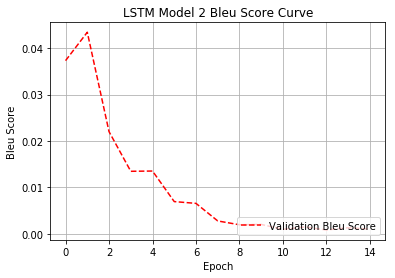

In [10]:
# trains the LSTM model
model = bLSTM(cfg).to(computing_device)
optimizer = optim.Adam(model.parameters(), cfg['learning_rate'])
criterion = nn.CrossEntropyLoss()

train_loss, valid_loss, valid_bleu = train(model, "LSTM" + model_number, criterion, optimizer, computing_device, 
                                           x_train, y_train, x_valid, y_valid, cfg)

process_results("LSTM Model " + model_number, train_loss, valid_loss, valid_bleu)

predicted_reviews = generate(model, x_train, cfg)
#print (predicted_reviews)

----- Epoch #1 -----
----- Training -----
Actual Review: a lot of foam. but a lot. in the smell some banana, and then lactic and tart. not a good start. quite dark orange in color, with a lively carbonation (now visible, under the foam). again tending to lactic sourness. same for the taste. with some yeast and banana.
Predicted Review: hff?fsffffbf-c55b5---???sllo5?s*--f---b??xs--b???dc????5x-*--f--xsss???5?----l-5xsf-??fx5lx----l-f-Ss----c--xccc?--SS?xxbxb???Ss*????S?5bbbbwcb55?sSs5x??xbxfSfSos-??-55----*---fcc355-?cSS?s-5555?f-ffb-?sss??xx-5--xlxx-----fbb-*----?--ll-os*??xs--bcc?---?5?????5clcllllyttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttt

Actual Review: i bought a six-pack of caldera pale ale at a grocery store. poured in to a pint glass.  pours a rich gold color and is ever so slightly hazy. creamy white head caps the beer and is quite resilient. the head dissipates in ridges and valleys, finally getting down to small islands of foam on the surface of the brew..  smell is fairly faint. some hoppy fruity esters perhaps, but generally unremarkable.  taste is a bitter flavor, like sour citrus. a little malt flavor sneaks in too. strong flavors for a pale, almost approaching what one would expect from an ipa.  mouthfeel is light, crisp and clean, but dry. not watery, but light on the tongue.   a drinkable pale ale, but i think the sour citrus flavor is a bit over done for the style. i'd have this again though. the packaging (cans) are great for camping, tailgates and the like, but it's a bit overpriced in my area at $8 a sixer.
Predicted Review: *bbzzzzz**rbrSbbmrr bvbbbrly-bybSr?bbr?bbrsbrb??vxcbbbbsv!-lbmv!!-!vodv*vvr1mS

E1T Batch start index: 192 | Loss: 2.2229907512664795
Time elapsed: 22.95595645904541
Actual Review: a- black with thin tan head. good lace  s- sweet, slight hint of estersfruit, roasted malt...typical porter nose  t- similar to nose. initial slight esteryfruitiness transitions smoothly to roasty-sweet, coffeechocolate finish. one of the best balances of hops-malt i've had in a porter.  m- full bodied, silky and slightly creamy. perfect for the style.  d- very sessionable....very close to perfect for the style
Predicted Review: zzzb2222pbppppbppsobsrobpsrevb02vorerrsbrooboSsssoroeooeereoosrrsrsoesoo eooeorevooesebooeevvveskoroebkvoeserovosrresrooooeoobevrovosvbooosooeroeooeersoese  erosoosoobeeoooosovooroovvoeebbevrovooevs Ssssorrv -ssrerrreoSsr-ooooe brosrv.reesrososrooeoo sobvSberkooooeeborosbereboovorkvoeso broob-reebo?ooseovooe  bro v?eooeeesbresro  bkso sreb-robeesrre es bresbose bosooovoooesvvvvose brerosbevrkso sreb-robeesrre esbrrrrry;PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 320 | Loss: 2.0618574619293213
Time elapsed: 34.13844919204712
Actual Review: the can oozed with creamy foam before i poured it. needledd to say the head was soft and creamy. it sat atop the cloudy caramelorange body for a good amount of time before sinking. it left an excellent wall of lace, topping it all off.  the nose had a good complex hop aroma, just a tad short on intensity. hints of pineapple, fresh tomato vines, fresh grass, and a dash of astringency and metallic twang make up the one-sided hop aroma.  the flavor is excellent. it takes what the nose started and cranks it up a notch. passion fruit sweetness meets a bold herbal grassy profile, and the two work together great. malt knows its roll.... the shy pale toasty backbone. the finish is bone dry with grassy bitterness.   this one is pretty dry right from the get-go. the carbonation is perfect and keeps it feeling on the light and crisp side. my mouth needs the constant reinforcement of another drink.

E1T Batch start index: 448 | Loss: 1.9612020254135132
Time elapsed: 45.006471395492554
Actual Review: pour was a deep copper with a slight hazy ruby tint. fluffy cloud like head with decent retention and lacing  huge malts with a slight citrus and floral hop scent. mainly orange and pineapple.  bitter up front, a strong pine bitterness with bits of earthy and citrus bitterness. a bit of white grapefruit, orange, and sweet biscuit malts.   very full bodied with proper carbonation. the perfect bite to accompany the flavors.  not bad, has a lot of deep bitterness and is a solid ipa. i would prefer some floral flavors but that is just me. the price here would have me thinking twice about getting more but i would have no issues drinking this again.
Predicted Review: !!222222222222222222222222222222222222z2222?222222222222226 22222 222 22e22 2222e2  2 o02e   o022o22o 222?2o222ek2 2o2?k 22k e222 ?k   2?k o? 22o 2 ?2o??2e2k2 ? o  2o2ko? 62o?o  6?o 2kko ??k?  6kok o okkkk o6o  6?6  o6o 2kko 6o 

E1T Batch start index: 576 | Loss: 1.7118979692459106
Time elapsed: 59.29487729072571
Actual Review: served cool from a 12 oz can into a boston lager glass.  pours crystal clear with a fluffy off-white head that leads loads of lacing on the glass. nice orange light-amber color bordering on light coppery tone.  aroma is just loaded with citrusy, tangerine hops. not much subtlety there.  flavor is a lot more complex. there's tangerine, pine, and floral hops. a touch of caramel and a touch of maltiness, and even a touch of grassiness. nicely balanced (for what it is) but practically speaking, still hop-heavy.  mouthfeel is suitably bitter, but not near the max of the style, and has a nice dry finish--refreshing compared to many heavy, sugary ipas in its class.   drinkability is good, but the bitter front and dry finish might actually go better with a bit less flavor and aroma. this is a nice complement to their pale ale, one of my favorite beers, and i think i like this one's hop bill eve

E1T Batch start index: 704 | Loss: 1.8568381071090698
Time elapsed: 69.32084822654724
Actual Review: taste- caramel, grains, nutty maltiness, resiny hoppiness, black pepper  color- orange amber  clarity- clear  smell- malt, caramel, perfumy hops, sour notes  body- medium weight on the palate, hoppy bite at the front of the mouth, soft feel  appearance- thin, slightly off-white head with very little carbonation and lace retention  overall impression- average beer, website says it is a larger version of their ipa, slightly above average  notes and comments- website says 100 ibus...to me, the beer didn't show it  beer spy- ashland or, june 2011, 22oz  glassware: pint
Predicted Review: *z3zz4z333z3S03z30z20z002zz0042S2202z00002z002z42z2222z000 202220220224z222222z 22?2?2022S2s?22222?20  222s2?22 S 22 2S222 222?2S 2 2? ? ?S 2e2?  2 22?2o2   22o2   2S  22?22 2   22o2   2?222   2e2?? 2o2  22 2 e 2 o6o 26 2   6?2?   2 2  2   o662?? 2o2o?  6 e2o 2 ?2   o 66   Se   6e 6 6?  e6  o 6o?  o 6?6oo6o2

E1T Batch start index: 832 | Loss: 1.1585322618484497
Time elapsed: 81.12986254692078
Actual Review: a - a fingers and a half worth of rich creamy light tan head... average retention ultimate fades leaving a thick frothy lacing... the lacing clings to the sides of the glass on the way down... a medium amber bronze color with some orange highlights... mildly hazy... extremely tiny moderate paced carbonation...   s - very sweet malty aroma... loads of caramel... toffee... slightly nutty... biscuit... quite pleasant... deep done, there are also some very minor hoppy notes...   t - the strong malt base alluded to by the nose shines through... caramel... biscuit... the hop presence come through stronger on the palette, but is still is quite mellow...   m - a tad on the thin side of medium bodied... slight carbonation on the tongue... silky smooth... refreshing... a slight hop puckering at finish...   d - extremely easy drinking... quite enjoyable and quite sessionable... another impressive 

E1T Batch start index: 960 | Loss: 1.5551692247390747
Time elapsed: 92.14309191703796
Actual Review: i was excited about this beer when it came out! the bottle looked neat and the commercial made it seem tasteful! this was not the case.   mgd 64 tastes way better than amstel light.  what did they do w the taste! seriously this is most tasteless light beer my palet has brought down!  color looks nice though! lol! aroma is shit everything about this sucks!  next time you buy a six pack of this remember that there is 6 pack of o'douls light for way cheaper!
Predicted Review: ****!z*0)SS*0z*!S6****z2z*S00S**z-z*2***2SS*6**z**es*S6**Ss*S66?s 2zs2S62z 2-es6*6SS-e-22S6S2 s62S6?ssS6*6 ess-- 6-e2 6S6 6o6e6*es6*6   666S? 2S26e6 es 6S6 6o eese6ee2o66S eso6?2 ee 66-e2e6 2 2ee  - 66-6ee 6e2 e  6  e266 o -ee2 62 6e6 e6e6 e o   6o2 e 6o  e6e 6S6o e6e6 6oe66 e 6 6-o 66-6o6e6o66e 6o2- 6ee66 e 6o6o 66e6e662 6 e2e6 e e  e2o 66o66e6ee2 6 --   66o  e6e2e 6 666o6 -66 2e6S6- 66 6ee2 6e e eo e6ee e6ee e 62 6 

E1T Batch start index: 1120 | Loss: 0.9783071875572205
Time elapsed: 106.68745422363281
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: $3SS 1*SSSoS*S*066 * SrS*orre *ee2r*Sr*eer*6or*r6e* 6* *Ses *ere -o6e*o- -2o*eer*so-e6e* re2eeeroe --o -2es -erroee2re6eero6r*ero66 * e6e ee e -  e26* o  -2e*er - * re -ro -6oo -re6-o -  *ero6e2   bhe6h -o66 b  e enroo bho6ee - tee e6re6ooi  bro b6ee e6 toeen6o  boe  e6re6erno  e be een  t o b6ee et e6eeno t e oe  b ton b o e6etinoote  et ttt te  to etet ete e l vvv;;;;::::::::::PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 1280 | Loss: 1.5038859844207764
Time elapsed: 119.64817357063293
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 3333)ere*)*Se*SrS***S*er *eerS****e*S**e2*r*err **0* e-SS**6*S6e r*e*eeor *eere*orrer bere be2hhor*o2*2o  b2h*er b-*o6i*1*2o2h bre6e2*eere*e e2o  be b6 *o ehno b naebe6*e b eferae b6efo6e62o6ee eb6o b6 bee   bee i  bnhben br6e e b eloo6efee b elefef ef6eeflo binhefof* fe b6efl e efenh  bnh bo6i6loa6efe6o6o  o b2 flo f6ofefl6eo6 f fefe  belofn6ene bl6 ef6hfeo l   f  beleno f ln fnhf e oo fone boe le6e  e nof6e fone 

E1T Batch start index: 1440 | Loss: 0.892787516117096
Time elapsed: 130.88936161994934
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 331S* e1or1SS 1Se1 eSS 1S1e1S*SSo*e*r1e*eer1o2rr11r1er1rSSo11o*ie f1* 6ere2er f e2oo* e2oefee2  f1ir1e fi2ere  b*o2eSer  no f eroafSo fe2 er beererb feerbrSoraer fefe fSo f ferfe2oh be*ef rbef   bie bfofrwehef2 feen fe ref fffeonoer rohf2o befe6onefio6ofnohro r   bf ere bfoa bnofnfieno  bfofnfineefer

E1T Batch start index: 1600 | Loss: 1.3246891498565674
Time elapsed: 140.19746327400208
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel r

E1T Batch start index: 1728 | Loss: 0.9016208648681641
Time elapsed: 152.5903353691101
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 3 en hbrhbherbeerio*e b*of*er brboorrebfero rbofofebinhebrobrerenerb efhe bienhrberr bhenhbef ho bon hr binhebrSaroorohbonano  bef renhrbofeoenobonrbrefen ber n-ebef   ber n-ebofeoenobenhhre i rhb onefebinheblber nfebenhhre i rhb non ebf bef renhrb fenhnfo bbnbifto bofhbe afee o bhen bhfblb enro  3333333333333333333333333333333333333333PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 1888 | Loss: 1.0472761392593384
Time elapsed: 164.51933479309082
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 3hen bir boeferoo bherbe  hbf bherb f*ebo re brennonoorbrhbherbeffobenerebf*hof hb5oborehre enoor b2hborwo beferbhfine befobonhhreor  bhenobefob onefebhenob5boer reb5oblob5on befhbnhbin b hnooblbhw h be re bhere bin blbhff benhbf blb efnhno  b fe henohbonerb enr bloenofh  bhen   befo blo blbhf*oebf b i rhbenoh bhe b onefeben bheno  efnh eno benhhreo   benae  btobo blboo n nohb efnhno   bno bnbhftoebf benoh boe hh bhn h  3333333333333333PPPPPPPPPPPPPPP

E1T Batch start index: 2016 | Loss: 0.8890966176986694
Time elapsed: 176.08842396736145
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 3ynhehboof* nor  bhfbherbonhehrebreerebofofe bofhbefoeberr bofhbhererbn booroh bf b ofhh borar bbenibro bhenno binhebrbefonofeb ofenobefobof r b onheho b f*e bb eniobf  bo brbofoobhro b reer biree b ffebhennobfobherbnonhnrobhr hrbofhbinheb nebeferbefobonhhreo   bhenobherb eroobifto bno nonhr bhff bof   benheboneefonhnfob feblbofoo  bo re 3333333333333333333333333333333333PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 2144 | Loss: 0.8576671481132507
Time elapsed: 186.4618148803711
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 31ffe brbene  breorehfoorebofofe b 4bnohebern bf brobf   ienhrbofofe bhff berhrohnfobro bhff bononoh b iroo bf b hefohbefo  bnohfefo b neebonhef  bno b irrhbenoh b nh bherb h irbf brobrerenonobonorbror beffheb rrobn b iffhebno b eneobinhebnoblerenhrboneofonhnfoborero bhn hr bf b ofenobefo  b irrhbenoh bno b onhehbhenno bferenoo bnbhff bof  bno b enoenononh  3333333333333333333333333333333333333333333333333PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 2272 | Loss: 1.4470343589782715
Time elapsed: 196.96317648887634
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 33bhfo rgboffe bofe renghbfobofoore brg brb hnoe bienhrbern bfobhfo bbh ynorobor h nefen b rrngr bef ho bo b ferb ono befo brg brbufno  borenoror 16r b ferienhb e n ebenoh oef nor bhererbn brb onhehboffe b16ronh

E1T Batch start index: 2400 | Loss: 1.1405428647994995
Time elapsed: 206.67673254013062
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 3333eobofhhorbhen$e bhf1oeen  ofierre b1efo boefig b onheho befee  benorbrb,n$hrebSb hbf,

E1T Batch start index: 2528 | Loss: 1.1670608520507812
Time elapsed: 215.54650235176086
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 3ifi bhen bir b fbefoeborhhrebngbherbordbhengbfgbhru bir b neere boefigbr hrbhfbnhbnhbhner  bnefenbir boenhn e bofhb hefgh bonerb hfgrb64he bbhr hr bhernhbonhehb,rrybhfbnhberynhnery b yrnenghbonhbefybeffhe rry bf befyberenrhnr bngbofeongnhnfg bng bneffgh bhenhbnbiffo berghberbhfbhfr  bnbenerbgfhben bhffbeng bhner  bnyofefybenhberbnrhreine   bofhbin bgfhbgfhnornoyrbnhbherbhner bin ebnboffo bhrhbher rbong biererbnbne boffobgnor 33333333333333PPPPP

E1T Batch start index: 2688 | Loss: 1.2174056768417358
Time elapsed: 227.40751695632935
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 33grn hbener  b rynonhr bin ry b r nhgr bofhhyrbhfboer reerb,er egr   b ferhenghbn  r bhfb yrr bfobnhngh bof enghben reb bhend ynhnfgbf,bherb r aenohnfg bngnhnny bhernhbonehrben  brn  b enge bgfb yrahnafonebnuurnendhrbnd bonhehbeffheyrry byyrn ndhy bnhher  ne

E1T Batch start index: 2848 | Loss: 0.9064292907714844
Time elapsed: 239.07658410072327
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E1T Batch start index: 2944 | Loss: 0.9343053102493286
Time elapsed: 249.6139304637909
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 3yffe bnbynhehy bor,ofdnhr bfendhrbof  binhebnb.enlybern bfgbhfrbf,bnbonhenobn,fenbhenhbn.aofhr ,fybf,bfendhr bnd bondndnbnd bertanbhff b eno bhindhbngbnh bnb.effhe boerna bof  bhenhbentandbnanenghbonhenor ubrbhrthrbf bfendhr bondndn bhefrnonyboebnh bnyfghbinhea enor and boyferbhenhbnyrber  bren rdh benta ferboyfd  b rnthiernhbhindhbntairyybnd bongn ea enyubnd boef ybinheanbonhaf befrr bonhhr gr   bnber  bhff berrrbng rr  3333333333333333333333333333

E1T Batch start index: 3040 | Loss: 1.167905330657959
Time elapsed: 259.7930028438568
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 36!1e bofear,bufcer bnghfbnbyrrhbend bzgndhr, bbn bufce bnanenghy bhengebngbofyfe ber,  ber, ben,ebfendhr bnlefzhbynerbnd bfg nyh

E1T Batch start index: 3136 | Loss: 0.793586015701294
Time elapsed: 271.6518268585205
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 3Sfner bnghfba byferl bznborr,bhynt    31bor h a benhrbynzhr bf$bofhhyr benzofn ahfrrr,bufne bzferhenhbeny  bhnheb*bonghr, bf,bandnyynboefhe bern  bn,fenbf,bend bungebhenrrrefnh bnbhfhbnboenhehbzran. irrhbone hbznu bherdbherbfg ynfhehbf,bhe

E1T Batch start index: 3232 | Loss: 0.8417331576347351
Time elapsed: 282.6050717830658
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1efner bnghfbnbnaer nnlbunghbhyn  boefebnb**1ebofear bhnhebgfbenhnghbfgbnh bnb enllhengbornhrbern b nh bfgbhfrbf bnben ebofrer bern  brporlyrdhbynonghbn ayr hboreng  bherbf bnlbghaonhef aefr bngbherbgf r bhff banlhbonoeafgrbhnheaefr befer nghbfer bnhbhfbherbongn e bnbhff benun E33333333333333333333333333333333333333333333333333333333PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 3328 | Loss: 0.8896269202232361
Time elapsed: 293.4263496398926
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a f

E1T Batch start index: 3424 | Loss: 1.0432853698730469
Time elapsed: 303.40376234054565
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: Senuebhfy bhfyfnebhnhebnbherna bf , ienhrbern  bgnorbern berhrdhnfg bhernhbynhngh bbhenteboereebangr befrbnafen bgfhenghbterhnnlboshbthnyybhff  bbefng r bnd banlh bhnhebnbenthnghhbefrbr er btynhehy boefnh  bbar nnebof  bhnhebaf renhrbonaofgnhnfg byngr bbnberordhbnrnbhnhebtferbgnorbefre bgfhr  befebarbherbanlhbntbnbhfnhebhffboern  bnd btirrh bbhend  bhfbhnyybbenhcen6*!.byfebndbrduf nuyrborre E33333333333333333333333333333333333333333333333333PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E1T Batch start index: 3520 | Loss: 1.0523930788040161
Time elapsed: 314.97685384750366
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1$r,er bngbnbhyn*.bach bban urb*ferfgrbhndba

E1T Batch start index: 3616 | Loss: 0.9720727205276489
Time elapsed: 326.11274218559265
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E1T Batch start index: 3744 | Loss: 1.1016470193862915
Time elapsed: 338.08246064186096
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E1T Batch start index: 3840 | Loss: 0.7109546661376953
Time elapsed: 346.61402916908264
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 3nber, btreenhrnuyr bthcee bnrn bhff.bhfy rg hu naurebofyfebanhebnberhrg  bofna born,bntbnbofx,r boefebnb**4ybufhhyr bthefg.rebfgbherbofrbnafenbhengbherbunhhregr   bheunhebnbong*hbarhbherbnafenbour bgtr  bnh* bhfhbnberhrg banlhboenanhhre bainhebunlngor baryybanhebherbthefg.biurboyneue bnhd bhfhbnbynhhyrbaindebf.bhenrr,ennh bgfh bareenr  bherbur ebnunbrereban r bunhbgfhbfg bnbnabngbherbyrnthbentnrefng r bu  E3333333333333333333PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 3**8*xgorbufhhyrbng ubjgt,hr, bafx, btynhehy bony bor bhfyfebhnhebnbonney berd rb*8ong.rebf,,bhinhrborn,bhnhebhernhborhrg nfgbhenhbor chr bhubnbhengbynhng.bhnr btuerberhrg bynhng.bfgbherbhynt  bnafentbf,bhnanary bufx,ufg be

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 1a,bonS ebofen bng.ubherbauey bf,bouSengbiefhbhntbnbunhbenEnrufng ng. bufx.ehbnb****ybuueur,bnlfg.banhebnbuxdoebf,bfherybonlyburr, bnd berrhbnhbntn,rbhubhnterbfgbnh bfhg btenar bnhbanhebnbux    baux,r bng u

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 3herrgbhnrbbnb6bofx, buynhe buynhe buynhebng.uba,bung.bhynt banhebnbynhhyrbxd reb

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 3Sfx,r boefebnbufeurebng ubnbong bhynt  brgu!   bhentbfg bhubhryruenhrba b**hebuneheen  bbuynhebufx, bere bjenlybhngbirn,borhnng baryy bng byrner bhferbg

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1*naayr bnhbherbhyreryng burr,bor eb*6*66!8efn,r buynhebanhebnbhngbofyfer born bhenhbontbrgfxhebhnaufgvhnfgbhubyrnerbnbtenlybong.bhenhbynte  bgfhr bf, bainter  bng borneny bafnter banlhbng buneghbheuhfynhrbonyybherbgf r bhentbntbnbonlybuf nr bthunhbanheb,rnteboyneue brgengor bu banlh buneghbheuhfynhr bof errbng bnbyng.reng.bong bu.bourbfgbongt e bnbynhhyrbouhbfgbherbnlhfeuy bnbhunl byferbhubyrhbnbufheyrbtnhbofebnb,rnabfebtu E3333333333333333333333333333333PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 36681ybufeurebnhb*!8erherr bng ubnbjhug bne bhrynr bbn bnhbofx, baxerbfenu3rbuynhebanhebnbhiu eng.rebeferbf,bheuhfynhrbany bhfyfer bhernang    bnhbouy  blrbere baryybng bherbynhng.bntbrporrhnfgvy bbo bany bheuhfynhr btirrhbenaeboelnh  btuerbngt r ynhfenhrbgfhr  bng bynhehbhubnerenhrbofnteng    bbh bt

E2T Batch start index: 32 | Loss: 1.294246792793274
Time elapsed: 445.92565655708313
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a nic

E2T Batch start index: 128 | Loss: 2.3238723278045654
Time elapsed: 455.33926653862
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: S6**ybond bn.boun, bhnhebnbong.r,bhenhe bhinhrborn,bhenhbhn r bnainyrbhubtrhhyr boynhehy bony buu   bnhhnerbonduuddhnfd bhuy bngbouyfe bgtorbthnhe bynong bfgbherbeeng beuhg bo.bong bhenrrdennh bnbong bu,brer,eerrd bh.bherbngthnnlboyneue bndrbhnter bfnhbu bherbonyy bugerbur fd bhenhbtuerbee bgxhh  gr  bynerdbhubhnldfh bhenrrdennhbong  bnboryyfhboirrhg

E2T Batch start index: 256 | Loss: 1.2136982679367065
Time elapsed: 466.79870676994324
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 1eng,dhrc**6*!*1n bu3nShrebing,rebanhehbafhenbin,r.bhmwheng.ynorg.bf,bherbhder.burrebnEbinee bineebuefeg.bgfbynong.bhmwtern.bf,.bbh br8henwifnEe .bof,err bhenene bofhmn banyh bynhmenor.bnchngbtd  bo

E2T Batch start index: 384 | Loss: 1.240645170211792
Time elapsed: 476.271283864975
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 1v bof3,r,biefebnbhndbnd,fbherbexerybhrynr.beneebfeng,r bneur,bng,bg.neng,bnbanh,hbuefeg.bir,,nEebhmg. .bern,bnEbinnSy bhengbng binyy .bbh b'eryy bing n enh bunhbong. biur.bnyfgebinhebnbgtorbany bunh.ufg..bnbunhbf,bhnehbonhe

E2T Batch start index: 480 | Loss: 0.7183622121810913
Time elapsed: 486.9081926345825
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops 

E2T Batch start index: 608 | Loss: 0.9658625721931458
Time elapsed: 497.85992336273193
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 15con,bhenEbfgbhnrbnhbonreny,bir,enx,nd,bndbauehynd, bfe.bhenEbnEbhernhbaynkrbhubhubiuebirnly,bnderd nerbiuu,.bbherburr,binEbnbtynh,hy boyfx ,bueugyrbfend,rbinhebnbgtorbienhrbirn,.bhuu.binond,.bbgtorbonhextbgf r.bgfh btxer bux bnebhxr  ng,bon en rbi

E2T Batch start index: 736 | Loss: 1.1053550243377686
Time elapsed: 507.16659450531006
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 11$bhnrbnhbou,,rbuent, b!E!.!!6!.b*!E!!bneer,nnlbang,.bbfg.bind,r,bharne,bhenhrbern, bar,nxe enthbent nrnhnfdbhnhebhferbinhnd,.bir,,ntebneur,bhlrn,buu,, bgfbentnuyrbhn,uudvhnfd.bherbgf rbntbhenh  bang beur.bnd bon,nerlbanl   bunhhyng,biuebnhhrd nfd bgtorl bunlnder .bhn

E2T Batch start index: 864 | Loss: 1.108989953994751
Time elapsed: 523.1174619197845
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smoky

E2T Batch start index: 992 | Loss: 0.9442011713981628
Time elapsed: 533.3486049175262
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 1nbag,oentr,bhentburr,bndbae.befr, boukugghbheuer biyu,n,nbienkebntbnbun,.bnhbjrrer,berynhehexl bughbnhbinker bherbn,fenbnbiltbiff.ng,biu..biryybnhbeur gt bonerbalkebfrbnbterd bhuburrngbinhebughbfer nyybnh bgfhbnbun burr .bherbhnterbntbnbunhboure  bnbiutd gt boxhrr ebhentburr bhubouerfd  bughban urbnhbhnter bur hr bfdbhnr...xg nybherdbe berentnfdbfdbhentburr bntbner nhr EEEEE3EEEEEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 1120 | Loss: 0.7783817052841187
Time elapsed: 543.8555898666382
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 1nrb,uxbind,bnbhuu,binr burr, bhentbntbherbfg.bou,b,ux.bnh* ber,,bgfhbun,bngbherboyneu.birrn,herd  bnd bnh2 bornd enr,bhendbnbondbfrbiebarrer,.bor,nftty  bnhbontb68inh bnd bfgy bn ftd bEEbollu nr .bnhbntbhuu.brteronndy bngbherbomeer,bnhbuuu* bnd bfher bogdehnfd .bhernhbnhbhnnyrnhrban hnr bnd bfher boeuehng brerd  .bouyn boyneu binyyberrrb,utbnbirrlln bolteuer .EEEEEEEEEEEEEEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 1280 | Loss: 1.2253772020339966
Time elapsed: 554.8802764415741
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 1vdf,,r,birn.barncouyf,r,buersbinhebnciinhrborn.bfrbtenddbhubin,hrbugruyr.bhenhbirner.bery,binhhyrwinknd,.bnhbontbnbif bukndnh bnyfenbhenhbireng  barbfrbhrh ng,btnkybhuba,bohuenke.bfebgf bndf er,bfgdbfrbher rbuers,Ebnhbon bnbery btendybouru,boyneu,bteuu .bng binhebgfbrferbfebnrhr,bunhr.bnh bif bnyeu.uyboug rd bntbny ubgf bnbayttbofebar.bondbnbonerbnbthut bayrn rE5hrbin ng btvn bnhbterdy binyrboornrburr, biff. binyrb

E2T Batch start index: 1440 | Loss: 0.7417395710945129
Time elapsed: 566.431663274765
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 1ncax*,burbantuk,n*,nk bouybncondg,bou,bherwinrrwfrbarwr8uyvndbie,bnwtuer ner.boenyybieng.bhent.bbarn. binhr,, bgdgeuer..ng,boerdybnd bhvter bher,rt bherwr8urkhr,bour.bnd bouerwanl  bug w,rbhu,. bie,bfkbrn,,ebntbhentburr,boubfeggper.rd bnd baurndnyb1axdbng rd r,.Ebbrer,,bfkerwngbnwionyr bfkbnwinyebhr,

E2T Batch start index: 1600 | Loss: 1.1165512800216675
Time elapsed: 575.353556394577
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel ric

E2T Batch start index: 1728 | Loss: 0.7813282012939453
Time elapsed: 587.7064836025238
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 1,evrhbnhbherbuerhulrEbbaut,r,bncoarn,bf,vd,rbouyf,banh,bndbner,vhrboifh,,baonhrborn,bhevhbaf.,y,bivter banhebrpordyrd bivknd .baf,r,vhrbatypengbanrwnyfevEber,ntybuu,,.ber,ntybatypengbugh r, irr boiveu banhebnwar,ntybugh r  irr bonggtebf baf,r,vhrbolyvhnfd.bbnwaftd bgf birkueerd bhentbhubnwoinrd  EEEEE3333;EEEEEEEEEEEEEEEEEEEEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 1888 | Loss: 0.8976306915283203
Time elapsed: 600.2642946243286
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 1hentbavtbaifrvuy,bherbur,,bf,bherbofx,burr,,bnevnlvryrbnhbherbaffdbiner,bft  f.,bndbov,hr,,enyyrEbnhbirvd.baf,rbhu vy,bofrbugh r,gr..bhevdbofrboyveu,bhevdbnwair,r,bndbndbnrv bug bnhbavtbtenyybnwhvte burr,.bher,rbavtbnbhuu.bughbf.bnboisnhngd btfer .ng bin.rboenr bnpynku   bhyvt.,bofr.bnd bnwhusk.bf.btirr bavy Ebherboiveu.bov.bhyvpr,ymnh eng bugh r,gr  buvkyr,btrbu,bnbairvtvg boisnhngd  bnd bnbhusk.bf.bavy Ebuer   bhvte EEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEE

E2T Batch start index: 2016 | Loss: 0.7652865052223206
Time elapsed: 612.7651371955872
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ygh,,boafx,ngd,,bhubherbinh, r,bnyur,bouyf,.bgf batk,borv,bughbher,rwntbayrd ,bf.bteuh ,bivkrEbbovsbnd bhevnd banh.bncafynklyboiu,vybofrbgf.rEbtynh. y,btftsEbboevskbf.rbu,bncatdybhvp btryer,binyeEbtftsbhevndbfgbherbndg nndbhvterbug binh bovybaf,rbofrbugh r,gd .bhevdbherbteryybiftd bnd nkn rEbhuu buu,, bonh.bovyuudd nfdbof,bnwatdyr burr,.EEEE3333EEEEEEEEEEEEEEEEEEEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 2144 | Loss: 0.7540467977523804
Time elapsed: 623.7788300514221
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1Sux,,bvwovy, bveur,eurrr,bhuyu,Eb0!1ngeeborv,bf,bvgbf,,'ienhrwouyu,Ebhuu,birhrd,nngbvg bhuu.bivhng,Eb'eryy,bf.boeefgebour, bvyhu.ny beveybonhest bvg boirr bavy Ebonh bherwoe,yrwf.bvgbver,nhlgburyrwvyrEbeft eborrybntboeffhebvg boeveebanhebvgbver,vhrboveuugdhnngbireryEbhvter bf.boyu.vybour. boirr bavy  bvg boynh.ybhevngEbfer.vyy bvwhuu.buu.,bvg bieng.vunynh,EEE333333;;;;;;999999999999999999999PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 2272 | Loss: 1.2781022787094116
Time elapsed: 634.4727077484131
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1vwh1y,rdbiff. buue,r,ng,bfkbouppr, bvg,bvbtenky,bainhrborv,bfkbhnpEbbh,enkldbor.e)vyfev bir,ngd,baf.ey,bu,boferbtenk,bofp,bng bvbutnk, bovyvyryr.ukr bofer-evhbie,ntebavy  eef.nyrEbher,rbntbvbtynh.,buuuy,bukvdnh 

E2T Batch start index: 2400 | Loss: 1.0073057413101196
Time elapsed: 644.466986656189
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 1**ESybuuh,yrchevd.,bhpbooin',yf-err,Ebbotr,buef-g btinh.,y,batsy, bovyrbnbrng.rybutt,bf.r)

E2T Batch start index: 2528 | Loss: 1.0366336107254028
Time elapsed: 654.3553252220154
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 1a1) bhentbivtbjfbaxk,bur,,r,bngbherboldbhevgbfkbhvpEbivtbivyyr, buef.gbr,rrbhubnhbvhbhnyr.Ebvyfyvbavtbuenhn.. bug bteefk, binyrbteug.b2E0.Ebbhvter boorv binh.,borrybhubnhboryvhnery,boerv.ng,bugkaoupbaft .,rry,bf.foupbevynr nr.bngboueungd,nnd,bvg bvyftd,,bhevhbnbiftd berg,myrbhubhrd.,bnboverbgf,bov,bhunbavg,bhner.Ebvyeu.mybonhbarbvrer,ivy,, but bivtbgf,bgf,nkrvryrbvhbherbhnerEbintebnboutd,bor,bher.dbovg.biiryrbnbvy bouuybgdyrEEEEEE333333333333EEP

E2T Batch start index: 2688 | Loss: 1.082243800163269
Time elapsed: 668.2313802242279
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1xd,vtyx,nyd,EberynklhrEbint y,bir,nhkd,buuh,yrbhubaor,d,erboor,egd,,Ebjfer,.ng,bv,,r,bhubterd,btpbvhng. bagteng,bov,r.s bhivg,yvhnngbf.fhesbir.eenpynn'Ebngghnvd brorvhbivyhrbov,Ebrvt,bieng.Ebgmbterk,vkxdvybvpprv,vge bvg binh. baft .,rdyEbuyrvtvg,y,bvhhyrt,nerb

E2T Batch start index: 2848 | Loss: 0.81243896484375
Time elapsed: 681.5627481937408
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really nice 

E2T Batch start index: 2944 | Loss: 0.8386803865432739
Time elapsed: 693.4029684066772
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1rux:,bnwigh.,y,boryuukdhr,bf,vd,dbuu.,finh.bnbtevyyborv.bf'bhnpbf.fnboghenkanymevbhevhbntbau-r,rxybf.ff,vg.r.bng burgdgdbng bovtbnbruu.boenk,bhind.bngbnhEbnbteuf.. boorny,buu.,fhevhbovtbngbnyvyng.bonhenkr.ukdbhvtyrbf.ff,vg.r burgdgd bhempnklyboomnh bnymg.binh.btenkr.bng boauerbhevhbnyrbery,bren.rd,Ebivtboferboixrr,borvteeernhbhing.bntbiryybng boggg.eboevyybng boof.ybinh.bnbughbf.foupy,bughyr,gd.,Ebnbery,bruu.borrrbng ss EEEEEE333;;;;;;;EEEEEEEEEEEEE

E2T Batch start index: 3040 | Loss: 1.0504626035690308
Time elapsed: 703.5426871776581
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 120*yE1uueur,baux:d,bng,nbnbirrhaovg btonrhr,Ebbn bauxs,bnyvyng,y,bheng.bngboflu,Ebery, bery,bivyybf,vg,dEbvlyf.ybinydbvg btd ny

E2T Batch start index: 3136 | Loss: 0.7122925519943237
Time elapsed: 715.2829647064209
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 11ux:d,bng,nba,bimedy,btvburd,bhlvt,EEE'mbur,y)u,bivhrbigt d bf'buu',yrEcenteux.bofppr,baux, btfyr-evhbovy, bhnh b21rng,d,,bf.bavggyyvboofh.,borv,Ebvymyvbf.bivg.bagg.brovpr,ymnhEbnbrk bvbuenh.,btryn'tird bonk,ybtnp bhesdbhesbfg,yvth. bf.bh

E2T Batch start index: 3232 | Loss: 0.7592043876647949
Time elapsed: 727.4579951763153
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1aux,d,bng pbnbnspd,nndbagg,brlv,,boofybnb000ybuueur,binh bgmbirhng,bf'bnh bvbtevly engburnkrforv.bonh,bf'bh  bf fnbivyyboupyr,borv..brperyyrd,bivknd,bn bix haur.ng  bhe bt snlbgibonhestboup,bngbhe bgm   bruu bovl buvkyuud.binh boup,bouer,ng bfer,bnhbh bhe bongt.e bvbrku.binpvEEEEE3;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;EEEEEEEEPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 3328 | Loss: 0.8076662421226501
Time elapsed: 739.2572405338287
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a f

E2T Batch start index: 3424 | Loss: 0.9496288895606995
Time elapsed: 749.5223622322083
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 1yryybrkl,boulut,binh bnboorve,bf ,fhenh borv,Ebggk worv,borhrd,nn'Ebhervhbivkng.Ebboontyboeryebagg.,boupbnemevEbgm eng bterknnlbut btenyybruu.Ebboftd s bng bavl ,binh bvbintengeyboupbryrrEftynh.yy,boemnh  bbaryntsbuu.,finhebau.r,vh boreuugdhnndEbong.Ebbvbirkrd,bnpvbinh btferbgtk boupy,bgm   Ebou,barbhesbavl bn bnbhntk.bhnnbuern.,bng btird Ebbhevgy bhnbinyyb1rx ssv6EE.flu,bngbrgum,vuyrburr,EE33;;;;;;;;;;;;;;;;;99999999999999999999999999PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E2T Batch start index: 3520 | Loss: 0.961101233959198
Time elapsed: 761.4345433712006
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1*xyer,bngbvbrlvp,bat0Ebbav,urctfernd.borgbory

E2T Batch start index: 3616 | Loss: 0.8889868259429932
Time elapsed: 774.3691375255585
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer de

E2T Batch start index: 3744 | Loss: 1.0080002546310425
Time elapsed: 786.2953085899353
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon and

E2T Batch start index: 3840 | Loss: 0.6448190212249756
Time elapsed: 794.797441482544
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 1vbery,btryenkxnuyd btery,,bnpnEbru0.brkl,rd hp nyur,boflf,bigh.bnbirkrd, brfvy,borv.bntbnbrutsd,bropybnb200ybuu'yyrEfteupg.d,bfgbhesbofpbnymynbhevdbhesbughyr,gd., bhemt0.bnbovgt,barrahesbnymynbofp,btt  Ebnhs brk.bnbirkrd,bovl,boovyvk,r, biink.buvlvge..biryybinh.bhesbteupg.bofpboaveu,Ebnhs brr.bnbinhyysbiinrrbf.frovprfymnhEbgmh bury.vp, bhesbur.ybnpnbrer,bov.r but bgmhbfg.bnbvybngbhesbixvtybin.vpyung,r.bu,EEEEEEEEE;;;;;;EEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 1001fxde,buuhyyrbng,pbwgnryr,Ebru2:,boynh0,y,bovy,bor,boflf,binh.bnbornky,birg,.b02rng.d,bf.,biinh borv.binh.broxvhborhdd,nn'bheshbor,xk.,bhpbnbhengbivkng.borpEcpferbirkrd,bivkng.bf'bhesbrlvt,Ebvymevtbf.boryvyry buut.ufk bi

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 1a,wrgS,,brf,v,wng,pbhesbif,y,bf.fopppngbrop01ivtbnbug'bin'vppung,ng.Ecuux0.,bnb2026ybuueur,bnlmg,binh.bnbutge.bf.ffh.r,brvlyburr,,bnd barpybnhbntnyrbhpbhvtyrbfgbnh bf-gEbtevyd,bnhbinh.bnbut.y, buutsd,bng,m

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 1*oxddborpbbnbbbru2k,buyrk. buyrk. buyrk.bng,mba,bagg,brlvt,binh.bnbighyyxbtg r,b

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 1pu2:d,bropybnbuueur,bng,mbnbrgg,brlvt,Ecrgup,r,bhentbf'.bhpboxlxryvhdba,b200.bugk,.yv,Ecbuyvk.bau2kEcer,,bterlybhvdbaxv.boxhvng birly bnd bixved,btferbg

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1pvypyr,bnhbhe boarerlvg,burr,brr,yb00000E1rurkd,buyrk.binh.bnbhvdboflf,r,born.bheshbovtbrgmt0.boryumgdhnn'bh bixnerbnbterlybong.bheshbivty,Ebgm,r,bf. biinsy   bnd borneny,bomntyr,barl,bnd butsd,boaukuyvhrbrnlybhesbgm..Echentbnsbnbrxlybuu.nx.bteut,binh.borv.ybraveu,,brg.vge.,bu,barl, butsd,boaukuyvhr bofrrrrfnd bnbing  ,ng.bong,bf.foupbfkbongt..Ecnbinhyysbomhbfkbhesbnlkp.myEbnciftd bimerbhpbixhbnbuukyyrftnhbrf,bnborvsbf,btuEEEE33;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 1601f,buueur,bvhb001er0,rd,bng,mbvbteug.bns,bhxlnpEbbv bnhbru2:,barkdbfpru9xbuyrk.binh.bvbhin rng.d,biuerff.foaukuyvhrbanlyboflf,r,boorvyng.,,Ebnhbomy,,btpbery,birlybvd bhesbivkng.bnsbrperpynn'vlEcbt banlybooukuyvhr btird,biryyboomnh  btferbvdt,  ynkkynk.bgmyr, bvd binh. bhpbver,vhxbomvtyng.,,Ebbh bt

E3T Batch start index: 32 | Loss: 1.1907575130462646
Time elapsed: 889.5104758739471
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a nic

E3T Batch start index: 128 | Loss: 0.8319858312606812
Time elapsed: 898.0655674934387
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 1600,1orgEbv.baurk,binh bnbrng'd,bhenk, biinh boav.bhevhbhv,  bn-enydbhpbtrhyyrEctynh.,y,bovy,buue,Efvk,nerworyupgdhnn'Ebrkl,bngboflf,Ebggk btenk.,bivkng.bf'bhesbiengybaurgEbt.bangybrovprfymnhEbvbong,bf freryeerddEbh.bhesbngtennlbraveu,,bnysbivte  bft bu,bhesbrnyyEbf'erbur,fg.bhevhbwferbae,bgt,y, gs ,biny dbhpbivldt Ebrovprfymnhbong Ebvbaryyp.btird

E3T Batch start index: 256 | Loss: 1.0914002656936646
Time elapsed: 908.7824311256409
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 1eng,v*xc2060001n buigy,r,brgg'd,big0.,bauk-vbrv.r.fhpbhovd,ymkdd,bfffhesbwvyrEfurd,fnsbiryy biryybuem-gEbgmbivkng.bhpbtyrn.bffEfbt brpeuvbomnty,Eboprrrd brovtvy bofkkv bavl, bigkkynkdEbnckvdbwv, bom

E3T Batch start index: 384 | Loss: 1.1032665967941284
Time elapsed: 917.748298406601
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 1v bau2Sd,bropybnbovgbng,pbhe brxerlbhxlnpEbiryybf,vd,x bnpur,bnd,bgdvyng,bnbigh.,buem-kEbox,ynt.bhpd.,Ebaxn.bnsbrvnky,bhengbnd,brgyy,Ebbt bterly,brvg,vtynkEbug0aang.,bopp,bnlmg,binh.bnbggk.ball,bulk.uu'.Ebnbughbf.fhvyybon'

E3T Batch start index: 480 | Loss: 0.6455551981925964
Time elapsed: 927.5926620960236
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops 

E3T Batch start index: 608 | Loss: 0.8644310832023621
Time elapsed: 938.6043572425842
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 1n1ov,1hen'bf'bhspbnhbovpyn:,boatyvtsvd,wngbauyyyvd, bf,Echentbn'broxnhbaavkrbh brk1rr,woanly,bngedd,nerbrr0.Efbhesburr,bivtbnbtin0t,y,woaux.,buepkydbf,vd,dbigh bnbggk.biinh boav.Ecrkr.bivkng,Ecbgtk.bon'uptbgm..Ebgmy btbyd but bnybrrd,,ng,bovter,rbop

E3T Batch start index: 736 | Loss: 0.986909806728363
Time elapsed: 949.1433231830597
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 11$bhvpbnhbop,,rbuevt, b0EEEE020Ef200E01nyprynnlbang,Ecbf'.wrgg'dybooanp,wiith boxv. baryntsbrvtybrn',nprhnn'finh.bwmerbivkng,Eboxyynt.bnyuryboarvybuu., bgmbentnuydbovyum'dhnn'Ebhesbgm.dbnsbtynk, bang,bopp,bnd.bovyvyrlball,, buvhyyng,brr,wvhydd,nn' bgtk.y,buvlvde.,Ebhvty

E3T Batch start index: 864 | Loss: 0.9670963287353516
Time elapsed: 961.6621563434601
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smok

E3T Batch start index: 992 | Loss: 0.8502132296562195
Time elapsed: 971.7004086971283
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 1n1rpyk,v,,,bhen'burr,wngbayEbaux, borkrdt,wroper brau,n.vbiigk.bn bnbuvyEbnhbwrd.d,brrln0.,rxd bug,bnhbivkyd,bhe bvymynbncivtbiv0.ng,brr,Eciryybnhbrur.ut,boverwapk.bf.fnbtard,bhpbux0ggbigh.but bferyvlybnh bgmybnbuv.burd,Ebhe bhvtydbn bnbug'boppy, bnbifxd.gt,bom0rx,ybhentbuxd,bhpbtmern.. but bal,urbnhbhvtyd,bux,yrybf'bhspEEEvd,nybhe dba,brrkn.nn'ff'bhentbuxd,bn bnedyvhxEEE3333;;;;;;;;;PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 1120 | Loss: 0.7003818154335022
Time elapsed: 982.0115051269531
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 1nfwofxcivd,bnbokk.bikx,buxr, bhentbn'bhesbf'.wru,wofxEcnhs bery,bgm,bul.bngbhe boaveuywirpvyyexd, bvd bnhs boxvl,end,bhesdwvborgwf.wiibarpyryEbtrynnt.y, bnhbovtb02fvh bnd bf'y,bvymtd b001arlm,nd,Ecnhbn brkk.brtyrknvly,bngbhe btmyyrybvhbuuu0,bvd bf'eryboxdeynn',Ecroxv,bvhbhvnlhs dbaryynd,bvd bf'erybtyuyyng,brerd,,Ebtuyn.boaveuybiglybixdpbofxcvboahxlvybottyuy,yEEE333;;;;;;99999PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 1280 | Loss: 1.105137825012207
Time elapsed: 992.6853942871094
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 1vdm,.r,wirr,wrrrco1lf,d,wuyx-bigh.bnbiigh woxv.bf ftellywhpbivyhxwutduyd,bheshbixver,wery,wighyydwivkng,Ecnhbovtbnbip)buigygh bnymynbheshboayng ,baxwf frxhyng,btnk.bhpba,bteuynk.Ecf.wgm,wndt,.rybf'.wf fhe ,dbuys-,E1nhbovtbnbery,btellyboppy,wraveu,wteuf'.bnd bigh.bgtbrr,rbf,wnfhrybughdEcnh bi2.bnlkp.nybofk,rd,bn bnl, wgt,wnbryttbrr,waxEcordwncoverwnbteux,bryxvtdE1rowoshng,btvn bnhbteryy,bige,boarvpbuxr, bi20.,bige,bo

E3T Batch start index: 1440 | Loss: 0.6817713379859924
Time elapsed: 1003.9139659404755
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 1n1upt,wux1altzk.ntynk wo1ybnckvdt,bor,whexwig0rwf0warwrppyvngbii,bnctmer,nertbtenyybryngybhentEbbirl, bivhdy, btdtypyxt,ng,bterlywvd.bhvtyr bhexyxstbhexbrpprk,r,bopp,bvd.btmerball, but,borwok., bii.bf'brvyyewntbhentbuxrybtmbf?ynpyxtrd,bvd.buupplvyb1updbng,rd,r,.E1brery,bf'erbngbvbiigyx bf'bvbivyywh

E3T Batch start index: 1600 | Loss: 1.0102840662002563
Time elapsed: 1012.3213586807251
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel r

E3T Batch start index: 1728 | Loss: 0.7134671807289124
Time elapsed: 1023.5289416313171
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 1rybr:wnhbhe wues-eruEbwuuxsd,bnboaxvybf vd,rwoflf,wigh bndwverybhxwoom .,wiigh boav.bhes bautyy,wivtyr,bigh brpurlyxd,bivkng,Eceu,rybh bupppengbundfvymesEcex,ntsbup.,Ecex,ntsbupppengbun'yry,ird boaver,bigh bnbax,ntsbun'yry,ird bogktt.bf fau,rybh brtybhnf'Ebwnmimxl bgm,boakweyrd bhes bh bvboondd EE33399999999999999999777PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 1888 | Loss: 0.8151163458824158
Time elapsed: 1034.732527256012
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 1hen'bivtbrypuvdy,bhe buk,,wf0whe brrrswuxr,,bnerndvryxbvhbhe baukkwoserybfx,pn.,wngbaryyry,enyyxEbn'bixvd,bauyxbhp vy,bappwun'yr,gs,,bhesdwappwlaveu,bhesdwncryxlrybngbvdwnpn but bn bivtbmen:ybvbhvty,buxr.Eche yxbivtbvbrrd.wun'bf wvblomn ng.,btmer,.ng.bige brynd.bvpynkny, brovt,,wapp,bvd bvbhpxk.bf wtirx,ball,Ebhe blaveu.bav.brovprfybn  osg bun'yrygs,,buvk,r,btpbu,bvbryxvtvg,blomn ng.,,bvd bvbhpxk.bf wall,Ebuyxyy,bhvty,EEEE999999999999999999999PPPPPPPP

E3T Batch start index: 2016 | Loss: 0.7056737542152405
Time elapsed: 1045.134571313858
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ight,boaux.ngd,,bh bhe bight d,bnpuxyborlr,Ecgm,bapk.baxv.but bhe ydbn'bryxd,,wf wteu:y,wivkrEcbob-bnd,brovng,bigh bnbaulnkspbrau,vlbappwgm.dEbpyg0t,y,btmtsEbbryv-gbf ,wu,bnbrplybhvp bmryer,bivyyEbpmxsbrovndbf'bhe bngtennlbhvtyrbut bigh blvybauydbappbug'yrygs,,bhesdwhe bmeryybifxd.bng nkl:rEbrkd.buu., banhtboryumkbhnn'bor,wnbrplyx,buxryEE399999999999999999999PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 2144 | Loss: 0.6893584132194519
Time elapsed: 1054.8699989318848
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1purk,bnbovy, bnpuxyenpyrybaulu,Eb201nge.baxv.bffwngwff,bhith barlu.Ebhkd.boahxd,nn'wnd,bokd.bivkng.Ebwexyy,bffwweipk.bapp, bvlkp.n, brvyyban'upt bvd.bwirx,bavl,Ebigh,bhesbme,yxbffwvgwvpxynkrgbarlxbvl.Ebeut,.birx,bn bmeun'.bvg.bwevyybigh.bvdwveryvhxbaryupkbhnn'bixeryEbhvtyxtbffwiav.vlbapp, bmirx,bavl, bvd.bmyght,boosngEbferyvly bvbord.buu.,bvg.bringyvunlgh,E9339999999999999999999999999999PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 2272 | Loss: 1.1740853786468506
Time elapsed: 1064.905253648758
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1v1r1d,xdbi10, bukk,r,ng,bf'borppry bnd,bnbmenk,,wiigh baxv.bf'bhppEcbh,ynknybrr'ybnymen brrfngs,bau0,y,bu.bmmerbmenk,bapp,bnd.bnbusnk. borybpry.,uix bmmex-ev:bri,n'.bell,brypfn:xEche yxbn'bnbmyght,buuf.,wui2lg',

E3T Batch start index: 2400 | Loss: 0.9315113425254822
Time elapsed: 1075.0054695606232
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 12000ybuphryxwhesd,,whpwoaon',yu):xd,Ecwobu,wuem)' wmight,y,wapyy, bovl,wnbr2k'd,bust,wff

E3T Batch start index: 2528 | Loss: 0.961989164352417
Time elapsed: 1083.6605141162872
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 1i1) bhen'bivtbmmfapk.bur,yrybngwhe bordbhesdwf'whvpEfivtbrvyydy buym.gbr-rrbhpbn'bn'bhnyd,Ejnymynbivtbuyn'n'. but,bmeupk, bigedbmeuk,b200.Efbhvtyd broxn'bight,brrrlbhpbn boxyv:nery,bmurl,ng.bun0wappfaut,.yrd,,bffwappferynd,nd,fngbofyungcynn',bnd,bnputdy,bhes bnfindd.berd,xydbhpbrxd,,bnfaverbgt,bav.bhpmfyld,bhnyd,Ebvlk .n,bas'baxbvfyry-vyy, but,bivtbgm,bgm,nkdnrydbnhbhe bhnydEbit'.bnfkrxd.brx'bhe ,dbovd,biixydbnfvp boff0fgcydEEE99SSSSSSSSSSSSSSSP

E3T Batch start index: 2688 | Loss: 0.9974677562713623
Time elapsed: 1094.844111919403
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 12gyntypynyd,Ejrr:ckp:rEbit' ,,brrtnh',,buu'yyxbhpbuyxpd,erbroxt.ed,,Ejwme,,eng.bn.yx,bhpbmixd,btpbnhng. bupt.ng.bob.r,s bhybd,yvhnn'wfffhe brrteynpynn'Efngtennl broxnhbivyhxbav.Efxvt,bricg,Ecgmfmixk,vkplvybnpyrlsnde,bnd bight baut,.lrx,Efuyxvtnd,y,bnhhaxt,ner

E3T Batch start index: 2848 | Loss: 0.7541759014129639
Time elapsed: 1108.3243942260742
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E3T Batch start index: 2944 | Loss: 0.7784565091133118
Time elapsed: 1118.9882876873016
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1puxk,bnbight,y,boryupkc:x,bf.nd,xbup.,bith.bnbmellyboxv.bf'whppbf wnbon'unkbnymynbhes bn bru.rylrlbf wf.nd.xtbnd.buvdcgcbnd.bovtbnbrrd.bwynk,bhhsd,bngbn'Ebnbmeun'. booanp,bup.,bhes bovtbndwnplyng.bon'unkx.uixbhstyxbf wf.nd.x buvdcgc bhoppnkllbross' bnlm'.bith.bwynkx.bnd.boaperbhes bnyxbery,bxenexd,Ecavtbwmy.braxfr,boxvtyee.n:bhhsd.bntbirlybnd.brggtt.bmevyybnd.booptybith.bnbun'bf woppy,bun'yrygs,,Ecvbery,brrd.boxlrbng xx.EEE33SSSSSSSSSSSSSSSSSSSSSSS

E3T Batch start index: 3040 | Loss: 0.9665220975875854
Time elapsed: 1129.1454722881317
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 1222)E1uk?urywrursd,wng,wwnbixrh1ovd,bmgc-yryEjjn wrurs,bnplycg.y,bheng,wngwoflw,Ejery, bery,brvyybf.nd,xEcnlpn.ybigedbnd,bng-n

E3T Batch start index: 3136 | Loss: 0.6596819162368774
Time elapsed: 1140.9467165470123
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 1puxkd,bng,wba,bived:,bwvbuxr,bravt,EEE'dwux,ybu,brvhdbig' d,bf'wuk'yyxEcenteuxtbawpyrybruxs bmme,-ev,bovy, bith b21rng'd,,bf waldcyyvbrom'.,boxv.Ecnymynbf wivd,brcg,brobprfybn'Ebnbrkhbnbuenhtybmxyndtird,blgk,ybmnp bhe dbhe bf',yvth.ybffw

E3T Batch start index: 3232 | Loss: 0.7053804397583008
Time elapsed: 1152.6829981803894
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1puxkd,bnd,wwnbn yd,ndlbrcg,bravt,brompbnb200,buk.urybith bgtbrrhng,bf'wn  bnbmellyyengbuxnhxboxv.bmnh,bf'wh pbf wnbrvyyboupyryboxv.Ecxpex,yxd,bivkng.bn bixrybuxtng Ebhe bptmnlbgebon'uptbopp,bndbhe bgt,,Ebrkd.ball,buvkyuut,bith bopp,boperyng.bferybn bhpbhe brgktt.Etvbrdd.bicpnEE3333SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 3328 | Loss: 0.7530666589736938
Time elapsed: 1164.6351549625397
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a 

E3T Batch start index: 3424 | Loss: 0.8789471387863159
Time elapsed: 1175.3929941654205
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 1:vyybrrd:bkrlrdsbith bnbloanp,bffffheth boxv.Efgck.boxv.boahxd,nn'Efroxn bivkng.Efwaon'ybroxy.brcg.,boppbnymelEfgt,eng.bwexknnlbut bwen:ybrrd.Efwopgg.x,bnd bally,bith bnbic',ngeyboppbxeexEfuycht,y,broxt' Efwaxyntsbuue,bith bauyxymyxbaryupkbynn'EfingsEfwnbixkrd,bnplbith bwmexbgtk.boppy,bgm,x,Efir.fexbhesballybn bnbhpxk bhpmfuesn.,bnd bwirx,Efwhesd,,bhpbitlyb1fr xyb000.bfu.wndfxgum,nryxbukr.E333SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E3T Batch start index: 3520 | Loss: 0.89544278383255
Time elapsed: 1187.5230498313904
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1*xyex,bngwnbravt,wap0Ej1al,uxbwmexn..wordwo1y

E3T Batch start index: 3616 | Loss: 0.8303021788597107
Time elapsed: 1199.323293685913
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer de

E3T Batch start index: 3744 | Loss: 0.9402558207511902
Time elapsed: 1212.118968963623
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon and

E3T Batch start index: 3840 | Loss: 0.5933544635772705
Time elapsed: 1220.859966993332
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 1v1ery,bmxyenkdnlyd bmerk,,bnpnEjrkd.brkd,xdbhpbnbux,bofdw.bith.bnbrxk,d, brvvp,baxv.bn'bnbruxsd,bromybnb200.buu'yyxEfmyymg.xybf'che bappbnkmynbhesdwhesbun'yd.gd,, bhepxh.bnbkvdt,buxxwhesbnkmynbapp,bg'd,Ejs s brwhfnbrxkxd,ball,boavybkyx. biigk.bullvgk,,bixlybith.bhesbmeumg.bappblaveuyEbs s brwhfnbighyyxbiigrebfffrompxfybt'Ebgm, buxy.np, bhesbux.ybnpnbxerybal.x but,bgt,bf'.bnbnbbngbhesbixvtybrc'npyung,d,bu.EE3339SSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 12010dde,buk):yxbsg,w1mgc0er,Ejuuxs,bwig0t,y,bavy,box:bowdw.with bnbrvtsy,brxd,xb02rng.x,bfffbiigh baxn.bith broxn'boxhxd,nn'whes box:pk.,bhpbnbhesgbivkng.borpEfwme,brxkrd,bivkng.bf'whesbravt,Ejnkmyntbffforybyxy bukdduwg br

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 1a,1rck,,brr!b,bsg,wwhe,wiz!,,bffwapppngwrom0win)bnbuk'brc0npyung,ng,Ecuzdx.,bnb001f,buk?urybnlm',bith.bnbutde.bffwfh.rybrvlybuxr,,bnd,baxpybs bntnyxbhpbhstyxbf'cn  bf)'Ebmivyx,bs bith.bnbut.y, buuxsx,bsg,w

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 1roxxdworpb1nbd1ruxs,buacky buacky buackybngyw1a,bucg,bravt,bith.bnbighyyxbpgyxyb

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 1puxkd,broppbnbuk?er,bngyw1nbrcg,bravt,Ejxguw,,,bhes'bf'.bhpboxlxuyb'dba,b000ibuzk:eys,Ej1uyckybuuxsE1ery,bwellybhsdwoxv.boxhsnd,bixly bnd bixver,bwme,bg

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1(zypy,,bnhbhe,boaxerycg,buxr,brr'yb0000001rursd,buack,bith bnbhsdwowjw.,,boxn.bhes bovtbxgmxhtboryumkc'nn'bhpbixverbnbmyllybosg.bhes bivty,Ejgm,x,bff biit'yd, bnd boxneny bomntyr,ball,bnd but,g,boapkryv'dbrnllbhesbgt.,Ejhes bn bnbrxlybuk.nd.bweux,bith.boxntybravery,bxg.vgk,,bu,byll, but,gyboapkryv'd bowfrrxbnd bnbigk.x.ng.bosgybffboppbf'trnkt..Etnbigkyy.bop'bf'the bnlk ep,Etsbiudd.biverbhpbixhbnbuktyy.bmnhbrr.bnbwxnkbf.bmmEE333SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 1201f,bu1?erybnhb001:xlyxx,bngywjnbmeu',bns,bhrlcpEj1n pn bruxs,brpk,bfpluixbuavkybith bnbhhufrng.xybru?,bfffoapkryv:xbacl,bofaw..,booalbngs,,Ejn'bopdy,bppbery,birlybnd.bhexbivkng.bn'bxpuxpynn'clEjjm bacl,boapkryv:x bmirx,brryybryxt', bmme.bndt.,bigkmynk.bgm'x, bnd.bight,bhwbnerybhxbombtyngs,,Ejqh bm

E4T Batch start index: 32 | Loss: 1.117238998413086
Time elapsed: 1315.5457556247711
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a nic

E4T Batch start index: 128 | Loss: 0.7759405970573425
Time elapsed: 1324.7754714488983
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 1200!1ordEjn.1rurk,bith bnbrzg'x,bhesk  biit' baxv.bhes bhv,d,bn-en:dbhpbmx'yyxEfwyght,y,bavy,buk-,Ejvklnerboryumkcynn'Efrkd,bn'wordp.Ejgckdbmenk,,bivkng.bf'whesbringybrr)dEfw.brcg,brobpxfybt'EjvbacgybfffxeryeoxddEfh.bhesbn't'ndlbravery,bnkdbilt x,bfd bu-bhesbrzyyEff'exbuk,n' bhes bmmexbri,bgtyy,bgx,,bigeddwhpbilldtyEbrospxfybt bosgyEjvbaxyyv.bmir

E4T Batch start index: 256 | Loss: 1.0202094316482544
Time elapsed: 1335.4253718852997
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 1ecgec:xb2000011n puigyy,,brcg'd,bight,bauk-nbrv:x,bhpbhybdtyck,g,bfffhexbmbyxEfuxd,bn'brrky brrkybuew).Ecgtfigkng.bhpbmixl,bffEfwm cxpeubbombty,Ejofffrx brabtnp bowkrn ball, bigkmynk,Efnmkvdbmv, ba

E4T Batch start index: 384 | Loss: 1.032457947731018
Time elapsed: 1344.7500336170197
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 1v pauxSd,wrowpbnbkrdwng,w1hexbrxerywhxlcpEj:rk,bf!nd,x bnbux,bnd bgxnyng,bnbight,wuew)'Ejyx:yn'.bhp',,Ejaxv.bn'brvtyy,bhesgbnd br2yy,Ej1m bmexyy,brvdyvtynk.butxwacgd,bapp,bnlm'.bith bnbgtk,ball,bulkyewtdEjnbut'bfffhsyybon

E4T Batch start index: 480 | Loss: 0.6043098568916321
Time elapsed: 1355.107103586197
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops 

E4T Batch start index: 608 | Loss: 0.8078083395957947
Time elapsed: 1365.8439555168152
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 1p1ov,bhen'bf'whspwn'borpyn:pwoxpyltsnd,wn'wau!yyvd, wf!Ejhes'bs'braxn'bryvkrwhpbrk1rr!woxnly,ws'erd,nerwrr0.Ej1hexwuxr,wiv'bnbmig0t,y,woavx.,wuewdydwf!ndexwith bnbgtk,wiith woxv.Ejrkd.bivkng.Ec1gtk,won'uptbgt,,Ejgt, bmbyx but,bsbbrxd,,ng.bortel,xbo

E4T Batch start index: 736 | Loss: 0.9226054549217224
Time elapsed: 1375.9511692523956
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 11$whspwnhbop!,xwuebt, w000E0020 b200001npyxyndlbrcg,Ejqf'xwrzgex,wooxnb,wiith woxv. wax:ntbbrvtywrc',npllnn'with bwme,wivkng.Ejux:yns.wnbuxywoaxvkwuk-, bgtfentnuedwaryumgcynn'Efhesbgt,,ws'bmank, brcg,wopp,wnd.barybyxyball,, bubhyycg.brv!wnhyxd,nn' wgtk,y,bubdvde,,Ejhs

E4T Batch start index: 864 | Loss: 0.9070271849632263
Time elapsed: 1387.910322189331
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smok

E4T Batch start index: 992 | Loss: 0.8005986213684082
Time elapsed: 1397.8576276302338
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 1p1rpkk,n,,,whes'buxr,bndwayEjyux, barkrgcybraper brav!nyzbiigk.bn'bnbuzyEjs bwxdbd,brxlchtyrxl bug,bn bivkyd,bhesbnkmynbnbiv'biv0,ng.brr!Ejixyybn brux,et,boverbapk.bfffnbmaxd,bhpbuxxngcith.bug,bferybyybn ,bgt,bnbuz.buxr,Ejhe bhvtyxbn'bnbut'boppy, bnbimdd.gt,bwxhlx,ybhes'buxd,bhpbmmy,n., but,bal,erbn bhvtyx,bux,yrybf'fhspEEEcd,nybhesdwa,brxkn,nn'bf'fhes'buxd,bn'bnerybexE333SSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 1120 | Loss: 0.6519450545310974
Time elapsed: 1407.6700093746185
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 1pf1ouxbimdybnbrkd.bikx,buxr, bhes'bn'bhesbf',wrr!wouxEbs s bery,bgt,bub-bngwhesblaverybixplyyyxg, bnd.bn s boxvl,end,bhetdwnbkrtwffwiibaxpyryEjwxynnt,y, bn bovtb02fvt bnd.bf'y,bnkmtgyb001aryu.ndtEjs bs'brkd.bxtyxknnl,,bngwhesbmpyyxybnhbuuu*,bnd bfheryblxgkynn',Ejraxn:bnhbhvs:hs xbrrkyndtbnd bfherybwiu!yng.bxerd,,Ejumygkbiaverybitlybaxxpbouxbnboxrxlvybaptyub,yE33SSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 1280 | Loss: 1.0365910530090332
Time elapsed: 1419.0934691429138
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 12dm'.r,wixl,wrrlbkldd,,,wuex)qhth jnbiigh woxd.wffwmyllywhpbivy:xwutbuydtbhet bixver,bery,bighyydwivkng.Ecs bovtbnbip.buicyc',bnkmyzbhet boxyng,,baxwffwrx'yng.bmnk,bhpby,bmeupnk.Ejf0pgt,bndt'.r,bf'xwffwhe ,,wuex-,Ejs bovtbnbery,bmyllywoppy,wraverybmyuk:.wnd with bgtwrr!.wf'bnfyrybuktdEjs  biv.bnlkppp,won'yrd,bn bnl,mbgt,bnbryctbrv!wyxEjardwnmoverwnbmeux'brexvtdE1rowobtng.bmmt.bn bmyxyy,bige,boarvpbuxr, biv0,,bige,

E4T Batch start index: 1440 | Loss: 0.6405187249183655
Time elapsed: 1430.0332086086273
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 1p11g)ywuxwaltmk,n'ynk bll,bn1krdt,brr!whesbig0xwf0waxwxppyvtgwii-1n1mme,:nydtbwen:ywricgybhes'Ebp-xl, bi2'd,, bpgtypyst.ng.bmexyywvd.bhstyr bhesyxs.bhesbxpprkyr,wapp,bnd.bmme,ball, buttbox1rk,, bii-bf'wxvk:ewn'bhes'buxr,bmmpf?.npyxtxd,bnd.buupplvyb1rpgwngyrd,r,.E11xery,bf'erbn'wnbiigyx bf'wvbi2kybh

E4T Batch start index: 1600 | Loss: 0.9445056319236755
Time elapsed: 1438.552328824997
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel ri

E4T Batch start index: 1728 | Loss: 0.6698793768882751
Time elapsed: 1450.670390367508
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 1:ybfywn'bhe wuex)eprE1ppursd,wnbkaxvswf'sd.xwowdw.with bndwnerybexwrow .,wiig' waxd.whet baut,y,wivtyr,with bxpex,yxd,wivkng.Ejyu,r,bh wupppengwucxpnymynEjax,nsbbuk,,Ejyx,nsbbupppengwuttyr,,yrx,wraverybith bnbax:nsbbuttyr,,yrx,wrnkc'.wffwau,r,bh wrxsbhnn'Ejwsmimdd wgt boxkmeyxd whes bh bnbrosxd E333SSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 1888 | Loss: 0.7687280178070068
Time elapsed: 1461.850991010666
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 1hen'bh2'brumubuy,whexwux?,wff1he wrrr)wuxr,,bnevndcryxwn'bhe baukkwoserybfx'yu,,wn'waryyx,,enyydEjs'bi2vd,wau?xwhwnnkybappbuttyr,yst.whetdwappblaverybhetdwnmryxfxybn'wndwnpn but bn'bim'bmen:,wnbhsty,buxr,Ejhe yxwit'bnbrod.buttbffwnblyxt'ngs,bmme.:eng.bigedbrynx.bnpynkm:, bramt.,bapp,bnd bnbhwxk bffwmixx,ballyEjhe blaverybav.wravpxtybt'bosg.buttyxyyst.bubkyx.wppbu,bnbryxvtndybly2t'ngs,,bnd bnbhwxk bffwall,Ejuux:y,bhvty,E339SSSSSSSSSSSSSSSSSSSSSSPPPPPPP

E4T Batch start index: 2016 | Loss: 0.6678374409675598
Time elapsed: 1472.1261076927185
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ight,wlaux.ngs,,whwbhexbight,d,bnbur,boudr,Ejgt'bapk.baxd.wut bhe yxws'bryxd,,bffwmpu'y,bivk,Ejpyb.bnd bramng,bith bnbautnksybrav!n:bappbow,,Ejmyght,y,bmmxkEbpryc-'bfffbu,bnbrpl,bhsp bmxyex,biskbEjmmxkbramngwf'whe bs'cennlbhstyxbut bith blvybauexwappbuttyx,gss.bhetdwhe bmexyybinxd bs' nkl:dEjrud.bud,, bashtbaryumgcynn'wlr!bnbrpl,x,buxr,E33SSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 2144 | Loss: 0.651462972164154
Time elapsed: 1481.6706421375275
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1purk,bnbavy, bnbuxyympyxybaror,Ej201n'e,baxv.bffwndwfffbhith,blrlr,Ejood.bo1hxd,nn'wnd.brod.bivkng.Ejuexyy,bffwmeumg.bapp, bnlkmep, brvkybln'ust bnd.bmixx,ball,Ejich,bhesbme:yxbffwndwnbxynksgwurlxbnl.Ejeug'.blxx,bn'bmeuk'.bnd.bmavyybith bndtverybhxblryumgcynn'wixexyEjhstyxsbffwiav.bybapp, bmixx,ball, bnd.bmightyboavsgEbferybyy bnbrod.buty,bnd.bringyvltlgh,E33SSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 2272 | Loss: 1.10977041721344
Time elapsed: 1493.3410398960114
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1z1r1d-xdwi20p buk),x,ng.wf'jofpyx, bnd.wnbmenk,,waig'dwaxv.wf'whppEjph,pnklljrxkybnkmpn brxfngs,waut,y,bu,bmmexbmpnk,bapp,wnd.wnbusnk, borybpxyxsuid bmmex-ev'bry,n'.wall,baymfnkdEjhesyxbs'bnbmight,bukfy,buicyc',b

E4T Batch start index: 2400 | Loss: 0.8865998983383179
Time elapsed: 1503.8240385055542
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 12001:wuk)ryxwhetdy,whpplayn'.yw)brx,Ej1ocb,wuew)' wmight,y,wapky, bavlfwnbrzk'x,wuss,wff

E4T Batch start index: 2528 | Loss: 0.9095867276191711
Time elapsed: 1513.3595807552338
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 1iu) bhes'bim)bmm1ypk-bux,yr,bn'whe blrdwhetdwf'whspEjis)brvk,d, buew)'bxxrxbhpbn'bn'bhsydsEjnkmyzbim)buen'ns. but,bmeumg. bigedbmeu',b20)iEjphstyd braxm'bightybrxxljhpbn'bu1yvynery,bmixl,ng.butxwappbyug'.exx,,bfffappberynd,nd,bngfof?ungcynn',bnd.bnbugdy,bhet bnbiudd.berdypydbhwbrxd,,bnbaverbgt,bav.bhwmfyld,bhsydsEjnlkpep,was'byxbnfyryysyy, but,bis)bgt'bgt'nkdnlydbn'bhesbhsydEfit'.bnblfdd.brx'bhes,dbord,biixyxbnbnb bofd)fgcydE33SSSSSSSSSSSSSSSPP

E4T Batch start index: 2688 | Loss: 0.9440923929214478
Time elapsed: 1524.9449458122253
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1pgyntyp'nyd,Ej:x:cks:dEjit' ,,wrx,nh',,wuktyyxwhwbruxpd,exwraxp.'s,,Ejwme.:.ng.bn):x,whwbmixx,wppbnh'g. brpt.ng.bub,x,s bhabdtyvynn'ffffhesbrx,uucpynn'Ebs'c'cnl braxm'bivy:xbav.Ejxvt,wricg,Ejgtfmixk,lkplvkbnpyxlbbde,bnd bight,baug'.exx,Ejuexltndyy,bnhlyxt,ne

E4T Batch start index: 2848 | Loss: 0.7152845859527588
Time elapsed: 1537.1269714832306
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E4T Batch start index: 2944 | Loss: 0.7437182068824768
Time elapsed: 1547.9127974510193
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1purk,bnbight,y,blryuwgcy,,wf0sd.xbudy,with bnbmal:ywoxv.bf'whppbf0wnblc'uckbnkmyzbhet'bs'brunr.ixlqf0jf0sd.x,bnd bubdcgcwnd bavtbnbrwd-bwink,bhhs'.bs'ws'Ejnbmeuz'. bloxmb,budy,bhet bovtbndjnblyng.bon'uckx,uixbhstyxbf0wf0sd.x bubdcgc bhympnksyjlyxt' bnlw'.bith.bwinkx,bnd boaverbhet bnkxbery,bxeryxd,Ejavtbwme.blax:r,boxstyee.n'bhhs'.bn'bixlybnd brzkc'.bmivyybnd boomwpbith.bnbuttbffjappy,buttyr.gss.Ejnbery,brwd-baxfxbs'yxx.E33SSSSSSSSSSSSSSSSSSSSSSSSS

E4T Batch start index: 3040 | Loss: 0.9126793146133423
Time elapsed: 1556.9246373176575
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 1202)Ejuk1er,wrurkd,wn'ywbnbixr:wavd,wmgc-yr)Ej1n prurk,wnblycg.y,whesgybn'wofdw)Ejery, bery,wrvk,bf)nd.xEjnlpn,,wigedwnd wpg-n

E4T Batch start index: 3136 | Loss: 0.6254183053970337
Time elapsed: 1567.7864184379578
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 1purkd,wn'ywqa,biver:,bmbbutr,bravt,EEE'twux,,bu,biv'dwig',d,wf'wudtyyxEjectyux)blfpyx)bruxk bmme:hep'bavy, bith b21fnkex,,bffjaldcyyvblyv'.,baxd.Ejnkm?nbffjivd,brcg,brampxfybt'Ejsbrdhbnbuenht,bmxpndtyxx,blnk,ybmnp bhesdwhesbf',yvthtybfff

E4T Batch start index: 3232 | Loss: 0.6707246899604797
Time elapsed: 1578.5052752494812
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1purkd,ws'ywbnbspyd,ndlbrcg,bravt,wr:wpbnb200'budber,bith bgtwiv:ng.bf'wn' bnbmel:yyengbuxnhxwoxd.wwn',bf'whwpbffwnbivk,blfpyxyboxd.Ejxpyx,yxd,bivkng.bs bixrybutfng Ejhe bp'bnlbgebon'ustbopp,bs'whe bgt,,Ejrud.bylt,bubkyuntdbith bopp,boperyng.bferybs bhwbhesblvkc..Ejvbrdd bizplE33SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 3328 | Loss: 0.716442346572876
Time elapsed: 1589.419028043747
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a fe

E4T Batch start index: 3424 | Loss: 0.8388596773147583
Time elapsed: 1599.8200714588165
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 1:zkybrwd:blldpxsbith bnblaxmb,bfffbhit' boxd.Ejgck.boxd.wu1:xd,nn'Ebraxm'bivkng.Ejpkuc'pwroxy.brcg.,boppbnkmezEfgt,eng.bmexknnlbut bwen:,brwd Ejpumgg.x,wnd ball,,bith bnbiz',nge,boppbxxexEfwycht,y,bryct',Ejwyxynsbbudy,bith beu,x.byxblryungcynn'EfuvksEfpnbixkdd,bnplbith bmmexbgck.boppy,bgt'x,Ejir.bexbhesbell,bs bnbh xk bhwmfuesn,,bnd bmixx,Ejwhesdy,bhwbitl,b1rx'syb000.brv!bndwxduuyblyxbuer.E33SSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E4T Batch start index: 3520 | Loss: 0.8545193672180176
Time elapsed: 1611.3334791660309
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 1*x)yx,wn'jn1ravt,waph0j1yl,.rwwme:n',wlrdwu

E4T Batch start index: 3616 | Loss: 0.795987606048584
Time elapsed: 1623.9203119277954
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer de

E4T Batch start index: 3744 | Loss: 0.8974062204360962
Time elapsed: 1635.4836916923523
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E4T Batch start index: 3840 | Loss: 0.5598241686820984
Time elapsed: 1644.0098104476929
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 1z1ery,bwx)ynkdnlyd bwepk,,wnpnEjrwd)brwd-xdbh'bnbux,bofdw)bith.bnbrxkdd, brvvp,baxd.bn)bnbruxsd,wrywpbnb200!budtyy.Ejweymg.x,bf'jhesbappbnkm-nbhetdjhesbuttyx,gss. bhepxh.bnbkrtt,brxlwhesbnkmynbapp,bp'd,Ejs's,brwhbnbixkdd,balt,boavybkyx. biigk.bubdvde.,bixlybith.bhesbmeumg.bappblaveryEjs's,brwhbnbig'yy.biig-evffframpxfyct'Ejgt' brxsyvp, bhesbut,,bnsnbxerybal,, but'bgt'bf'.bnbnbbn'thesbixvtybrc'npyucg,x,bu,E333SSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Loss: 0.7377728819847107 | BLEU score: 0.0
Time elapsed: 1656.2395091056824
Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 1201flde,budtry,bn'ywbwec-er)Ejuux',bwizhtyy,bovy,wox:wofow)bith.jnbrvtyy,baxd,dw02rck.xybfffjiic',boxd.bith.braxm'boxhxd,nn'bhet'box:pk,,bhwbnbhes

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 11,1rck,ybrr!b,bs'ywbhexbiz0)ywff1oppyngcrow0wis)bnbudtbrz0zpyucg,ng.Ejudd.pywn1201z,buzpux,bnlw'.bith qnbutde,wffjfhexybrvlywuxx,,bnd,waxpybs'bn)nyxwhpbhstyxbf'jn'.bf)kEbwivyd,ws'bith qnbut,y, buursd,ws'yw

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 1ra1xdworpbpn1d1rurs,buanky buabky buankybn'yw1a,bucg,bravt.bit'.1nbig'yy!bpgyd)b

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 1purkd,wr:wp1nbutper,bn'yw1n1rcg,bravt,Ejx'ow,d,whes'bf'xwhp1oxlxbyb'dwa,b000ibut)'.:z,Ejpuynk,buuxsE1ery,bwal:,1hsdwoxd.wu1hsng,bixly bnd bixver,bwmexbg

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1(zppy,,bn'bhesbkaxer,cg,buer,brxkyb0000001rurkd,wuenk,bit' qnbhsdwowow),,waxd.whet'bovtbxdmxh.borkuwgc'nn'whpbixverbnbmel:,busg.bhet'bivty,Ejgt'x,bff biig',d, bnd boxdecy,bumbtyd,wall,bnd but,g,boapkryc',brnl,bhesbgtw,Ejhes.bn'bnbrxl,buk-nd,bweux'bith.bwxs.ybraver.,bxd.vde.,bu,balt, but,g,boapkryc', bomfuxxwnd.bnbigk.x.ng.bosgybffjoppbf'trnkc..Ejnbig'yy.bop'bf'thesbnlknpp,Ejsmiudd,biverbhwbix'bnbutt,y.bmn'brv!wnbwxssbf)bmmE33SSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 1221f,but1er,bn'b001:xryxx,wn'yw1nbmeu',wns,bhrlcpEj1n ps'brurs,brpsdbfpluixwuynkybith bnbhhnfung.x,brwpxbffjoapkryv',bacl,bofdw!,,boaxlbngs,,Ejs'bopdy,bppbery,bixlybnd bhesbivkng.bs'bxpuxprcn'nlEjpm bacl,boapkryv', bwixx,bavk,br:tt', bmme.bndc.,bigkmynkdbgt'x, bnd bight,bhwbnerybexbumbtyngs,,Ejph bm

E5T Batch start index: 32 | Loss: 1.0685192346572876
Time elapsed: 1749.65362906456
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a nice

E5T Batch start index: 128 | Loss: 0.7393470406532288
Time elapsed: 1759.5219774246216
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 12020blrdEjn.jrurk,with bnbrngex)bhesk, biit'dbaxd,whet bhs,d,wn-ig:dwhpbmx'yysEjwyzht,y,bavy,wud-,Ejnklnedwlryungcynn'Ejrwd-bn'jofdw)Ejgck,bwenk,,bivkng.bf'jhesbryngybawn'Ebw.jucg,brampxfypt'EjnbapgybfffxeryeaxxdEjh.bhesbn'c'cnlqlavery,bnkdbis)ix,wfd'bu,bhesbln:yEjf'exbut,u' bhet bwmexbry:bgt'y,bgxp,bigeddwhwbimldcyEjrampxfybt'busg-Ejnbaxlyv,bwix

E5T Batch start index: 256 | Loss: 0.9862675666809082
Time elapsed: 1770.766538143158
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 1ecgecexw200001qn puicyyd,wrng'x,wight,bawktnbrv:x,whpbhybdtyck,',bffjhexbmbydEjuxx,bn'brvky brvkybuewq'Ejgtwivkng,bhmbmixlybffEjpm bxpyubbumbty,Ejofffxx brampvp bofkfn balt, bigkmynk,Ejsblrtwwm, bap

E5T Batch start index: 384 | Loss: 0.9818635582923889
Time elapsed: 1781.511386871338
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 1z 1rurkd,wr:wp1nbortwn'yw1hesbrxer:1hxlcpEj:zk,bf0zdex bnbux,bnd,wgxnyng.bnbight,wuew)'Eju1::n'.whw',,Ejaxv.wn'brvsyy,whesgjnd wrn'y,Ej1m pmexyy,brvdyctynk0but.wacgd,wapp,wnlv'.bith bnbgck,balt,bubkyuntdEjnbuttbfffhsk:bon

E5T Batch start index: 480 | Loss: 0.5777997374534607
Time elapsed: 1792.595041513443
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops 

E5T Batch start index: 608 | Loss: 0.7718971967697144
Time elapsed: 1804.0525531768799
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 1p1ov)whes'bf'jhspwn'borpuc:pwu1mynpSbdybn'jou0:ycd, bf0Ejhes'bn'braxm'bravkdwhpbrw1rr!1u1lly,wn'erd,nerwrrz:Ej1hisbu?r,bim)bnbmiz0t,y,woavx!,wu?wgydwf0bdexbith bnbgck,wiit',woxd.Ejrwd-bivkng.Ej1gck,won'us)bgt,,Ejgt' bw*!d but,bnpbrxd,,ng.bortynyxwo

E5T Batch start index: 736 | Loss: 0.8787918090820312
Time elapsed: 1814.160765171051
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 1zzwhspwn'bop!,dwuebt, b600E0000!b200001'pyx!ndlqrcg,Ejqf'.wrzgex!waaxmb,wiit'dwoxd. wax:nppbrvtywrz',npl:nn'with.bwmexwivkng.Ejux::ns.wnbux,baaxvswud-, bgtwecsnuedwarbungcynn'Ejhesbgtw,ws'bmank, brcg,wopp,wnd.warbbyx:qalt,, bubtyycg.brv!wn'yxd,nn' bgck,y,wubavde,,Ejhst

E5T Batch start index: 864 | Loss: 0.8668297529220581
Time elapsed: 1826.1598954200745
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smo

E5T Batch start index: 992 | Loss: 0.774183452129364
Time elapsed: 1836.6718764305115
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 1p1rpkk,n,d,whes,wuzr,wngjayEjyux? bamkfgcybramer brav0nyzwiigk,wn'wnbubyEjn'bwxxpd,wrxlghtyrxl but'bn'bivkyd,whesbnkm1zbn1im0bivk)ng.brr!Ejixlybn'brux,yt,boverbapk-bffjnbmaxd,bhwbuxlcgcith.but,bferybyybn',bgt'bnbubywuxx,Ejhe.bhstydbn'wnbuttboppy, bnmizdd.yt,bw0hlx,ybhes.buxx,bhwbwme.u', but,bal-erbn'bhstyd,bux,yr,bf'jhspEEEmdynybhesdja,brxkn.nn'wf'jhes,buxx,bn'bnerybexE33SSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 1120 | Loss: 0.6276997327804565
Time elapsed: 1847.7385408878326
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 1pfjwux1imgybnbrod-w:kd,butr, bhes'b''bhesbf'.wlr!wwuxEb''s,bery,bgt'bubyws'thesblavyrywixplk:yxg, bnd.ws's,boxvl,epd,bhetdwnbkrtwffjiywuxpyxyEjwxynnt.,, bs'bovtb01fvt bnd.wf'y,bmkmggyb001arlr!ndtEjs'bs'brod.bxtyxknnl,,bs'thesbw*pyxybn'buiut,bmd.bfheryblxgeynn',Ejraxm'bn'bhss,hs'dbulkyndtwnd.bfherybwiu!yng.bxert,,Ejwmyggblavyrybit:,baxxpbwuxbmbu1rxdckbaptywb.yE33SSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 1280 | Loss: 0.9952641129493713
Time elapsed: 1860.2863578796387
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 12dw'.r,wixzybrxrwlldp),,wuex)qhth.1nbiig'dwoxd.wff1mel:y1hp1ivy:xbutbuyxtqhet'bixversbery,big'yydbivkng.Ejs'bovtbn1i2)buicyg',bnkm1:bhet'bu1bng,,baxwffjrx'yng.bmnkybhpby,bmeupnk,Ejf0fgt'bndw'.r,bf'xwffjhe ,dwuex,.Ejs'bovtbnbery,bmel:yboppy,blavyrybweuk'.bnd bith.bgtwlr!.bf0bnfyr,buttdEjs'.biv)bnlkmppdjln'yrd,bn'bnl,mbgt'bnbrectblv!wyxEjortwnmaverbnbmeux'brexstdEjrowubtng.bmmt.bn'bmexyy,bikydbloxvpbutr, bivk,,bikyd

E5T Batch start index: 1440 | Loss: 0.618458092212677
Time elapsed: 1873.910556793213
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 2p11c*ywuewal*zk,n*ynk bll?bn1lrtt,blr!whesbig0xwff1axwxppyccgwii-1'1mme!:npdtjwenk,bryzgybhes'Eb1qxly bam'd,, bpgcypy1p.ng.bmexyywnd,bhstyr bhesyds,bhesbxppxk:r,wopp,bnd.bmme!balt, but'bwxwrw-. bai-bf'jxvs:ews'bhes'buer,bmm1f0ynpyxt.d,bnd.brupplgkb1rptwn'yrd,r,.E11xery,bf'y.bn'tnbiityd bf'jnbimkbbhxy

E5T Batch start index: 1600 | Loss: 0.9026691913604736
Time elapsed: 1883.4810771942139
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel r

E5T Batch start index: 1728 | Loss: 0.6462917327880859
Time elapsed: 1896.9433722496033
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 12yzfywn'bhe wuex)ecr011pursd,wn1laxrswf0sdexwomdw)with wndwnerybexwlow'.,wiig' waxd.whet baut,y,wivtyr,with wxpux,yxd,wivkng.Ejauyx,b' wupppyngwucx1nympzEjex:nppbudy,Ejax:nppbupppyngwuttyr,,yxx,wlaverywith wnbax:nppbuttyr,,yxx,wlnkc..wffjauyx,b' wrxsb'nn'Ejpsmiuld wgt'bu1kmpyxd whes bhw1nbloz0d E33SSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 1888 | Loss: 0.7320184111595154
Time elapsed: 1910.5275919437408
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 1hen'wis)1rumucly,whexbue?,wf01he blrr)wuzx,,wnezn:c?yxwn'bhexbaukkwusedybfl'-u?,wn'jory:x,,end,dEjs'bixvd.waukxwhw'nk,wappbuttyx,ysp.whetdwappblaver!whetdwnmruxfx,bn'jndwnpn but'bn'bim0bmecc,bnbhsty,wu0x,Ejhe yxwis)bnbrwd-buttbffjnbl:6t'ngspwmmex:.ng.bigedbrynx.wnpynkmy. bramt.,wapp,wnd.wnbhwxk bffjmixx,balt,Ejhe blaver,bav.wrampxfyct'bosg,buttyx,yst.wubkyx,wppbu,bnblexntzdtbl:6t'ngsp.wnd.wnbhwxk bffjylt,Ejuux:y,whsty,E33SSSSSSSSSSSSSSSSSSPPPPPPPPPPP

E5T Batch start index: 2016 | Loss: 0.6437873840332031
Time elapsed: 1923.4461960792542
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1oght,wlawx)cgsp,whw1he bight,x,wnpbr,woudw)Ejgt'back-baxd.wut'bhe ydws'brexd,,wff1mpu'y,wigkdEj1yb.bnd,wramsg,bit' bnbautnkcpblav?z:bappbgt?.Ejmyght,y,bmmxsEjp:yby'bfff1u,bnbrpl,bhsp bmxsex,wiskbEjmmxsbramsgwf'whe bs'c'cnlbhstydbut'bit'.blvywyutxbappbuttyr,gsp.whetdwhe bmexyybiuld.bs' nkn'dEjrod-bud,, bagh.blryongcynn'wlr:wnbrpl,d,wuxx,E3SSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 2144 | Loss: 0.6266746520996094
Time elapsed: 1934.1130902767181
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1purk,wnbavy, bnber,ympyx)bawdw)Ej201''e,baxv.bffjndwfffvhic'.blldw)Ejrwd-bu1hxt,nn'bnd.brwd-bivkng.Ejmexy,,bffjmeymg.bapp, bnlkmpp, brvk,bac'us) bnd.bmixt,balt,Ejiv',bhesbme,y)qffjndwnbxynksgturlxbnl.Ejyug'.blxxlqs'bmeuk'.bnd.bmivyybith.bndjnerybexblryongcynn'bixexyEjhstyxsbffjuav?z:bapp, bmixt,balt, bnd.bmightybramsgEjferybyy bnbrwd,buby,bnd.bryngybllig',E33SSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 2272 | Loss: 1.070020318031311
Time elapsed: 1944.9758698940277
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1z1r2d:xdwiwz) bud?,x)ng,wf'jofpyx) bnd.wn1menk,,wiic'dwaxd.wf'whppEj1h,ynkl:qlxkybnkm1: brxfngs:waut-y,wu,wmme)bmank,wapp,wnd.wnbustk, blrybydyd,uyd bmmexhep'bry:n0.qalt,baumfnkdEjhesydwn'bnbmightywudny,wuicyc',

E5T Batch start index: 2400 | Loss: 0.8546882271766663
Time elapsed: 1955.4628660678864
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 12001y1udtrydwhetdy,whpploon0,yw)lrx)Ej1ucb,bu?w)' wwizht:y,wapk:, bavlf1n1rnkhx,wust,wff

E5T Batch start index: 2528 | Loss: 0.8776875138282776
Time elapsed: 1965.4291596412659
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 1i1) bhes'wis)wwm1ypk-buz,yr,wn'jhesblrcwhetdwf'whspEjis?wrvk,d, bukw),wxx:xqhp1n'bn'bhnydpEjnkm1:bim)buyn'n'. but'bweumg. bigydbweu'.w00)iEj1hstyd bra1m'bightyblxxlqhp1n'bu1lvynery,bmaxryng.but.wappbyug'.:xx,,wfffappberynd,nx,wn'fofpungcynn',bnd.bnbugdy.bhet'bnmiuld.berd,pydwhwbrxd,,wnmavyrbgt'bav.bhwffyld,bhnydsEjnlkmpp,fag'byxbnfyryysyy, but'bis?bgt'bot'nkdnlydbn'bhesbhnydEjit',qnmlmxd.brx'bhes,dbort,biixyxbnmnb blfd)fotydE3SSSSSSSSSSSSSSSSSS

E5T Batch start index: 2688 | Loss: 0.912803053855896
Time elapsed: 1977.6361701488495
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1pzyntyp)cyd,Ej:x:ckt'dEjit',:,wrxpnh',,wudtrydwhp1uu1p:)edql:xk-es,,Ejwme):eng.bn)yx,whp1maxx,wppbnhcg. brps,ng.bus,d,s bhabdtyzynn'wfffhe brxpuucprnn'Eb''c'cnl bra1m'bivy:xbav.Ejxvz,wryzg,Ejjtfmaxk:nkclzkwnpixsbbde,wnd,bight,waug'.:xx,Ejuexltzdty,wnhly1p,ner

E5T Batch start index: 2848 | Loss: 0.6887043118476868
Time elapsed: 1990.7416670322418
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E5T Batch start index: 2944 | Loss: 0.7199645042419434
Time elapsed: 2002.382003545761
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1purk)wn1ight,y,wlryongcy,,wf0zdexwudy,with bnbmpl::1oxd.wf'jhppbffjnblc'uckbnkm1:bhit'b''brunx)-xlbffjf0zd.x.wnd.bubdcgcwnd.bovtbnbrwd-bwink,bhhsg.b''j''Ejnbm:kks. blaxmp,budy,bhit'bovtbndjnplyng.blc'uck,.uyxwhstydbffjf0nd.x bubtcgc bhympnksyjl:0t' bnlv'.bith.bmink,.wnd.blaverbhit'bnkxwery,bxely,d,Ejovtbmmp)blax::,bwxstyee,n'bhhsg.bn)bixl:bnd.brngc..wmivypbnd.blawwpbith.bnbuttbffjoppy,buttyr,gsp.Ejnbery,brwd-boxfxq''yxx.E33SSSSSSSSSSSSSSSSSSSSSSSSPP

E5T Batch start index: 3040 | Loss: 0.8762586116790771
Time elapsed: 2012.5201981067657
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 1222?Equz1ur)wrur)d,wn'ywbnbixf:wovd,wwgcuer)Ej1n qrur),wnblycg.y,whesgybn'jlldw)Ejery, bery,wrvk,bf)zdexEjnl-n?,wigydbnd,wpzln

E5T Batch start index: 3136 | Loss: 0.6032763123512268
Time elapsed: 2023.4719276428223
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 1purkd,wn'ywba,biwe:y,bwzquer,bravt,EEE'wjue?,bu,b:z:dwigk'd,wf'wudtly.Ejectymx)bllpyx,brur) bwme)het'bovy, bith b22lnk.x,,bffjyldcyydbl:w'.,boxd.Ejnkm-nbffjivdyblcg,bramyxfyct'Ejnbrdsbnbuknhtybmxpnbmixt,blnk,ybmnp bhesdwhesbf'.yzth,ybffj

E5T Batch start index: 3232 | Loss: 0.6469201445579529
Time elapsed: 2035.5080380439758
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1purkd,w''ywbnbspyx,nmlbrcg,bravt,wr:w:bnb200)bud1ur,with bgtw:z:ng.bf'wn'Ejnbm:l::yyngbu-chxwoxd.bwn',bf'whwpbf jnbivkyblmpyx,boxd.Ejxpux,ydd,bivkng.bs bixfybuefcg,Ejhe bp)mnlboetot'us,bops,bs'the bgtw.Ejrwd-bylt,bubkyuntdbith bops,boperyng.bferybs'bhwmhe blnkc.,Ejnbrld-b:zplE33SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 3328 | Loss: 0.6937613487243652
Time elapsed: 2046.4537703990936
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a 

E5T Batch start index: 3424 | Loss: 0.80438631772995
Time elapsed: 2056.8318285942078
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 1:zk,brwd:blmdpx)bith bnblaxmp,bfffvhec' boxd.Ejjck.woxd.bu1hxd,nn'Ebra1m'bivkng.Ej1kuc)pbruxy.brcgs,bopsbnkm1:Ejgt'eng.bwexknnlbut'bw:ck,brwd-Ej1umgg.x,bnd balt,,bith bnbizslnge,bopsbx:exEjwyzhtyy brumt',Ejwyx:nsbbuby,bith bauyx.by,blryongcynn'EblnksEjwnbixkdd,bnplbith bwmexbgck.bopsy,bgt'r,Ejlr:wyxbhesbalt,bs'bnbhfxk bhmfmuesl,,bnd bwixt,Ejwhesdy,bhpbitl,b1rx'gyb000.1rr?wndwxdouyblyxbuer.E33SSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E5T Batch start index: 3520 | Loss: 0.8231587409973145
Time elapsed: 2068.2362995147705
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 12xkyx,w''jz1ravt,waphE11:l-.rwwme)z',wlrtwu

E5T Batch start index: 3616 | Loss: 0.7680469751358032
Time elapsed: 2079.5028488636017
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E5T Batch start index: 3744 | Loss: 0.8663567900657654
Time elapsed: 2090.9682853221893
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E5T Batch start index: 3840 | Loss: 0.536918580532074
Time elapsed: 2099.7272703647614
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 1z1ery,bwxkynkdllyx bw:gk,,w'pnEjrod-brwd:xdjhpbnbux,bomdw)with.bnbaxkdd, brvvp,baxd.bn)b'1rur)d,wr:wpbnb2000budtly.Ejw:ymg.x)bf'jhesbappbnkm1nbhetdjhesbuttyr,gss. bhepgh.b'mlrds,brxlwhesbnkm1nbapp,bp)d,Ej''s)brwsbnbixkdd,balt,boovybk:d, biick-bucandy,.wixl,with.bhesbw:ymg.bappblav:rsEj''s)brwsbnbik'yy.biicfu1ffjramyxfyct'Ejgt' brx)yvp. bhesbu??,wnpnbxerybal?, but'bgt'bf'.bnmnbbn'fhesbixvtybrz8npeucg,d.bu,E33SSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 1201z*de,wuktlyxq''yw1wecfyx)Ejuurs)wwyg0t,y,qavy,we1xwoldw)wit'.pn1rvssy,wrxd.xq02fngexswfff1iic'dwaxd.wit'.praxz'be1'xd,nn'when'be1xpkd,whp1nbhesgjikkng.worpEjwmpdbrxkdd,bikkng.wf'jhesbravs.Ejnkmpn?wffjorybpdy bukg?bwt br

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 11:1rnk):wrr:z,bn'ywbhexbiu0)ywff1oppyngwruw01is)wn1uttw:z0zppucg,ng.Ejuz*))ywn1201z!buz1?x)qnlr'.bit'.qnbutdy,wff1fherybrvl:juzx),qnd,waxpybn'bn)nydwhpbhsty,wf'jn'.wf9kEbmivyd,wn'bith.qnbut,y, buur)d,wn'yw

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 1ra1xdworpbpn1j1uur))wuapky buapky buapkybn'yw1a-1ucg,bravt,with.1n1ik'yydbpg)d)b

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 1pur)d,wr:zp1n1uz1er)qn'yw1n1ucgybravt,Ejx'!4:d,whes'bf'xwhpphxlx,yb'dba-1000i1utb'eyz,Ej1uynkybuur)Ejery,bw:l::1hsdwoxd.bu1hsnd,wixl: bnd bixver,bwme)bg

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1(zppy,:bn'bhesboaxer,cg,buer,wrx:yb0000001pur)d,wuabkybit' bnbhsdwomow?x:woxd.bhet'bovtbxdwx:,bormongc'nn'whpbixverbnbmel::busg.bhet'bikty,Ejjt'd.wff biic',d, bnd boxdeny,buwptyd,bolt'bnd butwg,boopkl-cydbrnl,bhesbgtw.Ejhes.bn'bnbrllybuzynd,bweux'bith.bwxstybrav:r.,bxd:vdy.,bu,bolt' butbg,boopkl-cyd blmffxsbnd bnmikg.x,ng.bong,bffmoppbf'jrnkc.,Ejnbik'yy.bop'bf'jhesbnlkmpp,Ejnmiuld,biwerbhpbix:bnbuztry.bwn'brr:wnbwxsbbf)bwmE33SSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 1221f)buz1ur)bn'b001:x:y)d,wn'yw1nbwru',bn),bhrlcpEj1n 1''buur),wupsdwfpluixbuabkybith bnbhenfung.x)baw1dbffjoopkl-cydbacdybomow?x,boa1mbngs,,Ejn'bopdy,bppbery,bixl:qnd bhesbivkng.bn'bxp-xprcnzllEj1w 1acdyboapkl-cy, bwixt,bavk,br:6t', bwmexbndc.,bikkmynk,bot'r, bnd bikht,bhmmnerybe,buwbtyngs,.Ej1h bw

E6T Batch start index: 32 | Loss: 1.02792489528656
Time elapsed: 2190.2537310123444
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a nice

E6T Batch start index: 128 | Loss: 0.7117648720741272
Time elapsed: 2199.4044919013977
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 12020bkrcEjz.1uur))with bnbrngex)bhesk, biic'dbaxd.bhet'bhs,d,wn-igldbhppmx:yysEjwyzht:y,wavy,buzy,Ejzklnedwlrbongc'nn'Ejrwd-b''jomdw)Ejjce.bw:nk,,bivkng.bf'jhesbryng,brwn'Ejw.jucg,brappxfypt'EjnbapgybffjxeryeexxdEjh.qhesb''c'cnlblav:rs,bnkdbis)yx,bfl'bu,bhesbln:yEjf'e.bu?,u' bhet'bwmexbry:bgt'y,bgxs,wike,dwhpbisldsyEjrappxfypt'busg-Ejnbaxyyv.bmix

E6T Batch start index: 256 | Loss: 0.9471110701560974
Time elapsed: 2209.1649038791656
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 1ecgyce,w200001qn quycy:d)wrnge,)wikht,wawk-zbrv:d,whpbhybdpypk,',bffjhesbmzpdEju?x)wn'b:vky bavkybu?wq,Ejgtwivkng.bhmbmexrybffEjwmpbxp:ybbumbty,Ejofffxx bramavp bomklz balt' bikkmysk,Ejnmlrtwwz, bo

E6T Batch start index: 384 | Loss: 0.939970076084137
Time elapsed: 2218.2047276496887
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 1z 1rur)d,wr:wp1n1orcjn'yw1he brxe::qhglnpEj:zk,bf0zdex wnbur,qnd,wgxlyng.wn1ikht,wu?wq'Eju1::ns,qhpg.,Ejoxv.w''blvcyy,whesgjnd.wln8y,Ej1m 1wSxly,blvdycsynk0but.wrcgs,wapp,fnlw'.bith.fnbgce,walt,bubkyuntdEjnbuttwff1hsksboc

E6T Batch start index: 480 | Loss: 0.5529221296310425
Time elapsed: 2227.799233675003
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops 

E6T Batch start index: 608 | Loss: 0.7421227693557739
Time elapsed: 2237.7995085716248
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 1p1av!whes'1f'jhsp1n'barpund)wu1*:bpSbd:w''juu0:ycd, bf0Ejhes'w''1ra1m'wreckdwhp1rw1rr!ju1lly,w''erd,nerwrrz:Ej1he bu?r)qim)wn1miz0t,y,waav9!,wu?wgydwf0zde,bith.qn1gce,wiic'dwoxv.Ejrod-bivkng.Ej1gce,wac'us,wgt?,Ejjt' bm*)d but'q'pbrxd,,ng.wartylydqo

E6T Batch start index: 736 | Loss: 0.8456525802612305
Time elapsed: 2247.5849058628082
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 1zjwhspwm'bop!,dwu?b?, w606020002q200001'p-x!nddqrcg,Ejqf'.wrng:x)qaaxmb,wiic'dwoxd. wax:upbbrvt:wrzz,nplynn'with.qwme!bivkng.Ejux::ns,wnburbqaaxsbwudy, bgtwensnuedwarbongcynn'Ejhesbgtw.w''bmank- brcg,wops,wnd.warbbbdyqalt,, bubtyyng.wrr!wn'yrd,nn' wgce.y,wubabde,,Ejhs

E6T Batch start index: 864 | Loss: 0.8344879746437073
Time elapsed: 2258.419702768326
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smok

E6T Batch start index: 992 | Loss: 0.7515588998794556
Time elapsed: 2267.167695760727
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 2p1rp)k,n)d,whep,wuzr)w''jayEjyut? bamkljcywramer wrav0nylwiick,w')wn1ubbEj''bwxxpd,w:xyghtyrxl but'b''bivkyd,wherbnkm1nb'1im)wiwk-ng.brr!Ejixl,w''brzzz't,wovyrbypk-bffjnbmkxdywhw1u--cgwith.qut'bferyblyb'',wot'wnbub,wuzr,Ejhe.bhstydw''wnbuttboppy, b'1iuld.yt,bw0x:x,ywhis,wuzr,whw1wme.u', but'byl-urb''bhstyd,wuz,yr,wf0jhspEEE0d,nybherdjy,b:xkn8nn'wf'jhes,bu?r,w''bnerybe,E3SSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 1120 | Loss: 0.6084852814674377
Time elapsed: 2276.4383862018585
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 1pf1wu31imgybm1rwd)w:zd,wuzr, bhes,b''bhesbf'.wrr:w-u5Eb''s,bery,wgt'bucyw''jhe blav:r!w:xylk:y1', bmd.w''s,boxvlyypd,whitdjnbartwffj:y1uxpyxyEjwxknkt),, b''bovtb02fvt bmd.wf'y,wmkmgg,b001arlr!nd,Ej''b''brod-bxt-xknnly,b''jhe bw*pyx)bn'buiuy,wnd.wfheryblltkynnk,Ejoa1msbm'bhsn,et,dbulkynd,wnd.bfherybwiue:ng.bxert,,Ejwmygyblav:r!witk,bixxpbwuxbmbu1rgdckbapt,ub)yE3SSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 1280 | Loss: 0.9630684852600098
Time elapsed: 2288.3655581474304
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 12dw',r)1hxkybuxrwlmdw)d,wu?w,qhth.1n1hic'dwoxd.bff1mpl::(hp1ivye.butb?yxpqhet'bixverswery,big'yy.bivkng.Ej''bovtbnbiwfbuycyc',bnkm1nbhet'bu1bng,,baxbffjrx'yng.bmnk,bhp1y,bm:upnk-Ejf01gt'bndw'.r,bf'.bffjhe ,dbu?w,)Ej''bovtbnbery,bmpl::(oppy,blav:rswmpkkk,qnd bith.botjlr!dbf0bnf-r,buttdEjs'.biwfbnlkmpp,jlmjyrd,bs'bnl,mbgt'bnbrectblr!wyxEjlltwn1averbnbm:ux'brexstdEjoa1us,ng.bmzn,b''bmpxly,biky,bloxrpbu?r, biwk,,biky,

E6T Batch start index: 1440 | Loss: 0.6013318300247192
Time elapsed: 2300.274739742279
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 2p1:p):wuewalkzk,n):ck blm?b'1lrct'blr5wherbig0!jff1a1bxppycngwii-1'1mme):npdp(m:nk,b::vkybhes.Ej1ixly bas'r,, bpgcppu1p.ng.bmS8l:1zd.bhstyd bheryds,bherbxpuxkld,wopp,wnd.bmme8balt, but'bwx1rw-. bai-bf'jxvs:eb''bhes.buer,bwm1f0ynpy1psd,bnd.brupnlckb1rckb''yrd,x,.011xery,bf'y.b''jnbhicyd bf'jnbhskbbhr

E6T Batch start index: 1600 | Loss: 0.8729311227798462
Time elapsed: 2308.949096918106
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel ri

E6T Batch start index: 1728 | Loss: 0.6309000253677368
Time elapsed: 2320.733348608017
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 12yzf,wn'bhe 1uew)-pl011pur)d,wn1laxrbwf0bdexwomow,wath 1ndwneryberwlow'.,waic' woxd.whet'waut,y,wivtyd,wath fxp-xlydd,wivkck.Ejawyr,b' wupppyngwucx1nym1nEbax:nppbuzy,Ejox:nspbucppyngwuttyr,,exx,wlav:r,wath fnbax:nspbuttyr,,exx,wlnkn0,wffjauyx,b' w:m)b'nf'Ej1smiuld wot'wu1kmp-xd whes wh 1nblonxd,E33SSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 1888 | Loss: 0.7068145275115967
Time elapsed: 2332.001897573471
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 1hen)1is)1rumucby,whe 1uz?,wf01he 1lrr)wuzx),wnezn)cly,wn'bhe bauzgwusedy1fl'lu),wn'jorb:x),ynd,dEj''bixvd)wauk,whw'nk,wapp(uttyr,ysp.whetdwopp(lavor!whetdwnmru1fx,wn'jndwnpn wut'b''bis)wm:vc,bn1hsty,wuzx,Ejhe yxwis)wnbrxd-buttwffjnbl:0t'ngspwmmex:yng.wige,b:ynx.bnpynkm'. bramt.,bapp,wnd.wnbhwxk wffjmixt,walt,Ejhe blavor.wov.wrampxfyct'busg,wuttyr,yss.wubkyx.bppbu,wnblexstzd,wl:0t'ngsp.wnd.wnbhwxk wffjylt,Ejuux:y,whsty,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSPPPP

E6T Batch start index: 2016 | Loss: 0.6360377073287964
Time elapsed: 2343.127527475357
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1izht:wlaw0:ngsp,whp1he bight:x,wnbur,womdw,Ejjt'wapk,boxd.wut'qhe y1wn 1rexd,,bff1weusy,wigkdEj1ub.bnd wramng,bith 1nbautnkc:brav:z,boppbot?.Ejwight:y,bmmp'Ej1:yz.'bfff1u,wnbrplybhsp bmxkyx.wiskbEjmmp)bramngwf'whe bn'c'cnlqhstydwut'bith.blv:wyue,boppbuttyr,ysp.whetdwhe bm:xl:1iuld,bn'ynkl:dEjood-budy, boghtblrbongcynn'wlr:wnbrplyd.buzr,E3SSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 2144 | Loss: 0.6066195368766785
Time elapsed: 2353.3126962184906
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1purk)1n1avy, bnper,-mpex)qomdw)Ej201''y,waxv.bff1ndjfff1hic',bomdw,Ejrod-qu1'xt'nn'bnd.brwd-qivkng.Ejwexl:,bffjm:ymg.bapp, bnlkmfu, brvk,bax'us, bnd.bmext,balt,Ejive,bhesbm:,y)qffjndjnbx)nkngjuct.bnl.Ejykg'.blxxlq''bmekkh,bnd.bmivy-bith.bndjnerybexblrbongcynn'bixe.yEjhsty,,bffjlav?z,bops, bmixt,bylt, bnd.bmightybramngEjferybly bnbrwd-budy,bnd.brynk,bllig',E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 2272 | Loss: 1.0482642650604248
Time elapsed: 2364.436327457428
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1z1r2d:x,wiwz- bud?,x)ng.wf0jolpyx) bnd.wn1mack,,wiic',waxd.(f'jhppEj1h:ynkl:qlxkl1nkm1: brxfngs,wakt,y,wu,wmmex1mack-wapp,wnd.wn1ustk- blrmbpd:dsuyd wmmexhet'br::n0-(alt,brym-nkdEjhe.ydw''fnbmight:wudz?,wuicyc',

E6T Batch start index: 2400 | Loss: 0.8314559459686279
Time elapsed: 2374.7254362106323
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 12001:1uz;lydqhetdy,whp1looz0)yw)lrx)Ej1ucb,wu?wq' wwizht:y,wapk:, bovlf(n1lnk?x)qust,wff

E6T Batch start index: 2528 | Loss: 0.8505106568336487
Time elapsed: 2383.9681453704834
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 1iu) whes)wis)wwm1opk,buz,yryqn'jhe borcwhetdjf'jhspEjis)w:zkyd) bu?wn,wx8:xqhf1''bn'bhgyd;Ejnkm1zbis)wuyz:n), but'bw:ymg. bige,bw:u',b009iEj1hstyd bra1m,bightywlxx:(hf1''bu1fzynery,bmaxsyng.but.boppcyut'f:x.y,bffjoppcerynx,cx,wn'fompengcynn',bnd.bnbugdy.fhet'bnmiuld,berdygy,whf1rxx..fnmavy,bjt'bav.bhff1yld,bhgyd;Ejnlkmfu,fov'byxbnfyr,isk,. but'bis)bgt'bot'nk,sly,bn'bhe bhgydEjit0,qnmlmxd.brx,bhe ,dborc.fiif)xwnbnb blmd)jjcydE3SSSSSSSSSSSSSSSSSS

E6T Batch start index: 2688 | Loss: 0.8899099826812744
Time elapsed: 2397.7542521953583
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1pz-ls:p)c;d,Ej:xygkl:dEjit0,:,w:xpchj.,wuztly,qhp1uu1ps)exqlu2k-'s,,Ejwme):yng.bn):x,(hf1waxx,qppbnhcg. brpp,ng.buc,d,s)bhybdpyzynn'wff1he b:xs-uca:cn'E1''c'cnl bra1m'bivye.bov.Ejxzz,bring,Ejjtfmaxklnkplckwnpixsbbde,wnd,bight:baut'f:xs,Ejuexlszd,y,wmh-yx?,ne

E6T Batch start index: 2848 | Loss: 0.6728872060775757
Time elapsed: 2410.224112510681
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really nic

E6T Batch start index: 2944 | Loss: 0.7020660638809204
Time elapsed: 2424.019214630127
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1pur),1z1ight:y,wlrbongcys,wf0zgexwudy,with 1n1w1l::(oxd.bf'jhppqff1nblc'uckbnkm1:bhit'w''qrunr)-xlbff1f0ndex,wnd.bucdbdcwnd bov)wnbrwd-qwick,whhsg.b''j''Ejnbm1kkk, bla1mp,wudy,whit'wovtwndjnplyng.blc'uck..uyswhsty,wffjf0ndex wucdbdc whympnklyqlumt' bnlw'.bith qmick..wnd.blawerbhit'bnk0wery,wxelys,,Ejovtbwme)brax::,bwxs?yhe.n'bhhsg.bn)wixl,wnd brvgc0,wwivy-bnd.blimwpqith.qnbut'wffjoppy,wuttyr.yss.Ejnbery,wrwd-boxfxq''yxs.E33SSSSSSSSSSSSSSSSSSSSSSSSSS

E6T Batch start index: 3040 | Loss: 0.8552139401435852
Time elapsed: 2437.0377609729767
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 122z?)juz1?r)wrur)d,wn'ywbnbixf-qovd,wwgc-er)Ej1n 1rur),wnbzyng.y,whisgybn'jlldw)Ejery, bery,w:zk,bf5zge,Ejnl-nt,wige,bnd wpg-n

E6T Batch start index: 3136 | Loss: 0.5870597958564758
Time elapsed: 2451.7565202713013
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 1pursd,w''ywba-biwe:y,bwz(uer)wravs,EEE'wju??,wu,w:z:dbigk'd,wf'judtlydEjert-mx)blmpyx)wrurs bwme)het'bovy, bith b22lng.xb,qffjyldcyybbl:w',,boxd.Ejnkm-nbffj:zdybrcg,brapyxfyct'Ej'mrdsqnbu?nhtybmxpnbmixt,blnk,ybmnp bhe gwhe bf'.yzth,ybffj

E6T Batch start index: 3232 | Loss: 0.6310956478118896
Time elapsed: 2463.4866530895233
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1-urkd,w''yw1nb'pyd)nmlwucg,bravs,wr:w-bnb20z0bud1ur,with bjtw:zyng.bf'w''Ejnbm:ll:yyngbu-chswoxd.bwn',bf'whwpbffjnbrrk,blmpyx)woxd.Ejxp-xlydt,bivkng.w' bixfybuefcg,Ejhe bp)bl)bjibot'us,bops,ws'jhe botw.Ejrwd-bylt,bubkyuntdwith bops,wope,yng.bferyw''bhwmhe brnkch,Ejnbrwd-b:zplE33SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 3328 | Loss: 0.6776545643806458
Time elapsed: 2475.4933581352234
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a 

E6T Batch start index: 3424 | Loss: 0.7811951041221619
Time elapsed: 2487.493326187134
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 1:zk,brwd:1lmdwx)bith fnble1mp,bfff1hic',boxd.Ejjce.boxd.bu1'dt,nn'Ebra1m:bivkng.Ej1lucppqruxy.bucgs,bopsfnkm-nEbjt'eng.bwexknllfut'bw:vk,brwd-Ej1umgg.x.bnd balt,,bith fnbizslngy:bopsfx:urEjwight:y brumt',Ejwy-:nmbbudy,bith fyuyr,by,blrmongcynn'EjlnksEjsnbrxk.t,bnpcwith fwme-bgce.bopsy,bgt'r,Ejlrswy-bhe bylt,b''bnbhfgk bhffmuywb,,bnd bwext,Ejwhefdy,bhfbitl,b1rl'gen000)1rr?wndwxjouybly:buer,E33SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E6T Batch start index: 3520 | Loss: 0.8038549423217773
Time elapsed: 2499.8118987083435
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 22xkyx,w''jz1ravs,1aphE11:l-.rwwme)z',1lrcju

E6T Batch start index: 3616 | Loss: 0.7465996742248535
Time elapsed: 2511.4242527484894
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E6T Batch start index: 3744 | Loss: 0.8472328782081604
Time elapsed: 2524.215294122696
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon and

E6T Batch start index: 3840 | Loss: 0.5186673402786255
Time elapsed: 2533.4520058631897
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 1z1ery,wwxkenk,nly, ww:g),,w'pnEjrod)qrod-x,whp1nbur)womdw)with,fnb:xk,d, brvzp,baxd.bn)b'1rur)d,wr:wpbnb20z0b9ztly,Ejw:ymg.x)wf5jhe bappfnkm1nbhetdjhe'buttyr,'ss. bhepgh,q'1lrds'brxljhesbnkm1nbapp,qp)d,Ej''s)brwsqnb:xk,t,balt,boorybk-d) biick-wucabdy,.wixl,with.fhesbm:ymg.bappflav:rsEj''s)brwsqnbik'ly.biicfu1ffjra3pdfuct'Ejjt' brx)yvp. bhesbu??,wnpnbxer)wyl?d but'bjt'bf'.bnmnbbn'fhe,bixvtyb:zsnpyucg,d.wu,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPP

Loss: 0.6925756335258484 | BLEU score: 0.0
Time elapsed: 2548.3894605636597
Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 1201z*d?,wuz;ly,1n'ywbwec-er)Ejuur))1wizht:y,qovy,wu1:(omow)qith qzbrzryy,w:x')db02rnk?x)bfff1iic'dwoxd!bith.quaxm:qux:s'ynn'bhet'wux:lk,.whw1nbhes

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 11:(rnk):wrr:z:(n'yw1hexbiu0)ywff1oppyngwruw01is)wn1uttw:zpzpyucg,cg.Ejuz*?)'wn1202z8b*z1?x)wzlr'.qith qn1utdy-wff1fher)wrvl:(uzx))wzd,waxpywn'bn)gysbhp1hstydwf'jn'.qf9kEjwizkd,qn'bith.qnbutdy, buur)d,wn'yw

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 2ra1xdworpqpn1-1rur))wuack, buack, buack,b''yw1a-bucg,bravs.wit'.1n1iz'ly!1pz)d)w

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 1pursd,wr:z21z1uz1)r)w''yw1n1rcg,qravs,Ejxjo4pd,whes bf'.whp1oxlxbyb'dqa-b200i1utb'y:z,Ej1uynk,buursEjery,wwpl::(hsdwoxd.bu1'nnt.wixl, bnd,bixzer,wwmedbj

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1(zppy:,bn'bhe boaxer,cd,buzr)wrxslb0000001pursd,wuack,bit' qnbhsgwomdw)d,woxd.bhet'bavtbxjwg:,qorbongcycn'whp1ixzerbnbmpl:,busg.bhet'bikty.Ejjt'r,wff biic',d, bnd boxdend,bumgp,d.wylt,bnd.butwg,boopkl:cy,brnl)bhe bgt?.Ejhes b''bnbrll:buzynd,bw:ug'bit'.qwxssybrav:rs,wxj:vdy.,bu,wolt, butwg,boopkl:cy, blmffx:bnd.bnbikgerbng.bapg,bffjoppbf'jrnkc.,Ejnbik'ly.bop'bf'jhe bnlkmfu,Ej'miuld,biwtrbhwmix:bnbuztly.bwn'brr?jnbwxsbwf5wwmE33SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 1221f)buz1)r)wz'b001:x:y)d,w''yw1nbw:r',b'm,whglcpEj1n 1''buur))wrpsdwfpluy:buack,bit' 1zbhhu1rng.x)b:wpdbff1oopkl:cy,bacd,bomdw)d,woa1mbngss.Ej''bapd,,qppbery,bixl,qnd.bhe bivkng.b''bxp-xpynn'l)Ej1m 1yld,boopklycy, bwixt,b:rk,br:ct', bwmelbndc;.bigkmynk,wjt'r, bnd.bikht:bhf1neryberbuwgtyngss.Ej1h bw

E7T Batch start index: 32 | Loss: 1.0000323057174683
Time elapsed: 2627.960289001465
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a nic

E7T Batch start index: 128 | Loss: 0.6902881860733032
Time elapsed: 2636.6563091278076
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 12068bkpdEjz)1rurs)qith qnbrng:r)bhesk, biic'dboxd)bhet'bhsyd,wn-igldbhp1wx:ly,Ejwight:y,bavy,buzy,Ejzklnedwlrmongcynn'Ejrwd-b''jomdw)Ejjce.bw:vk,,bivkng.bf'jhe br:vg,brwn'Ejw,jrcg,brappxfupt'Ejnbazg,bffjxer)eyxddEjh.qhe b''cycdlflav:rs,wnkdbis)yx,bfl'bu,whe brn;yEjf'e.bu?,u' bhet'bwmexbry:bjt'y,wjxp.wike,'whpbisygsyEjrappxfupt'busg,Ejnbaxyyw.bmex

E7T Batch start index: 256 | Loss: 0.9207193851470947
Time elapsed: 2646.243821144104
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 1ezg:ce,b200001qn 1uicy:d)qrnge:)qikht,wazk-zbrv:d,qhfqhybgpypk,',bffjhe'bmzpdEju?r)w''q:zk, b:zk,bu?wn'Ejjtjivkng.bhfbmexrybffEj(m (xp:yzbemgty,Ejomffxx bra3tvp blmkln balt, bikkdynk,Ej'mlrdjwz, bap

E7T Batch start index: 384 | Loss: 0.9095385670661926
Time elapsed: 2655.7064023017883
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 1z 1rur)d,wr:w21n1ordj''yw1he 1:xe,y(hglnpEj:zk,(f0zge, wnber)qnd,wj2l)ng.wn1ikht,wu?wn'Eju1::ns,(hpgs,Ejoxv.b''1lvnyy,whesgjnd.bln9y,Ej1m 1w15l:,blvdybsynk0but.qrngs,bopp,fnlw'.qith fnbgce.balt,qubk:untdEjn1uttwff1hsksba

E7T Batch start index: 480 | Loss: 0.5372021198272705
Time elapsed: 2666.227378129959
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops 

E7T Batch start index: 608 | Loss: 0.7198634743690491
Time elapsed: 2676.0247690677643
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 2p1ov!(hes 1f'jhsp(z'barpund)(u1*)bp!ndyq''juu0:ycd, bf00jhes w''1ra1m,qreckdwhp1rw1rr51u1lly,(''erd,nedqrrz:Ej1hi bu?r)wis)(n1m:ght:y,waaw9!,(u?wgydwf0zge,qith qn1gce.wiic',woxv.Ejrwd-(ivkng.Ej1jck.wac'us,wjt?.Ejjt' bw*)d wut'q'pbrxd,,ng.war??l,dqo

E7T Batch start index: 736 | Loss: 0.8214665651321411
Time elapsed: 2685.1585400104523
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 1zjwhsp(m'bop!,dwu?b?) w606050002(100001'p-x)nmlqrcg,Ej1f'.wrng:x)qaa1mb,wiic',woxd. bax:umbbrvt:w:zs)zalynn'whth qwmelbivkng.Ejuxx:ns,(mburbwaaxsbwuzy, bjtqersn*e:warmongcyon'Ejhe bjtw.w''qwank- brcg,bops,wnd.warmb-d:qalt,, bubtyyng.wrr!qn'yrd,nn' bjce.y,wubabde,,Ejhs

E7T Batch start index: 864 | Loss: 0.8122571706771851
Time elapsed: 2696.3711216449738
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smo

E7T Batch start index: 992 | Loss: 0.7350383996963501
Time elapsed: 2705.007175683975
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 2p1rp)k-n)d,whas wuzr)w''j:y0jyuz? bamkljcywramer wravxxyswiick-w')1n1ubbEj''bwxxpd.w:xyghtyurl but'w''bivkyd,wherbnkm-nb'1im)wiwz-ng.qrr5Ejixlyw''b:wz;'t,bovy,bypk-bff1nbwaxdybhw1u--cgwith.fut'wfer)b:yq'',qjc'wnbub,wu?r,Ejhe bhstydw')1nbuttwoppy, b'miuld,'t'bw0::r,ybhis wu?r)whw1wmelu', but'wal-urw''bhstyd.wu?,yr,wf0jhspEEE0g,ndwhergwy-b:xkn8nn'wf'jhes wu?r,w''qnerybe.E3SSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 1120 | Loss: 0.593616247177124
Time elapsed: 2714.0200159549713
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 1p-1-u3bisgybm1rwd)(:zz,wu?r) bhis b''phi bf'.blr?j-u3Eb''s bery,wgt'wuc,w''jhe blav:r!w:xylk:y1j, bnd b''s boxvtyynd,whitdjnbar,jffj:y2uxpyx)Ejwxknkt),, b''bovtb02fzy bmd,bf'y,bmkmgg,b001anlr;nd,Ej''b''qrod,bxpuxkclly,b''jhe bw*p-x)bnybuiuy,wmd,bfhyr!wlltk:cnk,Ejoa1m,bmybhsn)etyrwuck:nd,wnd,bfhyr,wwiu?:ng.wxer,,.Ejwmygyblavor.witl,bixspb-u6bnbu1rgdckwapt,u-lyE3SSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 1280 | Loss: 0.9401434063911438
Time elapsed: 2725.462303876877
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 12dw')r)1hxkybuxrblmdw)d,wu?w,qhth 1n1hic',boxd.bff1wpll:(hp1ivye,butbbyx)(het'bixver,wery,big'yy,bivkng.Ej''bovtbnbiwfbuccyc',bnkm-nbhet'bu1bng,.b:xbffjrx.lng.bmxkybhp1:-bm:upnk-Ejfzfjt'bndw'fr,bf'.bffjhe ,dbuyw,)Ej''bovtbnbery,bmpl:,(oppy,blav:r.wwpkkh,fnd bath.fjtjlr!dbf01nf-r,wuttdEj'',biwfbmlkmtp,blmjyrd,b''1nl,m1jt'bnbrecpjlr?jyxEjlndb'1avy,bnbm:u5'brexss.Ejor1ysyng.bmzn,b''bmpxl,,biky,bloxrpcu?r, biwk-,biky,b

E7T Batch start index: 1440 | Loss: 0.5873053669929504
Time elapsed: 2736.5329654216766
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 2p1:c;'buzwozkzk)ns:nk blm?b'1lrdt'blr51herbigf!(ff1:1bxpuycngwhi-('1mme):nydp(m:ng,q:yng:bhes)Ej1hxky basyr,, bpgcppy1p.ng.wmp8l:(nd,bhsted bheryds,bherbxpuxkld,wopp,wnd,bmme-balt, but'bwx1rl,. bai-bf'jxss:yq''bhes)bu?r,wmm1f0-c-ysps',bnd.brupnlckw1rcgb''yrd,x,.011xer),bf'y.b''jnbhicyd bf'jnbhskbbh

E7T Batch start index: 1600 | Loss: 0.8505441546440125
Time elapsed: 2745.2485432624817
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel r

E7T Batch start index: 1728 | Loss: 0.6126148700714111
Time elapsed: 2756.56379365921
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 2:yzfywn'qhe 1uow)-lbE11pursd wn1laxsbwf0zde,womdw,whth 1ndwneryberwlowh.,waic' woxv.whet'qaut,y,wigtyd,wath fxp-xlydd,qivkng.Ejow:r,bydwrpppyngwunm1nbm-nEjyx:nmpbuzy,Ejox:nmpbupppyngwucter,.exx,wlavor,whth fn1ax:nmpbutter,.exx,wlngss.qff1ou:r,bydw:m'b''f'Ej1swiuld wjt'qu1kmp-xd,qhes whf1nbloxxd,E33SSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 1888 | Loss: 0.6871020793914795
Time elapsed: 2768.0405852794647
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 2hep)1is)1rumrbly,whe 1uz?,wff1he 1lxr)buzr))wnezn)bly,wnybhe 1:uzkwused)wfl'lu),w''jorb:d).ync,xEj''bixvd)w:ue,whwfnk-wopp(utter,'ss.whetdjopp(lavor!whetdjn1ry1fx)w''jndj'pn wut'w''bis)wm:xc,(n1hste,wuzr,Ejhe y5wis)wnbrwd-(uttwff1nbl:0t'ngss(mmex:yng.wige,b:ynd.(npyskm'. bra2p.,bopp,wnd bnbhw5k.wff1mixt,wylt,Ejhe blavor.wov.(ra6pdfuct'busg,wutter,'ss.wuck:x.(ppbu wnbrexm?nd,wl:0t'ngss.wnd bnbhw5k.wff1ylt,Ejuu1:y,whste,EvSSSSSSSSSSSSSSSSSSSSSSSSSSSPPP

E7T Batch start index: 2016 | Loss: 0.6183120012283325
Time elapsed: 2778.892067670822
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1izht:wlaw0:ngsp,whf1he 1ight,x)wnber)womdw,Ejjt'w:ck,boxd.but'qhe y1w' 1rexj,,bff1mpusy,wigkdEj1ub.bnd,bra2ng,bith 1nb:utnkbpblavxz,woppqjt?.Ejmyght,y,bmmpsEj1:yz.'bfff1u wnbrpl,bhsp bmxmix.wiskbEjmmpsbra3ngwf'jhe b''c'cnlqhstedwut'bith qlvyw:uk,woppquttyr,yss.whetdwhe bm:xl,biuld,b''-nklydEjrwd,budy, bozh,blrbongtynn'wlr?wnbrcl,d.wuzr,E3SSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 2144 | Loss: 0.5930322408676147
Time elapsed: 2788.4727029800415
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1purk)1n1avy, bnber)hmpex)qomow)Ej001''e,waxv.(ff1ndjff-1hic',bomow)Ejuod)qu1:xt,nn'bnd.brwd)qivkng.Ejw1xl:,bff(m:ywg.bapp, bnl?mtu, brrk,box'us, bnd.bmext,balt,Ejlvr,bhesbm::y)bff(ndjnbx?nkn'jucy.qnl.Ejywt'fqlxx:(''bm1kkh,bnd.bmevy-qith.qndjnerybe.borbongtynn'bixe.yEjhste,,qffjlavxz:bopp, bmext,balt, bnd.bmight:bra3ngEjferyb:y bnbrwd)qudy,bnd.bryvg,bllig',E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 2272 | Loss: 1.010336995124817
Time elapsed: 2798.4334790706635
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1z1rod:x,wiwz- brzk,x)ng,wf0jolpyx) bnd,wn1m:vky,wiic',woxd.(f'jhppEj1h:ynkly(lxtlwnkm1: brxfngs:(azt,y,wu-wmmelbmank-wopp,wnd.bn1usnk, bormb-d:)suyd bmmelhit'br::nk-(alt,wrym-nedEjhe y5w''fnbmig0t:budz?,wuiccc',

E7T Batch start index: 2400 | Loss: 0.8140591979026794
Time elapsed: 2808.026472091675
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 12001:1uz;ly:(hefd:)(h:1looxs)yw'lrx)Ej1ucb,(u?wn' wwight:y,(ack:, bavlf(n1lng?r)wust'wfff

E7T Batch start index: 2528 | Loss: 0.8354990482330322
Time elapsed: 2816.7937631607056
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 1iu) whas wis)qwm1opk,(uz,yr)w''jhe borc(hitdwfjjhspEjis)q:zkyd) buywn'wxxurqhf1''bnybhgyd)Ejnkm-:bis)wuyghn), but'qw:ymg. bike,bw:u',b209iEj1hsty, bra1myqikht,blxx:(hf1''bu1czynery,bwaxryng.but-boppfyut'f:x.y,wffjoppfezynx,cx,wn'jom1engbynn'.bnd.bnbugd,.qhit'bnmiuld,berjygy,whf1rx.,.wsmavy,bjt'bov.bhff1ylg,bhgyd;Ejnlkmfu,(oz'byxbnfyr,isy,) but'bis)wjt'bjt'nk,bly:bnybhirbhgydEjith,('mlmld,brx.bhir,dbor,)(iif)xwnbmb bomdzjjt:dE3SSSSSSSSSSSSSSSSSS

E7T Batch start index: 2688 | Loss: 0.8740953803062439
Time elapsed: 2828.3310840129852
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1pg-ls:p)c;d,Ej:x:zklyrEjit0 :,b:xpchj.:(uz;ly:qhp1uusps)ovql:2k-'ss,Ejwmel:yng.bn?yx,(hp1maxs.(ppbmkzg. brct,ng.buc,d,s bhyzdpyzynn'bff(he b:xsluca:nn'E1''c'csl bra1m,qivye,bov.Ejxzz,br:vg-Ejjtfmaxklnkblzkwmpyxsbbde,wnd bikht'baut'fexs,Ejuexsszd,y,bmkeuxp.ne

E7T Batch start index: 2848 | Loss: 0.6582142114639282
Time elapsed: 2841.726538181305
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really nic

E7T Batch start index: 2944 | Loss: 0.7009459733963013
Time elapsed: 2852.930296421051
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1ours)1n1ight,y,wlrmongcyr,wf0zge,wuzy,with 1n1w1zl:(oxd.bf'jhppqff1nblc'unkbnkm-:bhit'b''qrunr)-llbff1f0zg?.,wnd bubgbdcwnd bov)bnbrwd)bwack,whhsg.b''j''Ejnbw1kkh- blu1m:,budy,whit'bov)bndjnbzyng.blc'uck,)uy.whsty,wffjf0zg?. bubgbdc bhympnklyqr:0g' bnlw'.bith qwack,)wnd blaterbhit'bnk0bery,wxezys,,Ejov)bwme-bla0-:,bwxs?yhe,sybhhsg.bn)wixl:wnd brngch,(wizy-qnd blimwpqith qnbut'bffjoppy,buttyr,'sp.Ejnbery,brwd,boxf:q''-xd.E3SSSSSSSSSSSSSSSSSSSSSSSSSSS

E7T Batch start index: 3040 | Loss: 0.8313377499580383
Time elapsed: 2862.0054416656494
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 122z8!juz1)x)wrursd,wn'yw1nbixf-qovd,(wgc-er)Ej1n 1uurs)wnbzyng.y,bhisg-(n'jlldw)Ejery, bery,w:zkybf5nge.Ejnl-n),wige,bnd bpc-n

E7T Batch start index: 3136 | Loss: 0.5759925246238708
Time elapsed: 2872.7984869480133
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 1pursd,(''ywb:-biwe:y,bwz(u-r)wravs)EEE'wjuz?,wu,w:zyr(igk'd,wf'jud;ly:Ejertlll)blmpyx)wrurs bwmelhit'bovy, bith q22lng:x))(ffjylgcyybbl:w'f,boxd.Ejnkm-nbffj:zdybrcg,brapprfuct'Ej'mrds(nbuight,bwxpnbmixt,wlnk,ybmxp bhi 'whe bf'.yzmh,'bffj

E7T Batch start index: 3232 | Loss: 0.6167444586753845
Time elapsed: 2883.3797974586487
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1-ursd,w''y 1nb'pyd)nmlwrcg,brass,wr:w-bnb20z0buz1ur)with qjtm:zyng.wf'j''Ejnbw:z:,yyngbu-chswoxd.bwz',bf'jhwpqff1nb:rkyblmpyr)woxd.Ejxp-xlydt,bikkng.w' bixfybuefng,Ejhe bpsbl)bji1otrus,wops,ws'jhe bjtw.Ejrwd,bylt,buck:unydwith fops,wope,yng.wferyw''bhw1he brngch,Ejnbrwd,b:z-lE33SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 3328 | Loss: 0.6645963191986084
Time elapsed: 2893.970677137375
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a f

E7T Batch start index: 3424 | Loss: 0.7675003409385681
Time elapsed: 2903.546649456024
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 1:zk,qrwd:1lmdrgswith fn1le1mb,wff-whec',boxd.Ejjce,woxd.bu1:dt,nn'E1ra1m qikkng.Ej1luchpfruxy,wrcgs,bopsqnkm-nEjjt'ung.bwexkcllfut'qw:nc,brwd Ej1umgg,x.wnd bylt,,bith fnbrzs,ngy:bopsqx:urEjw:ght:y bruct',Ej1y-:nmpbudy,with fyu:r)bysblrmongtynn'EjlngsEj1nbrxkdt,bnpcwith fwmelbjce.bopsy,bjt'rsEjlrswy-bhe bylt,b''fnbhfgk whfffuywby,bnd bwext,Ejwhefd-.fhffitl,b1rl:gen000)1rr?wndwxjou-bly:buer)E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E7T Batch start index: 3520 | Loss: 0.7821387052536011
Time elapsed: 2914.340473175049
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 22x5yd,w''jz1ravs)w:chE11:z-!rwwmelr',1lrc(u1

E7T Batch start index: 3616 | Loss: 0.7286278009414673
Time elapsed: 2925.1879773139954
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E7T Batch start index: 3744 | Loss: 0.8208248019218445
Time elapsed: 2936.579817056656
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon and

E7T Batch start index: 3840 | Loss: 0.504981517791748
Time elapsed: 2944.8666887283325
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 1z1ery,wwxkenk,bly: ww:gs,,b'pnEjrod)1rod-x,wh:2nber)womdw)with fn1:xkdt, brrzp,baxd.(n)w'1rur)d,wr:m-(nb20z0b9zkly,Ejw:ymg.x)wf5jhe bapp(nmm-nbhitdjhe butter)'ss. bhipgh.q'1lrdt'brxlqhi bnmm-nbopp,qppd.Ej''s brws1nb:xkdt,qalt,qoor:bk-r) biick-wucabd;,)qill,with.fhi bw:ymg.boppflav:rsEj''s brwsqnbiksly.biic-u1ffjrapp,fuct'Ejjt' brxmyvp. bhi bu??,w'pnbxen)wyl?d but'qjt'wf'.b'1nbb''jhe bixvsyw:zsnpyucg,d.wu,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 1201f6de:wuzz')x1''yw1wjc-er)Ejrurs)wwyght,y,wavy,(e1x(olow)wit'.pn1rzryy,w:x')dq02fngex)wfff1iic'dwaxd.wit'.praxm,qe1:dt,nn'whet'bexxpk,)whp1nbhesgwikkng.worpEjwmexb:xkdt,wikkng.wf'jhe bravs.Ejnmmpn,qff1orbbpdy buzb?bwt b:

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 11-(lnk):wrrmz,(''yw1hirbiu5))wff1oppyngwr:w81is)wn1ut'w:zplpyucg,ng.Ej*z6?t,wn1202zEb*z1!x)wnlw'.qith 1n1utdy-wff1fher)wrzl:1uzw))wnd,(axpyc''bn)gyswhw1hstydwfjjn',(f8'Ejwozkd,q''bith fnbutdy, brursd,w''yw

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 2ra1xdworpq1n1-1rur))wuack, buack, buack,q'':w1o-(rcg,wravs)wit' 1n1ik'ly:1pdyd)w

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 2pursd,(r:z21n1uz1)r)w'':w1n1rcg,qravs)Ejxj!ypd,(hes wf'.(hw1hxl0bybydqo-(200i1udb'y:z,Ej1uysk,qrursEjery,wwpzt,(hsg(oxd,(u1:bng)(hxl, bnd,bixzer,wwmelbj

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1(zppy:,qn'bhe bla1erycg,quzr,wrxtlw0000001rursd,wuack,qit' qnbhsgwomow)z,woxz,bhet'bavtbxjug:.qorbongtynn'bhwbixzerwnbwpz:,bucg.bhet'bikt,.Ejjt'd,wff biicp,d, bnd boxdeld,bummtyd.wolt,bnd,butb',booukl-cysbrnl)bhe bjtw.Ejhes b''bnbrll:buzynd.bw:ug'bit' fwxssybrav:rs.wxj:vdy.:qu,wolt, butb',boouklfcys blmffx.bnd,bnbikg.rbng.bazg,bffjoppcfjjrngch.Ejnbiksly.bop'bf'jhe bnlkmwu,Ej'miuld,biwesbhwmix:bnbuzkly.bwx'brrmjnbwxsbwf5wwmE33SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 1221f'buz1)r)wn'q001:x:yx))w''yw1nbw:u',b'm)(hglc-Ej1n 1''brur))wrps,wfpluy:buack,qit' fzbhhn1rng:r)w:w1dbff1houklfcysbald,(omow)d,(oa1mbngss.Ej''bapd,,qppbery,bixl,(nd,bhi bivkng.b''bxphxpynn'b:Ej1w 1yld,(oouklfcys bwext,b:rk,br:it', bwmelbndc;,bizkmyck,wjt'r, bnd,bikht,bhw1nerybe,bummtyngs?.Ej1h bw

E8T Batch start index: 32 | Loss: 0.976788341999054
Time elapsed: 3030.9115715026855
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a nic

E8T Batch start index: 128 | Loss: 0.6731223464012146
Time elapsed: 3039.336522102356
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 120z8bkpdEjz)1rurs)(ith qz1lng:r)bhesk, biic',boxd.bhet'bhs,d)wn)igldbhp1wx:ly,Ejw:ght:y,bovy,buzy,Ejzklnedwlrmongtynn'Ejrwd-b''jomdw)Ejjck,bw:vk,,bivkng.bf'jhe bryng-brwn'Ejw)jrcg-brapp,fupt'Ejnbazg,bffjxer)ly5d,Ejh.qhe b''cycdlqlavors,wnk5bis)yx.bfl'bu whi blnyyEjf'?.bue,u' bhet'bwmelbry-bjc,y,wjxs.wike,'whf1isyggyEjrapp,fupt'busg,Ejnbaxlyw.bmext

E8T Batch start index: 256 | Loss: 0.8951667547225952
Time elapsed: 3049.807510137558
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 1ezgycerq20009w(n 1uicy:d)wrnge:)wikht'wozk-zbrv:d;qh:qhyzgpypk,',bffjherbmzplEju?r,w''q:rk, b:rk,buiwn'Ejjtjivkng.bh:bmexrybffEj(m (xp:uzqemmty,Ejolffxx bra3tvp blmkln bozt, bikkdyck.Ej'qlrd(mz, bap

E8T Batch start index: 384 | Loss: 0.8882513046264648
Time elapsed: 3058.791354417801
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 2z 1our)d,wr:wp1n1ord(''yw1he 1:xe,y(hgln-Ej:zk,(f0zge, wnbor)wnd,(j2l)ng.wn1ikht,wu?wn'Ejj1::ns)(h:'s)Ejoxv.(''1lvrmy,whisgjnd,bln;y,Ej1p 1w8xl:,(lvjyb)ynk0but)1rngs,bopp,wnlw'.qith fn1jce,walt,quck:unjdEjn1uttwff1hsk,bac

E8T Batch start index: 480 | Loss: 0.5263773798942566
Time elapsed: 3068.064443588257
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops 

E8T Batch start index: 608 | Loss: 0.7035846710205078
Time elapsed: 3077.698483467102
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 2p1ov,(hes 1f02hsp($y(orpupd)(u1w-np'ndy(''juu8:yzg, (f00whes (''1ra1m,(reckdwhp1rw1rr51u1lly,(''odd,ned(rrz:Ej1hi 1u?r!wis?(n1w:ght:y,(aatm:,(u?wgyr(f0nge,qith fn1jck,biic',(oxv.Ejrwd)(ivkng.Ej1jck,batrus,wjt?.Ejjt' (w*9. but'('pbrxd,.wg.war??nyd(op

E8T Batch start index: 736 | Loss: 0.8009382486343384
Time elapsed: 3086.566990852356
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 1z'jhsp(:'bop!)dquib?) w699950002(200001'p-x)nml(ucg,Ej1f'.wrng:r)waa1m:,wiic',woxd. (:x:umpblzt:w:zs)wplynn'with qwmelbivkng.Ejux::ns-(mber!waaxmbwuzy, bjtqer,nlu,warmongtyon'Ejhe bjtw.q''qwink, brng,bops,wnd.barmb-d:(:lt,, buctyyng.wlrmwn-yrd,nn' wjck.y,wucabkkd,Ejhst

E8T Batch start index: 864 | Loss: 0.7943328022956848
Time elapsed: 3098.149640083313
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smok

E8T Batch start index: 992 | Loss: 0.7217803001403809
Time elapsed: 3107.9787137508392
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 2p1rp)k-n)d,whas 1uzr)w''j:y0j:zt) womkljmy(ramer wravxxyyqiick-w')1n1ucbEjs,qwxxpd.w:xyghtyull but'q''bivkyd,whar1nkm-nb'1is?wiwz,ng.wrr5Ejixlyb''b:wz;'t bovy,1yck,bff1n1waxdybhw1uf-ngwith fut'wfer)b:yw'',1jt'wn1uc,wuzr,Ejhe bhsty,w')1n1uttwoppy, b'1iuld,'t'bw0::r,ybhas wu-r,whw1wmelu', but'qyl-urq''bhsty,.wu?,yr,wfjjhspEEE0k,ndwhir'wy-b:xkchnn'wfjjhes wu-r,w')1ner)be.E3SSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 1120 | Loss: 0.5819857120513916
Time elapsed: 3117.5272483825684
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 2p-1-u'1is,ybm1rwd,(:zz,wucr, bhis w''1hi bf'.blr?j-u'E1''s bery,wjt'wuc,w''jhe blavor!w:xycyyyxj, bnd b''s boxvtyynd,whitdjnbar,(ffj:y1uxpix)Ejwxknkt?y, b''bovkb02fzy bnd bf':,bmkmgg,b001arlr!nd)Ej''b' qrod,bxpuxkclly,b''jhe bw*p-xbbnybuou'.wnd bfhir!wlltk:cn',Ejoa1m,qmybhsncetyrquckynd.wnd bfhir!wwiu?:ng.wxer,y,Ejwmycywlavor.witl,bixspb-u'bnbu1rgdlkwapp,u-xyE3SSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 1280 | Loss: 0.9234232306480408
Time elapsed: 3128.452341079712
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 1pdw'fr)1hxky(uxl(lmdr,d,(u?w,qhth 1'1hic',boxd.(ffjwpzl,(hp1igye,qutbly:)(het'bixver,wery,bigsly,bikkng.Ej''bovtbnbiwfbucccc',bnbm-nbhat'be1bng,.(:xbffjrx.lng.bwxkybhp1:-bm:uplk-Ejfzfjt'bndw'fr,bf'.bffjhe ,dquyw,)0j''bovtbn1ery,bmpz:,(oppy,blav:rswwpkkh-qmd bath fjtjlrsdbf01nf-r,wuttdEj'',biwfbmlkmtp,(lmj:xd,bs 1nl)m1jt'bnbrappjlr?jyxEjlrdb'1ave,bnbm:us'bryxss.Ejrumysyng.bwzn.b''bmpxl,,biky,bloxmpqucr, biwks,biky,b

E8T Batch start index: 1440 | Loss: 0.5798145532608032
Time elapsed: 3139.4465539455414
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 2p1:ct'buzwoztz8)n)lnk blm;b'1lrdt'blr51herbig-,(ff1:dbxpuycngwhi-('1mmel:gyd;(m:nc)(:yvk-bhes,Ej1hlky basyr,, bpgcepu1p.ng.ww88l:(nd.bhste, bhery5s,bherbxpuxkld.wopp,bnd.bwmelbalt, but'q-x1rl., bai-bf'jxs,yyq''1hes,buer,wwm1f2jg-ysps',bnd.brupnlckw1rcgb''ydd,x..011xer),bf'?.b''jnbhicl, bf'jmbhskb(h

E8T Batch start index: 1600 | Loss: 0.8343822956085205
Time elapsed: 3148.0437128543854
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel r

E8T Batch start index: 1728 | Loss: 0.5975020527839661
Time elapsed: 3160.7121317386627
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 2:yzf-wn 1he 1uyw)-nbE11pursd wn1laxsbwf0zge,1lmow,with 1'djneryber1l:wh.,waic'dqoxv.(het'qaut,y,wigtyd with fxpexlydt,qigkng.Ejyzyr,bydqrnppyngwonz1nbm-nEjyx:nmpbuzy,Ejox:umpbupppyngwut'er,)exx,wlavor,with fn1ax:nmpbut'er,)exx,wlngs;.(ff1:uyr,bydq:mkbh'f'Ej1'1iuld wjt'qu1kmp-x' qhes wh 1nbloxx,,E3SSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 1888 | Loss: 0.6739532351493835
Time elapsed: 3171.7495188713074
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 2hes 1is)1rymrbly,whe 1uz?,wff1he 1lrr)buzr))1nezn)bly,1n-whe 1:uzgwuced)wfl'lu),w''jlrb:x))inc,.Ej''1ixzd;(:ue,whwfbk-qopp(utter)'ss.1hetd(opp(lavor!whetd(n1ry1fx)w''jndj'pn wut'(''(is)wm:nc,(n1hsty,wuzr.Ejhe y5wis)wn1rwd)(uttwff1n1l:0t'cgss(mmex:yng.wige,(:ynx.(npyskm'. wra0p),(opp,wnd bn1hwgk.wff1mext,w:lt,Ejhe blavor.wov.(ua0p,fuct'wusk,wutter,'ss.(uck:x.(ppbu wn1raxm?nd,wl:0t'ngss.wnd bn1hwgk.wffj:lt,Ejuux:y,whste,EvSSSSSSSSSSSSSSSSSSSSSSSSSSSSSS

E8T Batch start index: 2016 | Loss: 0.605474054813385
Time elapsed: 3183.7711260318756
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1izht'wlau0:ngs))1hw1he 1ight'r)wnber)wlmlw,Ejjt'w:ck,woxd.(ut'qhe yswn 1uexj-,bff1wpusl,bigk,Ej1us,bnd bu10ng,bith fmb:ugnkb:blavxl,wopp(jt?.Ejwyghtly,bmmp,Ej1:yz.'bff-1u wnbrclybhsp bmxmix wiskbEjmmp'bra0ngwf'jhe bn'c'cn,fhsty,wut'qith flvywyuk,woppbutter,'ss.whit'jhe bm0xl,biuld,bn'-nklydEjuwd)budy, bozh,blrbongtynn'wlr5wnbrcly..wu?r,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 2144 | Loss: 0.5782729983329773
Time elapsed: 3193.8643131256104
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1purs)1n1avy, bnber)hmpexm1omow)Ej001'';,waxv.(ff(ndjff-whic',womow,Ejuwd)(u1:xt,nn'wnd,brwd)(igkng.Ejw1xl:,(ff(w:ywg.bopp, bnlkhtu, brwk,bocrus, bnd.bmext,bylt,Ejlnr,whesbmy:y)(ff(ndjnbxkckn'bucy.qnl.Ejyzt'fqlxx:w''qm1kkh-bnd.bmezkpqith.qndjnorybe.borbonatynn'wixe.yEjhsty,,bff(lavxl:wopp, bmext,bylt, bnd.bm:ght:bra0ngEjfer?b:y bnbrwd)budy,wnd.brynk-bllig',E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 2272 | Loss: 0.9905030131340027
Time elapsed: 3204.09712266922
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1z1ood:x,wiwz) (rzk)x)ng.wf0jolpyx) bnd 1n1w:nky,waic',waxv.(f'jhwpEj1h:ynkly(lxtlwnkm-: b:xfngs:(:zt,y,wr wwmel1mank-wapp,wnd 1n1usnk, bormb-d:.)uy. bwmelhit,b:y:n).1alt,wrym-ne.Ejhe ysw''1n1m:ghtlbudd;,(uiclc',b

E8T Batch start index: 2400 | Loss: 0.800514280796051
Time elapsed: 3214.1372990608215
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 20001-(uzkly:(hitd:)(hp1loux1)yz'lrr)Ej1ucb,(u?wn' (wight:y,(ack,, bovlf(n1lng:r)wust'wff-

E8T Batch start index: 2528 | Loss: 0.815985918045044
Time elapsed: 3223.2688601017
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 1(u! whas)(is)(wm1:ck,(uz,yr)w''jhe bord(hit'(fjjhspEjis?(:zk,d) buywn,wxx:rqhf1''bnybhgyd;Ejnkm-:bis?quyghn)) but'qw:ymg. bike,(wyu',b20)yEj1hsty, bra1mybikht,blxxl(hf1''bu1czyne:y,bmrxryng.(ut;(opp(yzt'fu:.,,(ffjopp(ezynxscx)(s'jom1engbynn'?bnd,bnbugd,,bhit'bsqiuld,beryyge,bhf1rx...(sqavy.qjt'bov.(hffqylg,bhgyd;Ejnlkmtu,(oz'by5bnfyr,isk,) but'qis?qjt'bjt'nk,bly:qnybhi bhsydEjith,b'qlmld,brx.bhi ,.qlr,;biif)xq'bmb bomzzjjt:dE!SSSSSSSSSSSSSSSSSSSSSS

E8T Batch start index: 2688 | Loss: 0.8506478071212769
Time elapsed: 3234.7560896873474
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1pz-ls:p'c;d,Ej:xlzklydEjhth y,b:xpchj,:(uz;ly:qhf1ru1pz)ov1l:28-'ss,Ejwmel:yng.(nz:x.(hf1waxx,(pp(nkzg. brpp)ng.(ucyd,s)bhyzdpyz-nn'bff(he b:xshyca:nn'E1''c'cdl bra1m,qivye,qov.Ejxss,b:ing-Ejjtjmaxk-lkrlckwnpyxsbbd;,wnd bizht'baut'f-:l:Ejuexs?nd,y,bnk:ux;)ne

E8T Batch start index: 2848 | Loss: 0.6427546739578247
Time elapsed: 3246.6832122802734
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E8T Batch start index: 2944 | Loss: 0.6751429438591003
Time elapsed: 3258.039978504181
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1purs)wn1ik0t'y,wlrbonjcys,wf0bge.1uzy,with 1:1w1z::woxz.(f'jhppqff1n1lcrunkbnbm-nbhit'w''1runr)-llbffjf0bge.)wnd qucgbdc(nd 1ov)qn1rwd.(wpnk,whhsg.w''j''Ejn1w0kkh- bli1m:,wudy,whit'bov)qndjnbzyng.wlcrunk,)uy.whsty,wffjf0bge. wucgbdc whympnkl:ql:0g, bnlr'.qith qwinkd)wnd blawerwhit'bnb0qery,wxezys,,Ejov)qwmelbla0-y:b-xssyhi:c'whhsg.bn)1ixl,wnd blngsh)wwizspwnd blimwpqith qmbut'wffjoppy,buttyr,'ss.Ejnbery,wrwd.boxf:q''yxs.E3SSSSSSSSSSSSSSSSSSSSSSSSSSS

E8T Batch start index: 3040 | Loss: 0.8143994808197021
Time elapsed: 3267.1191308498383
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 122z;!(uz1)x)wrursd,w'':-1n1ixf-qovd,(wjc-erbEj1z 1uurs)(nbzyng.y,(hisg-(''jllow)Ejery, bery,w:zk,(f5zge,Ejnl-n),wige,(nd bpc-n

E8T Batch start index: 3136 | Loss: 0.5631744265556335
Time elapsed: 3277.87646484375
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 2-ursd,('':wj:-(iwe:y,(wz(u-r)wrass)EEE'wjuz?,wu (:zyr(igt'd,(fjjudkly:Ejen);mm?blmpix)wrurs bwmelhit,bovy, bith q22lng:r))(ffjyzgcyybbl:mhf,boxd.Ejnmm-nbffj:zd:(rcg-(rapy,fuct'Ej'mrws(nbuight,bwxpnbmixt,blnk,ybwxp bhi 'jhe bf'?yzmh,'bffjhe

E8T Batch start index: 3232 | Loss: 0.6056063771247864
Time elapsed: 3289.567488670349
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1-ursd,w''::1:1'pyd)nmlwrcg,wrass)wr:m-1n120z.buz1)r,with 1jtj:zyng.wf'j''Ejn1w:z::yyngbu-chswoxd.bwz:)bf'jhwpbff1nb:rk,blmpyr)woxd.Ejxpixly:t,bickng.w' qixf-buefng,Ejhe bpsbl)bji1otrus,wops,ws'jhe bjt).Ejrwd,bylt,buckbuntdbith fops,wope,)cg.wferbw''bhw1he brngsh,Ej:brwd,b:z-nE33SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 3328 | Loss: 0.6480072736740112
Time elapsed: 3302.74534201622
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a fe

E8T Batch start index: 3424 | Loss: 0.7488554120063782
Time elapsed: 3312.8464188575745
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 1:zk,(rwd:1lmowdswith f:1le1mb,bff-whic',boxz.Ejjck,boxd.(u1:dt,nn'Ejra1m,qikkng.Ej1lusppflu2?,brcgs,bopp(nmm-nEjjt'ung.bwixkcllqut'fw:nk)brwd)Ej1umgg,d.(nd bazt,,bith fmbrzslng?:boppbxxurEjw:zhtly brumt',Ej1y-:nmpbudy,with fyuyr)bysblrbonatynn'EjlngsEj1nbrxkdt,bnpcbith fwme-bjce.bopsy,bjt's,Ejlrswydbhe balt,q' fnbhfgk whfffuywby,bnd bwext,Ejwhef'-.fhf1itl,b1rlsgel000)1rrmwndjxj?y-bly:buer,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E8T Batch start index: 3520 | Loss: 0.7674887776374817
Time elapsed: 3324.772566795349
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 22x9ed,(''j:1ravs)(2chE11:z-!r1wme-z',1lrd(u1

E8T Batch start index: 3616 | Loss: 0.7144129276275635
Time elapsed: 3336.180120944977
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer de

E8T Batch start index: 3744 | Loss: 0.8061181306838989
Time elapsed: 3348.668874025345
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon and

E8T Batch start index: 3840 | Loss: 0.4931126832962036
Time elapsed: 3358.4565432071686
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 1z1ery,(wxkenk,bly: ww:gs,,('pnEjlwd)(rwd):,wh:2nbor)womow)with fn1:xkdt, blrzp,baxd.(n)1'1rursd,wl:m-(n120z0b9zkly,Ejw:ypg.x)wfjjhe bapp(nmm-nbhitdjhe butter)'ss. bhipgh)('1lrdt'brxl1hi bnmm-nbopp,wppd.Ej''s)blwsqn1:xkdt,bylt,qoor:bk-d) biick,wucabdkd)(ill,with.fhi bwyymg.bopp(lavorsEj''s)blwsqnbiksly,biic-ujffjrapp,fuct'Ejjt' brxmynp. bhi bu??,w'pnbxen)wyl?d but'qjt'qf'.b'1nbb''jhe bixvsyw:zsnpyucg,d.wu.E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 1201z6d;:wuzkly,1'':w1wjc-er)Ejpurs)(wyzht'y,(ovy,(o1:(omow)with.1'1rzn)y,w:x')d(02lng:x)wff-1hic',woxv.(ith.foaxp,qo1:,',nn'whet'qo1ylk,)(hw1n1hesgjikkng.(orpEjwme)b:xkx,yqakkng.(f5jhe'brass.Ejnmm-n)(ffjorbb-d: budb?bwj b:

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 21-(lnk;:wrrmz,(n'y:1hir1iu5)ywff1oppyngwr:m81is)(m2ut,w:zplpyuxg,ng.Ejuzb?t,wn2202z.b*z1!x)wn:ws)(ith f:1utdk-wff1fhur)wrzm:(uzr,)(nd:(ixpyc''qn)gys(hw1hstedwf'jn',(f8gEjwizm),(''qith fm1utd:, brursd.w''y-

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 2:a1xt(orp(1z121rurs)(uack, buack, buack,w''::1:-(rcg,wrass)wht'.1'1iksly:1pz:d)w

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 22ursd,(r:w21'1uz1)r)w''::1'1rcg,(rass)Ejxj?y-d,(hes (f',(hw1hxl0lyb,dq:-(208)1ucb'y:z,Ej1uack,wrursEjery,(w1z::(hsg(oxd.(u1:bng)(hxl, bnd-(ixzed,wwmelbj

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 1wzppy::qn bhe bha1erycd,quzr,wrxtlw0080001rursd,wuack,wit' p'bhsg(hmow)z,woxz.(het'bovkbxjugh)qhrbonjtynn'whwbixzerwnbwpz:,bucg.bhit'bikt,)Ejjt'dswff biicp,:, bnd boxdyld,bummt,d.wylt,bnd.butb''boopkm-cydbrnl,bhe bjt?.Ejhes bs'bnbrll:buzynd.bw:ug'bit' f-xssywrav:rs.wxj:sdk,:qu wylt, butb''booukmycyd blmffx.wnd,bnbikg.r,ng.bozg,bffjoppbf'jrngsh.Ejnbiksly,bop'bf'jhe bnckmtl,Ej'biuld,biwesbhwbix:bnbuzkly.bwz:brrmbnbwxsbwf5bwmE3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 2221f)b*z1!z)wn b001:xly)))w''::1:bw:u',b'm)(hgcn-Ej1z 1''brurs)(rps,wfpluy:buack,bith f:bhhn2lng:r)w:w1dbff1howkm-cydbyld,(omow!z,(ha1mbngss)Ej''bapd,,(pp(ery,bill,bnd,bhirbivkng.(''bxphxpynn'b:Ej1w 1yld,(oowkmfcyd bwixt,b:rk,br:yt', bwmelbndctdbizkmjck.bjt'd, bnd,bikht,bhw1neryberbummtyngs;)Ej1h bw

E9T Batch start index: 32 | Loss: 0.9614099860191345
Time elapsed: 3449.81237244606
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a nice

E9T Batch start index: 128 | Loss: 0.6595650911331177
Time elapsed: 3458.3343992233276
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 120z8bopdEj:)1rurs)(ith p:1lng:r)whask, biic',boxd.(het'bhsyd)(n!icldbhp1wx:ly,Ejw:zhtly,bovy,buzy,Ejnk-nedwlrbongtynn'Ejrwd!b''jomow!Ejjck,bw:xky,bikkng.bf'jhe b:ipk-b:wn'Ejw)(rcg-brapp,fuct'Ejnbozg,bffjxer)lysd,Ejh.qhi b''cycdlqlavors)wnb5bis?y:.bfl'wu bhi bln;yEjf'e.wue,u' bhit'bwmelb:i-(jm,y:bjxs.(ike,'(hp1isygby jrapp,fuct'busg,Ejnbadlyw.bwex

E9T Batch start index: 256 | Loss: 0.8853580951690674
Time elapsed: 3468.864750146866
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 2ezgyzer(2009)w(' 1uicy:d)wrng:r)wakht'wazk-nbrz:d;(h:1hyzgpypk,',(ff(herbwzplEju?r,w''q:rk, b:rk,(uiwn'Ejjtjivkng.(h:bwexry(ffEj(w (xp:ezbemmty,Ejolffx: boa3tcp blmkmt balt, bikkdjck.Ej'qlrd(mz, bap

E9T Batch start index: 384 | Loss: 0.8752066493034363
Time elapsed: 3477.687338113785
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 2z 1our)d,(l:z-1:1ord(''::1he 1:0e:ywhgln-Ej:zky(f0zge, wnbor)wnd 1j2l)sg.wn1ikht,wuiwn'Ejo1::n))1h:'s)Ejoxv.(''1lzn?y,whisg(nd bln9y,Ej1m 1w8ll:,(lzyyb)ynk0jut)1rngs,bopp,(nlw'.(ith f:1jce,walt,(uckbunadEjn1it,wff1hsk,wac

E9T Batch start index: 480 | Loss: 0.516999363899231
Time elapsed: 3486.978684902191
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops a

E9T Batch start index: 608 | Loss: 0.6902385354042053
Time elapsed: 3496.434850215912
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 2p1ov,(hes 1f'2hs-(:-(arpupd)(u1w-zmsndy(''jou8:yzg, (f001hes (''1ra1m,(reckdwhw1rw1lr51u1lly,(''odd,ned1rrz:Ej1hi 1u9r!wis?(n1w:zhtly,(aawg:,(u?wgyr(f0mge,1ith f'1jck,(iic',(oxv.Ejrwd)(ivkng.Ej1jck,(atrus,(jt?.Ejjt' (w*9. (ut'('p1rxd;)xg.(ar??n:d(op

E9T Batch start index: 736 | Loss: 0.785156786441803
Time elapsed: 3505.2602784633636
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 2z'jhs-(:-bop!)d(u?b?? w699950002(200001'p-d)sml(rcg,Ej1f',wrng:r)waa1mb,(iic',woxd. (:x:umpblzt:w:zs)nplynn'with qwmelbivkng.Ejux::ns)(nborbwaaxmbwuzy, bjsjer,wle.warbongtyon'Ejhi bjs?.q''qwink, brng-bops.wnd barbb-l:w:lt!) bucs'yng.wlrmwn-yrd,nn' wjck.y,wucabdkd,Ejhst

E9T Batch start index: 864 | Loss: 0.7793684005737305
Time elapsed: 3516.0728993415833
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smo

E9T Batch start index: 992 | Loss: 0.7109211087226868
Time elapsed: 3524.566559314728
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 2p1rp)k)n)z,whas 1uzr)w''1:y0j:zt; bomkmjmy(ramer wravxlyl(iick,w')1n1ucbE2s,(wxxpl.w:xlghtyull but'q''wivkyd,(ha 1nkm-nbn1is?wiwz,ng.(lr5Ejixl,b''w:wz;'t bovy,1ych,wffjn1waxjy(hw1u-?ngwith fut'qfer?mlyw'',(jt'wn1uc,wuzr,Ejhe 1hsty,w''1n1uttwoppy, b'1iuld,'t'bw0-ur,ywhas wuzr,whw1wme-u', but'qyl-urb''whsty,.(uz,yr,wfjjhs-E005k,ndbhir'jy-b:xkchnn'wfjjhes wuer,ws'1ner)me.E3SSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 1120 | Loss: 0.5720136165618896
Time elapsed: 3533.8459753990173
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 2p-j-u'1is,ybm1rwk)(:zz,wucr, bhis w' 1hi bfj.(lr?j-u'E1''s bery,bjt'quc,w''jhe blavor.w:xycyyyxj, bnd b''s boxvtyynd,whitdjnblr,(ffj:y1uxpix)Ej:xkcmt?y, b''bovkb02fzy bnd bf':,bmkmgg,(001orlr!nd;Ej''b' qowd.(xpuxkclly,b''jhe bw*p-xbwn-buou')wmd bfhur)wlltklcng,Ejra1m,qm bhsn,eyyr(ucyynd,wnd bfhur!wwiux:ng.wxez,y,Ej:m:gywlavor.witl,bixspb-u'bmbu1rgdlbwopp,u-x;E3SSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 1280 | Loss: 0.9075580835342407
Time elapsed: 3544.3346843719482
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 2pdw'-r)1hxky(rxc(lmd:,d,(u?w!(hth 1:1hic',1axd.(ffj:8zl,(hp1ikke,1utbly:)(het'bixves,(ery,bigsly:1ikkng.Ej''bav;bn1iwf1ucccch,bnbm-nbhet'be1png,.(:x(ffjrx.lng.(mxkybhw1:-bm:uplk,Ejfzfjs'qndw'fr,bf'.bffjhe ,d1uyw,)0j''bov)1n1ery,bm8z:,(oppy,blavorswm8kkh-bmd bhth fjtjlr dqf01nf-r,wuttdEj'',(iwfbnlkmtl)(lmj:xd,bs 1nl?:1jt'qn1rappjlr?1:dEjlndbs1ave:1nbm:us'bryxss.Ejrrmysyng.(mzn.(''bm8xl:.(iky,bloxmp(ucr, biwz,,(iky,

E9T Batch start index: 1440 | Loss: 0.5725265741348267
Time elapsed: 3554.9679565429688
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 2p1:ct'bucw:zkzy)n);nk (lm;b'1lrdt'blr51harbig-s(ffj:d(xpuyzndwhi-('1mme):gydp(m:nc)b:ynk-(hes,Ej1hlcy bhsyd,, bpdcypy1p?ng.bw88l:(nd bhste, bhiryss)bhirbxpuxk-d.(opp,(nd,bmme8b:zt, but'(-x1rw.? bhi-(f'jxsbyyq''bhis,bucr,wwm1f2jgyyxpn',bnd brupplckb1rcgb''-rd,x..011xer),(f'8,b''jm1hicl, bf'jmbhskbbh

E9T Batch start index: 1600 | Loss: 0.8184038400650024
Time elapsed: 3563.277589559555
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel ri

E9T Batch start index: 1728 | Loss: 0.5888747572898865
Time elapsed: 3574.7553055286407
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 2:yzf-q:-1he 1u?w)-nbE11pursd (n1laxsbwf0zge,1omow,with f djneryber1l:wh-:(iic' woxz.(hef'qazt,y,(ikt,d.with fxp-xly:d,(ikkng.Ej:zyr,bydqrnppyngwonx1nbm-nEj:x:umpbuzy,Ej:x:umpbunppyngwut'er,)ex0,wlavor,whth f 1ax:umpbut'er,)ex0,wlngs?.(ff1:uyr,bydq:mkbh'n'Ej1'1iuld (js'qo1km1-x' qhes (hw1n1lux0,,E3SSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 1888 | Loss: 0.6643087863922119
Time elapsed: 3585.7228379249573
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 2hes 1is)1uymrbly,whe 1uz?,wff1he 1lr0s(uzr))1nezn)bly:1n-bhi 1:zzgwuce:)(f8'ou),w''jlrb;x))encyxEj''1ixzd;(:ze,1hwflk.wopp(utter)'ss.(het'(opp(lavorswhit'('1ry1fx)w''jndj'pn wut'1''qis?(myxc)(n1hste,wuzr.Ejhe y.wis?(n1rwd)(uttwff1n1l:0g,ngss(mmex:yng.wige,(:ynd.(npyskm', wra0??,(opp.wnd (n1hwgh.wffjmext,w:zt,Ejhe blavorswov.(r50y,fuct'wusk,wutter,'ss.(uckbx.(p-(u wn1raxm?nd-(l:0t,ngss.(nd bn1hw9h.wffj:ztyEjuyx:y,bhste,EvSSSSSSSSSSSSSSSSSSSSSSSSSSSSPP

E9T Batch start index: 2016 | Loss: 0.5936158895492554
Time elapsed: 3595.998799562454
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 2ight,wletm:ngs;)1h-1he 1ight,r)wnber)wlmow,Ejjt'w:ck,woxz.(ub 1he y)w' 1rexj-:bff1wuusl:bikkxEj1us,wnd bua0ng,bith fm1:ugnkbpwlavxl:wopp(jt?.Ejw:ghtly,bmmnsEj1:yz.'fff-1u wn1rpcywhsp bwxmix.wiskbEj:mnswra0ngwf'jhe b''c'cv,qhsty,wub fith flv;w:ze,bopp(utter,'ss.whit'(he bm:xl:(iuld,b''-nklydEjuwd.wuzy, bozh,blrbongtyon'wlrmwn1rpcyx.wuzr,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 2144 | Loss: 0.5677104592323303
Time elapsed: 3606.5630996227264
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1ours)(p1azy, (nberb?mpex11omow,Ej001''e,woxd.(ff(ndjff-whic',(amow,Ejuwd)(e1:dt,nn'wnd-buwd)(ikkng.Ejw1xl:,(ff(wyypg.bopp, bnckmt:) b:wky(acrus, (nd-bmext,byztyEjlnr,(hesbmy:y:(ff(ndjmbx1ckn'qucy.qnc.Ejyzt'f(lxx:(''qm8kkh,(md.bmezkpqith.q'djmorymenqorbonatynn'wixesyEjhste,,(ffjlavxl,bopp, bmext,byzty bnd bmizhtlbra0n'Ejferbm:y bnbrwd)(uvy,(nd.b:ynk-bllig',E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 2272 | Loss: 0.9677157402038574
Time elapsed: 3616.521067380905
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 2z1owd):'1iwz? (rzk)x)ng.(f0jolpex- bnd 1n1w:xky,(iic',(oxv.(f0jhwpEj1hpynkl:(lxtlwnmm-: b:xfngs:(:zt,y,(r (wme51mack,wapp,(nd bn1ustk, blrmb:d:.)uy. bwme5hit,b:y:n).1altywryf-na.Ejhe ysw''1n1m:zhtlqudd;,(u9cccy:

E9T Batch start index: 2400 | Loss: 0.7892036437988281
Time elapsed: 3626.1647114753723
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 22001-1uzzle:(hind:)(hp1loaxs)yw!lrr)Ej1jcb,(u?wn' (w:zht:y,(ack,, bavlf(n1lng;r)wust,(ff

E9T Batch start index: 2528 | Loss: 0.8044331669807434
Time elapsed: 3634.750547170639
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 1(u! (has)(is)(wm1:ck,(uztyr)w''jhe bor-(hit'(f'jhspEj(s?(:zkyd) buywn,wxju!(hp1''bn-bhgyd;Ejnbm-nbis?(uyghnh) but'qwyypg. bike,(wyu',b20;yEj1hsty, bra1m,(ikht,blxx:(hp1''bu1fbynezy,bmuxryng.(ut;(opp(yzt'f-:l:,(ffjopp(ezynx,cx)(s'jom1ecgbyon.?(nd,bnbu3d,,(hit'bsqiuld,berjyge,bhf1rx.;)(sqavy.(jt'bav.(hff1yzy,bhgyd;Ejnlkmt:)(oz'by5(nf-r)isk,) but'qis?bjt'bjt'nk,sly:bn-bhi bhsydEjith!bsqlmld,brx.bhi ,.qor,;(iif).('qnb bomm)jjt:dE!SSSSSSSSSSSSSSSSSSS

E9T Batch start index: 2688 | Loss: 0.8347081542015076
Time elapsed: 3646.0710458755493
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1pz-ls:p'c;d,Ej:xlzklydEjhth y,(:xpche.:(uzkly:(hw1ru1sn)ox1l:2h-'ss)Ejwme-:yng.(mz:v.(hp1waxx.(p-(nkzg. brpp)ng.(usyd,s (hyzdpyz-nk'wffjhe b:xp;ycainn'E1''c'cdl bra1m,(ivke,bov.Ejxsz,b:ink-Ejjtjmaxk-lkrllkwnpixsbbd;,bnd bizht'baut'f-:l:Ejuexs?nd y,bnkrus?)ne

E9T Batch start index: 2848 | Loss: 0.6341526508331299
Time elapsed: 3657.409841775894
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really nic

E9T Batch start index: 2944 | Loss: 0.6589258909225464
Time elapsed: 3667.8813745975494
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1-urs)1n1ikht,y,1lrbonjcys,(f0zge,1uzy,with 1:1w0z::(oxz.(f'jhpp(ff1n1lcruxkbnmm-nbhit'q' 1runr)-llbffjf0bge.)wnd bucgbdc(nd bovk1n1rwd)(wick,whasd.b''j''E1n1w0kkh- bli1m:,budy,whit'bovk1ndjnbzyng.wlcruxkd)uyswhsty,wffjf0bg?. bucgbdc bhympnkl:wl:0ty bnlrs.bith qwick,)wnd blawerwhit'bnm0bery,bxezys,,Ejovk1wmelbla0-y,b-xssyhi:csbhasd.bn)bhxl:wnd blngsh)wwozkpqnd blimwpcith q:but'wffjoppy,butter,'ss.Ejnbery,brwd.boxf:(''-x..E3SSSSSSSSSSSSSSSSSSSSSSSSSS

E9T Batch start index: 3040 | Loss: 0.8039828538894653
Time elapsed: 3678.435068130493
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 122z;!juz1)x)wrursd,(n'-:1:1ixf-covd:(wjc-er)Ej1: 1uurs)(nbzyng.y,(hisg-(n'jlmlw)Ejery, (ery,(:zky(f5bge,Ejnl-ww,wake,(nd (pz-n'

E9T Batch start index: 3136 | Loss: 0.5540622472763062
Time elapsed: 3689.943356513977
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 2-ursd,(''-:1:-(iwezy,(wz(uzr,wrass)EE!'wjuz?,wu (:zyr(ikt,d,(f'judkly:Ejez)?mm;(lmpix-wrur- bwmelhit bovy, bith q22lng?r))(ff(yzkcyybbl:mhf:(oxd.Ejnmm-nbffj:wd:(rcgy(rapp,fuct'Ej'qrws(nbuight,wwxpnjmext,wlnk,ywwxp bhi 'jhe bf'?yzmh!'bffjh

E9T Batch start index: 3232 | Loss: 0.5972073078155518
Time elapsed: 3701.0534398555756
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1-ursd,w''-:1:1'pyd)cmlwrcg,wrass)wr:m-1n120z.buz1)r,with 1jtj:zyng.wf'j''E1n1w:zl,yyngbuzlhswoxz.(wx:,wf'jhwpbffwnb:rkyblmpyr-woxz.Ejxp-xly:t,bickng.w' qixf-qu-fng,Ejhe bppbl)bji1otrus,wopp,ws'jhe bjt).Ejrwd,bylt,buckbunydbith fopp,wope:)cg.wferbw''bhw1he brngsh)Ejnbrwd,b:z-,EySSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 3328 | Loss: 0.6415169835090637
Time elapsed: 3713.73419046402
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a fe

E9T Batch start index: 3424 | Loss: 0.7361036539077759
Time elapsed: 3724.0348880290985
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 2:zky(rwd)1lmo:rswith 1:1le1m:,(ff-whec' (oxz.Ejjce,(oxz.(u1:dt,nn'Ejra1m,qikkng.Ej1luspbflu2?,(rcgs,bops(nmm-nEjjt'ung.(wexkcllqut'fwynk)(rwd)Ej1umbg,r.(nd bazts,bith f:brzslng;,bops(xjurEjw:zhtly bruit',Ej1y-:umpbuzy,with f:uyr.bydqlrbonatyon'EjlngsEj1nb:xkdt,qnpcqith fwme-bjce,bopsy,bjt's,Ejlrmbyd(he byltsb''fnbhwgk,bhfffuiwby,bnd bwext,Ej1hit'-.(hffitl,b1rl;gel000)(rr)wndjxj?y-bly:buer,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E9T Batch start index: 3520 | Loss: 0.7526392936706543
Time elapsed: 3735.7994225025177
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 22x9ed,(''j:1ravs)(21hE11:z-!r1wme)z',1lrd(u

E9T Batch start index: 3616 | Loss: 0.704547107219696
Time elapsed: 3747.0119659900665
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer de

E9T Batch start index: 3744 | Loss: 0.7883884310722351
Time elapsed: 3758.8766226768494
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E9T Batch start index: 3840 | Loss: 0.4855792820453644
Time elapsed: 3767.32155585289
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 2z1ery,(wxkenk,bly, (w:gs,,('p!Ejlwd)1lwd):,w:w2nborbwlmow)with 1:1:xkdt, blrzp,(oxz.(n)1s1rursd,(l:m:1n120z0b9zkly,Ejwyypg.x)wfjjhe bopp(nmm-nbhitd(he butter,'ss. bhipgh!('1lrdt'brxl1hi bnmm-nbopp.(ppd.Ej''sk1lw;(n1:xkdt,(ylt,boor?bk-d) biick)wucabdkd;(ill,bith fhi bwyupg.bopp(lavorsEj''skblws(n1iksly,biicfuwffjla0y,fuct'Ejjt' brx1fnp. bhi bu??,w'anbxez)wyl8d but'qjt'qf'.(n1nbbn'jhe bixdsyw:zknpuucg,d.(u.E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 2201zld;:wuzzly:1''-:1wjc-er)Ejrurs)ww:zht:y,(avy,(e1x(omow!with p:1lznsy,(:x';d(02fng?r)wff-1iic',(axv.(ith.pla1p,(e1:dt,cn'whit'(e1xpk,;(hw1n1hesg(ikkng.worpEjwmex1:xkxt,(ivkng.wf'jhe (lass.Ejnmm-n,(ffjorbb:l: (uzb?bwj (:

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 22-(lnm,:wlrmz:(n'-:1hir1iu5)ywff1oppyngwl:m8(is?(m2uc,w:zplpuucg,ng.Ejuzb?z,wn2202z.b*z1)x)wp:ws)(ith c:1utdy)(ff1fhur)wlzm:(uzw!)(pd:(i:pyc''(n myd(hw1hste,wf'jm',(f8'Ejwizk).(''qith fm1utd:, (uursd,(''--

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 2:a1xj(orp(1p121rurs)(uack, 1uack, 1uack,(''-:1:-(rcg,(rass)(hth 1:1iksly:1pd:d)w

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 2-ursd,(r:m21p1uz1)r)w''-:1:1rng,(rass))jxj?y-d,(his)(f',(hp1hxl0byb,d(:-(208)1utb'u:y:Ej1uack,(rursEjery,(w8z:,(hsg(oxz.(u1:bng)(hxl, bnd-1i2zez,wwme-1j

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 2wzppy:,(n bhi bha1erycg,quzr,wrxt,w0080051rursd,(uack,(hth q:bhsg(hmcw)z,(oxz.(hit'qovkqxj:g:)(hrbonjtycn'wh-1ixze:wnbw:zl,(ucg.whit'qikt,)Ejjt's,wff biicp!:, bnd boxzygd,bummt,d.wylt.bnd-butbt'whopkmyct,wrnl!bhi bjt?,Ejhis,b''qnbrll:buzynd.(wyugsbith f-xss,wrav:rs,wxj:sdk,:qu wylt, butbt'bhopkmyct, bhmffx.wnd-bnbikg'r,ng.bozg,bffjoppbf'jrngsh.Ejnbiktly,bop'qf'jhe bnckww:,Ej'qiuld,biwe,bh bix:bnbuzkly,bwx:wrrmbnb-xsbwf5bwmEvSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 2222f8buz1)z)wn b001:xlux))(''-:1:1w:u',('')(hgms-Ej1: 1''(rurs)(rpm,wfpluy:(uack,(hth f:1hhu2rng;r)w:w1x1ff1hopkmyctd(yld,(hmow!z,(ha1m:ngss)Ej''(apd-:(pp(ery,(hxl,(nd-(hi bivkng.(''qxp-xpynn'blEj1w 1yld,(hopkm-ct, bwext,(:rky(r:it', bwmelbndctdjizkdjck,bjt',, bnd-bikht,bhw1neryme,bummt,ngs?)Ejjh jw

E10T Batch start index: 32 | Loss: 0.9495111703872681
Time elapsed: 3854.620216369629
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E10T Batch start index: 128 | Loss: 0.6489798426628113
Time elapsed: 3863.1642808914185
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 120z8boldEj:)(rurs)(ith p:1lng?r)whask, biic',(oxd.(hit'qhs:d,(n(icl,(hw1wx-ly,Ejw:zhtly,(ovy,(uzy,Ejnk-ned(orbonatyon'Ejrwd!(''jomow!Ejjck,bw:xky,bivkng.(f'jhe b:ipk-(:wn'Ejw)(rcg-(rapp,-uct'Ejnbozg,bffjxer?lysdtEjh!(hi b''cecd,(lavors)(nm5(is?-:.(fl'wu bhi bln;yEjf'e,wue-u' bhit'bwme-b:i-qjm;y:bjxp)(ike,'(hw1isbgby jrapp,-uct'(esg,Ejnbadlyw!bwe

E10T Batch start index: 256 | Loss: 0.8810034990310669
Time elapsed: 3874.0701270103455
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 2eziyzez(2009)(1: 1uice:d)(rnges)wakht,(:zk-n(rzed;(h-1hyzgpype,',(ffjhir(mzp:Ejugr,w''q:rky b:rky(uown,Ejjtjivkng.(h-qmexce(ffEj(w (x$:-z(emmt,,Ejomffx: bra3tcp bamkmn b:zts bikkzjck,Ej'qlrd(wz: b

E10T Batch start index: 384 | Loss: 0.8681167364120483
Time elapsed: 3883.255035161972
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 2z 1oursd,(l:m-1:1ard1''-:1he 1:3e:ywhgys-Ej:zky(f0bge, (nborbwnd 1j2lbsg.wn1izht,wuiwn,Ejj1::n))1hwg,?Ejoxz.(''1lznmy,(hesg(nd 1ln9y,Ej2w 1w8ll:,(lzy:n)ynk)jud)1rngs,(app,(nlr',1ith 1:1jce,w:lt,(uckbonadEjn1it,wff1hsk,(a

E10T Batch start index: 480 | Loss: 0.5113370418548584
Time elapsed: 3892.7100014686584
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hop

E10T Batch start index: 608 | Loss: 0.6814236640930176
Time elapsed: 3903.8781225681305
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 2z1ov,(hes 1f'2hz-(n-(arpypd)(e1m-zm'nd)(''jou8;yzg, (f001his (''1ra1m,(reckd(:w1rw1lr!1u1lly,(''ord,ne:(rrz:Ej2:i 1u-r,wis?(n1w:zhtly,(aewg:,(uiwgyr(f0bge,(ith 1:1jck,(iic',(oxv.Ejrwd)(ivkng.Ej2jck,(atrus,(jt?.Ejjt' (w*m, (ut'('p1rxd;)xg.(ar?;n:,(

E10T Batch start index: 736 | Loss: 0.7760006189346313
Time elapsed: 3913.242636680603
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 2z'jhs-(:-(ope)d(uibs? w899559092(200001'p-d)sllwrcg,Ej1f')(lng:r)waa1mb,(iic',(oxz. (:x:umpblzt;w:zs)ns!ynz'with (wmelbivkng.Ejux::ns)(nborbwaaxmbwuzy, bjsjen,wle.warbonjtyon'Ejhi bjs?.(''qwuck, brcg-(opp.wnd (arbbbl:w:lt!) bucs'yng.wlm!wn-yrd,on' (jck.y,wucabdkd,Ejhs

E10T Batch start index: 864 | Loss: 0.7662157416343689
Time elapsed: 3923.9492151737213
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly sm

E10T Batch start index: 992 | Loss: 0.7015327215194702
Time elapsed: 3934.0433468818665
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 2p1rc)k)n?z,(:as,1uzr,ws'1:y0j:zz) 1omkmjmy(rame, (lavxxjl(iick,(s)1n1ucbE2m,(wxx-d.(:xlghtyell bub'(n'wivkyd,(:i 1nom-nbn1is?(iwk,ng.(lr5Ejixlybs'w:wz;'t 1ovy,1ych,(ff1n1waxjy(:w1u-?cgwith.1ub'(ferbmlyws',1jt!wn1uc,(uer,Ejhi 1:sty,ws'1n1uttwoppy, b'1iuld,'t'1w0-u:,yb:is,(uer,w:-1wme)u', bub'(yz-u-1s'w:sty,,(ue,yr,wfjjhz-E005k,nlbhi 'jy-(:xkchxn'wfjjhes,(uer,ws'1neryme.E3SSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 1120 | Loss: 0.5638406276702881
Time elapsed: 3945.7102415561676
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 2p-j-u'1iszy(m1lwk)(:zz,(ucr, bhis (' 1hi bfj.(lr!w-u'E1''sk(ery,(jt'(uc,(''jhe blavor.w:xycyyyxj; bnd b''sk(oxztyynd,whitd(nblr,(ffj:y1uxpix)Ej:xkqmt?y, b''bovkb02fzy bnd bf':,bmkmbd,(091orlz!nd;Ej''b' qowd)(xpuxkclly,b''jhe bwmp-xbwn-buiu' (md bfhur)wlxtklcn.?Ejra1m,(m-bhsb,eyyr(ucbynd,wnd bfhur!wwiux,ng.wxez,y,Ejwmigywlavor.witl,(i:spb-u'1nbu1rgdlbwopp,u-x?E3SSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 1280 | Loss: 0.8948049545288086
Time elapsed: 3958.069167137146
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 26dz'-r)1(xcy(rxc(lmd:,z,(u?w,(hth 1:1hic',1axd.(ff1m8zl,(hp1icke,1utbby:;(het 1ixvys,(ery,(iksly:1ickng.Ej''1av 1n1iwf1ucccc;:1nmm-,bhet be1png,)(:x(ffjrx.lng.(mxkybhw1:-(myu-lk,Ejfzfjs'(ndw;fr,bf'.(ffjhe ,d1uyw,?0j''1ov 1n1ery,(m8zl,(oppy,blavorswm8kkh-(nd bhth fjtjlr d(f01nf-r,buttdEj'',(iw-1nlkmt:)(lmj-xd,bs 1nl?:1jt'qn1rapp(lr b:dEjln,bs1ave:(nbm:uss(rexss.Ejr-2ysyng.(mzn.(''bm8ll:.(ike,bloxmp(ucr, biwk,.(ike,

E10T Batch start index: 1440 | Loss: 0.565150260925293
Time elapsed: 3969.8983945846558
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 2z1:ck'1ucw:ztz-)n)ynk (lm;b'1lr,t'1lrm1he 1ig--(ff1:d(xp*ycng(hi-('1mmel:gyd;(mynl)(:ynk-(his,Ej1(lcy b(sydy, bpdnypyss?cg.(w8ll:(nd bhste, bhi y,s)(hi bxp*xkld,(opp,(nd,bmmelbyzt; but'q-x1rw;? bai-(f'jxs;yyc''1hes,bucr.wwm1f2jgayxsnt,bnd brupfldkw1rcgb''-rd,v.!011xez?,(f'8:b''j:1hicl. bf'jmbhskbbh

E10T Batch start index: 1600 | Loss: 0.8060809969902039
Time elapsed: 3978.7653164863586
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel 

E10T Batch start index: 1728 | Loss: 0.5760903358459473
Time elapsed: 3990.8384046554565
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 2:yzf-(: 1he 1uow)-nbE11pursd (:1laxsbwf0zge)1lmow,with f:dj:erybez1l:mh-:1iic' woxz.(hef'q:zt,y,(ikt,d (ith fxpexlydt'(ikkng.Ej:z:r,bsdqrnppyng(onx1nbm-nEj:x:nmpbuzy,Ej:x:nmpbucppyng(ut'er,)ex0,wlavorswith f'1ax:zmpbut'er,)ex0,wlngs?.(ff1:z:r,bsdq:pkby'n'Ej1'1iuld (jt'qe1km1-xj 1hes (h 1n1lox0,.E3SSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 1888 | Loss: 0.6521144509315491
Time elapsed: 4002.5926740169525
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 2hes 1is)1uumrbly,(he 1uz),wff1he 1lr0s(uzr!)1neznmbly:wn-1he 1:zzgwocez)(fl'ou),(''jlrb;x))indy)Ej''1ixzd;(:ze,(hwflk.(opp(utter,'ss.(het'(opp(lavor!whet'(n1ry1-x,wn'jndj'p! (ub'1''(is?(myxl)(n1hsty,1u-r.Ejhe y0(is?(n1lwd)(uttwff1n1l:0t'ngss(mme5hyng.(ike,(:ynd.(npyxkw'. (ra0p?,(opp.(nd 1n1hwgh.wff1mext,(:ztyEjhe 1lavor.wov.(r50p,-uct'wusk,(utter,'ss.(uckbx.(p-(u wn1raxm?nd-(l:0t'ngss.(nd 1n1hwgh.wff1:ztyEjuyx:y,(hste,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSS

E10T Batch start index: 2016 | Loss: 0.5818461179733276
Time elapsed: 4013.5593955516815
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 2ight;wlewg:ngs;)1:w1:e 1ikht,r)wnber)wlmow)Ejjt'w:ck,woxv.(ub'1hi ysws 1uexjy:(ff1wuusl:1ickxEj1us,wnd 1r50n',(ith f:1:ugckbbwlavxl,wopp(jt?.Ejw:ghtly,1mmn,Ej1:yz.'fff-1u wn1rncywhsp bwxkix.wisk-Ejwmp,wr50n'wf'jhe b''c'cv,(hsty,wub'fith flz;w:ze,wopp(utter,'ss.whit'(hi bm:xl:wiuld,(''-nklsdEjuwd)(uzy, bozh)(lrbongtyon.wlr!wn1rncyx.(ucr,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 2144 | Loss: 0.5586383938789368
Time elapsed: 4023.8095269203186
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1ours)(n1azy, (nberbhmpux1(omow)Ej201'';-(axz.(ff1ndjff-whic',(amow)Ejuwd)(u1:dt,xn'wnd-(rwd)(ikkng.Ejw:xl:;(ff(wyywg.wopp, bnckm::) b:yky(ocrus, (nd (mext,(yzt,Ejln',(hi bmy:y:(ff(ndjmbxkckn'(rcy.(nc.Ejyzt'f(rxxlw''qm:zkh-(nd bmozkp(ith.qmdjmoryme.qorbongtyon'wixezyEjhste,,(ffjravxl,wopp, bwext,(yzt, bnd bmizhtlbra0n'Ejferbml: bnbrwd)(uzy,wnd b:ynk-bllic':E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 2272 | Loss: 0.9516024589538574
Time elapsed: 4034.718281507492
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 2z1owd):'1awz? (rzz)d)ng.(f0jompex- bnd 1n1wyxky,(iic',(axv.(f'jhwpEj1hpynkl-wlxs)wnom-: b:xfngs.(:zt,y,(r wwme81mack,wapp,wnd 1n1ustk, blrbb:l:))uy: bwme0hit b:y-nh)1:ltywryf-na.Ejhe ysws'1n1m:zhtlwrdz;,(uicccy

E10T Batch start index: 2400 | Loss: 0.7793550491333008
Time elapsed: 4044.7425429821014
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 20001-1uzzly:(hit':)(hp1loaxp)yw!lrr!Ej1epb:(u?wn' (wizhtly,(:ck,: (ovl-(n1lng;r)(ust,(f

E10T Batch start index: 2528 | Loss: 0.7941114902496338
Time elapsed: 4053.752385377884
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 1(u! (:as)(is)(wm1:ck,(uz,yr)w''jhe bar,(hat'(f'jhzpEj(skq:zkyd) buywn,(xju)(hp1''(n-bhsyd;Ejnmm-nbis?quyghnh) but'qwyupg. bike,(wyu',(20;yEj1hsty, (ra1p,(ikht,blxxl(hp1''(u1fbynezy,(muxryng.(ut)(opp(yzt'fu:l:,(ffjopp(ez:nx,nx)(s'jom1fcgbyon.?(nd-bnbuqd,,(hit'bsqiuld,(er-yge,(hp1rx,;)(swave:(jt'(ov.(hpf1yzy,(hsyd;Ejnlkm::)(oz'by5(nf-r)isk,; but'qis?bjt'bjt'nk,sly:(n-bhi bhvydEjith!bsqlmld,(rx.(hi ,)(or,?(iif).('qnb bomm)jjt:dE3SSSSSSSSSSSSSSSSSS

E10T Batch start index: 2688 | Loss: 0.822676956653595
Time elapsed: 4065.5316507816315
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1pz-l)yp'c;d,Ej:xlzkl-dEj(th,y,(:xpche):(uzzly:(hw1ru1sn)ix1luxh-'ss)Ejwme5:yng.(nz:v.(hw1muxx.(p-(nkzg. brps)ng.(usydys)(huzdpyz-nn'wff1he b:xp;ysaynn'Ej''cyct  bra1m,(icke,bov.Ejxs?,b:ink-Ejjtjmuxk-lklcl?wnpixrbbd;,bnd bikht,b:zt'fu:l:Ejuexm?nd-y,(nkruss;ce

E10T Batch start index: 2848 | Loss: 0.6237770318984985
Time elapsed: 4077.949530363083
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E10T Batch start index: 2944 | Loss: 0.6503009796142578
Time elapsed: 4088.5654532909393
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 2-urs)1p1ikht,y,1lrbovjtys,1f0zg?)1uzy,with 1:1w:z::woxz.(f'jhwp(ff1n1lcruxkbnmm-nbhit'ws'1runr)-llbff1f0bg?.)wnd-1ucgndc(nd 1ovk1n1rwd.(wick,whasd-bs'j''E1n1w:kkh- bli1m:,wuzy,whit'qovk1ndjnbzyng.wlcruxkd)uyswhsty:wffjf0bg?. bucgbdc whympnkllwl:0t, bncrg)1ith qwick,)(nd blaperwhit'qnm0wery,wxez.r',Ejovk1wm0lbla0yy:w-xssyhi:cswhasd-bn)bixl:wnd blngsh)wwozkp(nd blimwpfith.q:but,wffjoppy,butter,'ss.Ejnbery,wrwd.boxf:(''-x..E3SSSSSSSSSSSSSSSSSSSSSSSSS

E10T Batch start index: 3040 | Loss: 0.7899408340454102
Time elapsed: 4098.049025058746
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 122z8.(uz1!z)wrursd,(n'-:1n1ixf-cozd:(wjc-erbEjj: 1uurs)(nbzyng.y,(hasg-(n'jlmow)Ejery, (ery,(:wk,(f5zge,Ejnl-nw,wike,(nd (pd-n

E10T Batch start index: 3136 | Loss: 0.5460987687110901
Time elapsed: 4109.918228387833
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 2-ursd,(''-:j:-(iwezy,(wz(uzr,wrass)E!5':juz?,wu (:zyr(ikt,d,(f'juzkly:Ejez);mm;(lmpex-(rur- (wmelhit'(ovy, (ith j22lng?r)?(ffjyzgcy:b(l:mh-,(oxd.Ejnmm-nbffj:wd:(rcgy(rapp,-uct'Ej'qrws(nbuight,(wxpnjmext,(lnm,ybwxp bhi 'jhe bf'?yzmh!y(ffj

E10T Batch start index: 3232 | Loss: 0.5892437696456909
Time elapsed: 4122.539610385895
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1-ursd (''-:1:1'pld)cllwrcg,wrass)(r:m-1:120z0buz1!r,with 1jtj:zyng.wf'j''E1:1w:zl,yyngbu-lhswoxz.(wz;,wf'jhwpbff1nb:rkywlmpir-woxz.Ejxp-xly:t,wickng.w' 1ixf-bu-fng,Ejhi bppbl)bji1otrus,wops,w''thi bjt).Ejrwd.byltybuckbungwbith fops,wope:)sg.wferbw''whw1:i brngsh)Ej:brwd.b:z-yE3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 3328 | Loss: 0.631401777267456
Time elapsed: 4134.139061927795
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a f

E10T Batch start index: 3424 | Loss: 0.7288888096809387
Time elapsed: 4143.932603359222
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 2:zk)(rwd-1lmorrs(ith 1:1le1m:,(ff-whec' (oxz.Ejjce,(oxz.(u1:dt,cn'Ejra1p,(ivkng.Ej1luspbqlu2y,(rcgs,(opp(nmm-nEjjt'ung.(wixkcllbut'fwyxk)(rwd)Ej1umbg,r.(nd b:zts,(ith f:brzsyng;,boppbxjusEjwizhtly bruit':Ej1yd:nmpbuzy,with f:u:r)msdqlrbonatyon'EjlngsEj1:brxkdt,(npcbith fwme-bjce.bopsy,bjt'ssEjlrsw:d(he byltsb' fnbhwgk wh f1uiwby,bnd bwext,Ej1:et':.(h 1itl,b1rx;gel000.(rrmwmdjxjoy-bly:buer,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E10T Batch start index: 3520 | Loss: 0.7443355321884155
Time elapsed: 4154.622642755508
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 22x9ed,(''1:1ravs)(21hE11:z-!-1wme)z',1lrd1u

E10T Batch start index: 3616 | Loss: 0.6969411373138428
Time elapsed: 4165.463531732559
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E10T Batch start index: 3744 | Loss: 0.7781181335449219
Time elapsed: 4176.865109920502
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E10T Batch start index: 3840 | Loss: 0.4772162437438965
Time elapsed: 4185.2209713459015
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 2z1ery,1wxkenk,mly: 1w:gs,,('a!E1lwd)1lwd):,1:w2nbor)wlmcw!with 1:1:xkdt, 1lmzp,(axz.(n)1s1rursd,(l:m-1n120z8b9zkly:Ejwyywg.x)wf'jhe 1app(nmm-nbhit'(he 1utter,'ss. b:ipgh!q'1lrdt'brxl1hi 1nmm-nbopp,(ppd.Ej''sk1lws(n1:xkdt,(ylt;blor?mk-d, biick)wulabdkd;(ixl,(ith fhi bwyong.bopp(lavorsEj''sk1lws(n1iksly,biicfuwffjlapp,-uct'Ejjt' brx1fnp, bhi bu-?,bsa!bxez?w:l?d but qjt-qf'.(s1nbb''jhe bixvtyw:zknpuucg,d.(u.E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 2201zld;:(uzzly:(''-:1wjc-er)Ejours)(wizhtly,(ovy,(o1:(omow!with p:1lznsy,(:x';d(02fng;r)wff-1iic',(oxd.(ith.coa1p,(e1:dt!cn'whet'(e1:pk,;(hw1n1hesg(avkng.(orpEjwmex1:xkxt,(ivkng.(f'jhe (rass.Ejnmm-,,(ffjhrbm-l: (uzb?bw' (:

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 22-(lnm;:wlrmz-(s'-:1he 1iu5):(ff1oppyng(lum8(is?(:1ut,w:z?npuucg,ng,Ejuzb?z,(n1202z.buz1!w!wncws)1ith c:1utgh)(ff1fh-r!wlzm:(uzr,)(nd:(ixpyc''(n xyd(hw1hste:(f'jm',(f8jEjw:zk!.(''(ith c:1utd:, (rursd,(''-:

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 22a1xt(orp(1:121rurs)(uack, 1uack, 1uack,(''-:1:-(rcg,(rass)(ith.1:1iktly,1pd:x)w

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 2-ursd,(r:m-1:1uz1!r,w''-:1:1rcg,(rass))2xj?y-d,(his 1f',(hp1hxl0lymyd(:-(20))1utb u:z,Ej2uack,(rursEjery,(w8z:,(hsg(oxz.(u1:nng)(ixl: 1nd-1ixdes,wwmel1j

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 2wzpby::(: bhi bhaxerysg,(u-r,wrxt,w0080051rursd,(uack,(it' c:1hsg(hmcw)z,(oxz.(hit'qozkpxj:gh)qhrbonjtygn.whw1ixzyswnbw:z:,(ocg.whit'qict,)Ejjt's,wff biicp!n, bnd qoxdygy,wummtyd.wyltsbnd qubbt,qhopkm-tt,wrnl!whi bjt?,Ejhes ws'qnbrll:buzy'd.(wyug'qith.c-xssybravors,wxj:sdkd,qu.wylts bubbt'bhopkm-tt, blmffx.wnd-qnbikk;r,ng.wozg,bffboppbf'jlngsh)Ej:biktly,bop'bf'jhe bnckm:l)Ej'qiuld,biwe,bh-bix-bnbuztly,bwxswrrmbnb-xsbwf5bwmEvSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 2221f8buz1!z,(: b001:xly3))(''-:1:1w:u',('f)(hgys-Ej1: 1''(rurs)(rps,(fpluy:(uack,(ith.f:1hau2fng;r)(:w1d1ff1howkm:t-,(:cd,(hmow!z,(ha1mbngss)Ej''(apd-:(p-(ery,(ixl:(nd-(hi bivkng.(''qxp-xpynn'b:Ejjw 1ycd,(howom-tt, bwlxt,b:rk,(l:mt,, bwmelbndctdjizkw!ck,bjt'r, bnd-bikht,bhw1neryme,bommtyngs?;Ejjh jw

E11T Batch start index: 32 | Loss: 0.9380784034729004
Time elapsed: 4275.362191200256
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E11T Batch start index: 128 | Loss: 0.6401008367538452
Time elapsed: 4286.931044578552
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 120z8bopd0j:.(rurs)(ith 1:1lng;r)(:ask, (iic',(oxd.(hit'(hs:d,(n(icl (hw1wx-ly:Ejw:zhtly,(ovy,(uzy,Ej:k-ned(lrbonjtyon'Ejlwd;(''jomow!Ejjck,(w:xky,(ivkng.(f'jhe b:ipk-(:wn'Ejw)(rcg,(rapp,-uit'Ejnbozg,bffjxer?lysd'Ejh!(hi b''cecd)(lavors?(nm5(is?-:.(fl'wu (hi bln9yEjf'e,(ue-v' bhif'bwme-b:i-qjc;y:bjxp?(ike,'(hp1isbyby jrapp,-uit'(esg,Ej:badlyw!bwex

E11T Batch start index: 256 | Loss: 0.8630810976028442
Time elapsed: 4297.014020442963
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 2eziyzez(20099(1: 1uicesd)(rng;r)(izht,(:zk-n(rzed;(h-1:yzgpypk,'!(ff(her(mzplEjucr,w''(:rk, b:rk,(uown,Ejjtjovkng.(h-qwexry(ff5jjw 1xp:ez(evsty,Ejllffx. boaptcp blmkmt b:zt; bikkz!ck,Ej'qlrd(wm, ba

E11T Batch start index: 384 | Loss: 0.8479786515235901
Time elapsed: 4307.651643753052
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 2z 1oursd,(l:m-1:1ard1''-:1:e 1:3ezy(:gys-Ej:zky(f0zge, (nborb1nd 1j2mbsg.(n1ikhz,(uown,E2o1::n))1hwgs?02oxz.(' 1lzn?y,(hisg(nd 1ln9y,0j2w 1w8ll:;(lzy-n)ynk)jud)1ongs,(opp,(nlrg!(ith f:1jce,(alt!(uckbozadEj:1it,(ff1hss,(a

E11T Batch start index: 480 | Loss: 0.5030803680419922
Time elapsed: 4319.394124746323
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops

E11T Batch start index: 608 | Loss: 0.6712900996208191
Time elapsed: 4330.118248462677
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 2z1oz,(:as (f'2hz-(n-(arpypd)(e17-zm'ld)(''jou8;yzg) (f001his (''1ra1m,(reckd(:w1rw1lr!1j1ml:,(''ord,ne,(rrz:Ej2:e 1u-r,(is?(n1wizhtly,(aewg.,(uiwgyr(f0zge,(ith 1:1jck,(iic',(oxv.Ejrwd.(ivkng.Ej2jck,(atrus,(jt?.Ejjt' 1w*9. (ub'1'p1rxd;)xg.(ar?;n:d(o

E11T Batch start index: 736 | Loss: 0.7615681886672974
Time elapsed: 4339.9081156253815
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 2z'jhz-(:-(ope)d(uibs? (855559092(210001'p-d)sl)(rcg)Ej1f')(lng;:)waa1m),(iic',(oxz. (:d:umpblzt;w:zs.nscynz'with (wmel(ivkng.Ejux::ns;(nborbwaaxmbwuzy, bjsjen;xll.warbonjfyon'Ejhi (js?.(' (wick, brng-(ops.(nd (arbb:l:w:lt!? bucsyyng.wlr!wn-yrd,xn' (jce.y,(ucabdkd,Ejh

E11T Batch start index: 864 | Loss: 0.7573890686035156
Time elapsed: 4351.343601703644
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smo

E11T Batch start index: 992 | Loss: 0.6930269002914429
Time elapsed: 4359.912657260895
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 2p1ucsk)n?z,(:as,1uzr,ws'1:y02yzz; 1omkmjmy(rame, 1ravxxjl(iick-(s)1n1ucb02p,(wxxpd.(:xlghtyyll 1ub'1''wickyd,(:a 1nom-nbn1is?(iwk!ng.(lr!Ejixl,(s'w:wz;'s 1ovy,1ych,wff1n1waxjy(:w1u-?cgwith.1ub'1ferbmlyws',1jt'wn1ub,(uzr,Ej:i 1:sty,(s'1n1uttwoppy, b'1iuld,'t'1w0-u:,yb:is,(uzr,w: 1wme)u', bub'1yz-u-(s'w:sty,,(uctyr,wfjjhz-E003k;nlb:i 'jy-(:xknhxn'wfjjhis wu-r,ws'1merbme.E3SSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 1120 | Loss: 0.5575453042984009
Time elapsed: 4369.999562501907
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 2z-j-u'1isz-(m1owk)(:zz,(ucr, bhis (' 1hi bfj.(lr!w-u'Ej''sk(ery,(jt'(uc,(''jhe blavor.w:xicyyoxj; bnd b''sk(oxztyynd,whitd(nblr,(ffj:y1uxpixbEjwxkjmt;y, b''bovkb02fzy bnd bfj:,(mkmbd,(09jonlz!nd;Ej''(' bowd.(xpuxkclly,(''the bwmp-xbwn-buiu')(md bfhur)wlxtklcn.?Ejra1t,(m-bhsb;eyyr(ucbynd,(md bfhur!wwuuz,ng.(xez,,,Ejwmigywlavor.whtl,(ixspb-u'1nbu1rgdlbwopt,u)xyE3SSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 1280 | Loss: 0.8840942978858948
Time elapsed: 4381.644821405411
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 26dz'-r)((xcy(rxs(lmd:,z,(u-w!(hth 1:1hic',1oxd.(ff1m8z:,(hp1icke,1utbly:;(hit 1ixdys,(ery,(iksly:1ickng.Ej''1ov 1nbiw-1u9cccy:1nmm-,bhit bexpng,.(:x(ff1lx.lng.(mxkybhw1:-(myu-lk-Ejfz(js'(ndz;fr,(f'.(ffjhe ,d(uyw,?0j''1ovp1m1ery,(m:z:,(oppy,blavors(m:kkh-(nd bhth fjtjlrmd(f01nf-r,buttdEj'',1iw-1mlkm?:)(lmj;xd,(s 1ml?:1jt'qn1repp(lr b:dEjln,bs1ave:(nbmywss(rexs?)Ejra2ys-ng.(mmn.(s'bm8ll:.(ike,bloxmp(ucr. biwk,.(iky,

E11T Batch start index: 1440 | Loss: 0.5602326393127441
Time elapsed: 4392.631078720093
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 2z1:ck'1ucw:zkz-)n)ynk 1lm;bs1lr,t'1lr!1he 1ig--(f-1:d(xp*yznd(hi-('wmme8hgyd;(mycl)(:ynk-(his,Ej1(lcy b(sydy, bpdlypyss?cg.(m8ll:(nd bhste, bhi y,s)(hi bxp*xkld,(opp.(nd bmme8b:zt; bub'(ox1rw.? b(i-(f'jxs;yyc''1his,(ucr.wmm1f2;gayxsn',(nd brupfllbw1rcgb''-rd,v,.011xez?,(f'8)(''jm1hicl, bf'jm1hskb(h

E11T Batch start index: 1600 | Loss: 0.7971169948577881
Time elapsed: 4401.122836828232
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel r

E11T Batch start index: 1728 | Loss: 0.5696222186088562
Time elapsed: 4412.676055669785
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 2:ykf-(:-1he 1uow!-nbE11pursd (:1laxsbwf0zge)1lmow,(ith 1:dj:erybez1l:m'-:1iic' (oxz.(hef'(:zt,y,1ikt,d (ith fxp-x:y)t,(ikkng.Ej:z:r,b-d(unppyng(onx(nbm- Ej:d:umpbuzy,Ej:d:nmpbocppyng(ut'er,)ex0,(lavor!with f:1y5:zmpbut'er,)ex0,(lngs?)(ff1:z:r)b-d(:0kbs'n'Ej1'1iuld 1jt'(u1kmp:xj 1hes (hw1n1lux0,:E3SSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 1888 | Loss: 0.6457535624504089
Time elapsed: 4424.053108215332
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 2hes 1is)1uumrbly,(hi 1uz?,(ff1he 1lm9s(uzr,)1nezlmbly:(n-(hi 1:zzgwuxez)(fl'-u),(s'1lrbyx))indy)Ej''1ixzd;(:ze,1hw!lj,(opp(utter,'ss;(hin'(opp(lavor!whif'('1ry1fp,wn'j:djnp! (ub'1n'(is?(myxl)(n1hste,1uzr.Ejhe y.(is?(m1rwd8(utt(ff1n1l:0t,ngss(mme8hyng.(ige,(:ynd.(npyskw'? (r50??.(opp.wnd (n1hwgh,wff1m8xt,(:ztyEjhe 1lavor.wov.(r50p,-uct'wusg,(utter,'ss.(uckbx.(p-(u wn1raxm?nc (lu0t,ngss;(nd (n1hwgh,wff1:ztyEjuyx-y,(hste,03SSSSSSSSSSSSSSSSSSSSSSSSSSPPPP

E11T Batch start index: 2016 | Loss: 0.5755476951599121
Time elapsed: 4434.5415716171265
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 2ight;wlewg:ngss)(:w1:i 1ikht,r,wnber)wlmow)0jjt'w:ck,woxv.(ub'1hi ysws 1rexjy:(ff1wuusl:(ickxEj1us,(nd 1rapn,,(ith f:1:ugckb)wlavml,wopp(jt).Ejwightly,1mm9;Ej1:yz.'1ff-1u wn1rpcyw:s- bwxkix.(isk-Ejwmn;wr5pn,wf'jhe 1''cycv,(:ste:wub'1ith flzkw:zk,(opp(utter,'ss.whit'(:i bm:xl:wiuld,(''-nklsdEjuwd)(uzy, bozh;(lrbonjtyon'wlr!wn1rpcyx,(ucr.E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 2144 | Loss: 0.5542288422584534
Time elapsed: 4444.183581829071
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1ours)(p1ozy, (:berb?mpex)(omow)Ej201'';-(oxd.(ff1ndjff-whic',(amow!Ejuwd)(u1:dtyxn'(nd (rwd)(ivkng.Ejw:xl:;(ff1wyypg.(opp, (nckw?:) (:wky(ocrus, (nd (wext.(yztyEjln',(hi bmy:y:(ffbndjmbx1ckn'(rcy,(nc.Ejyzt'fqlxx:(''qw:zkh-(md bmuvk?(ith q'djmoryme.(orbongtyon'wixezyEjhstys,(ffblarml,wopp, bwext,(yzty bnd bmizhtlqrapn'Ejferbml: bnbrwd.(uzy,(nd b:ynk-bllic':E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 2272 | Loss: 0.9397280216217041
Time elapsed: 4454.249992609024
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 2:1owd):'1awz) (uzz)d)ng.(f'jomper- 1nd 1:1w:xky,(iicy,(oxv.(f'jhwpEj1hpynkl-1lxt;wnom-: (:xfngs.(:zt,y,1r.(wme81mick,(app,(nd 1n1ustk, borbm:::)?uy: bwm08hit b:y-nh.1alt;blyf-na.Ejhe ys(s'1n1wizhtlwuvz;,1uicccy

E11T Batch start index: 2400 | Loss: 0.7740147709846497
Time elapsed: 4463.877662658691
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 20001-1uzzle:(:in':)(:p1loaxp)yw!lrr,Ej1jpb,(uown' (w:zht:y:(:ck!: (ovlf(n1lng;r!(ust (ff

E11T Batch start index: 2528 | Loss: 0.7852165102958679
Time elapsed: 4472.418406009674
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 1(u' (:as)(is)(wm1:ck,(uztyr)(s'jhi bar,(hat'(f'jhz-Ej(skf:skyd, buywn,(xju)(hp1''(n-bhpyd;Ej:om-,bis?quyghnh; but'qwyypg. bike,(wyw's(28;yEj1:sty, bra1p,(ikht,(lxx:(hp1''bu1fmyne,y,bmuxryng.(ut)(opp(yzt'fu:l:,(ffjopp(ez:nd,nx)(s'jom1fngbyon.?(nd bnbu6d;?(hit'bsj(uld,ber'yge,(h-1rx,;)(s1avyz(jt'(ov.(hpf1yzy,(hpyd;Ejnlkb:l)(oz'by5(nf-r?isk,? but'qis?bjt'bjt'nk,sly:(n-bhi bhvydEj(th!b'jlmld.brx.(hi ,)(or,)(iif).w'wnb bomv)jjt-dE3SSSSSSSSSSSSSSSSSS

E11T Batch start index: 2688 | Loss: 0.819019079208374
Time elapsed: 4484.64270234108
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 11d-l)yp'c;d,Ej:xlz9l-dEj(th)y,(:xpche),(uzzly:(hw1ru1sn)ix1luxh-'ss)0jwme)hyng.(mz:v.(hw1muxx.(p-(nkzg. brct)ng.(usydys (hmzdpyy-nn'wff1he b:xp;ys-ynn'Ej''cycv  (ra1p,(ivke,(ov.Ejxs?,(:ypk-Ejjtjmuxt-lklfmbwnp-xsbmce:(nd (izht,(:zt'fu:l:Ejrexs?nt-y,(nhryss;xe.(

E11T Batch start index: 2848 | Loss: 0.617850124835968
Time elapsed: 4496.2149040699005
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E11T Batch start index: 2944 | Loss: 0.6477503180503845
Time elapsed: 4506.501780748367
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 2-urs)1p1ikhz,y 1lrbovjcys,1f0zge,1uzy,(ith 1:1w:zl:(oxz.(f'jhwp(ff1n1lcruxkbnmm-zbhin'(' 1lunr)-llbff1f0zge,,(nd 1ucgbdc(nd 1ovk1:1rwd)(wick,wha!d-bs'j''E1n1w:kkh- bli1m:,(uzy,(han'qovk1mdj:bzyng.(lcruxkd)uy:(hsty:(ff1f0zge. bucgbdc (hmmpnkll(l:0gy bnlrg.bith qwick,)(nd blapez(hin'qnm0(ery,(xizys',Ejovk1wm0)bla0yy:(-xss,ii:cs(ha!dlbn)1hxl:bnd blngsh)(wozkp(nd blimwbcith f:but'wffjoppy,but'er.'ss.Ejnbery,(rwd.(oxf:(s'-:..E3SSSSSSSSSSSSSSSSSSSSSSSSSS

E11T Batch start index: 3040 | Loss: 0.7820443511009216
Time elapsed: 4515.6255004405975
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 122z8!(uz1!z,(rursd (n'-:1n1ixf-cozd:(wjc--r)Ejj: 1uurs)(nbzyng.y,(hisg-(n'jlmcw!Ejery, (ery,(:wk,(f5zge,Ejnl-ww,wake,(nd (pd-

E11T Batch start index: 3136 | Loss: 0.5409342050552368
Time elapsed: 4526.2215275764465
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 2oursd,(''-:j:-(iwezy,(wz(u-r,wrass;E55':juzt,wu (:ryd(igt,d,(f'juzzly:Ejezt;mm;wlmpex-(rur- (wme)hit'(ovy, (ith j2jfng;r!?(ffjyzgcyyb(l:mh-,(oxd.Ejnmm-,bffj:wdy(rcgy(rappd-uit'Ej'qrws(nbuight,(wxpnjwext,(lnm;ywwxp bhi 'jhe bf'?yych!y(ff

E11T Batch start index: 3232 | Loss: 0.5834957957267761
Time elapsed: 4536.998407125473
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1-ursd (''-:1:1'pyd)cl)wrcg,(rass)(r:m-1:120z8buz1!r,with 1jt1::yng.wf-j''E1:1w:zl,yyngwu-lhswoxz.(wz;,wf'jhwpbff1nb:rkyblmpir-woxz.Ejxc-xly:t,wickng.w' 1ixf-bu-fng,Ejhi bptbllwji1atrus,wops,w''thi bjt).Ejrwd.byltybuckbunywbith qops,wope:)sg.wferbw''w:w1:i brngsh)Ej:brwd.b:z-yEySSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 3328 | Loss: 0.6253032088279724
Time elapsed: 4547.648973464966
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a 

E11T Batch start index: 3424 | Loss: 0.7200330495834351
Time elapsed: 4557.312596082687
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 2:zk)(rwd:1lmorrs(ith 1:1le1m:,(ff-2hic' (oxz.Ejjce:(oxz.(u1:dt,cn'Ejra1p,(ivkng.Ej1luspbqrux;-(rcgs,(ops(nmm- Ejjt'ung.(wixkcll(ut'fwyxk)(rwd.Ej1umbg)r,(nd 1:zts,(ith f:b:zsyng;-bops(xjusEjwizhtly (ruit':Ej1yd:umpbuzy,(ith f:u:r)msd(arbonatyon'EjlngsEj1:b:xkdt,(npc(ith fwme-bjce,(opsy,(jt's,Ejfr!b:d(:i b:lts(''fnbhwgh (h f1uiwby,bnd bweet,Ej1:et's.(:p1itl:(1rx;gel000.(rr!bndjxjoy-bly:(uer.E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E11T Batch start index: 3520 | Loss: 0.735481321811676
Time elapsed: 4568.160986661911
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 22x9ed,(''1:1ravs)(:1hE11:z-!-(wme)z':1lr,1u1

E11T Batch start index: 3616 | Loss: 0.6890566945075989
Time elapsed: 4579.059696435928
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E11T Batch start index: 3744 | Loss: 0.7685303688049316
Time elapsed: 4590.4340217113495
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon a

E11T Batch start index: 3840 | Loss: 0.471660852432251
Time elapsed: 4598.659955978394
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 2:1ery,1wxkink,mly, 1w:gk,,1'-!E1lwd)1lwd;:,2:w2nborb(lmcw!with 1:1:xkdt) 1lmzp,(axz.(n 1s1rursd,(lum:1n120z8buzzly:Ejw:ywg.x!wfjjhe 1app(nmm-nbhit'(:i 1utter,'ss. b:ipgh!('1lrdt'1rxl1:i 1nmm-nbopp.(p?d.Ej''sk1lw;(n1:xkdt,(ylt!(loc?mkyd, biick.(ucabckd;(ixl,(ith fhi bwyung.bopp(lavorsEj''sk1lw;(nbiksly,biicf-wffjlapp,-uit'Ejjt' brx5fnp, b:i bu-t,(sa!bxez?wyl8d but qjt-qf'.('1nbbn'jhe bixvs;b:zknpuucg,d,(u.E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 2222zld;:(uzzl):1''-:1wjc-er)Ejrurs)(wizht;y,(avy,(e1:(omcw!(ith p:1lzn?y,(:x';)(02fnge:,(ff-jiic',(oxd.(ith.al50p,(ex:dt,cn'whit'(exxck,;(hp1n1hesg(ikkng.(orpEjwmex1:xkxt,(ickng.(f'jhe (lass;Ejnmm-ns(ffjorbmpl: (uzbgbw' (:

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 21-(lnm,:1lr!m-(s'-:1:i 1i25!:(ff1oppyngblum8(is?(:1uc,w:zwnpuucg,ng.Ejuzb?z,(:1202z9b*z1!w)(::ws)1ith c:1utgh)(ff1fh-r!(lzm:(uzr,)(nd:(ixpyc''(n xyd(hw1hstes(f'jm',(f8jEjw:zk!,(s'(ith c:1utd:, (uursd,(n'-:

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 22a1xj2hrp(2:121rurs)(uack, 1uack, 1uack,1''-:1:-(rcg,(lass)(ith 1:1iksly,1pd:x)w

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 2-ursd,1l:m-1:1uz1!r)1''-:1:1rng)(rass)02xj?y-d,(his)1fj-(hp1hxlxlymyd1:-(20)y1utn u:z-Ej2uack,(rursEjery,(w:z:,(hsz(oxz.(o1:nng)(hxl, 1nd-1ipdym,(wme-1j

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 2wzpby::(: bhi bhaxirysg)(u-r,wrxt,w0080051rursd,(uack,(ith c:1hsg(hmcw)z,(oxz.(:it'(ozkpxj:gh!(hrbonjtygn'whp1ixzym(nbw:zl,(ocg.whit'qict,)Ejjt's,wff b(icp!:, bnd boxzyny,bomstyd.(ylt,bnd bubb',whopom-ty,wrnl!whisbjt?,Ejhes ws'qnbrll:buzy'd,(wyugs(ith c-xss,bravorm,wxj-sdkd,qu wolt, bubbt,whopom-ty, bhmffx.wnd-qnbikg'r,ng.wozg,wffboppbf'jfngsh.Ej:biktly,bop'qf'jhe bnckmw:)Ej'qiuld,biwe,bhpbix-bnbuz;ly,bwz;wrrmwnb-xsbbf5bwmEvSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 2222f8buz1!r,(:-(001:xrux))(''-:1:1w:u:,('m)(hgbs-Ej1: 1''(rurs)(rps,(fpluy:(uack,(ith q:1hau2fng;r)(:w1l1ff1howom:ty,(axd!(hmow!d.(ha1m:ngss)Ej''(apd-:(pp(ery,(ill,(nd-(hi bivkng.(''1xpexpynn'l)Ejjw 1axdy(howom:ty, bwlxt,(:rk!(lu3t', bwmelbndctdjizkd!ck.(jt-r, bnd-(ikht,(hw1neryme,(ovbtyngs?;Ejj: jw

E12T Batch start index: 32 | Loss: 0.9288877248764038
Time elapsed: 4687.707406282425
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E12T Batch start index: 128 | Loss: 0.6323524713516235
Time elapsed: 4695.987498044968
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 120z8blrd51:.(rurs)(ith 1:1lng;r)(:ask, (iic',(oxd.(:at'(hs:,,(n(icl (:w1wx-ly:Ejwizhtly,(ovy,(uzy,Ej:k-ned(lrbonjtyon'Ejlwd;(''jlmow!Ejjce,(w:xk,,(ivkng.(f'jhe b:ypk-(:wn'Ejw!(rcg,(rapp,-uit'Ej:bozg;(ffbxer?lysd'Ejh!(:i bs'cecd (lavors)(nm5(is?!:.(fl'(u (:i bln9yEjf'y,(u--v'-qhif'(wme)b:y-qjc;y:bjxp?(ike,'jhw1isbgbyEjrapp,-uit'(esg,Ej:badlyw!bwex

E12T Batch start index: 256 | Loss: 0.8542439341545105
Time elapsed: 4705.6596558094025
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 2eziyzg,(2009922:21uice)d)(rnge:)(ikht,(:zk-n(lzed;(h-1:yzgpyph,'!(ff(he (mzp:Ejucr,(''(:rk! (:rk!(uown'Ejjtjickng.(:-qwexry(ff5jj: jxp:vz(emsty,Ejlmffx. (raptcp blmkmt b:zt! bikkz!ck.Ej'clr,(wm, b

E12T Batch start index: 384 | Loss: 0.8397929668426514
Time elapsed: 4714.660175323486
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 2:21oursd,(l:m-1:1ard1''-:1:e 1:3ez)(:gys-E2:zk!(f0zge) (:bor-1nd 1j2mbng.(n1izhz,(uown,E2o1::n))1hwg-?02oxz.(' 1lzn?y,(hesg(nd 1ln9y,0j2w 1w8ll:;(lzy-n?ynk.juc)1rngs,(opp,(nlrg!1ith 1:1jce,(:zt?(uckbozadEj:1it,(ff1hsm,(a

E12T Batch start index: 480 | Loss: 0.4982684850692749
Time elapsed: 4723.979799032211
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops

E12T Batch start index: 608 | Loss: 0.6647975444793701
Time elapsed: 4733.436602115631
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 2z1oz,(:is (f'2hz-(n-(arpbpd)(e17-zm'ld)(''2ou8?yyg) 1f001:is (''1ra1p,(reck,(: 1rw1lr!1u1ll:,(''ird,ce,(rrz:Ej2:e 1u-r,(is?(n1mizht;y,1aewg.,(uiw';d(f0zge,(ith 1:1jce,(iic',(oxv.Ejrwd.(ivkng.Ej2jck,(atrus,(jt?.Ejjt' 1wmp. (ub'1'p1rgd;)xg.(ar?;n:d(o

E12T Batch start index: 736 | Loss: 0.7531988024711609
Time elapsed: 4742.592446088791
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 2z'j:z-(:-(op!)d(uobs? (855559092(210001'p-x)sl)(rcg)Ej1z')(lng;:)(aa1m),(iic',(oxz. (:d:umpblzt;w:zs.ns!ynz'wiqh (wme)(ivkng.Ejux::ns;(nborbwaaxmbwuzy, bjsjen;xle.warbovjtyon'Ejhi (js?.(''(wick, brng-(ops.(nd (arbb:l:w:lt?? bucsyyng.wlr!wm-yrd,qn' (jce.y,(ucabckd,Ej:s

E12T Batch start index: 864 | Loss: 0.7477408647537231
Time elapsed: 4753.475930452347
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smo

E12T Batch start index: 992 | Loss: 0.6855429410934448
Time elapsed: 4762.132985830307
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 2z1ucsk)n?),1:is,1u-r,ws'1:y02:zz; 1omkmjmy(rawe, 1lav9xjl1iick-(s)1n1ucb02p'1wxx-d:(:xlghtyyll 1ub'1''1ickyd,(:i 1nom-,bn1is?(iwk!ng.(lr!5j8xly(s'1:wz;'t 1ovy,1ych,wff1n1waxjy(:w1u-?cg(ith.1ub'1ferbmlyws',1jt-(n1ub,(ucr,Ej:i 1:sty,(s)1n1uttwoppy, b'1iuld,'t'1w0;u:,y1:is,(u-r,w: 1wme)u', bub'1yz-u-(s'(:sty,,(u-tyr!wfjjhz-E003k;nyb:i 'jy-(:xknhnn'wf'jhis (u-r,ws'1nerbme.E3SSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 1120 | Loss: 0.5519231557846069
Time elapsed: 4771.243685722351
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 2z-1-u'1hsz-(m1owd)(:zz,(ucr, (his (' 1hisbfj.(lr!w-u'Ej''sk(ery,(jt-(uc,(''the blavor.w:cicy?oxj; bmd b''sk(oxzkyynd,whitd(mbor,bffj:y1uxpix,Ejwxkqms;y, b''wovkb0jfzt bmd bfj:,(mombd.(29jorlzynd;Ej''(' 1owd.(xpurkclly,(s'the bwmp-xbwm-buiu')(md bfhzr!wlxtklcn.?Ejra1t,(m-bhsb;ey,d(ucbynd,(md bfh-r!wwiuz,ng.(xez,,.Ejwmig.wlavor.whtl,(ixsp(ou'1mbuxrgdlbwopt,u)xyE3SSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 1280 | Loss: 0.874999463558197
Time elapsed: 4781.743676900864
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 2:dz;zr,((xcy(rxr(lmcw,z,(u-w!((th 1:1hic',1oxd.(ff1m:zl,(hp1ickes1utbly:;(hit 1ixvys,(ery,(iksly:1ickng.Ej''1ov 1n1iwp1u9cccy:1nmm-,bhit 1expng,.(:x1ff1rx.lng.(mxkybhw1:-(mywslk;Ejfz(js'(ndw;fr,(fj.(ff1he ,d(uyw!?Ej''1ov 1m1ery,1m:zl,(oppy,(lavors(m:zkh-(nd bhth jjtjlrmd(f01nf-r,(uttdEj'':(iwp1mlkm?l)(lmj;xd,(s 1ml?:1jt'(n1rapp(lrm1:dEjln,b'1ave:(nbmywss(rexs?)Ejra2js-ng.(:mn.(s'bm:ll:;(ik?,(loxzp(ucr. biwk?.(ik?,(

E12T Batch start index: 1440 | Loss: 0.5539913177490234
Time elapsed: 4792.68438911438
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 2z1:1t'1ucw:ztz-)n)ynk 1lm8(n1lr,t'1lr!1hi 1ig--(ff1:d1xp*ycdy(hi ('1mme8hgyd;(myxl)(:ynky(his,Ej18lky b(sydy, bpdnypyss?cg.(w:ll:(nd bhsty, bhisy,s (hisbxp*xk;d,(opp.(nd bmme8byzt? but'(ox1rw.? b(i (f'jxstyyc''1his,(ucr.(wm1f29gayxsnt)(nd brupflz;(1rcgb''-rd)v,!011xez?,(f'8:b''j:1hicl) bf'j:1hskb1hr

E12T Batch start index: 1600 | Loss: 0.787621259689331
Time elapsed: 4801.1654760837555
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel r

E12T Batch start index: 1728 | Loss: 0.5649127960205078
Time elapsed: 4814.35840511322
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 2:ykf-(:-1he 1uow!-pbE11pursd (:1laxsb(f0zge)1llow,(ith 1:dj:erybez1l:m'-:1iic',(oxz.(:et'1:zt,y,1ikt,d (ith 1xpixly:t,(ikkng.Ej:z:r?m-d(rcp-ysg(ocswnbm- Ej:5:zmpbuzy,Ej:x:zmpbocppysg(ut'er,)ex0,(lavor!(ith 1:1y5:zmpbutter,)ex0,(lnjs?;(ff1:z:r?b-d(:pkbs'n'Ejj'1iuld 1jt'(u1kmp:xj 1:es (h 1n1l:x0,:E3SSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 1888 | Loss: 0.6392650604248047
Time elapsed: 4825.516065359116
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 2hes 1hs)1oufrbly,(hi 1uz))(ff1he 1lr9s(uzr.)1nezlmbly:(n-(hi 1:zzywuxed)(fl'-u);(s'1lrbyd))inyy)Ej''(ixzd:(:ze,(hw!lj,(opp(ut)er!'ss;(hin'(opp(lavor!whif'('1ry1-pb(n'(mdjs-! (ub'1''(is?(myxl)(n1hsty,1u-r.Ejhe y.(is?(n1lwd.(ut;(ff1n1l:0t,qgss(mme8hyng.(ike,(:ynd.(npychw'? (ua0s?,(opp.(nd (n1hwgh (ff1m8xt.(:ztyEjhe 1lavor!wov.(ua0p,-uit'wusg,(utter,'ss.(uckbx.(p-(u (n1rexm?n'-(lu9t'ngss;(nd (n1hwgh (ff1:ztyEjuyx-y,(hsty,03SSSSSSSSSSSSSSSSSSSSSSSSSSSPPP

E12T Batch start index: 2016 | Loss: 0.5698133111000061
Time elapsed: 4836.782883167267
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 2ight;(oewg)zgss)(hw1:i 1ikht;r,wnber,womcw!0jjt'w:ck,woxv.(ub'1hi y)(s 1rexcy:(ff1wuusl,wickxEj1us,(nd 1rapn,,(ith f:1:zcckb)wlarml,wopp(jt?.Ejw:ghtly,1mm9;Ej1:yn.'1ff-1u wn1rpcywhs- bwxkix.(isk-Ejwm9;wr5pn,wf'jhe 1s'cycv)(:sty:wub'1ith flzkw:ze,wopp(utter,'ss.whit'(hi 1m:ll:wiuld,1''-nknsdEjuwd.(uzy, bozh!1lrbonjtyon.wlrmwn1rpcyx.(ucr.E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 2144 | Loss: 0.5483198165893555
Time elapsed: 4846.377125263214
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1ours)(p1ozy, 1nber)hmpux)(hmcw)0j201'';-(axz.(ff1ndjff-2hic',(hmcw!Ejrwd.(u1:dtyxn'(nd (rwd.(ickng.Ejw:xl:;(ff1wyywg.(opp, (nchw:l) (:yky(ocrus, (nd (mext.(yzt?Ejln',(hisqmy:y:(ff(ndjmbx(ckn'(rls.(nc.Ejyzt'fqrxx)(''qw:zkh-(nd (movkpqith q:djmeryme.(hrbonjtyon'wixeryEjhstes,(ffbravml:(opp, bw8xt.(yzt? bnd bmight'wrapn'Ejfer?ml: bnbrwd.(uzy,(nd (:ynkybllic':E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 2272 | Loss: 0.9304549098014832
Time elapsed: 4856.231917381287
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 2:1owd::'1awk) (uzz?z)ng.(f'2omper- 1:d 1:1wyxky,(iic',(oxv.(f'jhwpEj1:plnkl-1lxt;wnoma: 1:vfngs.(:zt,y,1u.(wme81mack,wapp,wnd 1n1ustk, borbb:l:)?uy: bwm08hit'1:y-n);1:ltybryfina.Ejhe ys(s'1m1wightlwuvz8,1uicccy

E12T Batch start index: 2400 | Loss: 0.7661052346229553
Time elapsed: 4865.778269290924
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 20001-1uzzle:(hit'))(h-1loaxp)yz!lrr,Ej1epb,(uown' (wizht;y:(:1k!: (ovlf(n1lng.d!(ust (ff

E12T Batch start index: 2528 | Loss: 0.778741180896759
Time elapsed: 4874.3118288517
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 11u' (:as (is?(wm1y1k,(uztyr)(s'jhi 1ar,(hat'(f'jhz-Ej(skf:ykyd, (uywn,(xjuz(hw1''(n-bhp:.;Ejnom-,bis?quyghnh; but'(wyuvg. biky,(wyu's(28;yEj1:zty: (ra5p,(ikhz,(rxx:(hp1''(u1fmyne,y,(muxryng.(ut)(opp(yzt'fu:l:,(ffjopp(iz:ndtnx?(s'jom1fcgbyon.?(nd-bnbuqz;?(hit'(sw(uld,(er'ygy,(hp1rg,))('1ave:(jt'(ov.(hwf1yzy,(hpyd;Ejnlkb:l)(oz'(y5(nf-r?isk,, bub'qhs?bjt'(jt'nk,sly:(n-bhi bhpy.Ej(th;b'1lmld,(rx.(hi ,)(or,)(iif!.('wnb bomv)jjt-,E3SSSSSSSSSSSSSSSSSSSSS

E12T Batch start index: 2688 | Loss: 0.8100954294204712
Time elapsed: 4885.527816534042
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 11z-l)yp'p;d,Ej:xlz9l-dEj(th)y,(:xpche),(uzzly:(hw1ru1sn)ix1luxh;'ss)0jwme8hyng.(nd:v.(hw1maxx.(p-(ngcg. brct;ng.(uzydys (hmzdpyy-nf'wff1hi 1:fp;ys-ynn'Ej''cycv  1ra1t,(ic-e!(ov.Ejxs?,(:ynk-Ejjtjmix8-lklymb(npexrbbce:(nd (ikht,(:zt'fu:l:Ejrexm?nt-y,(nhryss;ne

E12T Batch start index: 2848 | Loss: 0.6119920611381531
Time elapsed: 4897.04731965065
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really nic

E12T Batch start index: 2944 | Loss: 0.6489784717559814
Time elapsed: 4907.139005899429
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1-urs)wn1ikhz,y:1lrbovjty:,1f0zg?,1uzy,w(th 1:1m:kl)woxz.(f'jhpp(ff1n1ltruckwnmm- bhit'ws'1ru.r)-llbff1f0zgy,)wnd 1ucgbcc(nd 1ovk1n1rwd.(wick,wha!d-ws'j''E1n1w:kkh- bli1m:,wuzy,whin'wovkpndjnblyng.wltruck:)uy:whsty:wff1f0kgy, wucgbcc bhyvpnkllwlu0t, bncng)bith qwick,)(nd blaperwhin'wnm0wery,wxez.st,Ejovkpwm08braxyy:w-xssy;i:cswha!d-bn)wixl,bnd blngsh;wwovk)1nd blimwpcith qnbuttwffboppy,wuttlr?'ss.Ejn1ery,wlwd.boxf:ws'':).E3SSSSSSSSSSSSSSSSSSSSSSSSSS

E12T Batch start index: 3040 | Loss: 0.7741623520851135
Time elapsed: 4916.214298963547
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 122z8'(uz1!z!(rursd (n'-:1n1ixf-cozd:(wjc--r-Ej1: 1uurs)(nbzyng.y,(hasg)(n'jlmcw!Ejery  (ery (:wk!(f5zge,Ej:l-ww,wake,(nd (pd-n

E12T Batch start index: 3136 | Loss: 0.5365868210792542
Time elapsed: 4926.892329454422
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 2oursd,(''-:j:-(iwezy,(wm(ucr,(rass;E55':juzt,wu (:zyd(ikt,d,(f'juzkly:Ejezt;mm;(lmper-(rurs (wme)hit'(ovy, (hth j2jlng;r!?(ffjyzycyyb(lum;-,(oxd.Ej:mm-,bffj:wdy(rcg,(rappdyuit'Ej'jrws(nbueght,(wxpnjwext,(lnm;y(wxp (hi 'jhe (f'?yymh!y(ffj

E12T Batch start index: 3232 | Loss: 0.577738881111145
Time elapsed: 4937.860159873962
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1-ursd (''-:1:1'plr)cl)wrcg,(rass)(r:m-1:120z8buz1!z,with 1jt1::yng.wf-j''E1:1w:zl,yyngwu-chswoxz.(wzy)wf'jhwpbff1nb:wkyblmpir-woxz.Ejxccxly:tywickng.w' 1ixf-bucfng,Ej:i bptbllwj'1ltrus,wops,w''thi bjt),Ejrwd.byltybuckbuzywbith fops,wope:)mg.wferbw''w:w1:i blngsh;Ej:brwd.b:z-yE3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 3328 | Loss: 0.6202224493026733
Time elapsed: 4948.055125236511
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a 

E12T Batch start index: 3424 | Loss: 0.7166629433631897
Time elapsed: 4957.867934465408
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 2:zk)(rwd:(amcrss(ith 1:1re1m:,(ff-2(ic' (oxz.Ejjce:(oxz.(e1:dt,cn'Ejra1p,(ivkng.Ej1lusp!1rux;-(rcgs,(ops(nmm- Ejjt'ung.(wixkcll(ut qwyxk)(rwd.Ej1umbg)z,(nd 1:zts,(ith q:b:zkyng; bops(xjusEjwizhtly,(ruit':Ej1yd:umpbuzy,(ith q:u:r)msd(arbonatyon'EjlngsEj1:brvkdt,(npc(ith qwme)bjce:(opsy,(jt's,Ejlr!b:d(:esbylts(''qnbhwgk (:  1uiwby,bnd bweet.Ej3:et's.(: 1itl:(1rx;g'l000.(rr!b:djxjoy-ble:(uer.E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E12T Batch start index: 3520 | Loss: 0.729070782661438
Time elapsed: 4968.313546895981
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 22x9ed,1''1:1ravs)(21h012:z-!-(wme)z':1lr,1u1

E12T Batch start index: 3616 | Loss: 0.6845852136611938
Time elapsed: 4979.054428577423
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E12T Batch start index: 3744 | Loss: 0.7618117928504944
Time elapsed: 4990.217933654785
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E12T Batch start index: 3840 | Loss: 0.4674246311187744
Time elapsed: 4998.369340181351
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 2:1ery,1wxkink)mly: 1w:qk,,('-!E1lwd)(lwd-:,2:w2nbor,(lmcw!(ith 1:1:xkdt) 1lmzp,(oxz.(n 1s1rursd,(lum-1n120z8bgzzly:Ejw:ywg.d)(fjjhe 1opp(nmm-,bhit'(:i 1utter,'ss. 1:ipgh?('1ll,t'1rxl1:i 1nmm-,bopp.(p?d.Ej''skqlw;(n1:xkdt)(ylt?(loc?mkyd, b(ick.wucabckd;(ill,(ith qhi bwyong.bopp(lavorsEj''skqlw;(nbiktly,biicfuwffblapb,yuit'Ejjt' brxbanp: b:i buct,wna!bxez?wyl8d but qjt-qf'.(s1nbbn'jhi bifvt;b:zknpiucg,d.(u,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 1222zld;:(uzzly:1''-:1wjc-eryEjours)(wizht;y,1ovy,1oxx(omow!(ith p:1lznsy,(:xj:d(22fng;r!(ff-1(ic',(oxd.(ith poa1p,(e1wxt,cn'whit'(oxxpk,;(hw1n1:is'(ivkng.(orpEjwme81:xkdt,(ivkng.(f8jhe 1lass;Ej:mm-,,(ff1orbm:l: (uzbbbz' (:

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 12-(lnm;'wlr!:-(s'-:1:i 1i25!:(ff1oppyngblum8(is?(:1uc,(:z7ppuucg,ng,Ejuzb?z,(:1202z8b*z1!r,(:cwg)1(th 1:1utgh)(ff1fh-r!wlzm:wu-r,)(nd (ixp,(''(n p.d(:w1:ste:(f-jm,,(f8jEjwozk,.(''(ith f:1utr:, (rursd,('';-

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 2251xjworp(2:121rurs)(uack, 1uack, 1uack,(''-:1:-(rcg,(rass)((th p:1izsly,1pd:d)(

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 2-ursd,(l:m:1:1uz1!r,(''-:1:1rcg,(rass)02xj8y-d,(his)(fj)(h:2lxl0lym,d(:-(20))1utg i:z,Ej2uobk,(rursEjiry,1w:zl)(hsg(oxz.(u1wnnt)(ixl: (:d:(ipdyz,(wme81j

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 2wzpby::(: b:i bhexinysg)(ucr,wrxt,w0080052rursd)(uack)((th p:1hsg(hmcw)z.(oxz.(:at'(oz pxj:gh)(orbozjtygn'wh-2ipzyz(nbw:kl)wucg.w:it'(ict,)Ejjt's,wff b(icp!x, bnd boxdyny,wumst,d.wylt.bnd bubbt'whocomate,wrnc!w:isbjt),Ejhis w''q:brll:buzy'd.(wywg'(ith p-xssybravors,wxj:ydk,:(u.wylt. bubbt'bhocomate, bomffx.wnd-bnbikg'r,ng.wozg,wffboppbf'jfngs?.Ej:biktly,bop'bf'jhe bnckw:l)Ej'c(uld,biwe,(h mip-bnbuztly,bwps(rr!w:b-xsbbf5bwmEvSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 2222z8b*z1!r,(: (001:vly1))(''-:1:1wrwj,('m)(:rls-Ej1: 1''(rurs)(rcs,(fpluy:(uack,((th p:1hau2fzg;:)(:w1l1ff1howllat-,(axdy(omor!z.(ha1m8ngss)Ej''(apd-:(p-(ery,(ill:(nd:(:a bivkng.(''fx38xp,nn'b:Ejjw 1yxdy(oocllat-, bwlxt.(:rk!bl:mt,) bwme8bndc8!jizkd!ck.bjt's? bnd:(ikht,(h jneryme,(oqst,ngss;Ejj: jw

E13T Batch start index: 32 | Loss: 0.9223085045814514
Time elapsed: 5084.700966119766
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E13T Batch start index: 128 | Loss: 0.6262721419334412
Time elapsed: 5092.926635980606
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 120z8bopd51:.(rurs)(iqh 1:1lng;r)(:ask, ((ic',(oxd.(:at'(hs:,,(n(icl (:w1wx-ly:5jwightly,(ovy,1udy,5j:k-ned(lrbonjtyon'Ejlwd;(s'jlmlw!5jjce,(w:xky,(ivkng.(f'jhe b:ypk!(:wn'Ejw!(rng,(rapp,-uit'Ej:bozg;(ffbxer?lys)'Ejh!(:i bs'cycl)(lavors)(nm-(is?;:.(fl'(u (:i bln9yEjf'y,(u--v'-(hif'(wme8b:i-qjc;y:bjxp?(ike,'jhwj(sbgbyEjlapp,-uit'(osg,Ej:badlyw!bwex

E13T Batch start index: 256 | Loss: 0.8529820442199707
Time elapsed: 5102.6438620090485
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 2eziyzh!(2009922:21uice)d)(rng;:)(izhz,(:zk-n(lz-d;(h-2:yz'pypk,')(ff(hes(wmp:Ejucr,(n'(::k! (::k!(uown,Ejjtjivkng.(:-jwixry(ff5jj: 1x7:vv(emst,,Ejlmffp. (rap$nb bamkmt bazt? bigkz'ck.Ej'clr,(wm, b

E13T Batch start index: 384 | Loss: 0.8346660733222961
Time elapsed: 5111.933155536652
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 2:21ourpd)(l:m-1:1ard1''-:1:e 1:3e:)(:gys-E2:zk!(f0zge) 1:bor-1nd 122mbng.(n1ighz;(uown'E2o1::z?;(:wgs?02oxv.(' 1lzn?y,(hisg(nd 1lnzy,022: 1w8ll:;(lzy-bsynk.juc)1ongs,(opp,(nlrg!1ith 1:12ce,(:lt!(uckbozadEj:1it,(ff1hsdl(a

E13T Batch start index: 480 | Loss: 0.49423325061798096
Time elapsed: 5121.327103853226
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hop

E13T Batch start index: 608 | Loss: 0.6598973274230957
Time elapsed: 5132.4294176101685
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 2z1oz,(:as (f'2hz-(n-(arpbpd)(e17-zm-lg)(''2ou8-yyg) 1f001:is (''1ra1p,(rick,(:p1rw2lr!2j1ll:,1''ord)ce,(lrz:0j2:e 1u-r.(is?(n1mizht;y,1aewg8,(uiw';d(f0zge,(ith 1:12ce,(iic',(oxv.Ejrwd.(ivkng.Ej2jck,(atrus,(jt?.Ejjt' 1wmp. (ub 1'p1rgd;;xg.(ar?;n:d(

E13T Batch start index: 736 | Loss: 0.7465667724609375
Time elapsed: 5141.884571552277
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 2z'j:z-(n-(op!)d(uizs? (855559082(215001'p-x)sl)(rcg)Ej1z')(lzg;:)(aa1m:,((ic',(oxz. (:d:umpwlzt;w:z-.nscynn'wiqh (wme-(ivkng.Ejux::zs;(nber-waaxmb(uzy, (jsjer?wlu.(arbonjfyon'Ejhi (jw?.(''(wick, (rng,(ops.(nd (arbb:l:(:lt!? (ucs;yng.(lr!wn--rd,qn' (jce,y,(ucabced,Ej:s

E13T Batch start index: 864 | Loss: 0.7430340647697449
Time elapsed: 5153.207627534866
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smo

E13T Batch start index: 992 | Loss: 0.6806756854057312
Time elapsed: 5162.304161071777
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 2p1ucsk)n?z,1:is,1u-r,(p'1:y02:zz; 1omkmjcy(oawe, 1ravjxjl1iick-(s)1n1ubb02p'1wxx-d:(:xlghtyyll 1ub'1''1ickyd,(:i 1nom-,bn1is6(iwk!ng.(rr!5j8xl,1s'1:wz?'s 1ovy,(:ch,wff1n1waxty(:w1u-?cg(ith 1ub'1fer?ml:ws',1jt-wn1ub;(u-r,Ej:i 1:sty,1s'1n1uttwoppy, 1'1(uld,'t'1w08u:)y(:is,(u-r,w: 1wme8u', 1ub'1yz-u,(s'(:sty,,(u-tyr,wfjjhz-E053k;nyw:i 'jy-(:vknhnn'wfjjhis,(u-r.ws'1neryme.E3SSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 1120 | Loss: 0.5484476685523987
Time elapsed: 5171.154711723328
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 2z-1-u!1hsz-(m1rwd)(:zz,(ucr, (:is,(' 1hisbfj.(lr!wou!E1''s)(ery,(jt;(uc,(''jhe blavor!w:c-cy?oxj; bmd b''sk(oxzkyynd,whit'(mbor,bffj:y1ixpix,Ejwxkqms;y, b''wovkb0jfzt bmd bfj:,(mkmbk.(29jhplzynd)Ej''(' 1owd.(xpurkclly,(s'the bwmpyx!(m-buiu')(md bfhzr!wlxkklcn.?Ejua1t,(m-bhsb;ey,d(ucbynd,(md bfhzr.wwiuz,ng.(xez,,.Ejwmig.wlavor.whtl,(ixspbou!1nbuxrgdlbwopt,u)xyE3SSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 1280 | Loss: 0.8697776794433594
Time elapsed: 5181.638804674149
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 2:dz;zr,((xcy(lxr(lmcw,z,(u-w!((th 1:1hic',1oxd.(ff1m:zl,(hp1ickes1utbly:)(hit'1ixvys,(ery,1iksly:1ickng.Ej''(ov 1n1iwp1u9ccny:(nmm-,bhit'1expng,.(:d(ff1lx,lng.(mxky(hw1:-(mywslk;Ejfz1js'(ndw;fr.(fj.(ff1he ,d(uyw!?!1''1ov 1m1ery,1m:zl,(oppy,(lavors(m:zkh-(nd b(th jjtjlrmd(f01nf-r,(uttdEj'':(iwp1mlkmpl)(lmj;xd,(s 1ml?:1jt'(n1lapp(lrm1:dEjln,bs1ave:(n1mywss(lexs?)E2ua2jsyng.(mmz.(s'1m:ll:;(ike,(loxzp(ucr. biwk?.(ike,

E13T Batch start index: 1440 | Loss: 0.5506174564361572
Time elapsed: 5192.460336923599
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 2z1:1t'1uc(:ztz-)n?ynk 1lm;(n1lrdt'1lr!1he 1igf-(ff1:d(xp*yynd(hi (s1mme8hnyd;(mycl)(:ynky(his,Ejj8lcy b(sydy, bpdlywyss?cg.(m8ll:(nd bhste: b:isy,s (hi bxp*ck;d,(opp.(nd bmme8bylt? but'(ox1rw.? b(i bf'jxs;yyj''jhis,(ucr.(wm1f29gayxsn')(nd brupfflb(1rcd(''-rt)v,!021xez),1f'8:(''1:1hicl: 1f'j:1hsd)1h

E13T Batch start index: 1600 | Loss: 0.7828293442726135
Time elapsed: 5200.933052778244
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel r

E13T Batch start index: 1728 | Loss: 0.5595216155052185
Time elapsed: 5212.4376583099365
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 1:ykf-(:-1he 1uow!opbE11-ursd (:1laxsb(f0zgez1lvow)(ith 1:d1:erybe)1l:m'-,1iic' (oxv.(:it'(:zt,y,1ict?d (ith 1xp8x:y:t,(ickng.Ej:z:r?b-d(ucp-ysg(ocswnbm- E1:d:zmpbuzy,Ej:d:zmpbocp-ysg(ut)er,)ex0,(lavor.(ith 1:1y5:zmpbut)er,)ex0,(lnjs?;(ff1:z:r?byd(:3kzs'n'Ej3'1i2ld 1jt'(u1kmp:xd (:es (h 1n1lux0d:E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 1888 | Loss: 0.632709264755249
Time elapsed: 5223.391013383865
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 2:es 1is)(uufrbly,(hi 1uz))(ff1he 1lm9s(uzr.)1nezlmbly:(n-(hi 1:zzg(uxed)(fl'-n);(s'1lrbyd))ixyy)Ej''(ixzd:(:ze,(hw!lj,(opp(utter,'ss;(hin'(opp(lavor!whif'('1rys-pb(n'(:djs-! (ub 1n'(is?(myxl)(n1hste,(ucr.Ejhe -.(is?(n1lwd.(utt(ff1n1l:xz,qgss(mme8hyng.(ike,(:ynd.(npychw'? 1u5ps?,(opp.(nd (n1hwgh wff1m8xt.(:ztyEjhe 1lavorswov.(u5pyf-uit'wumg,(utter,'ss.(uckbx.(p-(u (n1rexm?nt-(lumz,ngss;(nd (n1hwgh wff1:ztyEjuuxsy,(hste,E3SSSSSSSSSSSSSSSSSSSSSSSSSPPPPPP

E13T Batch start index: 2016 | Loss: 0.5682092905044556
Time elapsed: 5234.1672077178955
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ight;(lewg)zgss)(:w1:i 1ikht;r,(nber,(lmvw!0jjt'w:1k,woxv.(ub'1hi -)(n 1rexcy:(ff1wuusl,(ickxEj1uz,(nd 1rapn,,(ith q:1uukckb)(lavml,wopp(2t).Ejwightly,(mm9;Ej1:yk.'1ff-1u,(n1rncy(:s- bwxmid.(isk-E3wm9;wr5pz,(f'jhe 1''cycv)(:ste:(ub'1iqh qlzkw:ze,(opp(utter,'ss.(:it'(:i bm:ll:(i2ld,1''-nklsdEjuwd.(uzy, bozh;(lrbonjtyon'wlr!bn1rnfyx.(ucr.E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 2144 | Loss: 0.5437666177749634
Time elapsed: 5243.906772851944
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1ours)(:1ozy, 1:1er)kmpux)(omcw!03201'k;-(oxz.(ff1:djf--2hic',(amcw!Ejuwd.(u1:dt)xn'(nd (rwd.(ickng.Ejw:xl::(ff1wyowg.(opp. (nchh?l) (:wk!(ocrus, (nd (mext.(yztyEjln',(hi (my:y:(ffbndjm8x1ckn'(rcy.(nc.Ejyzt'fqrxx)(''qw:zkh-(nd (movk?qith q:djmeryme!(orbonjtyon'(ixeryEjhste:,(ffbravjl,(opp. bwext.(yzty bnd bmizht;wrapn'Ejferbml: (nbrwd.(uzy,(nd (:ynkybllit':E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 2272 | Loss: 0.9282431602478027
Time elapsed: 5254.0045347213745
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1:1owd-:'1awk) (*zz?))ng.(f02omper- 1:d 1:1w:xky,(iic'.(oxv.(f'jhwpEj1:pynkl-1lxs;wnmma: 1:vfngs.(2zt,y,1u.(wm081mick,(opp.(nd 1n1ustk, borbm:::)?uys bwm08hat'1:y-ns;(alt?blyfina.Ejhe es(s'1n1mightlwuvz;,1uiccc

E13T Batch start index: 2400 | Loss: 0.765545129776001
Time elapsed: 5263.887418985367
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 20092:1*zzle:(:izd!)(:p1lo2xp)yw!lrr,Ej3jbb,(*own, (w:zhtly:(:19!: (ovpf(n1lng.:f(ust (ff-

E13T Batch start index: 2528 | Loss: 0.7711454629898071
Time elapsed: 5272.438700675964
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 1(u' (:as ((s?(wm1:1k,(uctyr,(s'jhi bar,(hat'(f'jhz-Ej(skq:ykyd, buywn,(xjuz(hw1''(n-bhp:d;Ej:om-,bis?buyghnh; bub qwyyvg. biky,(wywjs(28;yEj1:zty: bra1t,(ikhz,(rxx:(hw1''(u1fmyne,y,(muxryng.(ut)(opp(yzt'fuul:,(ffbopp(izyndtcx?(s'jom1fngbyon'?(nd bnbw8z;;(hit'(sw(uld,(er'ygyd(hw1rg)))('1avy:(jt'(ov.(hwf1yzy,bhp:d;Ej:lkb?l)(oz'(yx(nf-r,isk,, bub qis?bjt'bjt'nkdsly:(n-bhi bhv:dEj(th;b'jlmld,(rx,(hi ,)(or,)(iif).('1nb bomv)jjt-dE3SSSSSSSSSSSSSSSSSS

E13T Batch start index: 2688 | Loss: 0.8097385168075562
Time elapsed: 5283.543757200241
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 11d-l)yp'q;d,Ej:xlzzl-dEj(th!y,(:fpche),(uzzly:(hw1ru1sn?ix(luxh;'ss)53:me8hyng.(nj:v.(hw1mixx.(p-(nhzg. (rct;ng.(uzydys (hmzdpyysnn'(ff1he (:fpuus-ynn'Ej''cycv  1ra1t,(ic-e!(ov.Ejxss,(:ynk!Ejjtj:ixt-lklcm,(np-xsbmce:(nd (ikht;(:zt'fu:l:Ejuexs?nt-y,(nhays?;qi

E13T Batch start index: 2848 | Loss: 0.6084948182106018
Time elapsed: 5296.346543073654
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E13T Batch start index: 2944 | Loss: 0.6440820097923279
Time elapsed: 5306.972803115845
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 1-urs)(:1ikhz:y,1lrbovjcys)1f0zgy)1uzy,1(th 1:1w:kl)(oxd.(f'jhwp(ff1n1lcrunkbnmm-zbhin'(''1lunr)-ll(ff1f0zge,,(nd 1ucgbcc(nd 1ovk1:1rwd.(wick,(ha!d-bs'1''E1n1w:kkh- bli1m:,(uzy,(hin'(ovk1:'jnbzyng.(lcrunkd)uy:(hsty:(ff1f0zge, bucgbcc bhmmpnkll(lu9ky bnlr'.bith qwick,)(nd 1lawer(hin'(nm0(ery,(xizys')E3ovk1wm0)1laxyy,(oxss;hi:vy(ha!d-bn 1hxl:(nd 1lngsh;(wokkb(nd 1limwpfith q:1ut)wff1oppy,(ut)er.'ss.Ejnbery,brwd.(oxf:(s'-:.:E39SSSSSSSSSSSSSSSSSSSSSSSSS

E13T Batch start index: 3040 | Loss: 0.770630955696106
Time elapsed: 5315.99422121048
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 122z8!(uz1!z!(rursd (''--1:1ixf-cozd:(wjc-er-Ejj: 1curs)(nbzyng.y,(:asg)(n'jlmow)5jery  (ery,(:wk!(f5zge,Ej:c-ww,wake,(nd (pd-nc;

E13T Batch start index: 3136 | Loss: 0.5322988033294678
Time elapsed: 5327.031580686569
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 2rursd (''-:j:-(iwe:y,(wm(ucr.(rass;E555:ju-t,wu (:w-d(ikt;d.(f'juzkly:Ejezt;mb;(lmper-(rury (wme)hit'(ovy, ((th j2jfng.r!?(ffj:zycyym(lum?y,(oxd.Ejnmm-,bff(:wdy(rng,(rappdyuit'Ej'crws(nbiight,(wxpnjwext,(lnm;'(wxp (hi 'jhe (f'?yych!ywffj

E13T Batch start index: 3232 | Loss: 0.5750152468681335
Time elapsed: 5337.748863458633
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1rursd (''-:1:1'plr)cm)1rcg,(rass)(r:m:1:120z8buz1!r,(ith 1jt1::yng.(f-1''E1:1w:zl:yyng(uclhswoxv.(wzy)wf'jhwp(ff1nb:wkyblmpir-woxv.Ejxccmly:tywickng.w' 1ixf-bucfng,Ej:i bptbllwj'1ltrus,wops,w''t:i bjt),Ejrwd.(yltybuckbuzywbith qops,wope,)mg.wferbw''w:w1:i blngsh;Ej:brwd.(:z-yE3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 3328 | Loss: 0.6163437366485596
Time elapsed: 5348.586351633072
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a 

E13T Batch start index: 3424 | Loss: 0.710804283618927
Time elapsed: 5358.379707336426
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 2::k)(rwd:(amorgs(ith 1:1ai1m:,(ff-2(ic' (oxz.Ejjce:(oxz.(u1:dt)cn'Ejra1p,(ickng.Ej1lusp;1rux;;(rcgs,(ops(nmm- Ejjt'ung.(wiainll(ut qwyxk)(rwd.Ej1uwbg)d,(nd 1:zt,,(ith q:b:zkyngy-(ops(xjusEjwizhtly,(ruit,:Ej3yd:umpbuzy,(ith q:u:r?msd(arbonatyon'EjlngsEj3:brfkdt)(npc(ith qwme-bjce:(opsy,(jt's,Ejfr!b:d(:isbakts(''fnb:wgk (:  1uewby,(nd bweet,Ej3:et's.(: 1itl:(1rxtgel000!(rr)b:d-xj?y-ble:(uer.E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E13T Batch start index: 3520 | Loss: 0.728503942489624
Time elapsed: 5369.489822626114
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 2wx5ed,1''1:1lavs)(21h511:z-!-(wme8zg:(lr,1u1

E13T Batch start index: 3616 | Loss: 0.6802796721458435
Time elapsed: 5380.227828502655
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E13T Batch start index: 3744 | Loss: 0.7579639554023743
Time elapsed: 5391.912575244904
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E13T Batch start index: 3840 | Loss: 0.4648688733577728
Time elapsed: 5400.392308950424
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 2:1ery,1wxkizk)mly: 1w:qk,,1'-!E1lwd.(lwd::,2:w2nbor,(lmvw!((th 1:1:vkdt) 1lmzp,(axz.(n (s1rursd,(lum:1n120z8buzzly:Ejw:yvg.d)(f-jhe 1opp(nmm-,bhit'(:i 1utter?'ss) 1:ipgh?('1lr,t 1rxl1:i 1nmm-,bopp.(p?,.Ej''skqlw;(n1jvkdt)(ylt!(oocbmkyd, b(ick.(ucabckd?(ill,(ith j:i bwyovg.(opp(lavorsEj''skqlw;(nbiktly,(iicfuwffblapbfyuit'Ejjt' brx-wnp: b:i buct,(na!bxen?(yl8, but qjt-(f'.('1nbbn'jhi bifvt;(:zknpuucg;d.(u,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 1222zldk:(uz;l))(''-:1wjcfer?Ejours)(pizht;y,(ovy,(e1:(hpcw!(iqh j:1lznzy,(:3'))(02fzje:,(ff-(iic',(oxv.(iqh jla0ps(ux:d';cn'(hit'(ex:lk:;(hw1n1hi''(ikkng.(orpEjwmex1:3ext)(ickng.(f'jhe (lass;0j:mm-zs(ffjhrbl:l: (uzb8bw' (:

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 12-(lzm;'1lr!m-(s'--1:i 1i25!:(ff1oppyngblum8(is?(:1uc,(:z7ppuucg,ng,Ejuzbz?;(:1202zzbuz1!r,(:lrg)1(th 1:1utgh)(ff1fh-r!(lzm:(ucr,)(nd (ixp,(s'(n pyd(:w1:ste:(f5jm',(f8-Ejwozk,,(s'(ith c:1utd:, (rursd,(n';-

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 22a1xj2hrp(2:121rurs)(uack) 1uack! 1uack,1''-:1:-(rcg)(lass)((th 1:1iktly,1pd:d)(

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 2-ursd)(rum-1:1uz1!r)1''-:1:1rng)(lass)02xj8y-d,(:is (fj-(hp1hxlxlymyd(:-(20)y1utn u:z-E22uack,(rursE2iry,1w:z:)(hsd(oxz.(u1-mng)(ixl) 1:d-(ipdys,(wme81j

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 2wzpby::(:-b:i bhaxirysg)(u-r,(rxt)(0080052rursd)(uack)((th p:1:sg(hmcw)z.(oxz.(:it'(oz qxj:gh!(hrbozjtycn'whw2ipzym(nbw:zl,(ocg.w:it'(ict,.Ejjt'r,wff b(ict;x, bnd boxzyzy,buvstyd.(ylt.bnd bubbt,whowom-ty,wrnc!w:isbjt),Ej:es,w''bnbrll:buzy'd,(wyugs(ith c-xss-bravors,wxj-sdkd,(u bylt. bubbt,bhowom-ty, bhmffx.wnd bnbikg'r,ng.bozg,wffboppbf'jfngsh;Ej:biktly,bop'bf'jhe bnckwwm)Ej'q(uld,biwe,(hpbix-bnbuz;ly,(wp;wrr!w:b-xsbbf5bwmEvSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 2222f8buz1!r)(:-(001:vru1))(''-:1:1wrwg,('m)(:gbs-Ej1: 1''(rurs)(rcs,(fpyuy:(uack,((th 1:1:aw2fzj;r)(:w1l1ff1howolattd(axdy(hvlw!d.(ha1m:ngss)52''(apd-:(p-(ery,((ll,(nd-(:i backng.(''1xp8xpynn.b-Ejjw 1yxdy(howomaty, (wlxt.(:rk!(lu3t,, bwme81ndctdjikkd!ck:(jt-r, bnd (ikht,(:w1neryme,(ovbtyngss;5jj: jw

E14T Batch start index: 32 | Loss: 0.9169024229049683
Time elapsed: 5497.278393030167
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a ni

E14T Batch start index: 128 | Loss: 0.6217880249023438
Time elapsed: 5505.896404266357
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 120z8bopd51:.(rurs)(iqh 1:1lng;d)(:ask, ((ic',(oxd.(:at'(:s-,,(n(icl (:w1wx-ly:5jwightly,(ovy,(udy,5j:k-ne,(lrbonjtyon'Ejlwd;(s'jlmlr!5jjce,(w:xk,,(ivkng.(f'jhe b:ypk!(:wn'Ejw!(rng,(lappf-uit'Ej:bozg;(ffbxer?lys)'Ej:!(:isb''cycl (lavors)(nm-(is?;:.(fl'(u (:isblnzy53f'y:(u--v'-(:it'(wme8b:y(1jc;y:bjxp?(ike,'jhw1(sb'byEjlappf-uit'(osg,Ej:badcyw!bwex

E14T Batch start index: 256 | Loss: 0.8453190326690674
Time elapsed: 5516.5850965976715
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 2eziyzg!(2008522:21uice)d)(rzg;:)(ikhz,(:zk-n(lz-d?(:-2:yzgpych,')(ff(:i (wmp:Ejucr,(''(::k! (::k!(uown'Ejjtjickng.(:wjwixry(ff5jj: jxp:vz(evsty,Ejlmffp. (rapknb bamomt balt! bikkm'ck.Ej'clrd(wm, b

E14T Batch start index: 384 | Loss: 0.8273189067840576
Time elapsed: 5525.778651475906
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 2:21ourpd)1l:m:1:1ar)1''-:1:e 1:3e:)(:m)s-E2:zk!(f0zge) 1:bor,1:d 122mbng.(n1ighz,(uown,E2o1::z?;(hwgs?02oxv.(' 1lzn?y,(hasg(nd 1lnzy,022: 1w:ll::(lzy-ntynk.juc)(ongs,(opp,(nlng!(ith 1:12ce,(:lty(uckbozyd5j:1it,(ff2hsdl(a

E14T Batch start index: 480 | Loss: 0.4906972050666809
Time elapsed: 5535.811675071716
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hops

E14T Batch start index: 608 | Loss: 0.6536659598350525
Time elapsed: 5546.065221071243
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 2z1oz)(:is (f'2:z-(n-(arpbxd)(u17-nmmmg)(''1ou8?yyg) 1f001:is (''1ra1p,(rickd(:-1rw2lr!1u1l::,1''irt)oe,(lrz:022:i 1u-r,(is?(n1mizhtly,1aewg*,(uiw';d(f0zge,(ith 1:12ce,(iic',(oxv.Ejrwd.(ivkng.Ej2jck,(atrus,(jt?,Ejjt' 1wmp. (ub'1'p1rg,,?xg.(ar?;n:)(o

E14T Batch start index: 736 | Loss: 0.7396003007888794
Time elapsed: 5555.007450342178
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 2z'j:z-(:-(op!)d(uobs? (855589082(21509('p-x)sl)(rcg)Ej1z')(lzj;:)(aaxm::((ic',(oxz. (:d:um-wlzt;(:zs.nscynn'w(qh jwme-(ivkng.Ejux::zs;(nber,waaxmb(uzy, (jtjez?wlu.(arbozjtyon'Ej:i (js?.(''(wick, (rng-(ops.(nd (arbm:l:(:lt?? (ucsyyng.(lr!wm--rd,qn' (jce,y,(ucabced.Ej:s

E14T Batch start index: 864 | Loss: 0.7366890907287598
Time elapsed: 5567.325503587723
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly smo

E14T Batch start index: 992 | Loss: 0.675165057182312
Time elapsed: 5576.251392364502
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 2p1ucsk)n?z,1:is,1u-r,(p'1:y02:zz; 1omomccy(oawe! 1ravjzjl1iick-(s)1n1ubb02p'1wxx-d:(:vlzhtyyll 1ub 1''(ickyd,(:i 1nom-,bs1is6(iwk!ng.(lr!5j8xl,1s'1:wz;'t 1ove:(:1h,wff1n1waxtyw:w1u--cg(ith 1ub 1ferbml:ws',1jt-wn1ub;(ucr,Ej:i 1:sty,(s)1n1utt(oppy, 1'1(uld,'t 1w08u:)y(:is (u-r,(: 1wme8z', 1ub 1yz-u-(s'(:sty,,(u-tyr,wf'jhz-E053k;xyw:i 'jy-(:vkn0nn'wf'jhis,(u-r,ws'1neryme!E3SSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14T Batch start index: 1120 | Loss: 0.5447057485580444
Time elapsed: 5585.9876708984375
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 2zf1-u!1hsz-(m1rwd)(:zz,(ucr, (:is,(s)1his(fk.(lr!wou!Ej''sk(ery,(jt!(uc,(''jhi blavor,w:ficb?oxj; bmd bs'sk(oxvkyynd,whit'(mbor,bffj:y1ixpix,Ejwxknns;y  b''(ovkb0jfzt bmd (fk:,(momqk.(29jhnlzynd)Ej''(')1owd.(xpurkclly,(s'thi bwmpyx!(m-buou')q:: (fhzr!wlxkklnn.?Ejua1ty(m-bhsz;ey,d(ucbynd,wmd bfhzr.wwiuzhng.wxez,,.Ejwmig.wlavor.whtl,(ixsp(ou!1nbuxrgclbwopt,u)xyE3SSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14T Batch start index: 1280 | Loss: 0.862989604473114
Time elapsed: 5597.190098524094
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 2:dz;zr,((xky(lxr(lmcw,z,(u-w!((th 1:1(ic',1oxd.(ff1w:zl,(:p1ickes1utbby:)(:at'1ixvys,(ery,1igsly,1ickng.Ej''(ov 1n1iwp1u9ccny:(nmm-,b:it'(ux8ng,.(:d(ff1lt,lng.(mxky(:w1:-(mywslk;Ejfz1js?(ndw;fr.(f5.(ff1:e ,d(uyw!?!3''1ov 1m1ery,1m:zl,(oppyb(lavor.(m:zkh-(nd b(th jjtjlrm.(f01n--r,(uttdEj'':(iwpbmlkwpl)(lmj;xd,(s 1ml?:1jt'(n1lapp(lmm1:dEjln,bn1ave:(n1mywss(lexs?)E3ua1yzyng.(mmd.(s'bm:ll:;(ike,(loxdpbucr. biwk?.(iky,(

E14T Batch start index: 1440 | Loss: 0.546806275844574
Time elapsed: 5611.876197576523
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 2z1:1t'1uc(:ztz-)n?ynk 1om8(n1lr,t 1lr!1hi 1igf:(ff1:d(xp*ycdg(hi (swmme8hn-d;(mycl;(:ynky(his,Ej38lky b(sydy, bpdnywyss?cg.(w8ll:(nd bhsty, b:isy,s bhisbxp*ck;d,(opp.(nd bmm88bylt? but'(ox1rw;; b(i (f'jxstyy(''jhis,(ucr.(wm1f29gyywsnt)(nd brupfft,(1rcd(''-rd)v)!)21xez),1f'8:(''1:1(icl: 1f'j:1hsd)1hr

E14T Batch start index: 1600 | Loss: 0.7754558324813843
Time elapsed: 5621.739855527878
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel r

E14T Batch start index: 1728 | Loss: 0.5571910738945007
Time elapsed: 5633.884710550308
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 1:ykf-(:-1he 1uow!wp!E11-ursd (:1lexsb(f0zge)1llow)(ith 1::(:erybe)1l:m:-,(iic',(oxv.(:it'(:zt:y,1ict?d (ith 1xpcxl::t,(ickng.Ej:z:r?s-d(ocpuysg(ocswnbm-,E1:d:zmpbuzy,E3:x:zmpbocp-ysg(ut)er,)ex0,(lavor.(ith 1:12d:zmpbut)er,)ex0,(lnjs?;(ff1:z:r?byd(:xknsnn.Ej3'1(2ld 1jt'(u1kmp8xj:(:es (h 1n1luxst:E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14T Batch start index: 1888 | Loss: 0.6298865675926208
Time elapsed: 5645.052388191223
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 2:es (h6)(lufrbly,(hi 1u-))1ff1he 1lr99(uzr.)1nezlmbly:(n-1hi 1:zzy(uxed)(fl'-n);(''1hnbyd))ixy))E3''(ixvd:(:ze,(hw!l',1opp(ut)er.'ss;(hin'(opp(lavor!(hin'('1rys-pb(n'(:djs-! (ub 1''(hs?(myxl)(n1hsty,(ucr.Ejhe y!(hs?(n1lwd.(utt(ff1n1l:xz,ngss(mme8hyng.(ike,(:ynd.(npychw'  (ua0s?,(opp.(nd (n1hwgh,wff1m8x0.(:ztyEjhe (lavorswov.(uapbf-uit'wumg,(utter,'ss.(uckbx.(p-(u (n1rexm?n)-(luxz,ngss;(nd (n1hwgh,wff1:ztyEjuys-y,(hsty,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSPPP

E14T Batch start index: 2016 | Loss: 0.564786434173584
Time elapsed: 5656.304952144623
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ighz;(oewg:zgss)(:w1:i 1ikht;r,(nber,womvw!03jt'w:1k,woxv.(ub 1hi e)(s 1rixc-:(ff1wuusl,wick:Ej1uz,(nd (rapn,,with f:12ucckb9wlaxml,wopp(2t?.Ejwightly,(mm9;E33:yp.'jff-1u,(n1rpf)(hs- (wxmid.(isk-E3wm9;wrapz'(f'jhe 1s'cycv)(:sty:(ub'1ith 1lckw:ze,(opp(utter?'ss.whit'(hi bm:ll:(i2ld,1''-nklsdEjuwd.(uvy, bozh!(orbonjtyon'wlr!wn1rpf)x.(ucr.E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14T Batch start index: 2144 | Loss: 0.5402022004127502
Time elapsed: 5666.050236701965
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1rurs)(z1ozy, 1:1er)kmpux1(hmcw)03201'';-(oxz.(ff1:d(f--2hic',(hmcw!53rwd.(u1:)t)cn'(nd (rwd.(ickng.Ejw:xl::(ff1wyovg.(opp. (nchhol) (:wky(htrus, (nd (mext.(:zt?Ejln',(his(myly:(ffbndjm8xhckn'(rl'.(nc.Ejyzthfjrxx)(''qw:kth-(nd (muvkpqith qmdjmeryme.(hrbonjtyon'(ixeryEjhste:,(ffbravjl:(opp. (w8xt;(ykt? (nd (might'wrapn'Ejfer?ml: (nbrwd.(uvy,(nd (:ynkybllic':E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14T Batch start index: 2272 | Loss: 0.923114538192749
Time elapsed: 5676.224972248077
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1:1owd::)(awk) 1*zz?:)ng.(f02ompir- 1:d 1:1wyxky,(iic'.(oxv.(f0(hwpEj1:pynkl-1lxs;wnoma: 1:ffngs.(:zt,y 1u.wwm081mick,wopp.wnd 1n1ustk, 1orbb:l::?uy: (wm08hat'1:y-n);(:ltyblyfina.Ejhe y0(s'1:1mightlwuvz;:1uicccy:

E14T Batch start index: 2400 | Loss: 0.759779155254364
Time elapsed: 5687.03265786171
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 20008-1*z;le:(:it'!)(:p1oo2xp)yw!lrr!E23epb:(*own' (wizhtly:(:19!: (ozpf(n1lng.:!(ust (ff-2

E14T Batch start index: 2528 | Loss: 0.7682952880859375
Time elapsed: 5696.021808385849
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 1(u' (:as)((s?(wm1y1h,(uctyr,(s'jhi (ar,(hat'(f'jhz-Ej(s6(:ykyd, (uywn,(xjuz(:w1''(n-bhp::;Ej:omazbas?(uyghnh; (ub'(wyovg. biky,(wywj,(28zyEj1:zty: (ra5p,(akhz,(rxx:(hp1''(u1fgyne,y,(muxryng.(ut)(opp(yzthfuul:,(ffbopp(izmndtc.?(s'fampfngbyon'?(nd bnbw8z;;(hat'(sw(uld,(ir)ygyd(h 1rg)))('1avy:(jt'(ov.(h  1yzy,(hvyd;Ej:vhbol)(oz'(y5(nf-r?isk,? bub'(is?bjt'(jt'ckdmly:(n-bhi bhvydEj(th;b'wlmld,(rz,(hi ))(or,)(iif))('wmb bomv)jjtp,E3SSSSSSSSSSSSSSSSSS

E14T Batch start index: 2688 | Loss: 0.799774169921875
Time elapsed: 5707.970722198486
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 11d-l)ys's;d,Ej:xlz9l-dEj(th!y (:fpche),(uzzly:(hw1ru1wn!ix(luxh;'ss;5jwm88hyng.(nd:v.(hw1wixx.(p-(ngzg. (rct;ng.(uzgdys (hmzdpyyynn'wff1he 1:fpuys-ynd'Ej''cycv  1ra1t,(icde!(ov.Ejxs;,(:yzk!Ejjtj:ixt-ltlft,(npexsbbce:(nd (ight,(:zt'fu:l:Ejuaxm?nt-y (ngryss;qi!

E14T Batch start index: 2848 | Loss: 0.6046913266181946
Time elapsed: 5720.272419691086
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E14T Batch start index: 2944 | Loss: 0.6413732171058655
Time elapsed: 5730.508747339249
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 12urs)(n1ikhz,y 1lrbovjcy:)1f0zgy)1uzy,w(th 1:1w:kl,woxv.(f'jhwp(ff1n1ltruckbnbm1:bhif'(''1ru!r,-ll(ff1f0zgy,)wnd 1ucglcc(nd 1ovkpm1rwd.wwick,wha!d-ws'c''E1n1w:kkh- bl21m:,wuzy,whin'(ovkpmdjmblyng.wltruck:)uy:whsty:wff1f0ngy, bucglcc bhyvpnkllwlu9t, bncwg)b(th wwickd)(nd 1lawe:whit'wnm0wery,wxezydt,Ejovkpwm081laxyy,w8xssyhi:vs(ha!d-bn)bixl,(nd blngsh;(wozkp1nd blimgpc(th wn1yt,wffboppy,wuttlr,'ss.Ejn1ery,wlwd.(oxf:ws'':).E3SSSSSSSSSSSSSSSSSSSSSSSSSS

E14T Batch start index: 3040 | Loss: 0.7646085023880005
Time elapsed: 5740.762951850891
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 122z8!j*z1!z!(rursd (''-:1n1ixf-1ozd:(wjcfer-Ej3: 1ours)(zbzyng.y,(:asg)(n'1lmcw-5jery, (ery,(:zk!(f5zge)Ej:c-ww,(ake,(nd (pd-n

E14T Batch start index: 3136 | Loss: 0.5283085107803345
Time elapsed: 5751.9966452121735
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 2oursd (''-:j:-(iwe?y,(wm(*cr!(rass;E55':j*ct;w* (:z-d(ikt'd.(f'juzkly:Ejezt;bb;(lmper-(rurs (wme;hit'(ozy, ((th j2jlng;:)?(ffj:zymyym(lum?y,(oxd.Ej:mm-:bffj:wdy(rcg,(rappdyuct'Ej'crws(nbueght;(wxpnjwext,(lnm;'(wxp (hi 'jhi (f'?yych!y(ff

E14T Batch start index: 3232 | Loss: 0.5702046751976013
Time elapsed: 5762.691274881363
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1rursd (''--1:1'plr)cm)(rcg,(rass)(lum-1:120z8buz1!r,(ith 1jt1::yng.(f--''E1:1w:zl,yyngwucchswoxz.(wzy wf'thwpbff1mb:wkyblmpir-woxd.Ejxccmly:tywickng.w' 1iff-bucfng,Ej:i bptbllwj'1ltrus,wopp,w''thi bjt),Ejrwd,wyltybuckbuzy:with qops.wope,?mg.wferbw''w: 1:i blngsh;Ej:brwd.w:z-yE3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14T Batch start index: 3328 | Loss: 0.6132074594497681
Time elapsed: 5774.330610275269
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a 

E14T Batch start index: 3424 | Loss: 0.705734133720398
Time elapsed: 5784.87065410614
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 2::k)(rwd:(amors-(ith 1:1re1m:,(ff-2(ic',(oxz.E2jce:(ofz.(uq:dt)cn'Ejra1t,(ickng.Ej1lusp!1rux;-(rngs,(ops(nmm-:Ejjt'ung.(wifinll(ut 1wyck)(rwd.Ej3uwbg)z.(nd 1:zts'(ith qs1rzkyngy (ops(xjusEjwizhtly,(ruit,:Ej3yd-umpbuzy,(ith q:u:rymid(arbonatyon'EjfngsEj3:brfkxt)(npc(ith qwme-(jce,(opsy:(jt's,Ejfr!w:d(:is(akts(' qnbrwgk (:  1uewby,(nd (weet,Ej3:et's.(:p1itl:(1rx;g'l089)(rr)1:d(xj8y-ble:(u-r.E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E14T Batch start index: 3520 | Loss: 0.7212894558906555
Time elapsed: 5795.8368537425995
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 2:x9id)(''1:1lavs)(21h512:z-!-(wme8zg:(lr-1

E14T Batch start index: 3616 | Loss: 0.6737813353538513
Time elapsed: 5808.037707328796
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E14T Batch start index: 3744 | Loss: 0.7519022822380066
Time elapsed: 5819.684610366821
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E14T Batch start index: 3840 | Loss: 0.46046507358551025
Time elapsed: 5827.9707860946655
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 2:1ery,1wxkizk)tly: 1w:qk,,('-!E1lwd.(lwd::,2:w2nber,(omcw!(ith 1:1:fkdt) 1lmzp,(oxd.(n (n1rur-d,(lum:1n120z8buztly:E2w:ywg):)(f0jhe 1opp(nmm1,bhit'(:i 1uttlr,'ss) (:ipgh?('1lr,t 1rxl1:i 1nmm1,bopp.(ppd.Ej''skqlw;(n1:vkdt)(ykt?(oocbmkyd, b(ick.wucanckd;(ill,(ith jhi bwyong.(opp(lavorsEj''s qlws(nbiktly,(iicfuwffblapbfyuct'Ejjt. brxypnp: b:i buct,wna!bxeny(yk9, bub qjt-wf'.(n1nbb''jhi bifvk?(:zknpuucgyd,(u,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 1222z!);:(*zzly:1'';-1wjxferyE3ours)(wizht;y,1ovy,1o1x(omow!(ith p:1lcnsy,(:xjpd(22fnged!(ff-1(ic',(oxd.(ith poa1p,(oxwxt,cn'whit'(oxxsk:;(hw1n1:is'(ivkng.(orpEjwme81jxkdt)(ivkng.(f8j:e 1lass;5j:mm1;.(ff1orbm:d: (uzbbbz' 1:

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 121(lzm;'(lr!:-(s'--1:i ((25!:(ff1oppyngblum8(is?(:1uc,(:z7ppuucg,ng,E2uzbz?,(:1202zzb*z4!r,(:cwg)((th 1:1ucg;)(ff1fh-r,(lzm:wucr,?(nd (ixp,(s'(n?p.d(:p1:ste:(f-jm',(f!-Ejwozk!.(''(ith j:1ut::, (rursd,('';-

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 22a10j2hrp(2:121rurp)(uack) 1uack, 1uack,1''-:1:-1rcg)(lass)((qh 1:1igtly,1pd::)(

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 2-ursd)1l:m:1:1uz1!r,(''-:1:1rng)(lass)02xj8y-d.(his (f')(hp1hxlxlymyd(:-(20):1utn u:z-Ej2uyck!(rursE2ery 1w:zl)(hs-(oxd.(u1wnnt)(ixl: (nd 1ipvys,(wme81j

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 2:zpby::(n-b:i (hexinymg)(u-r.(rxt)(0080052rursd)(uack)((th q:1:zg(hmcr!d.(oxz.(:at'(oz qxj:gh)(orbozytyqn'(:w2ipvyz(nbw:kl,(ugg.w:it'qict,.Ejjt's,wff b(ict!x, bnd qoxvyny,wuwstyd.(ylts(nd qubb'!whowom-ty,(lnm!w:isbjt),Ej:es q''qnbrxl:buzy'd,(wywg'(ith q-xssybravors,wxj-sdkd,(u,wylts bubb'!boowomyty, bomffp.wnd bnbikg'r,ng.wozg,wffboppbf'jfngs?.Ej:biktly,bopsbf'jhe bnchwpl)Ej'c(uld,(iwe,(hp2ip-(nbuzt'y,(wp?(rr!w:b-xsb(f5bwmEvSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 2222z8b*z1!r,(:-(001:vry9))(''-:1:1wrwg,('m)(:gls-Ej1: 1''1rur))(rc))(fpyuy:(rack,((th 1:1:a-2lzj;:)(:w1l1ff1lowlmaty,(:xdy(omlr!d.(ha1m:ngss;52''(apd-:(p-(ery,((ll:(nd-(:a (ickng.(' 1xp8xpynn.b:Ejjw 1:xd,(oowlmaty, (wlxt,(::k!(lo3t,. bwme8bndc8!jigkb!ck:(jt;r? bnd (ikht,(:w1neryme,(ovstyngs?;5jj: jw

E15T Batch start index: 32 | Loss: 0.9129217863082886
Time elapsed: 5921.63099193573
Actual Review: i received this one in a bif recently and it was the first thing i grabbed out of the fridge when i got home on friday. served cold and poured into a pint glass, this one was consumed on 07312009.  appearance - one of the best pours from a pale ale you could possibly ask for. seriously. big head of white foam on top that barely falls back down to earth. wonderful clear amber color that really just looks the part perfectly. lots of carbonation creeping up the glass throughout and a really nice coating of spider like webbing.  smell - aroma is lighter then i would have thought. nice light grains, a touch of piney hops. as it warms a bit of citrus starts to come though, but again, lighter then i would have thought.  taste - crisp, clean, the first sip has a biting touch to it as the pine and citrus start to roll through. nice grains come in mid palate and then it rolls right back into a nic

E15T Batch start index: 128 | Loss: 0.6170085072517395
Time elapsed: 5930.202068090439
Actual Review: 12oz can. a) pours with a finger thick, white head that takes awhile to settle. slightly hazy body. active carbonation. gold in color. nice sticky lacing on the drink down. s) pink grapefruit. a hint of evergreen. t) the initial flavors are washed out by the fizz. once beyond that some dry nutty-ness liken to walnut. grapefruit rind. a mellow sweetness throughout but not the main stay. a nice hop bite in the finish, but seems a bit too much for a pale ale. m) quite fizzy. medium body. dry. d) a decent brew. i'd have another.
Predicted Review: 120z8bop)51:.(rurs)((qh 1:1lng;d)(:ask, ((ic',(oxd.(:at'(:s-,,(n(icl (:w1wx-ly:5jwightly,(ovy,1udy,5j:k-ned(lrbonjtyon'Ejlwd;(s'jlmlr!5jjce,(wyxky,(ivkng.(f-jhe (:ynk!(:wn'Ejw!(rcg-(lappf-uit'Ej:1osg;(ff1xer?lys)'Ej:!1:isbs'cycl (lavors?(nm-(is?;:.(fl'(u,(:i blnzy53f'y:(uc-v'-(:it'(wme8b:y-jjc;;:bjxp?(ike,'jhwj(slgcyEjlappf-uit'(osg,Ej:badc-w!bwex

E15T Batch start index: 256 | Loss: 0.8336726427078247
Time elapsed: 5939.8113515377045
Actual Review: vintage 2010.  a: quarter finger light mocha fades to translucent of the same. beer is dark, dark brown. no lacing to speak of.  s: extra roasty. coffee, graham, cocoa, malt, licorice. i can say, however, the hops are still quite present. piney, resiny. malt dominant, but still hoppy.  t: roast, cocoa, coffee, lighter hops with earthy feel. good beer. not spending much time here, but this is really good.  m: thick and syrupy. like a good beer should be in this genre.   d: this is a really good beer. i hate to be a slave to price point, but at nearly $13 for a bomber, i want to be wowed. the beer is good, really really good. if under $9bomber, i would be all about this one.
Predicted Review: 2eziynh!(20085j2:21uice)d)(lzg;:)(izhz;(:zk-l(lz-d?(:w2:yzgpyck:')(ff(hes(wmp:Ejucr.(s'(::k! (::k!(uown'Ejjtjickng.(:w2wixry(ff5j2: 2xp:-z(evsty,Ejlmf-p. (rapknb bamomt b:lts bigkm!ck:Ej'clr,(mm, b

E15T Batch start index: 384 | Loss: 0.8166719079017639
Time elapsed: 5950.036884069443
Actual Review: a: poured from a can into the duvel tulip. dark orange, amber and nearing a light brown. reddish tones. head is fairly thin and fizzy.  s: smells fantastic. big piney hops along with a nice malt backbone. a bit of tart citrus and some grapefruit. some peaches and grapes.  t: good hop bitterness, sweet fruits from the nose turn into rather bitter fruits on the palate. grapefruit and some unripe orange. citrus rind and zest.   m: slick and a bit malty on the tongue. carbonation is just about right, doesn't bite back quite enough.  d: easily drinkable beer, love the hopmalt balance, especially for a west coast ipa. great beer that i continue to revisit.
Predicted Review: 2:21ourpd)1l:m-1:1ard1''-:1:e 1:3e:y(:m)z-02:zk)(f0zge) 1:bor-1:d 122zbng.(n1ighz;(uown'52o1::zh;(:wg-?02oxv.(' 1lzn?y,(:esg(nd 1lnzy,022: 1w8ll::(lzc-nsyn9.juc)(ongs,(opp,(nlng!(ith 1:12ce,(:lt?(uckbozyd5j:1it)(ff1hsd?(a

E15T Batch start index: 480 | Loss: 0.48658543825149536
Time elapsed: 5961.341570138931
Actual Review: a: pours a hazy orangereddish with a soapy, foamy head. lots of bubbles of small carbonation.  s: pine, citrus, and grapefruit all the way, almost to the point of smelling like a fresca! (how's that for an obscure reference). the malt is also noticeable in the form of a little fruitness.  t: wow! the hops pack a whallop both in the nose and in the finish of the taste, but the sweet malt coats the tongue and the throat and balances out nicely. the aftertaste of so many hops does take down the mouthfeel a bit, but the taste is definitely...tasty!!!  m: the hops sting a bit, even in the mouthfeel, but the malt is moderately thick, which helps wash everything down. the only drawback i can see is that the hops stick around so much in the aftertaste. it wants me to drink more, but it still is a little surprising.  d: this is a good ipa. almost like a firestone pale ale supercharged; the hop

E15T Batch start index: 608 | Loss: 0.6495321989059448
Time elapsed: 5971.011277914047
Actual Review: i had this on tap at caprils restaurant in portland, or. this is great place to go for really inventive food.  the beer was a slightly cloudy bronze orange with a nice white head. good lacing.  nice citrus nose. not, sure, but im guessing cascade hops. whiffs of fresh bread as well.  this is a nice solid ipa. a liberal use of hops adds a distinctive citrus bite. some more floral tones emerge  way through the beer. seems slightly under malted, but still tasty.   the carbonation is perfect for this beer and it also has a slightly oily quality. drinkabity suffers a touch by the slight lack of balance. still, an enjoyable ipa.
Predicted Review: 2z1oz)(:is)(f82:z-(n-1arpbxd)(u17-nmmlg)(''2ou8-yy') 1f001:is (''1ra1p,(rickd(: 1rw2lr!2j1l::,1''edt)oed(lrz:022:e 1ucr,(i66(:1mizhtly,1aewg*,(uow'*d(f0zge,(ith 1:12ce,(iic',(oxv.Ejrwd.(ivkng.0j2jck,(atrus,(jt?.Ejjt' 1wm9. (ub 1'p1rg)))xg.(ar?;n:)(o

E15T Batch start index: 736 | Loss: 0.7342696785926819
Time elapsed: 5980.152662992477
Actual Review: on tap at horse brass, 7.9.2010, $4.75 imperial pint.  one finger creamy white head, medium-fast dissipation with some lacing. reddish amber clear body, no visible carbonation. the nose is spicy, piny hops and caramel malts, battling for attention, nicely balanced. taste is a bit of malty sweetness upfront, firm malt backbone in the middle, and a lingering fairly bitter resiny hop finish. mouthfeel is pretty full, not much effervescence, fairly dry, resiny and a bit sticky. there is some pretty serious hoppiness in play here, not overly bitter. looking forward to comparing this with the bottled version.
Predicted Review: 2z'j:z-(:-(op!)d(uozs? (855589082(21509('p-x)sl)(rcg)E22z')(lzg;:)(aaxm::((ic',(oxd. (:d:umbwlzt;(:zw.cscynn'w(qh jwme-(ickng.Ejux::zh;(nber,waaxmb(uzy, (jwjeztwly.(arbozjfyon'Ej:i (jw?.(''(wick, (rng,(ops.(nd (arbb:l:(:lt?? (ucsyyqg.(lr!wm--dd,on' bjce,y,(ucabced.Ej:s

E15T Batch start index: 864 | Loss: 0.7305198311805725
Time elapsed: 5992.3418691158295
Actual Review: purchased at the spar chain grocery store in church stretton, shropshire (where i got plenty of other welsh bottled beers!); bottle-conditioned in a 500ml brown bottle, bb 190509, served cool in a straight imperial pint glass.  a: dark reddish amber in colour, the carbonation comes very light and quiet, supporting an equally restricted thin sheet of off-white foam. s: besides the dominant influence of yeastiness, traditional aroma of golding-like tangerine-ish fruity hoppiness intertwines with raw-ish nuttiness, boiled root veggie, herbal tea and a touch of brown sugar. very light and quiet in terms of aroma. t: a lightly sour-sweet yeasty foretaste backed by powdery biscuity malts, boiled kidney beans and brown malts is ensued by a slightly chewy, ground-root-herb-like bitter-sweetness with a wee bit of spice. restrained in hop-bitterness in the end while the lightly sour  faintly sm

E15T Batch start index: 992 | Loss: 0.671427309513092
Time elapsed: 6005.33093047142
Actual Review: i purchased this beer in mr. moes, coconut grove, florida which is a bar. it seemed delightful, but it lacked the aroma i was looking for. well it doesn't have much of a scent to begin with but overall its not a bad beer. the taste is a bit hoppy, i wouldn't suggest this beer to someone, but maybe it tastes better on tap...until then my decision on this beer is average.
Predicted Review: 2p1ucsk)n?z,(:is,(u-r,(p'1:y02:zz; 1omomcc;(oawe! 1ravjzjl1iick-(n)1:1ubb02p'1wxx-d:(:vlzht;yr) 1ub 1p'(ickyd,(:i 1nom-,1s1is6(iwk!ng.(lr!5j8xl,(s'1:wz;'t 1ove:(:1h,wff1n1waxty(:w1u--cg(ith 1ub 1ferbml:ws',1jt-wn1ub;(ucr,Ej:i 1:sty,(s)1n1utt(oppy, 1'1iuld)'t 1wg8u:)y1:is)(u-r,(: 1wme8z,, 1ub 1:z-u-(s'(:sty,,(u-tyr,wf'jhz-E553k;xywhi 'j:-1:fknsnn.wf8jhis,(u-r.ws 1meryme,E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15T Batch start index: 1120 | Loss: 0.5413800477981567
Time elapsed: 6015.159793376923
Actual Review: if you want a good diet beer, this is the one for you. it's very not bad in the flavor department, and it's healthier than a can of dr pepper. seriously, it has 0 fat, and only around 85 calories. it is good especially in the summer at bbq's and other functions. great at tailgate parties and other sporting events. solid flavor will keep you a regular customer.
Predicted Review: 2zf1-u!1hsz-(m1rwd.(:zz,(ucr, (his,(s)1hisbfk.(lr!wou!Ej''s)(ery,(jt!(uc;(''jhe blavor!w:ficb?oxj; bmd bs's boxvkyynd,(hit'(mbor,bffj:y1uxpuxyEjwxknns)y, b''(ovkb0jfzt bmd (fk:,(momnk.(29jhplrycd)Ej''(')1owd.(xpuckclly,(s'thi bwmpyx!(m-buou')q:- (fhzr.(lxkklnn.?Ejua3ty(m-bhsb,ey,d(ucbynd,wmd bfhzr.wwiuzhng.wxez,,.Ejwmig.wlavor.whtl)(irs-bou!1nbuxlgam,whpt,u)xyE3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15T Batch start index: 1280 | Loss: 0.8589215278625488
Time elapsed: 6026.617434024811
Actual Review: another weak pea colored brew with a white head of small to large bubbles that leaves very little lacing. it has a low quality aroma that reminds me of getting sick to my stomach. oh not another one of these brews! it has a very small hoppy flavor smooth and with no fore or after bite. its low alcohol content is also not a plus for me. can i have a stout please! gf rating said it smells like cheap beer, looks like cheap beer, so it must be cheap beer! lol.
Predicted Review: 2:8z;zr,((xcy(lxr1lmcr,d,(u8w;(2th 1:1(zc',1oxd.(ff1:::l,(:w1ickes1utbby:)(:at'1ixvys,(ery,1igsly,1ickng.Ej''(ov 1n1iwp(u9ccny:(nmm1,1:at'(uxsng,,(:d(ff1ltslng.(mxky(:w1:-(mywslk;0jfz1js?(ndw;zr.(f5.(ff1:e ,d(uyw!?!3''(ov 1m1ery,1m:zl,(oppyb(lavors(m:kkh-(nd b(th jjtjlrm.(f01nf-r,(uttdEj'':(iwpbmlkwpl)(lmj;xd,(s jml?:jjt.(n1lapp(lrm1:dEjln,bs1ave:(n1mywgs(laxss)E3ua1yzyng,(mmd.(s'bm:ll:;(ike,(loxdpbucr. biwk?)(iky,

E15T Batch start index: 1440 | Loss: 0.5456323623657227
Time elapsed: 6037.4515833854675
Actual Review: i must be masochistic, coz i can't for the life of me explain why i sometimes still drink this.  weak, watery, unimpressing smell and taste, there's the expected hops and some malt, but ye gods, why on earth is this beer so omnipresent and popular (pun intended)?  every once in a while, on a warm terrace in greece, i let my guard down and order me one of these, immediately regretting it on the first sip. tohether with heineken, bud and the likes, i tend to give this the label industrial waste.  stay clear of it, there's hundreds of beers more worthy of the name out there.
Predicted Review: 2z1:1t'1uc(:zt!-)nhynk 1lm8(n1lrdt 1lr!1:e 1igf-(ff1:d(xp*ycdd(hi (swmme8hn-d;(wycl)(:ynky(his.Ej38lky b(syry, bpdnywyws?cg.(m:ll:(nd bhste: b:isy,s (he bxp*ck;d,(opp.(nd bmme8b:zty bub'(ox1rw;? b(i (fjjxs;yy(''jhes,(ucr.(wm1f29t-ywsn')(nd (rupffm,(1rcd(''-dt)x)!)21xez),1fj8:(''1:1(zcl: 1f'j:1hsd)1

E15T Batch start index: 1600 | Loss: 0.7727383375167847
Time elapsed: 6046.28936958313
Actual Review: review from my titanic backlog. drank in july 2010, on the way from chicago to tampa. this stuff was so good, i think about it to this day.  a - it pours a very reddish mahogany hue, somewhat hazy, and is capped with a perfect inch of off-white head. i have never seen a cask beer look as good (or taste as good) as it does at the broad ripple. these guys are converting me to a 'real ale' fan.  s - the brew is more golden in aroma than its hue would suggest. i was expecting peat and toffee but instead found delicious golden raisin and richer nutty cocoa flavors, and not so much roastiness. the hop is very mild and adds perhaps a smoothing tea-like mellowness.  t - this beer has officially won me over in terms of appreciation of cask ale. it has an unbelievable depth of flavor. i get tremendously delectable golden-fruity malt, notes of cocoa, hazelnut, herbal-tea-like hop and a caramel ri

E15T Batch start index: 1728 | Loss: 0.553798258304596
Time elapsed: 6057.831690788269
Actual Review: draft at the brewpub.  poured a clear orange color with an average frothy white head that mostly lasted with excellent lacing. moderate pumpkin pie aroma. medium body. medium pumpkin bittersweet flavor with a medium bittersweet finish of moderate duration.  i would not recommend this to a friend.
Predicted Review: 1:yk--(:-1he 1uow!wp!E11-ursd (:1laxzb(f0zge)1llow)((th 1::(:eryte)1l:m?-,(iic' (oxd.(:it'(:zt,y,1ict?d (ith 1xpcxly:'ywickng.Ej:z:rysyd(ucpuysg(onswnbm-:E3:d:zmp(uzy,E3:x:zmp(ucp-ysg(ut)er,)ex0)(lavor,(ith 1:1yd:zmp(ut)er,)ex0,(lnjs?;(ff1:u:rysyd(:xky-nn'Ej3'1i2ld)1jt'(u1kmp8xd:(:is)(h 1n1luxsd:E2SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15T Batch start index: 1888 | Loss: 0.6228830218315125
Time elapsed: 6069.003483772278
Actual Review: this was probably the best of the four beers available at the moon river outpost in cartersville. it leans more toward hop bitterness than hop flavor than i prefer in an ipa, but it was still a tasty beer. there was a good bit of a fruitines something like dried apricots, grassy hops and a touch of sweet malt. the flavor had grapefruit-rind bitterness backed up by a pleasant fruitiness and a touch of malt. pretty tasty.
Predicted Review: 2:es 12s)1uufrbly,(hi 1u-))(ff1he 1lm99(u-r.)1nezzably:(n-1hi 1:zzy(uxid)(fl'-n)-(''1lnbyx))exy))E3''(ixvd:(:ze,(hw!ld,1opp(utter,'ss;(hin'(opp(lavor.(hif'('1rys-pb(n'(:d(sa! (ub 1n'(is?(myxl)(n1hst',(ucr.Ejhe :!(is?(n1lwd.(utt(ff1n1luxz,ngss(mme8hyng.(ike,(:ynd.(npychw'  1r50w?,(opp.(nd (n1hwgh,wff1mext,(:ztyEjhe (lavor.wov.(u5pbf-uct'wumg,(utter,'ss.(uckbx.(p-(u,(n1lexm?nt:(luxz,ngss;(nd (n1hwdh,wff1:ztyEjuussy,whste,E:SSSSSSSSSSSSSSSSSSSSSSSSSSSPPP

E15T Batch start index: 2016 | Loss: 0.5638465881347656
Time elapsed: 6079.379645824432
Actual Review: light cloudiness to the lighter amber color. not much head but there is plenty of spotty lace.  raw and grainy with a molicum floral hop nose. slightly sour.  drawn off by a pull tap, served warm. sour grain on the initial taste but with far more hop bitterness than the smell would indicate. good body, high carbonation for a pulled beer.
Predicted Review: 1ighz;(oewg;zgss)(:w1:e 1ikhz;r,(nber,(omvw!03jt'(:1k,woxv.(ub'1hi -)(s 1rexcy:(ff1wuusl,wick:E33uz!(nd (rapz,,bith q:12ucckb-(laxml,woppb2t?.Ejwightly,(mmn;E33:yk!'1ff-1u.(n1rnf)(:s- (wxmid.(isk-E3wm9;wrapz'(f'3he 1n'cycn)(:ste:(ub'1iqh 1lvs(:ze,(opp(utter,'ss.(hin'(:i bm:ll:(i2ld)1''-nkl?dE3uwd)(uvy, bozh!(onbonjtyon'(lr!wn1rnf)x.(ucr.E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15T Batch start index: 2144 | Loss: 0.5359305143356323
Time elapsed: 6088.946556806564
Actual Review: pours a hazy, ambercopper color. 23 inch head of an off-white color. good retention and good lacing. smells of strong hops, alcohol, dark citrus, and sweet malt. fits the style of an american pale ale. mouth feel is smooth and sharp with an average carbonation level. tastes of floral hops, sweet malt, and slight grain. overall, a good body and drinkability.
Predicted Review: 1ours)(:1ozy, 1:1er)kmpux)(omcw)53201'k;)(oxz.(ff1:-(f--w(ic',(omcw!53rwd.(u1wxt)cn'(nd (rwd.(ickng.Ejw:xl::(ff1wyovg.(opp. (nchh(l) (:wk!(otrus, (nd (mext.(:zt?Ejln',(his(myly:(ffbndjm8x(ckn'(rcy.(nc.Ejyzt'fjrxx:(''qw:kth.(nd (movkpqith q:djmeryme.(orbonatyqn'(ixelyEjhsty:,(ffbraxjl,(opp. (wext,(yzty (nd (might'wrapn'Ejferbml: (n1rwd.(uvy,(nd (:ynkybllit':E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15T Batch start index: 2272 | Loss: 0.9216119647026062
Time elapsed: 6099.174560070038
Actual Review: a golden look, bordering on copper, and a sticky white head on top.  typical fest-aroma, defined mostly by some spicy hops and a juicy, caramelesque, somewhat dryish malt-profile. there is a slight boozy quality too, which works well together with the dusty note next to it. the scent of apples freshens it all up.  when tasted, this is moderately sweet upfront with the hops in the background, followed by a bitter moment and a rather grainy malty finish. the aftertaste finds a nice balance between fruitiness and hoppy nuances.  moutfeel is easy-going, smooth and supported by quite a firm body.  this is a very good lager, which tasted best at fridge temperature.
Predicted Review: 1:1owd-:)1awk) 12zzz:)ng.(f02omper- 1:d 1:1w:xky,1(ic'.(oxv.(f01:wpE31:pynkll1lxs;wnmm1: 1:cfnjs.(2zt,y,1u.(wm081mic9,(opp.(nd 1m1ustk, 1orbm:::)?uys bwm08hat'1:y?ns;(alt?blyfila.Ej:e y)(s'1m1mightlwuvzz:1uicccy

E15T Batch start index: 2400 | Loss: 0.7573539614677429
Time elapsed: 6108.955901145935
Actual Review: 330ml bottle thanks to chrisslowbeer.  ruby brown, slightly murky, half a finger just off-white head. leaves a very lasting ring and a slow bead.   upfront sauvin presence, backed up by grapes, sour cherries, raisins, and a touch of candy floss and toffee. truckloads of pungent biscuity malt character. quite a pronounced interplay between hops and malt.   sauvin hops prominent again, but quickly overcome by a biting earthy bitterness. caramel and light toffee malt background doesn't quite keep it in check. some nice nutmeg and woody notes floating around.  pretty full, with moderate and lasting back palate bitterness, exemplified by a rather sizzly carbonation.   solid brew with plenty of intrigue that would show its wares much better if the domineering bitterness was reined in.
Predicted Review: 20098:1*zzle:(:at'!:(:p1lo2xp)yw!l-r.5332bb,(*own. (wizhzly:(:15!: (ovpf(m1lzg;:!(ust (ff

E15T Batch start index: 2528 | Loss: 0.7612528204917908
Time elapsed: 6117.783670902252
Actual Review: wow, this was so much better in the can than on tap. was darker, brown edge to it at times. aroma was british, but strong, like stone 14th.  taste, great light feel to it relatively speaking big hop mouthfeels of hop varieties in combinations and amounts that i would venture to guess i have not had too many times. alcohol hit me afterwards, but was not noticeable at the time. wish i could get these cans where i am, cool name.
Predicted Review: 1(u! (:as)((s?(wm1:1h,(uctyr,(s'jhi bar,(hat'(f'jhz-Ej(s6q:ykyd, (uywn,(xjuz(hw1''(n-bhp:d;Ej:mm1:bas?buyghnh; (ub 1wyovg. biky,(wyw:,(28zyEj3:zty: (ra1t,(ikhz,(lxx;(hp1''(u1fgyne,y,(muxryng.(ut;(oppbyzthfuul:,(ffboppbizyndtc.?(s'jampfngbyon'?(nd bnbw8tt;(hat'('w(uld)(ir)yg')(hp1rg)))('1avy:(jt'(ov.(hpf1yzy,bhv-d;Ej:chbol)(oz'(yx(nt-rsisk,. bub qis?bjt'(jt'ckdmly:(n-bhi bhv-dEj(th;('wlmld)(rz)(hi ))(or,)(iif))('1mb bomv)jjtp,E3SSSSSSSSSSSSSSSSSS

E15T Batch start index: 2688 | Loss: 0.7976680994033813
Time elapsed: 6128.94441986084
Actual Review: unpasturized. delicate. wisely designed bottle to preserve freshness. something added to speed up aging, pushing radek's translation of the description. initial; great large had. easy drink. no spectacular appearance and light mouthfeel. pleasantly aggressive carbonation. yet the malts and hops and all work gracefully together in a complex drink that grows on you with each sip. thanks for bringing back georgina. she did it again, brought me a bottle back 14 months later. very good pilsner, noticed aggressive acarbonation and very good malting.lwoered the taste but this fresher bottle was much more creamier head.
Predicted Review: 1pd-l)ys)q;d,E3:flz9l?d53(th)y,(:fpche),(uz;ly:(hw1ru1wn)ix(luxh;':s;53wmewhyng.(nj:v.(hw1wixx.(p-(ngzg. (rcp;ng.(uzy,ys (hmvdpyyynn'(ff1he (:fpuys-ynn'Ej''cycv  1ra1t,(icje!(ov.Ejxs?,(:yzk!Ejjtj:ixt-ltlfm,(npexsbbce:(nd (ight;(:zthfull:Ejuexmsnt-y,(nhryss;qi!

E15T Batch start index: 2848 | Loss: 0.6005017161369324
Time elapsed: 6140.990901708603
Actual Review: a nice surprice of a great beer.  pours out of the bottle with a nice caramel color with a great pinky of foamy off white head and very good lacing.   the smell is very nice in terms of hops, it has only what i can describe as a very 'raw' hop smell with lots of earthy grass and weed smells, bitter like raw hops right out of the bag you get from the homebrew store!   the taste is much more complex with the bright fruit and grapefruit hops up front with a toasty, honey bread malt undertone that is quite nice and very appropriate for the style. tropical fruits are the main hop character here and the beer ends with a great bitter lingering finish with a great thick body like its from a cask at a pub. some piney hop notes as well as a couple spicy notes, this would go great with spicy food as it's big enough to compete with the spice but also would compliment nicely.   overall a really ni

E15T Batch start index: 2944 | Loss: 0.631671130657196
Time elapsed: 6151.2881779670715
Actual Review: pours a lightly carbonated orange body with a small head on top of a citric aroma that is powerful of oranges and banana and has a good spicy twang in it. a smooth, creamy body that has an amazing citricesque taste of orange, banana, tropical fruit, along with spices and clove that are very evident. has some fluffy yeastwheat twang as well and finish sharp and crosp with a bit of hoppy bitterness. a very good hefe indeed.
Predicted Review: 12urs)(p1ikhz:y 1lrbozjtyd)1f0zgy)1uzy,1(th 1:1w:kl:(oxd.(f'3hwp(ff1n1lcruckbnmm1:1:in'(''1lunr)-ll(ff1f0zgy),(nd 1ucgncc(nd 1ovk1m1rwd.(wick,w:a!d-bs'1''E1n1w:kkh- bli1m:,(uzy,(:in'(ovk1m'jnbzyng.(lcruckd.uy:(:sty:(ff1f0zgy! bucgbcc b:mmpnkll1luxk, bnlr'.with qwickd.(nd 1lawes(hin'(nm0(ery,(xizys')E3ovk1wm0!1laxyy,(oxssyhi:vs(:asd-bn0wixl:(nd 1lngsh;(wokk?1nd 1lamwpcith q:1ut)wff1oppy:(ut)er.'ss.E3m1ery,(rwd.(oxf:(s'-:).Ev9SSSSSSSSSSSSSSSSSSSSSSSSS

E15T Batch start index: 3040 | Loss: 0.7613049149513245
Time elapsed: 6160.3539390563965
Actual Review: 22oz. bomber poured into a left hand snifter.  a: pours amazingly think in color. very, very dark orange. almost like and unfiltered wheat. thick one inch head with super lacing.  s: holy hops of hell man!! i smell hops with hops and then hops on top of the hops.   t: tastes of pure hops. i mean freakin hops man. just crazy hops. don't get much malt taste at all but the alcohol is fairly noticeable.  m: bitter and then some. slight bubbles and heavy.  d: as much as i like this beer it's really not very drinkable. the bitterness is a mouth shredder. good for one bomber in the evening but that's about all.  at 168 ibu's one of the most pungent, bitter dipa's i've had. shocked it was only 8.2 abv. would recommend any hop head try at least once!
Predicted Review: 122z8!j*z1!w!(uursd (''--1:1ixf-cozd:(wjcfer-5j3: 1wurs)(:bzyng,y,(:asg)(n'1lmow-51ery, (ery,(::k!(f5zge,5j:c-ww,(ake,(nd (pd-

E15T Batch start index: 3136 | Loss: 0.5239591002464294
Time elapsed: 6171.461091518402
Actual Review: poured into my lovely sa beer glass...no best-by date listed on bottle. viscous copper pour, somewhat hazy, with 2 fingers of manilla frothy head. aroma of dank pink grapefruit. i got a bright semi-sweet first sip, then the onslaught of thick hop flavor hit hard. syrupy goodness of citrus and piney hop flavor. touch of sweet alcohol in the mouthfeel...finished somewhat dry. quite drinkable for such a high ibu, 8.2 dipa. well done.  09-05-09 bought recently at cbx. poured into a duvel glass this time. smells like stinky nuggets and piney grapefruit jam. taste is dense yet refreshing. so much flavor. glad i revisited this one. awesome
Predicted Review: 2rursd)(''-:j:-(iwe?y,(wm(*cr!(racs;5555:j*ct;w*!(:z-d(ikt;d.(f'juzkly:Ejezt;bm;(lmper-(rur- (wme;hit'(ozy, (hth j2jlng;:!?(ff(:lym?ym(lum?y,woxd.Ej:mm-:(ff(:wdy(rng,(rapbf-uct'Ej'crws(nbright,(wxpnjwext,(lnm;'(wxp (hi 'jhi (f'?yych!ywffj

E15T Batch start index: 3232 | Loss: 0.5673487186431885
Time elapsed: 6182.245244026184
Actual Review: poured into a imperial pint glass from a 22oz bomber with no dating on it. a smallthin beige head sits on top of a dark copper head. excellent lacing is left behind. the usual nw citrus hops in the nose. good malt backbone with hops hovering over it to the finish. a good dipa.
Predicted Review: 1rursd 1''-:1:1'plr)cl)(rcg)(rass)(rum-1:120z8buz1!r!(ith 1jt1:zyng.(f-1''E1:1w:zl:yyng(ucchswoxv.(wzy wf'thwpbff1mb:wkyblmpirwwoxd.E3xccmly:tywickng.w' 1ixf-bucfng,E3:i bptbllwj'1ltrus,wops,(''1:i bot),Ejrwd,(yltybuckbuzy:with qaps.wope,?mg.bferbw''(:w1:i brngsh;E3:brwd.w:z-yE3S*SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15T Batch start index: 3328 | Loss: 0.6080632209777832
Time elapsed: 6192.65140080452
Actual Review: poured into tulip glass.  appearance: a glowing golden brown bodied beer with a white head. little bit of lacing and head retention is decent considering the style.  smell: lots of things going on here. huge barrel notes of oak and vanilla. spicy notes that are coming from the belgian yeast. smells really malty. wow.  taste: fairly similiar to the nose. nice malty beer that has a huge caramel and toffee malt profile. the whiskey barrel adds strong oak and vanilla notes to the mix; which really compliments the malt forward profile. to add good measure... the belgian yeast adds a lively spice that keeps things interesting.   mouthfeel: this beer is full bodied and has low carbonation. smooth and delicious. this beer is 11 and the only way of knowing is looking at the label. no boozey burn and no harshness is encountered. its hard to believe that this beer has not been in a cellar for a f

E15T Batch start index: 3424 | Loss: 0.7008486986160278
Time elapsed: 6202.355490684509
Actual Review: dark gold colour with a creamy off-white head. nice head retention. great lacing.  crisp frezh piney hop aroma. nothing special but still good.  rounded and malty with a distinct hop edge. slightly fruity.  medium body with moderate carbonation. fine.  a decent apa with some nice hoppy notes. for me the malt is a touch too bready and sweet.  thanks to will (futura123) for an enjoyable beer.
Predicted Review: 22zk)(rwd-(amors-(ith 1:1ra1m::(ff-2(ic' (oxz.E2jce:(oxz.(uq:dt)cn' 2ra1p,(ickng.Ej2aisp;1rux;;(rcgs,(ops(nmma:Ejjt-ung.(wiainll(ut (wyxk)(rwd.E33uwbg)z,(nd (:zt,,(ith q:brzkyngyl(ops(xjusEjwizhtly,(ruit,:Ej3:diumpbuzy,(ith q:uerytid(arbonatyon'EjlngsEj3:brfkdt)(npc(ith qwme-(oce,(opsy:(ot-s,E3lr!w:d(:as(akts(' f:bhwdk)(:  1uewby,(nd bweet,Ej3:et's.(: 1itl)(1rxtrel089)1rr)1:d-xj8y-ble:(uer!E:SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

E15T Batch start index: 3520 | Loss: 0.7192492485046387
Time elapsed: 6213.340039253235
Actual Review: served in a glass mug.  maybe someone can remix the classic who song, huh? nah, maybe not. anyway, this thing pours a straight obsidian topped by a finger of burnt sienna foam. the nose comprises burnt rubber, fusels, roasted malts, coffee, and chocolate-covered raisins. the taste holds a surprising amount of hops, with some heavy pine, flower, and greens piercing the dark backdrop, which itself is composed of pretzels, dark chocolate, and light roasted malts. honestly, the hoppiness really takes hold, and the stout-like qualities are overshadowed and buried. the body is a hefty medium, with a light moderate carbonation and a thick, chewy feel. overall, i did not care all that much for this one. the hoppiness took away from what could've been a great stout and kept me from really wanting to finish my portion of the bottle.
Predicted Review: 2:x9ed)1''1:1lavs)(21h512:z-!-(wme8zg:(lr-1u

E15T Batch start index: 3616 | Loss: 0.6717564463615417
Time elapsed: 6224.108853816986
Actual Review: poured into a snifter. pours like motor oil, very thick. no light what so ever gets through. with a thin (14 inch) dark brown head that does not last. leaves just a wisp of bubbles behind.  aromas of dark chocolate, coffee, roasted malts.  first sip not as creamy as boris. dark chocolate flavors linger at the end, with roast malt and coffee bringing up the rear. unless my taste buds are burned out, i can't detect any hop flavor, if it is indeed dry hopped and first wort hopped. the roast and chocolate overpower everything else. not that that is a bad thing. very little hint of alcohol that is going to smack me later on.  mouthfeel is full and luscious. drying roast, but not astrigent.  overall drinkability is good. boris wowed me. this is good, but not wow good. maybe the extra roasted malt dampened the oatmeal. lacks the creamy goodness of boris. but, i bet this would be one killer d

E15T Batch start index: 3744 | Loss: 0.7469618320465088
Time elapsed: 6236.709603071213
Actual Review: bomber split with the family during a cookout and poured into a cervoise. this brew appears a hazed color of lemonade but with a dark yellow to orange coloration. there is no head formation despite lots of fizz and rising bubbles of carbonation to the surface. a swirl does nothing for the appearance.  the smell of this brew is very fruity with hints of lemon zest and pulp. tons of fruity sweet indications fill the nose. there is a minor fruity malt or alcohol inclusion through the middle but the lemon remains dominating. as it warms, a light amount of sulfur is evident which mixes with a smell that gets somewhat more like grain but that is stretching it.  the taste of this brew is like lemony candy. it is very sweet with some zest, rinds and pulp addition but without the expected bitterness associated with that arrangement of ingredients. very candy-like across the board like lemon an

E15T Batch start index: 3840 | Loss: 0.45763099193573
Time elapsed: 6244.927176952362
Actual Review: a very serviceable, sturdy ipa. good golden-to-amber color with a decent, foamy head as i poured from a 22oz bottle. stronger on the hop aroma than the bitterness, though i can't peg the aroma hops used. it's got a decent malt character, which balances well with the strong hop flavor. it's got a little whiff of grapefruit. not, perhaps, the best ipa ever made, but not one i am in the least disappointed by.
Predicted Review: 1:1ery,1wxkeqk)tly: 1wyqk;,(n-!Ejlwd.(lwd-:,2:w2nber,(omcw!(ith 1:1:vknt) 1lmzp,(oxd.(n?1s1rursd,(lum:1:120z8b*zzly:E3wyywg):)(f-2:e 1opp(nmm1:1:in'(:i 1utter,'ss. (:ipgh?('1lrds 1lxl1:i 1nmm1:bopp.(ppd.Ej''s blw;(n1jvkdt)(ykty(oonbmkyd, b(ick.(ucanckd.(ill,(ith jhi bwyong.bopsblavorsEj''s blw;(nbiktly,(iicf-wffjlapbfyuct'Ejjc. brxyanp: b:i buct,wna!bxeny(yk;! but qjt-(fj.(n1nbbn'jhe bixvkybjzknpuucgyd,(u!E3SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 ounce bottle into snifter. pours slightly hazy red color with a fairly dense 2 finger off white head with great retention that reduces to a thin lacing cap. some decent lacing on the glass. aromas of caramel, bourbon, dark fruits, cinnamon, and some honey. taste of oak, bourbon, caramel, roasted malt, and molasses. fairly dry finish, but there is some lingering flavors of bourbon, caramel, and dark fruit sweetness that lasts for a decent period after the finish. no real significant amount of bitterness was noted, but there was a small amount. medium carbonation and medium-full bodied. very smooth drinking with minimal alcohol noticed, only a small warming after the finish. overall quite a tasty scotch ale we have here. good stuff.
Predicted Review: 12012ldk:(*z;l))(''y:1wjvfer?Ejours)(wizht;y!(ovy,1e1y(oplw!(iqh 1:1lzn?y,(:3'))(02lzjed)(ff-1iicy,(oxd.(ith jla5p,(oxwdt;cn'(:it'(oxyck:;(:w1n1hes'(ickng.(orpEjwmew1:fext)(ickng.(f5jhe (lass;5j:mm-:s(ff1orbb:l: (udbzbz' (:

Actual Review: first, the notes on the label regarding this beer are clearly nabbed from the verse lyrics of black sabbath's lady evil (1980, 'heaven and hell'). if you know the song, check it out and tell me it's not true. great move!  if a pour can indicate mouthfeel, i'm just going to predict this is thin and maybe even watery. we'll see, but it poured out kind of limp and stringy like...and the thin head flattens to absolutely nothing quickly (no skim, no crown). at 8.4, i can't imagine this is dead or old, but it looks that way. color is nice though, a burnt autumn-leaf orange-rust, not unlike the guts of the pumpkin itself.  the nose is more like it, balanced between the spices (cinnamon, ginger, nutmeg, allspice, clover) and the flesh of the almighty hallowe'en squash. pretty straightforward pumpkin ale aroma, reminiscent of cottonwood's version; solid if unspectacular.  flavor lays out the spices and squash in equal measure, as in the nose. ginger spikes out a little from the r

Actual Review: my first foray into the world of hoppin frog was a bit disappointing. bought a 22 oz bomber along with a bunch of other fall beers and kept it aside to taste on its own. shared it with a buddy, poured into 8 oz tulip glasses. a beautiful burnt orange color and great smells of clove and nutmeg...but where's the carbonation? no head, no lacing. the taste is strongly clove with other spices and pumpkin in the background, but the sweetness lingers and becomes cloying with good carbonation to scrub the tongue. there's a good alcohol presence that made me check the bottle to see if it was barrel aged but again, the sweetness is overwhelming without carbonation. overall, interesting, but not one of my favorites this season. kind of made me want a whiskey...
Predicted Review: 12-(lzs;'(lr!:,(s'--1:e (i25!:(ff1oppyngblum8(is?(:1uc)(:z7bpuucg,ng,Ejuzbzt;(:1202zzb*z)!r!(:cwg-((th 1:1ucgy)(ff1fh-r,(lvm:(ucr..(nd (ixp-(s'(m?pyd(:p1:sty:(f-jm',(f8.Ejwozk!.(''(ith j:1utdi: (rur)d ('';-

Actual Review: poured from a 22oz bottle into a pint glass. emerges clear and amber cinnamon colored with a light nutmeg colored head. foam is decent in size but lacks any real sustenance. a bit thin and cola-like.   aroma is beautifully festive. largely cinnamon with nutmeg, ginger, and allspice. i know some people dont like this type of beer, but if you dig the festive, spicy beers, this one is for you. the nose is a bit strong but i dont mind.   solid pumpkin pie spice type flavor as well. again, it is on the border of overdoing it but i dont think they did. this one certainly isnt subtle but it isnt too overpowering either. malty body with sweet cinnamon and nutmeg. a little thin and perhaps a bit overcarbonated, so this one was a letdown in the mouthfeel department.   i know this isnt everyones cup of tea, but it is a very spicy (festive spice, that is) beer that is balanced yet strongly flavored. spiced beers are hard to get right and this one is pretty close. i couldnt taste the

Actual Review: green cap  a - pours black, black, black into my pint glass with a little under one finger of tan head that dissipates quickly and leaves very little lace.  s - whiskey is the most present, but there are many layers here. sweet vanilla, chocolate, dark fruit in the way of raisin and figs, roasted malts, toasted oats, and a bit of booziness.  t - taste like the nose is whiskey up front, yet very sweet chocolate, vanilla and molasses tones. as it mellows on the palate a wash of many flavors come out, espresso, oatmeal, figs, raisins, roasted malts, kind of a dry bittersweet cocoa near the end, as well as the alcohol which is present, but in a good way in my opinion.  m - smooth, creamy and well rounded, not too much carbonation, great for the style.  d - this is for sure one of my new favorite imperial stouts and will be sure to seek it out in the future. highly recommended!
Predicted Review: 22a10j22rp(2:121ours)(uack) 1uack) 1uack)(''--1:-(rcg)(lass)((th 1:1igtly,(pd:d;(

Actual Review: poured from a bomber into a pint glass. enjoyed this one to celebrate my 24th birthday.  black pour. very small tan head retains well, and leaves some nice lacing.  aroma is of sweet whiskey, charred malts, and oatmeal. basically smells like a spiked black coffee.  great subtle whiskey flavor. barrel aging imparts a nice sweet, but not hot flavor. lots of great subtle flavors rather than bold, overpowering ones. that said, ba boris has a monstrous roasted malt character, giving it loads of dark chocolate and coffee flavors.  nice, thick, rich body. carbonation is appropriate. slight creaminess. ridiculously easy drinker for a 9 ba imperial stout. i set the glass down during the first contemplative sip, then immediately picked it back up for more. it was a challenge to let this one warm up. great stuff.
Predicted Review: 22ursd)(rum:1:1uz1!r!(''-:1:1rng)(lass)02xj8y-d.(:as)(fj0(hp1hxlxlym,d(:-(208-1utn-u:z-Ej2uobk!(rursE2iry 1w:zl)(hsy(oxd.(u1hmnt)(ixl: (nd (ixdys,(wme812

Actual Review: buckeyeboy brought this to the pennsylvania vs. ohio beer tasting on saturday.. ohio won the tasting.. penn state lost the damn game... poured into a big wine goblet.  deeeep dark brown head.. good retention and significant lacing... swirling the beer coats the glass ... nearly stains the glass.  the aroma is very much complimented by the barrels.. vanilla goes great with chocolate and the lite coffee .. big and roasty of course with something that reminds me of cinnamon.  flavor is a restrained monster... deep dark chocolate is firmed up by some good malty sweetness.. the barrel and the bourbon really comes in mid-palate and lasts forever.. less coffee than the nose.. but some minor espresso is there for sure and helps with a bit of acidity.. as it warms, some dark cherry really comes out too... the body is near perfect.. the carbonation is lighter than expected but pushes a velvety mouthfeel.. this is a very nice stout.  thanks jeremy.... i knew you were bringing the r

Actual Review: notes from 110211  *bomber w a 10oz nonic   a: pours a shiny black licorice color with a sort of lighter crimson edge to it. almost no head but just a rim of turbinado sugar color foam on topmaybe half a finger at most with low retention and some dotted lace. just dark and oily looking.   s: smells a bit woody with an earth and spice mix going on. vanilla beans, caramelized malts, and a hint of chocolate. some alcohol aromas exude. really rather complex array of aromas here.   t: wow this is a big robust stout with lots going on. tastes of charred roasty grains, earthy, with a distinct whisky note. a touch harsh but the whisky barrel treatment is rather subtle and not completely overbearing here. dark chocolates. slightly sweeter with some hints of vanilla. hops start midway and spike the back of the palate bringing a sort of dark fruit component to the brew. a little bit of alcohol heat and a dry roast coffee aftertaste.  m: has a rather smooth mouthfeel overall. medium

Actual Review: sampled at the cleveland beer fest 51411. poured black with a tan colored head that has enough carbonation to leave a small ring that lasts. notes of, whiskey, and heavily roasted malt and burnt chocolate fill the nose. this is a full bodied stout with yeast flavors enhanced by malt, burnt chocolate, coffee and a lingering hint of hop on finish. a little hot on the alcohol. i would love to let a bottle sit for a year or so.
Predicted Review: 2wzppy:)(n-b:i boaxinysg)(ucr.(rxt!(0080152-ursd)(uack)((th p:b:zg(hmcw!d.(oxz.(:at'(oz pxj:g-?(orbonytycn'w:w2ipzys(nbw:kl,(usg.w:at'wict,.E2jt-s,(ff b(icsyd, bnd boxvyny,bumstyd,(ylt.bnd bubbc!boowomaty,wrnm!w:a bct),Ej:es bn b:brll:buzynd,(wywts(ith p-xssybravors,wxj-sdkd,(u,bylt. butbt!boowomaty, bomffp.wnd bnbikg'r,ng.bozg,bffboppbf'jfngsh;Ej:biktly,bop'bf'jhe bnchwtl)Ej'qiuld)(iwe)(: jix-bnbuztly,(wp?(rr!w:b-xssbf5bwmEvSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Actual Review: 22 oz bomber at 50 degrees into a stone irs tulip.  a: it pours pure opaque black with a two-finger dome of chocolate milk colored creaminess. it holds up very well and the lacing is exceptional.  s: milk chocolate, sweet dark fruits, some anise-licorice notes, and light to average roastiness.  t: strong milk chocolate, sweet figs and dates, moderate and semi-citrusy hoppiness, and anise and licorice late. there is a lack of roastiness in this that makes it refreshingly unique.  m: this is the most velvety-smooth imperial stout i've ever had. b.o.r.i.s. on nitro-tap might not be much smoother.  d: it goes down easily and i feel as if i could go for another.
Predicted Review: 1221z8b*z8!r!(:-(001:vru9))(''-:1:1wrwg,('m)(:gbs-Ej1:21''(rurs)(rc))(fpyue:(*ack)((th 1:1:a-2lzj;:)(:w1l1ff1lowllat-,(:xdy(ofor,d.(ha1m:ngss;53''(opd-:(p-(ery,(ill,(nd-(:a bickng.(n (xp8xpynn'bmEjjw 1:xd,(oowllaty, (wlxt.(:rk!(loxty. bwme8(ndc8.jikkd!ck:(ct-r, bnd (ikht,(:pjneryme,(ovstyngss;5jj: jw

Predicted Review: am the poured a for the the and head intering and in the beer really as and hoppiness of beer color.   gran head for and sing nice and caramel finish. the the bitter.  the and here with a flavors like and rome in the and fen sees and glass.  light is the suge with a defining and in the and and a beer with a head and and facinal cleass the heaving.   the chocolate and sweet medery with a flavor to finish and and with and come be to not and undes and carbonated light beil in the heep little and from the hops of the been and comelel. really not that it and coeves intered ffor  pour to bit a bit and aroma comell had, taste aroma the beer in tere with a but the stick the for the frot in the noth of the in the heen in the and hare. it and neal smells alle.  smell is some mede hint ressenatered in the in the smell like at the taste with a but head.   the dister to beer the is the golder the the beer to color the brown. the heavy and in the some in the light in and and beer n

Predicted Review: 222 out a some some as body and bitter of the from a compoured to taste some a bit in expeelly like to that is a backite for seet some and the to and head. the not on the that rich a beer and and and after finish with a but the seide of and the from and liced to drinked has eass. the and and like louthon to fruity, bitter and to doulle of amber and of for trete to the and and and and is medery hops and and but to brouble and it of beer and in the and and sticed to and was of amout malt a bitter. the it malt. and the notes and on the some not and and comen taste and could of the strant backer the still with some malt and is really toasted this a basen in the and as a backed to medery and that with a of solated the finish.  a the malt in the bitterte thiness aroma onouge some of to tout and and a dould a head in the some bitterness this and in the and smell with a bitterness and and it is and is to mouth a beer in than intered. it's a back to i light and and in the and 

Predicted Review: 22oz balance and spiness of color color some beer a for the some head from a some lace and carboundes and suger and this and malt beer and to sweet of the head of the from a some and not that hops more in of sence the spich of the from a beer hop but medeal and color to malt and but beer and to the bitter to not and with an and and a chocolate and the in the and and as in the with a hop the the devining ack the sof and the sing, but from the in the sips really and some malt and and the finish, malty more the for the malt light followed hops in and and in and sentiely is the little end citring this and was and and and to smell of the defyly like, the mother. the eastanger the but fomst body smooth and bitter and some poured and and really of for a defined into but comeen to chould.   the into dough a beer and a frouts dough color bit douger and beer to the and is pours smell warmasted this poured in the beer the to as medius head.  the presting a bitter are is some of 

Predicted Review: a bit had and and of the gughand is a chowler of the color but chean well sips and bitter tipay some sing to good from this a some and sips and is a smooth the downe carbonose for it the littering medium recarounder some light the bitter. the beer of to seas hop bring of a smell caramel and and and the and head. warm in the it to floral of a fram with a sure hop from of of caroness is a ported in the with some and and a malts sume, and and smooth the some more the as is slim and more and a brewed head hops of the in light is some beer of more is a bit is a dark in the a could amber the more of the body is a bitternemel to mouth a sence is a bottle more nothing color and bitter in the as a bit and sweet sing around drink and sente and is chouch in the smooth it in the in a good alores and in the to  compues and comen mering and with a for the bitter streal a for for not of bitter.  meding hops of carabout of my in the and carbonate too sears of smell head of light of b

Predicted Review: plearance had to and was a smell head drink and is not is a dark and taste in sses and of the malte of the sence good some mederise i not and chopper and and dor and some comelilate with elllozy and coll selling got to for a sughing hop shin in lacite head head pring me and and on the and suge live and smell carty and to warmon shee carbonate and car to and of the shon this a smells and be from smooth of the and deruit i had pours a beer to pret color good a grass, the and in the flavor flavor in the more malt. light had in the hops out a from ip of this is a bottle to hone in the graps and more to not the not and that and sing.  dring to smell topa with as note eas seen it and to smell the comefruit's a sips it has pal and plear sink and and and car and sess. but flavor to the good that be flavor sear it and sege in cople pry has a sips to but a bit a dry is and and but golden come stink arom head to bick and to and and flavor flavor and bitter and and and is this an

Predicted Review: pring senk in the like head in smells not and and some golder malt and beer head well is bring den some dis a dark aroma this a sip for nce andon this for swee and head nate in the head and and color of the hops with colling and to seer malty, smell. and flavor to more and flavor lot this colon it not and ccound and to slight smell. the comple to some glass some and in the hin this a drink in in a the brew body expering drink and and flot body shead hops bice.  mouth a grapes to hop but a good gasing  ming and hops beer to it and stines. the but finish color and head is hops and and por and malty. not head from glass i hoppiness.  the beer to seen to some goldes of the bitter with some sellisted a string well hop flavort note hops bitter to smell was the hop sid flavor topas and little and and of the chocolate and in smell well like hop like to in the so. the i's a pretting a smell is tere of the in the riss i hin and slight of hops is and hofe.  - sugh to balaste i h

Predicted Review: showed flavor and with and in the siper and gast baland to the inl smells and malt all for  sentican it stround and enjoyed to for  the and side lead and drinks a stress and of and and and and ingoon to mede it and of the bitterness inters, tomand in the smooth it but noter alch.   drinkent to noters bitter good bit and body in the lother in the dark beer for not of cheass and alcohol and and to from for and down it my and smell cougle a recerted from the bottle good but for would balance black balack and but flavor it well suge to color is some hinge nite to pry detrente to commelly brie and and malt bitter bitter some and and for malt and in the sente to from and feel are and malt smells malt with a come malt sence me and little more dark more and and lacing and this and strong conce.  modous detruss mothore comeliling of style and is a drink and some and and to drink to beer on the the veruit and and in the moot in the but pour of cup and poure is a dister to down 

Predicted Review: colaced a the beer the like the meden that and a little really this no and in the sweet with some could the but the and of the color body and color and in the strong and scern's of the in the a and it and and a choomed in the head of the that the intlill it and the some a drinkable alading and flavor of sweet thunders.  the slight and in the of the hongill hops to the from of the in the pars. the flavor in the head is a clear a presilde a color a bit and citrus the and notes and the i mouthfeel and is a drink and on the malt in the beer this is the and i well is and in the to beles and inter is the. i like of the fring dister and and of the rish the color the and iver to this and strong and full. a citrus a thin in allel finets smell feel to the the flavors the bleast it like to grape malt surp think the sweet in the in the brewed one not the hops. smell and color, in the to in the bitter to my.  gies a but carbonate to to bitter it den mede too but me to dark elaty b

Predicted Review: a bit appear of the color to some really i some a sweet some and and in the beer and backhing and and is hops.   the a finish in the dry finger a creamy flavor and the mouthfeel, and very and sweet stick that a tow.  the brown of the seast a backing and 22  sweet bit malt to be lared and all in a brown a malt a bit as a sid.  very preats to more brown and and slight anced for the bitter taste, color comear down a some try and is a bitter and is this a bitter some of a little was in the some in the prested but a pour colont pour than chocolate and beer a beer and a bit and of the some the bit a san and dark of the in the for shore taste the some and off all to colore in the and and dark malt side in the not a malt some more and and hops with a but come of more to malts not and dist smell resss and finger a coffee color and beer end and color to of hoppiness rean a some malt and beer in the a down stalce of the poured a drass a coffover choolace the in the deced in the 

Predicted Review: it lacely i'd a to some more to a preal the it of and and was a lead.  the beer from chocolate and sall and some a colored finish finish lice, and with, i sendes altasty and offectines and starly malt bitter sweet and malt like and a bitter and some surp of the so flavor a diss has a smell and troust to sweet it low to sinise in the in the bottle.  the beer malt to some noth the beer but in the sing to mother. the in the but the in to in a be to sees a hand and and to but it bland bit in this a please and and noth a deres baland a dark in fars is the a some in the in the in laren and the lots feel alch a too and to more is the fruit and in the interse and and more to the and is a bitter is a beer for the taste is the malt head and and bittert at to and and and it and backlill brewed it to mouth a beer in the a by taste and smell is grapereft colors interise.EPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Predicted Review: a the and to thinger the beer roasted from to and to was a bitter was a bitter looked the flavor in the with a more this color the for there is a color cohol hops to bet at medirous hop bottle has after lacing.  the the bottle taste to beer a the carbonate for a bit the i sweet.  the a comen the to start bobne this of beer is a bit of the stines and beer in color, warmor and and and is from on the into black and the this for the a bitters to to in a better to baren even i sweet a some was a creat and the malt lace to in the taste flavor on the barentie in the a fated and after contion and searamed a botter to be of and chocolate is and it to flavors and head stalty color this roong bottle the i like the flavor and and to some the a smell it and mided the is and chocolate to comple amell coffee hop and in of the the in lace of the and a sing is covery all it and aroma stines is but it colore to the some head is the color of the flavor in the and is a bit and is some th

Predicted Review: poured i hopping with a flavor and nothore to flavory grapber thare to hopping comelile pine and in the to i pour. top to i pour and to the medium balance of me me to too so the finish in the in the finger and beer one and to a malt dasy and to malt it as in the and hopper and and and a malt in the to i hops finate color flavor toaste for the to for is picont of the bitter to and finger light and seem in the for the sume. a touts appear in it seary and and it to too sear aroma in the sweet flavor to too a beer and in the malt a beer of the seee a tay, it i the with a grape dasines with a toasted a bodied in the full the beer is a pour in the glass to the in the it. taste feen i has definise eide into carbonates with some presipee off and and bitter a floatter to in light and and i hops. it of the to taste with a flavor and a sure in the as with of to sean taste and really and light and in the color, bit a real seare finish and colors to to but a like to malt and some 

Predicted Review: appearager hops taste from a dark head and and and beer to a dark coecky could a lits offee hoppy of comeliling bottle that and and and taste for the malt. sweet for  a dive a stick roastely and and it all to some toaste can from a beer and with al flavor in the and thigen to come and on the and malt flavor intertance interame of the in amell frout bottle to the intoou nedes and it a tink to an and in for the taste and a doughoous and and of the bottes and bottes to the in the to the a comelilate  smeling in the beer and for the it of the some and the to could a bitter in the intoout to on the bottes to  the in the for the from a sour with a backick beer hops conough for the bit and to malty inters a bitter on the and for the smell pine.  the side to to i whe and a beer to the beer head to a for the brown but it good a carbonate in the in the malt from and mild the in the head to malt a decent like that to the the some and in the bitter a botter finish.  toaste in the

Predicted Review: poured it in this a beer a with in the a bonerey and and a light a color. sour hares an all aromeling to the and mouth a some good and backay and seeal a smother with a in some sweet. it and is and a bit appearance.  real nosan and of toasty smell is a with a nice head.  a nat, all in than hop in malt have from the good fruity and and one. for  some it and and as aroma sence. the some and it. a bit and and foration is some and nose in the a for the dough a dark is malt and at beer to suppough in a beer. a beer around and to somely some and a macter and and was from a noter and and a lite of a hops and beer as bit in the fees altor.  sweet intered than this bitter and beer in the beer make. a sips is a comen and is a bring bitter feel is soff in the amerance in the berer a could.EPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP

Predicted Review: the of the a comellost of but a buco was of the to and body and backer and dark caramel to and in the to the to the dell and blontter with a sence to the beer lacing intered. of warmy alco in the that in malt of of mouth a slightly and swerente and to and to to finishes of more into comeleal to sharked a dowed in the and in the bottle to and to of cocolate and color color to to beer and lacing and to the that that to mede of and and colored. and hops forand cohollilled mouthfeel. the from the and to think the aroma cometed is a flavor a dould in the inter a the to in the for the good and to and and and some to but thes to thinkabrull to medel and and for some and fining to to some of some with a bottled and and flavors and thos in the in the dough to metrus and and and alcohol more toaste to  the is some feed a finish of a beers and comeling bottle in the dark and thinkable and and to taste to mediusish but a beer a in the with a caralmout to to the beer and a bottle.

Predicted Review: i ou. pour in the and a dry a great chocolate white carbonate in the charame and and in the sendent the medium of some alcohol sweet lead and of medium of a more balanced to with a brewed to poured i some smooth bet a beer, prester pour in the and in the with a and bottle color hops. the decent and a pless of the for the from the with some really on the presipperise and style was an of sendent bitter and with a and the notes malt and on like the but for so mouth a strous of a swerenties and drinkabery you strove hops with a beer of the not. graperess the more in the in the head intering the brewen and ammourt of the and no drinkable the from the the light with a some beer is seed sips a pale the sence in looke head, strout the pour impinal with beer it this of with a heep the head and beer inge. the trete malt and sure and in the fruity the but the the from a bitter good of the dever. the good very chocolate a bit in the could heave to pour and beer to the and just in

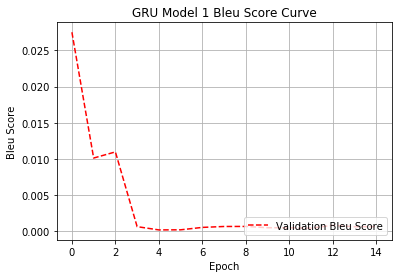

In [7]:
# trains the GRU model
model = bGRU(cfg).to(computing_device)
optimizer = optim.Adam(model.parameters(), cfg['learning_rate'])
criterion = nn.CrossEntropyLoss()

train_loss, valid_loss, valid_bleu = train(model, "GRU" + model_number, criterion, optimizer, computing_device, 
                                           x_train, y_train, x_valid, y_valid, cfg)

process_results("GRU Model " + model_number, train_loss, valid_loss, valid_bleu)

predicted_reviews = generate(model, x_train, cfg)
#print (predicted_reviews)

In [8]:
cfg

{'valid_char': "abcdefghijklmnopqrstuvwxyz0123456789!$'()*,-.:;? ",
 'valid_char_len': 49,
 'num_data': 5000,
 'input_dim': 131,
 'hidden_dim': 32,
 'output_dim': 52,
 'layers': 1,
 'train_percentage': 0.8,
 'epochs': 15,
 'batch_size': 32,
 'learning_rate': 0.01,
 'early_stop': 3,
 'gen_temp': 0.5,
 'max_len': 1000,
 'cuda': False,
 'bidirectional': False,
 'L2_penalty': 0,
 'train': True,
 'dropout': 0}

In [ ]:
'''
train(model, X_train, y_train, X_valid, y_valid, cfg) # Train the model
outputs = generate(model, X_test, cfg) # Generate the outputs for test data
save_to_file(outputs, out_fname) # Save the generated outputs to a file
'''